<a href="https://colab.research.google.com/github/kuzovkov/neural-university/blob/main/%D0%9F%D1%80%D0%BE%D0%B4%D0%B2%D0%B8%D0%BD%D1%83%D1%82%D1%8B%D0%B9_%D0%B1%D0%BB%D0%BE%D0%BA_%7C_%D0%93%D0%B5%D0%BD%D0%B5%D1%80%D0%B0%D1%82%D0%B8%D0%B2%D0%BD%D0%BE_%D1%81%D0%BE%D1%81%D1%82%D1%8F%D0%B7%D0%B0%D1%82%D0%B5%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D1%81%D0%B5%D1%82%D0%B8_(%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D0%BA%D0%B0_1)_%7C_%D0%A3%D0%98%D0%98.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Содержание темы**

1. [Теория](https://colab.research.google.com/drive/1xt0WGrjMN_td_JidPfea-5C-411y_TJG?usp=sharing)

2. Практика 1

3. [Практика 2](https://colab.research.google.com/drive/1_Ww5DyQ2LU8BHWKq8txtwJ1cEN9sWmef?usp=sharing)



## Генерация рукописных цифр MNIST

In [ ]:
# Загрузка библиотек

# Базовые слои keras
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout

from tensorflow.keras.layers import BatchNormalization, Activation, MaxPooling2D, concatenate, Embedding, multiply, Conv2DTranspose, Concatenate

# Активационная функция
from tensorflow.keras.layers import LeakyReLU

# Светочные слои keras
from tensorflow.keras.layers import UpSampling2D, Conv2D

# Формат модели keras
from tensorflow.keras.models import Sequential, Model

# Утилиты
from tensorflow.keras.utils import plot_model

# Оптимизатор
from tensorflow.keras.optimizers.legacy import Adam

# модуль с датасетами
from tensorflow.keras.datasets import mnist, cifar10, fashion_mnist

# Библиотека для отрисовки графиков
import matplotlib.pyplot as plt

import sys
import random
# Numpy массивы
import numpy as np

# модуль для отрисовки изображения
from PIL import Image

Так как для генерации нужны только оригинальные картинки, мы загружаем только базу картинок, остальные данные для GAN не нужны

In [ ]:
# Загружаем в X_train изображения рукописных цифр из mnist
(x_train, _), (_, _) = mnist.load_data()

# Выводим размерность
print(x_train.shape)

# Нормализуем изображение от [-1,1]
x_train = x_train / 127.5 - 1.

# Добавляем размерность для x_train ((28,28) => (28,28,1))
x_train = np.expand_dims(x_train, axis=3)

# Выводим размерность
print(x_train.shape)

11501568/11490434 [==============================] - 0s 0us/step
(60000, 28, 28)
(60000, 28, 28, 1)


In [ ]:
# Определяем параметры

img_hieght = 28 # высота изображения
img_width = 28  # ширина изображения
channels = 1    # канал 1 (картинка черно белая)
img_shape = (img_hieght, img_width, channels)

random_vec = 100   # Задаем размер N-мерного вектора
dropout_rait = 0.1 # Задаем размер Dropout
batch_size = 128

Создаем вектор со случайным распределением размерностью `(1, random_vec)`, его мы будем подавать на вход генератора:

In [ ]:
noise = np.random.normal(size=(1,random_vec))

Посмотрим как выглядит наш вектор:

In [ ]:
plt.figure(figsize=(10,5))     # задаем размер фигуры
plt.imshow(noise, cmap='gray') # параметры вывода картинки
plt.axis('off')                # отключаем оси
plt.show()                     # выводим изображение

## Генератор

Как мы помним из теории, это обычная нейронная сеть (может быть простой, из полносвязных слоев или сверточной).

Для начала соберем самый простой генератор:

In [ ]:
# Функция генератора

def create_generator():

    noise = Input(shape= (random_vec,))             # Входной вектер (шум)

    x = Dense(256, activation='relu') (noise)       # Dense-слой
    x = BatchNormalization(momentum=0.8) (x)        # BatchNoramlization-слой
    x = Dense(512, activation='relu') (x)           # Dense-слой
    x = BatchNormalization(momentum=0.8) (x)        # BatchNoramlization-слой
    x = Dense(1024, activation='relu') (x)          # Dense-слой
    x = BatchNormalization(momentum=0.8) (x)        # BatchNoramlization-слой

    # Dense-слой с количеством нейронов, равным произведению ширины на высоту на количество каналов генерируемого изображения
    x = Dense(np.prod(img_shape), activation='tanh') (x)

    # Reshape-слой для преобразования к размеру картинки
    x = Reshape(img_shape) (x)

    generator = Model (noise, x)

    return generator

**Обратите внимание!**


*   Генератор обучается только в паре с дискриминатором в составе комплксного алгоритма GAN, поэтому у него нет своего оптимизатора
*   Обращайте внимания на данные с которыми вы работаете, от них зависит какую активационную ф-ю надо выбрать. В нашем случае мы нормализовали входные данные от -1 до 1 пэтому логично использовать в качестве активационной ф-ции **tanh** или к примеру **Linear**

Создаем генератор и смотрим его параметры:

In [ ]:
# создаем генератор
generator = create_generator()

# выводим информацию о нем
generator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense (Dense)               (None, 256)               25856     
                                                                 
 batch_normalization (BatchN  (None, 256)              1024      
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 512)               131584    
                                                                 
 batch_normalization_1 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 1024)              525312

Посмотрим как работает наш необученный генератор:

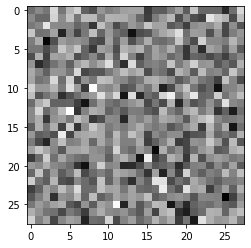

In [ ]:
predict_gen = generator.predict(noise)

plt.imshow(predict_gen[0].reshape(28, 28), cmap='gray')
plt.show()

В коде выше мы подали на вход генератора N-мерный выктор, в нашем случае длиной 100, а на выходе он сгенерировал нам изображение рамзером 28*28 пикселей.

## Дискриминатор

При создании дискриминатора помним, что его основная задача: сказать да или нет `(TRUE/FALSE)`, поэтому, по сути, это бинарная классификация. Значит в последнем слое должен быть один нейрон и функция активации `sigmoid`, а функция ошибки `binary_crossentropy`:

In [ ]:
def create_discriminator():

  # задаем входной размер картинки дискриминатора
  img = Input(shape=img_shape)

  # добавляем слои
  x = Flatten(input_shape=img_shape) (img)           # на вход дискриминатора подаем картинку и вытягиваем ее в вектор
  x = Dense(512, activation='relu') (x)
  x = Dropout(dropout_rait) (x)
  x = Dense(756, activation='relu') (x)
  x = Dropout(dropout_rait) (x)
  x = Dense(256, activation = 'relu') (x)
  x = Dropout(dropout_rait) (x)
  x = Dense(1, activation='sigmoid') (x)

  # собираем дискриминатор
  discriminator = Model(img, x)

  # компилируем
  discriminator.compile(loss='binary_crossentropy', optimizer = Adam(0.0002, 0.5), metrics=['accuracy'])

  discriminator.trainable = False # По умолчанию дискриминатор заморожен, т.е. его веса не будут меняться в процессе обучения

  return discriminator

In [ ]:
discriminator = create_discriminator()
discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense_4 (Dense)             (None, 512)               401920    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 756)               387828    
                                                                 
 dropout_1 (Dropout)         (None, 756)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               1937

Посмотрим как работает наш дискриминатор, подадим на его вход 10 изображений из набора Mnist и 10 сгенерированных с помощью генератора изображений

In [ ]:
print('Дискриминатор на изображениях MNIST: ')
for i in range(10):
  predict_dis = discriminator.predict(x_train[i][None, ...])
  print(predict_dis)
print('Дискриминатор на сгенерированных изображениях: ')
for i in range(10):
  noise = np.random.normal(size=(1,random_vec)) # Каждый раз на вход приходит новый вектор
  predict_gen = generator.predict(noise)
  predict_dis = discriminator.predict(predict_gen)
  print(predict_dis)

Дискриминатор на изображениях MNIST: 
[[0.39611727]]
[[0.48316616]]
[[0.3848266]]
[[0.41456008]]
[[0.39811563]]
[[0.41806534]]
[[0.39109802]]
[[0.42038724]]
[[0.41159365]]
[[0.4007971]]
Дискриминатор на сгенерированных изображениях: 
[[0.4707374]]
[[0.46697447]]
[[0.48308918]]
[[0.4956644]]
[[0.4866554]]
[[0.48709387]]
[[0.4954293]]
[[0.47146925]]
[[0.47326836]]
[[0.49540806]]


Как видим, необученный дискриминатор не может определить к какому классу отнести изображение, которое пришло ему на вход. По сути, любую картинку поданную ему на вход, он отнесет к любому из 2-х классов с вероятностью 50%.

## Вспомогательная функция для отображения прогресса обучения GAN

Создадим функцию, которую будем использовать для вывода результата работы генератора в процессе обучения модели.

Функция будет выводит полотно размером 5 на 5, в котором будут визуализироваться генерируемые цифры на текущую эпоху обучения

In [ ]:
def sample_images(epoch, gen):
    # Задание параметров полотна (ширина и высота)
    r, c = 5, 5

    # Генерация вектора-шума, который будет подаваться на вход генератору
    noise = np.random.normal(0, 1, (r * c, random_vec))

    # Генерация изображений
    gen_imgs = gen.predict(noise) # Предиктим картинку с помощью входной переменной gen

    # Вывод сгенерированных изображений
    fig, axs = plt.subplots(r, c, figsize = (r*2,c*2)) # Создаем окно вывода r на c (5 на 5) ячеек
    idx = 0 # Порядковый номер картинки
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[idx, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            idx += 1
    plt.show() # Рисуем сгенерированные изображения
    plt.close() # Завершаем работу с plt

## Состязательный алгоритм

Выше мы определили Генератор и Дискриминатор. Но для того что бы их обучить, нам потребуется сделать еще кое-что.

Объединить их в одном алгоритме и создать **GAN**

In [ ]:
batch_size = 128

def GAN_algoritm (generator, discriminator, epochs=30000, batch_size=128):
    # Создание массивов меток для дискриминатора
    true_labels = np.ones((batch_size, 1))
    generated_labels = np.zeros((batch_size, 1))

    # Создание полной модели GAN (включающую генератор и дискриминатор)
    noise = Input (shape=(random_vec,))
    generate_img = generator(noise)
    discr_result = discriminator(generate_img)

    GAN = Model(noise, discr_result) # Собираем модель GAN в которой обе модели G и D в входят как слои. На вход GAN подаем вектор, на выходе оценка вероятности
    GAN.compile(loss='binary_crossentropy', optimizer = Adam(0.0002, 0.5))

    view_interval = 150 # интервал через который будем смотреть что получается

    d_loss_list = [] # лист значений ошибки дискриминатора
    g_loss_list = [] # лист значений ошибки генератора
    d_acc_list = [] # лист значений ошибки точность модели

    for epoch in range(epochs):
        # Получение случайных изображений из набора MNIST
        imgs = np.array(random.choices(x_train, k=batch_size))

        # Генерация вектора-шума, который подается на вход генератора
        noise = np.random.normal(0, 1, (batch_size, random_vec)) # записываем в переменную noise вектора, длинной random_vec в количестве batch_size

        # Генерация изображения с помощью генератора
        gen_imgs = generator.predict(noise)

        # Обучение дискриминатора
        d_loss_real = discriminator.train_on_batch(imgs, true_labels)
        d_loss_gen = discriminator.train_on_batch(gen_imgs, generated_labels)

        d_loss = 0.5* np.add(d_loss_real,d_loss_gen)

        # Обучение генератора
        g_loss = GAN.train_on_batch(noise,true_labels)

        d_loss_list.append(d_loss[0])
        g_loss_list.append(g_loss)
        d_acc_list.append(100*d_loss[1])

        # Проверка эпох для вывода картинок
        if ((epoch % view_interval == 0) | (epoch == epochs-1)):
            sample_images(epoch, generator)
            print ('%d [D loss: %f, acc.: %.2f%%] [G loss: %f]' % (epoch, d_loss[0], 100*d_loss[1], g_loss)) # выводим номер эпохи и значения ошибок


    plt.plot(d_loss_list, label="Ошибка дискриминатора")
    plt.plot(g_loss_list, label="Ошибка генератора")
    plt.legend()
    plt.show()
    plt.plot(d_acc_list, label="Точность распознавания дискриминатора")
    plt.legend()
    plt.show()

Давайте разберём по порядку, что делает эта функция:

        def GAN_algoritm (generator, discriminator, epochs=30000, batch_size=128)
На вход функция получаем модель генератора (generator), дискриминатора (discriminator), количество эпох для обучения (epochs) и размер batch_size

        # Создание массивов меток для дискриминатора
        true_labels = np.ones((batch_size, 1))
        generated_labels = np.zeros((batch_size, 1))

Модель дискриминатора - это модель бинарной классификации. Для ее обучения мы будем использовать реальные изображения (1 класс, метки единицы - true_labels) и изображения, которые создает генератор на текущем шаге обучения (0 класс, метки нули - generated_labels)

        # Создание полной модели GAN (включающую генератор и дискриминатор)
        noise = Input (shape=(random_vec,))
        generate_img = generator(noise)
        discr_result = discriminator(generate_img)

        GAN = Model(nose, discr_result)
        GAN.compile(loss='binary_crossentropy', optimizer = Adam(0.0002, 0.5))

Теперь мы создаем полноценную модель GAN, которая включает и генератор и дискриминатор (напоминаем, что дискриминатор обучается отдельно, независимо ни от кого. Затем его веса замораживаются и обучается генератор (в рамках всей модели GAN)

В переменную `discr_result` записываетя результат работы дискриминатора (вероятность того, что изображение, поступившее на вход является реальной цифрой)

**Обратине внимание**! В модели GAN generator и discriminator используются, так же как стандартные слои в моделях keras

        # Обучение дискриминатора
        d_loss_real = discriminator.train_on_batch(imgs, true_labels)
        d_loss_gen = discriminator.train_on_batch(gen_imgs, generated_labels)

Как отмечалось выше, дискриминатор обучается отдельно и независимо от других частей. Для этих целей мы воспользуемся функцией `train_on_batch`. Вначале обучаем дискриминатор на реальных изображениях, указывая в качестве правильных ответов матрицу единиц (true_labels). Затем дискриминатор обучается на фейковых (сгенерированных) изображениях (правильные ответы - generated_labels). В результате наш дискриминатор учиться отличать настоящие цифры от сгенерированных

        # Обучение генератора
        g_loss = GAN.train_on_batch(noise,true_labels)

Генератор обучается внутри комбинированной нейросети GAN. Как мы помним Градиентный спуск обычно применяется ко всем слоям входящим в модель. Но, так как при создании Дискриминатора мы заморозили его веса, то в процессе работы GAN его веса не будут обновляться. Оптимизированы будут только веса Генератора. Веса Дискриминатора могут быть обновлены (т.е. D может быть обучен) только при вызове процедуры train_on_batch непосредственно для Дискриминатора (как мы делали выше)

На вход модель GAN принимает вектор-шума (noise), из ветора мы получаем сгенерированное изображение, которое затем подается на вход дискриминатора и мы получаем вероятность того, что картинка настоящая. В качестве верных ответов, мы подаем матрицу единиц (true_labels). Это означает, что наша модель GAN будет обучаться таким образом, чтобы генерируемые изображения были максимально похожи на настоящие.


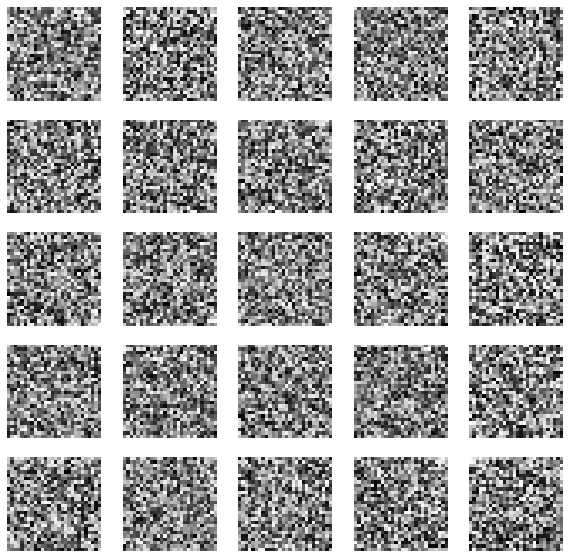

0 [D loss: 0.037063, acc.: 100.00%] [G loss: 3.442299]


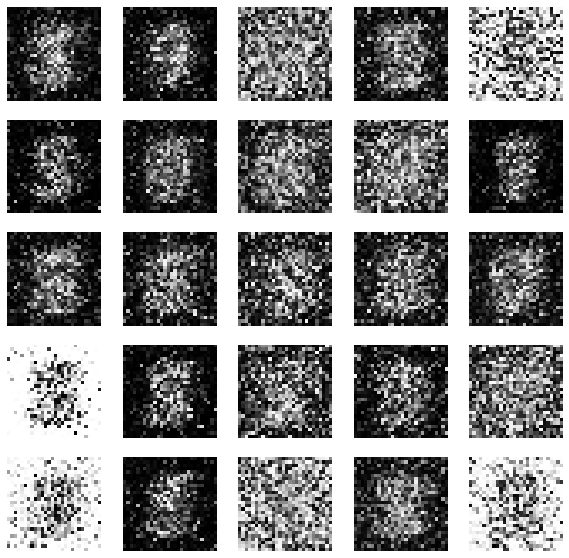

150 [D loss: 0.544234, acc.: 75.00%] [G loss: 4.158455]


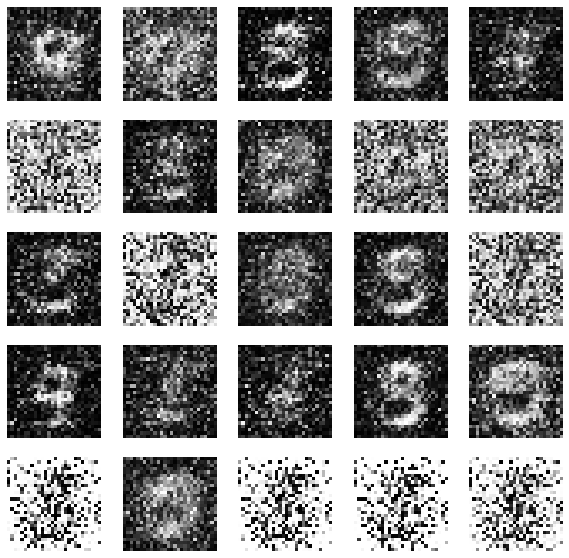

300 [D loss: 0.506662, acc.: 72.27%] [G loss: 4.652675]


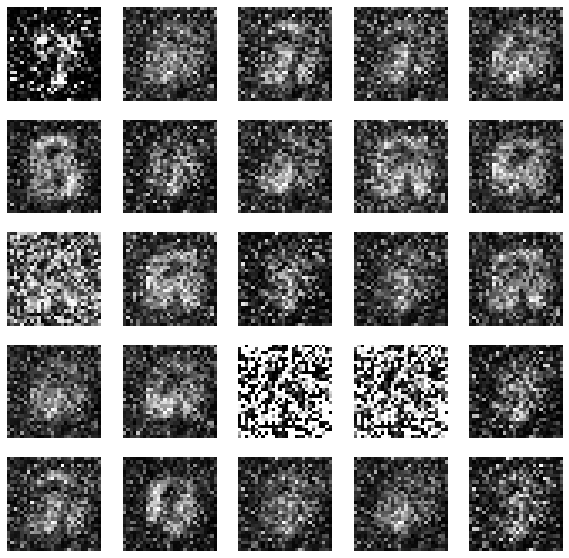

450 [D loss: 0.328931, acc.: 85.16%] [G loss: 4.639913]


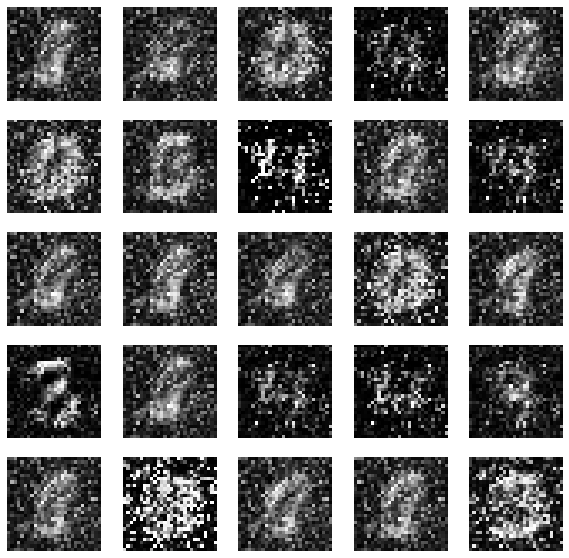

600 [D loss: 0.248908, acc.: 90.62%] [G loss: 3.810823]


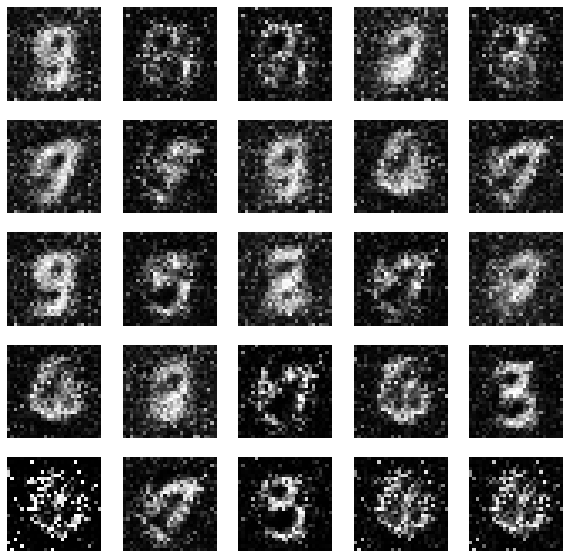

750 [D loss: 0.573685, acc.: 72.27%] [G loss: 1.726044]


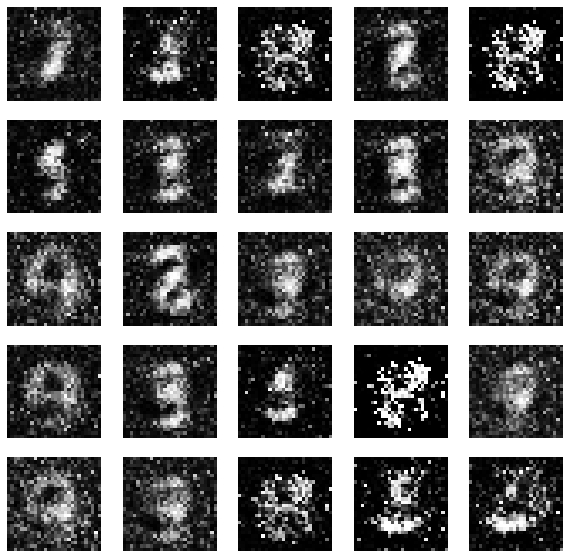

900 [D loss: 0.439463, acc.: 83.98%] [G loss: 2.236067]


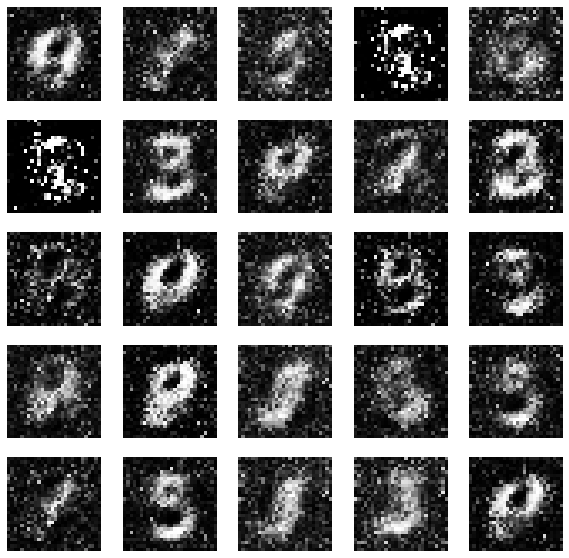

999 [D loss: 0.471916, acc.: 75.78%] [G loss: 2.167505]


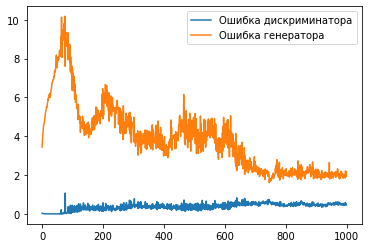

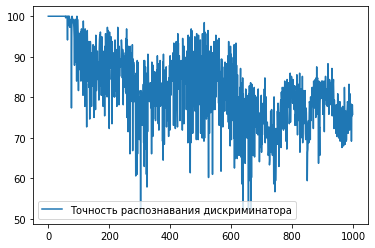

In [ ]:
# Запускаем функцию GAN с параметрами, generator, discriminator (1000 - количество эпох)
GAN_algoritm (generator, discriminator, 1000, batch_size=128)

Результат есть! Но пока генерируемые изображения сильно зашумлены.

Давайте попробуем увеличить количество эпох до 30тысяч:

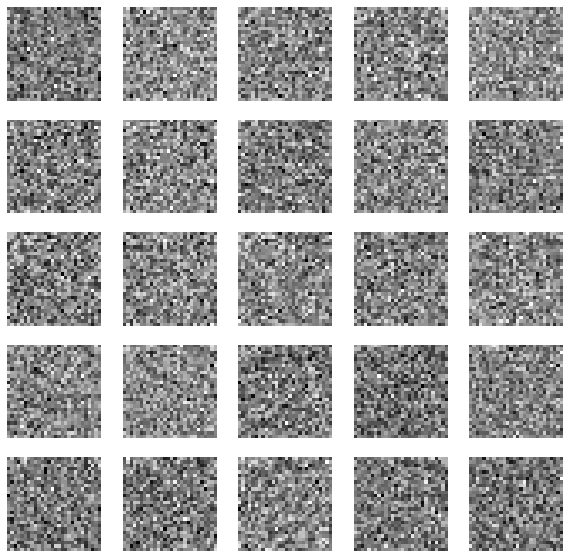

0 [D loss: 0.645736, acc.: 49.22%] [G loss: 0.300644]


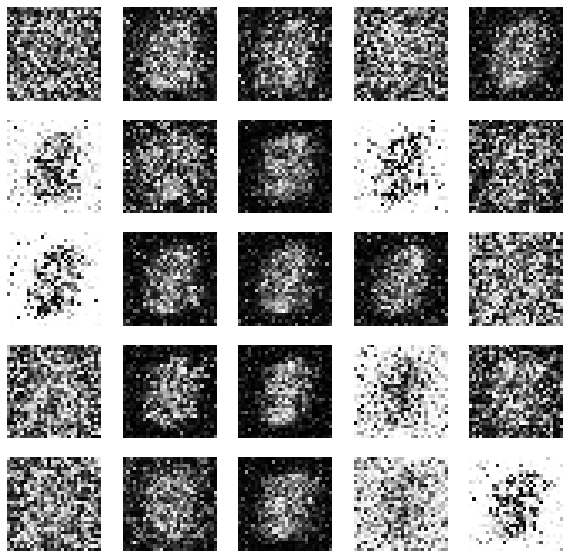

150 [D loss: 0.380360, acc.: 80.47%] [G loss: 3.599115]


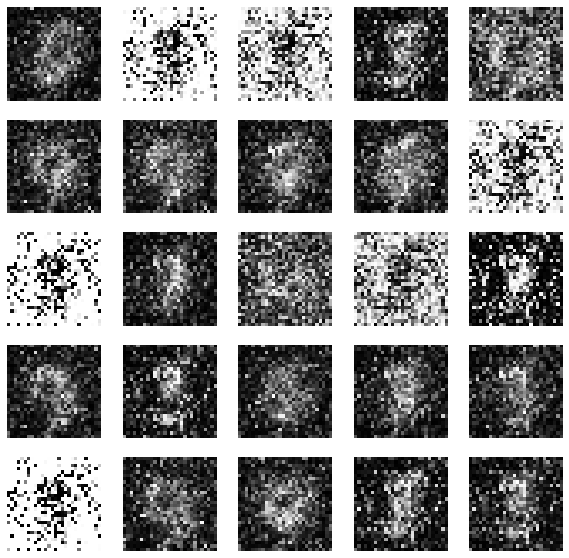

300 [D loss: 0.292891, acc.: 87.11%] [G loss: 4.340152]


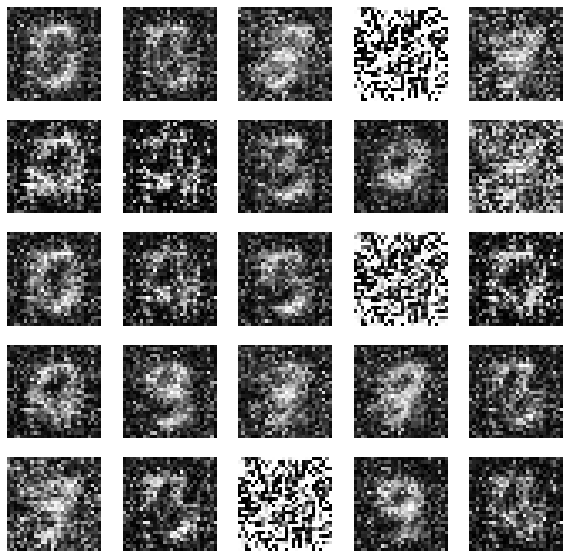

450 [D loss: 0.217394, acc.: 92.97%] [G loss: 3.910234]


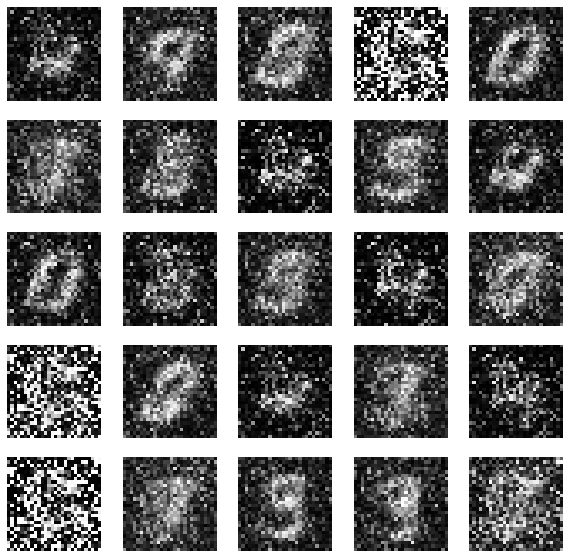

600 [D loss: 0.270403, acc.: 90.23%] [G loss: 4.209513]


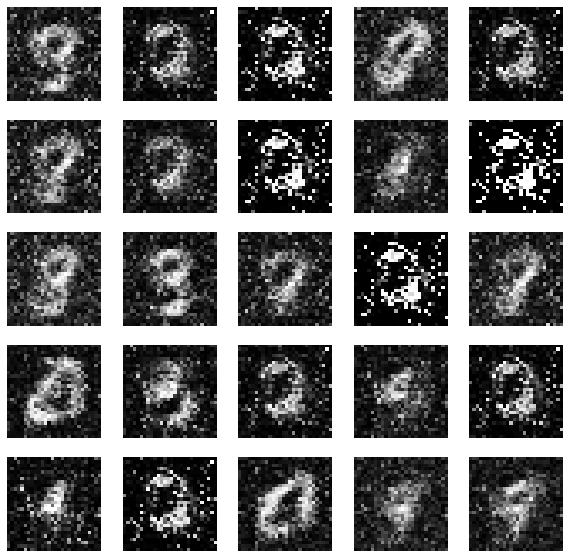

750 [D loss: 0.402895, acc.: 82.81%] [G loss: 3.272252]


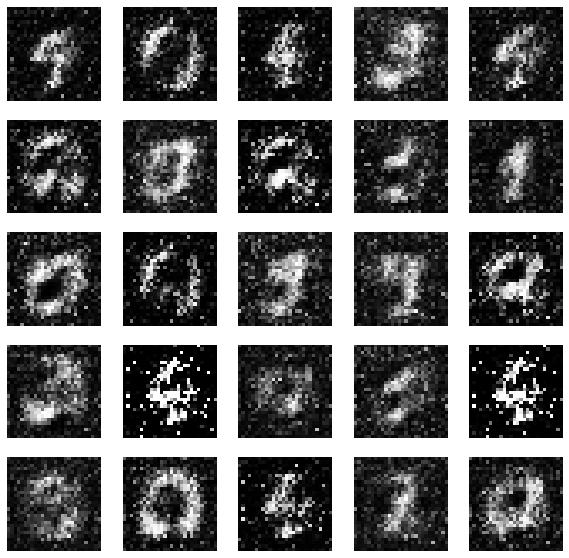

900 [D loss: 0.412847, acc.: 83.59%] [G loss: 2.308349]


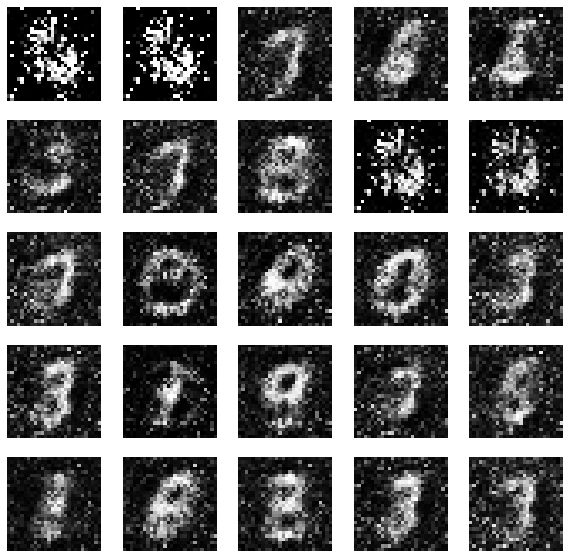

1050 [D loss: 0.399978, acc.: 83.98%] [G loss: 2.188461]


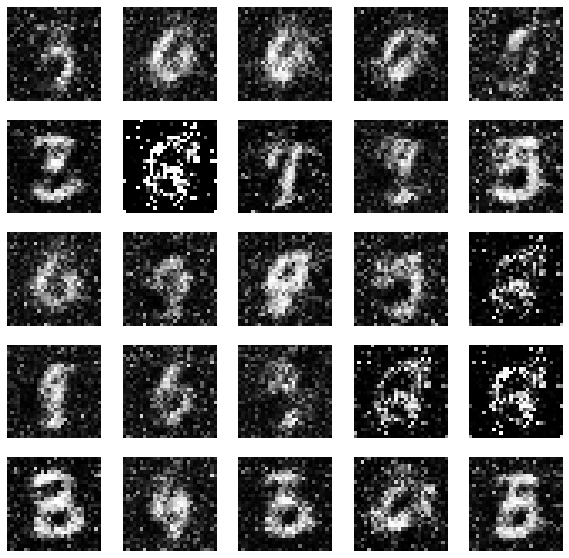

1200 [D loss: 0.465957, acc.: 78.91%] [G loss: 2.123005]


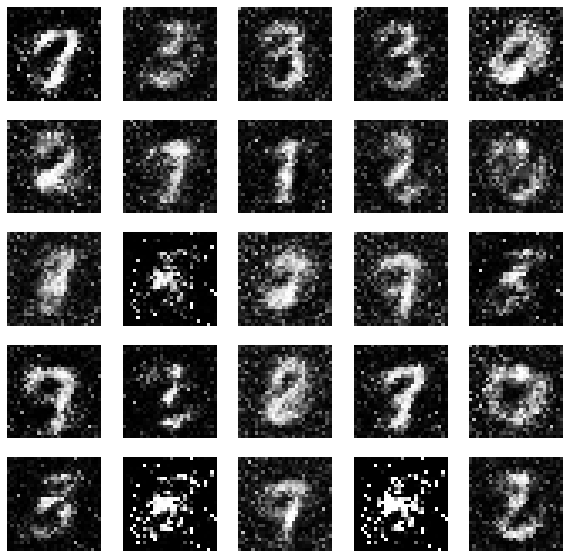

1350 [D loss: 0.410130, acc.: 80.86%] [G loss: 1.944692]


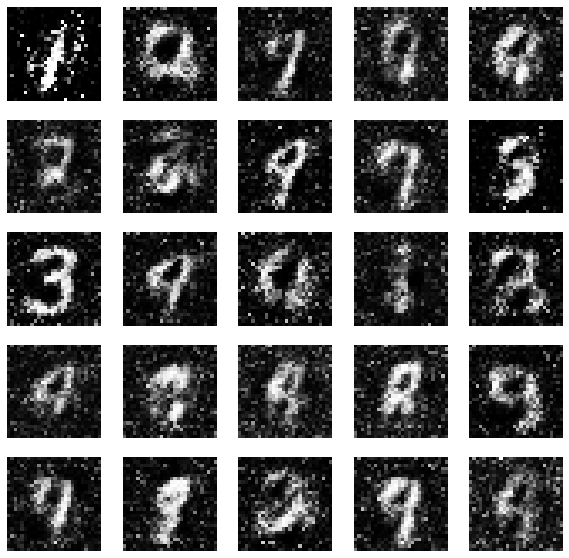

1500 [D loss: 0.537421, acc.: 71.09%] [G loss: 2.136284]


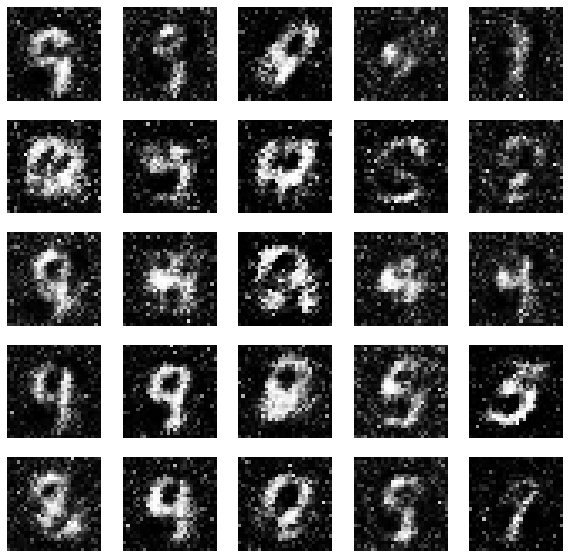

1650 [D loss: 0.452662, acc.: 78.91%] [G loss: 1.884563]


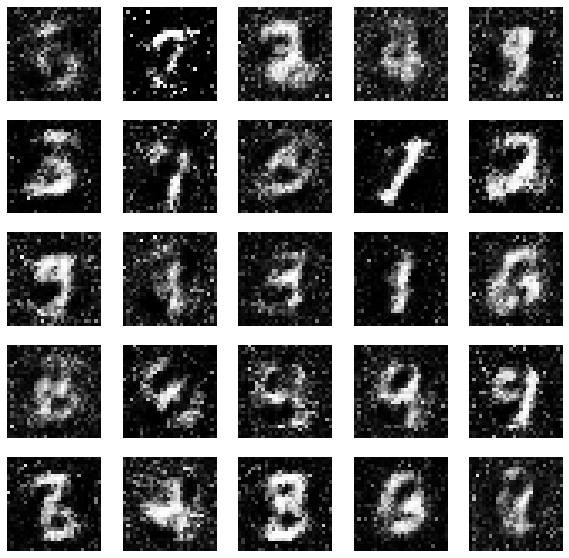

1800 [D loss: 0.508701, acc.: 75.00%] [G loss: 1.773095]


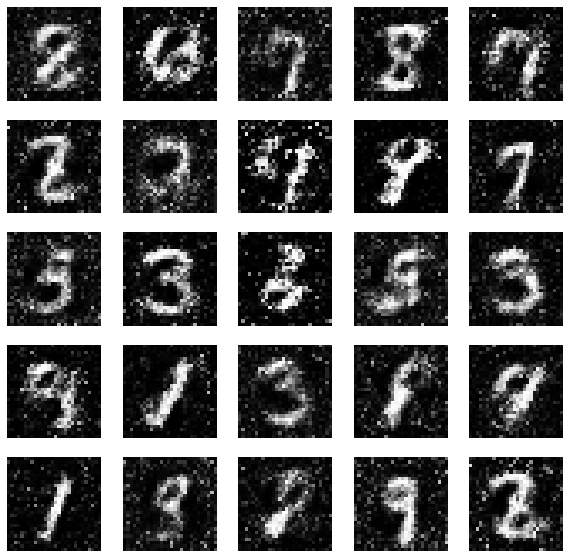

1950 [D loss: 0.460077, acc.: 77.73%] [G loss: 1.852644]


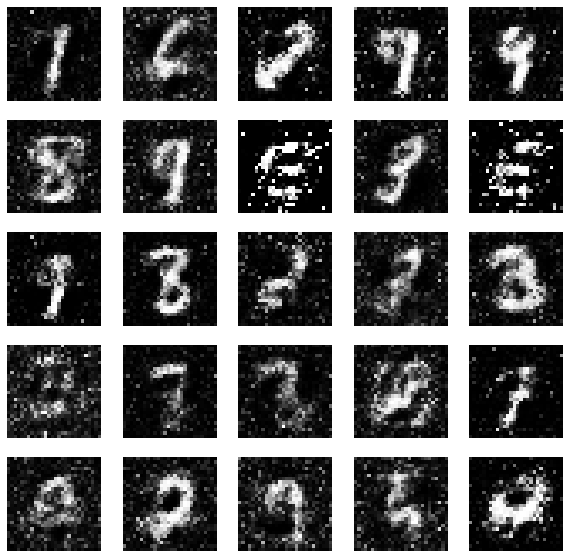

2100 [D loss: 0.492265, acc.: 75.39%] [G loss: 1.522819]


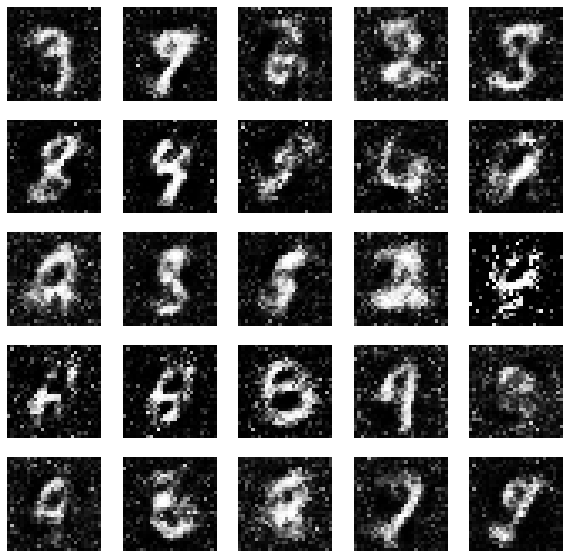

2250 [D loss: 0.570822, acc.: 72.66%] [G loss: 1.458670]


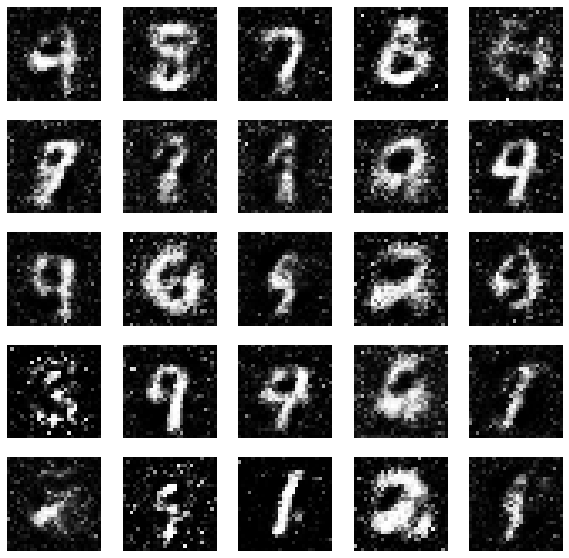

2400 [D loss: 0.541060, acc.: 71.48%] [G loss: 1.514089]


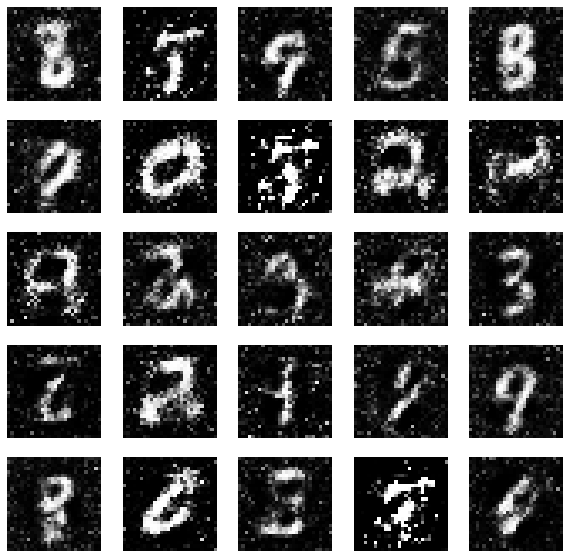

2550 [D loss: 0.577989, acc.: 70.31%] [G loss: 1.428504]


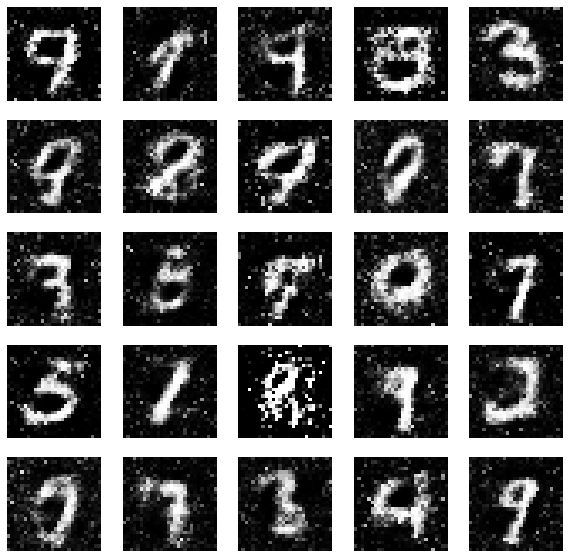

2700 [D loss: 0.549734, acc.: 69.53%] [G loss: 1.399301]


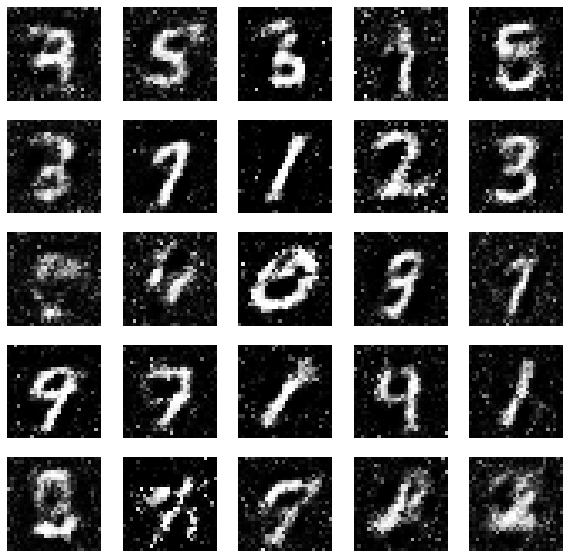

2850 [D loss: 0.522810, acc.: 73.83%] [G loss: 1.359468]


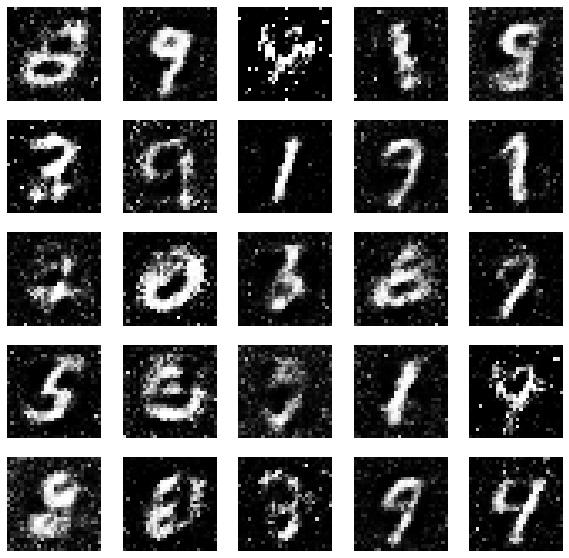

3000 [D loss: 0.544844, acc.: 68.36%] [G loss: 1.512994]


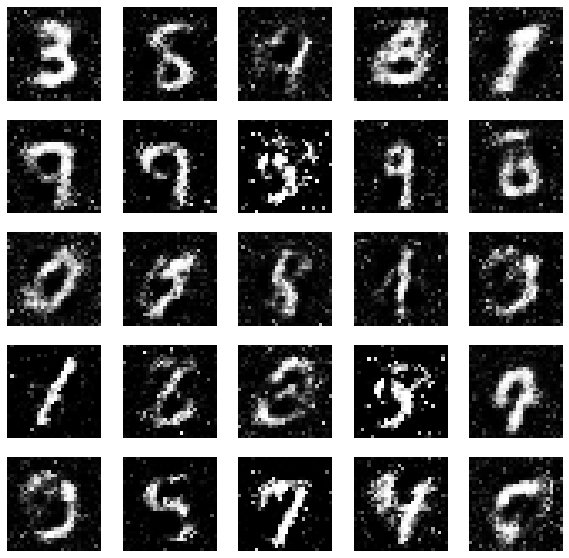

3150 [D loss: 0.602340, acc.: 66.80%] [G loss: 1.357499]


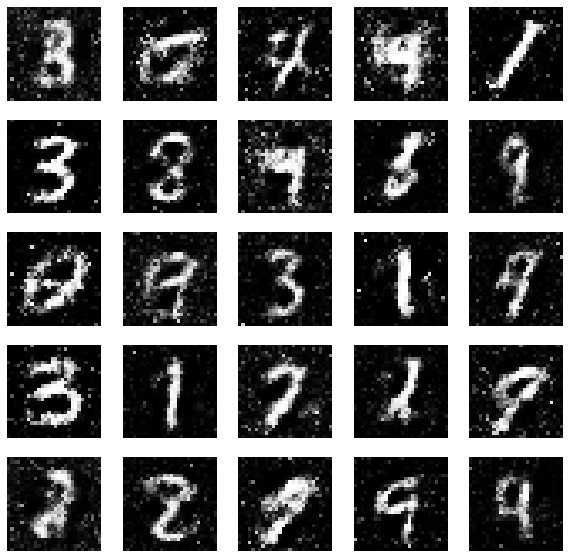

3300 [D loss: 0.600334, acc.: 66.80%] [G loss: 1.279610]


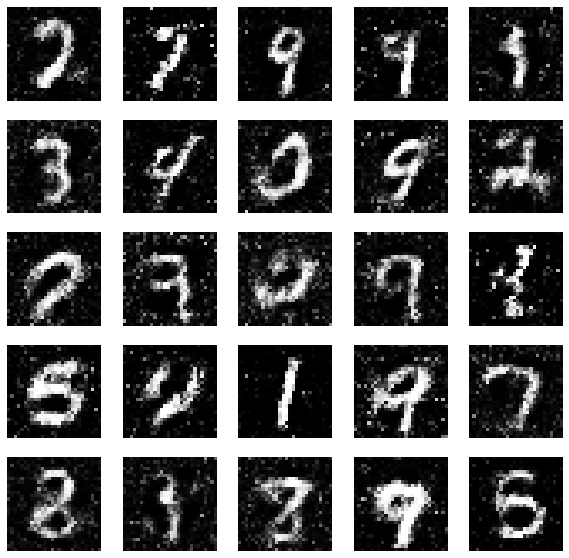

3450 [D loss: 0.580891, acc.: 67.19%] [G loss: 1.304395]


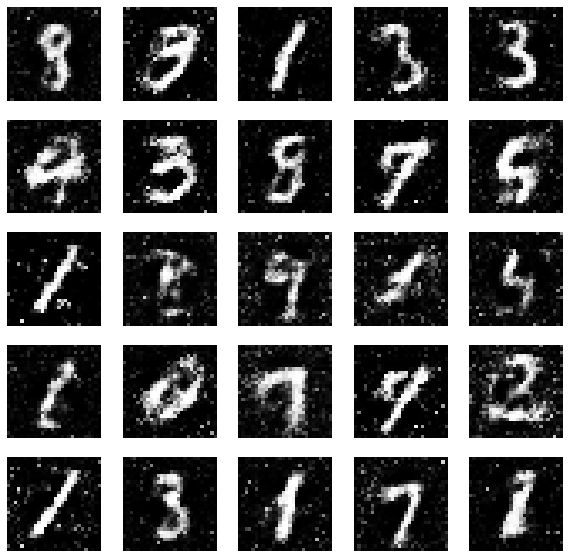

3600 [D loss: 0.511067, acc.: 73.44%] [G loss: 1.201411]


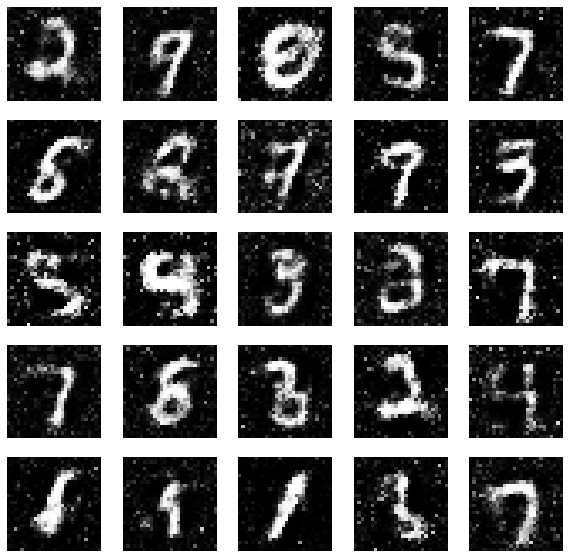

3750 [D loss: 0.564023, acc.: 69.92%] [G loss: 1.257183]


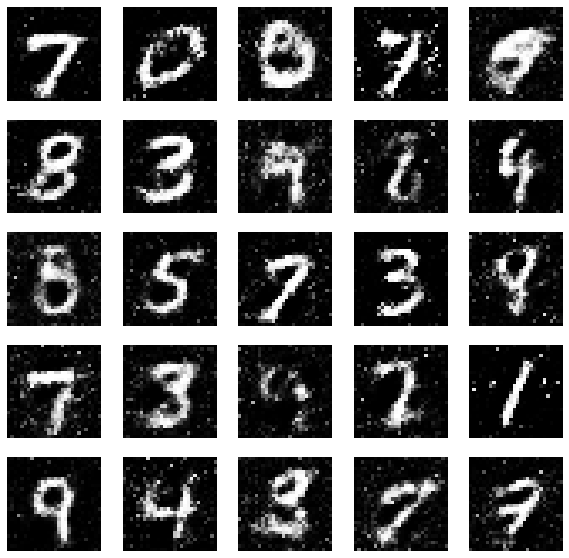

3900 [D loss: 0.543302, acc.: 69.53%] [G loss: 1.301711]


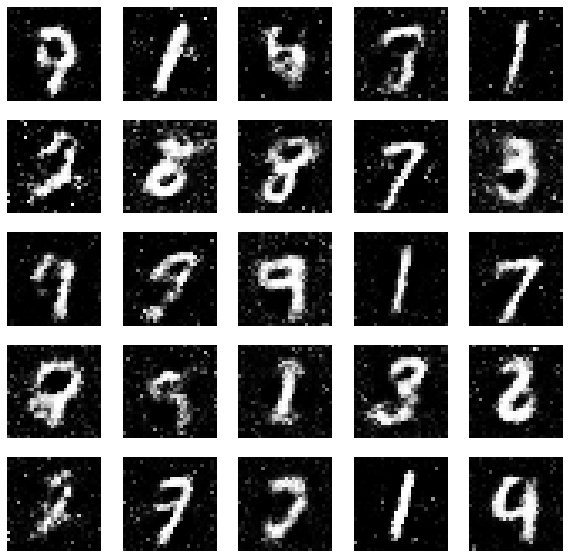

4050 [D loss: 0.609014, acc.: 65.23%] [G loss: 1.275715]


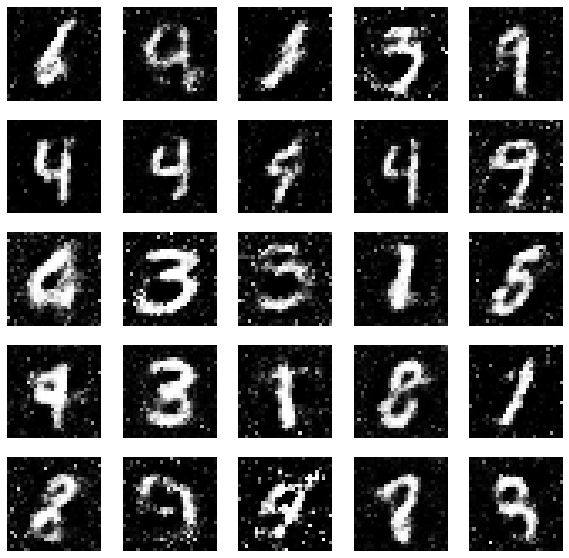

4200 [D loss: 0.574342, acc.: 69.14%] [G loss: 1.201304]


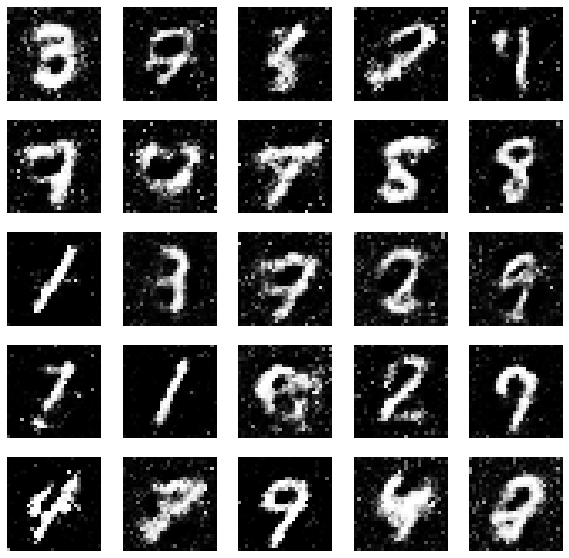

4350 [D loss: 0.606904, acc.: 64.45%] [G loss: 1.167868]


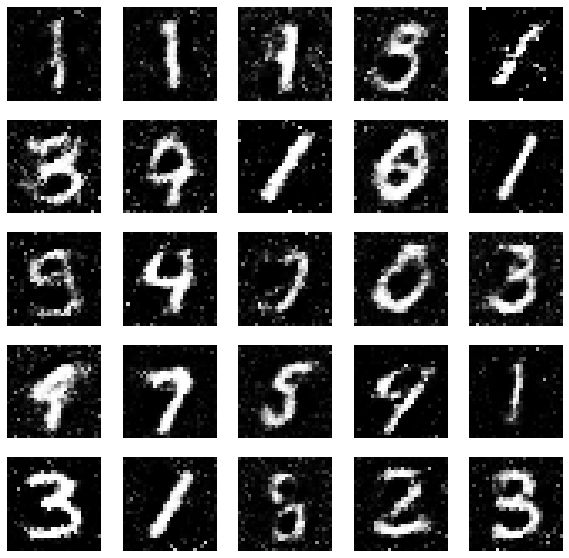

4500 [D loss: 0.551790, acc.: 71.48%] [G loss: 1.237493]


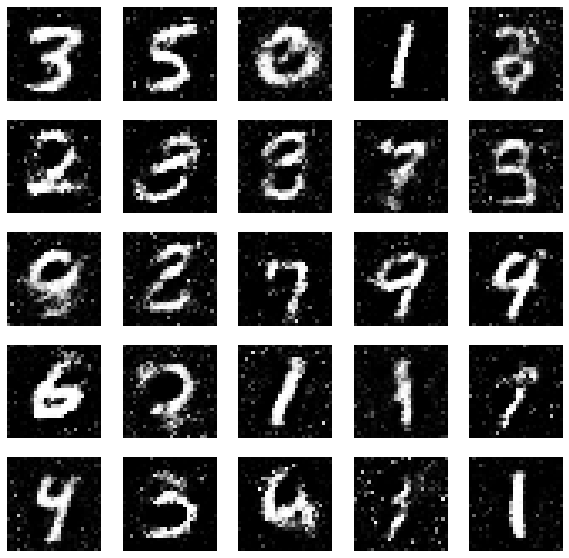

4650 [D loss: 0.606644, acc.: 64.84%] [G loss: 1.198567]


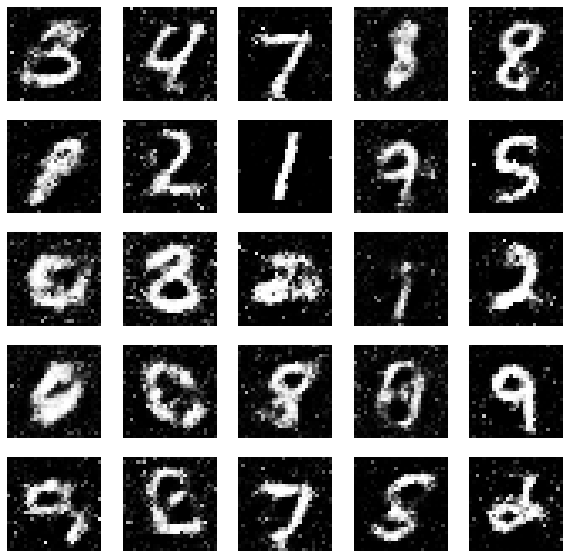

4800 [D loss: 0.568568, acc.: 69.53%] [G loss: 1.189742]


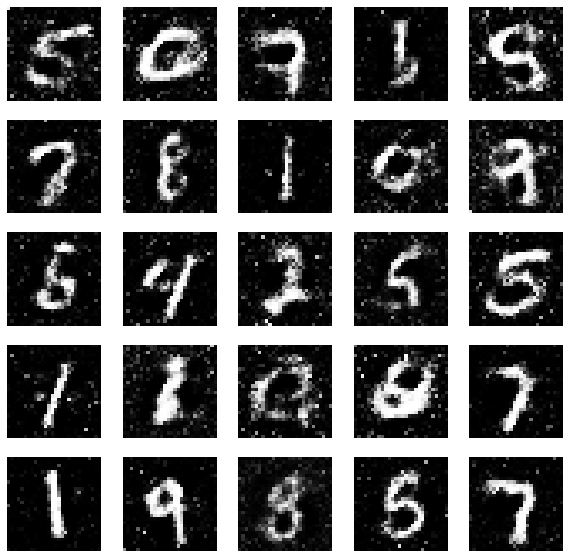

4950 [D loss: 0.551658, acc.: 68.36%] [G loss: 1.273935]


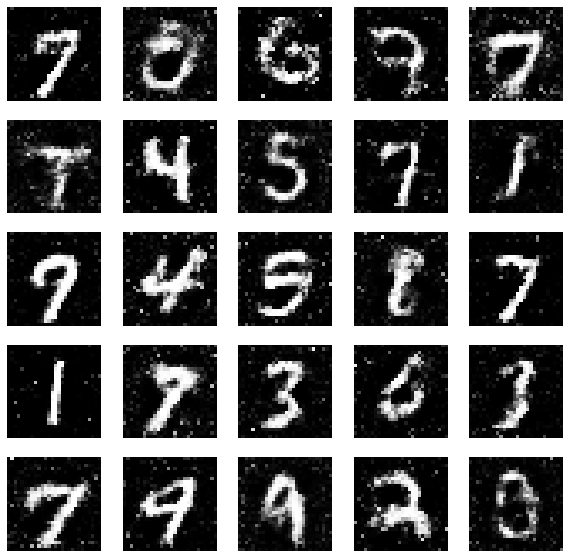

5100 [D loss: 0.563681, acc.: 71.48%] [G loss: 1.161235]


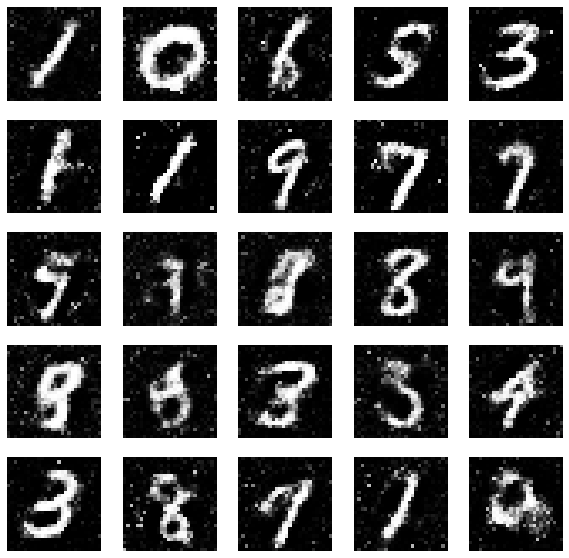

5250 [D loss: 0.557455, acc.: 67.19%] [G loss: 1.204355]


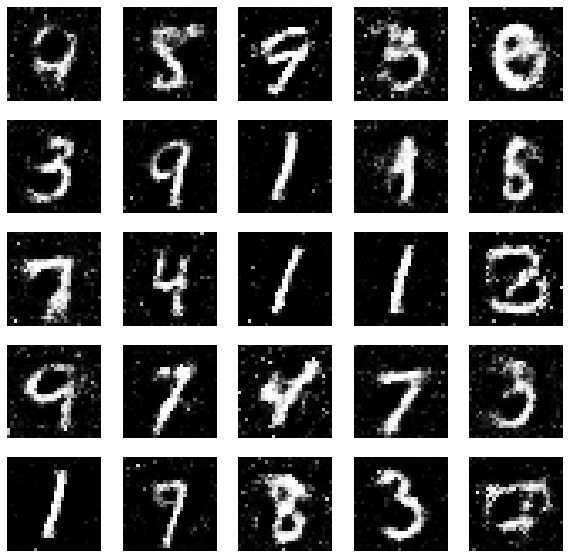

5400 [D loss: 0.578289, acc.: 67.58%] [G loss: 1.174922]


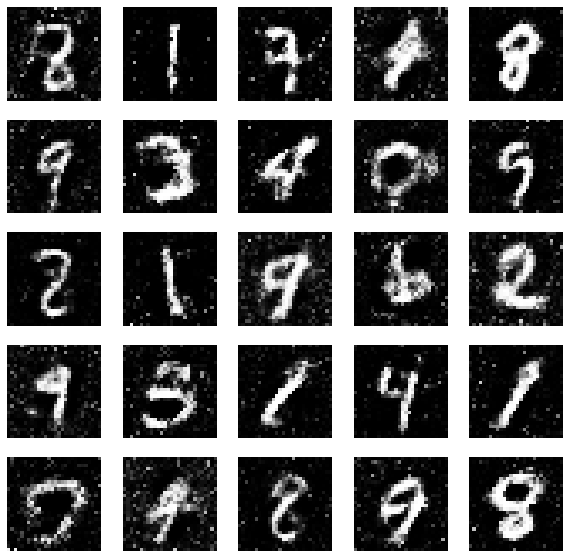

5550 [D loss: 0.579222, acc.: 66.41%] [G loss: 1.070318]


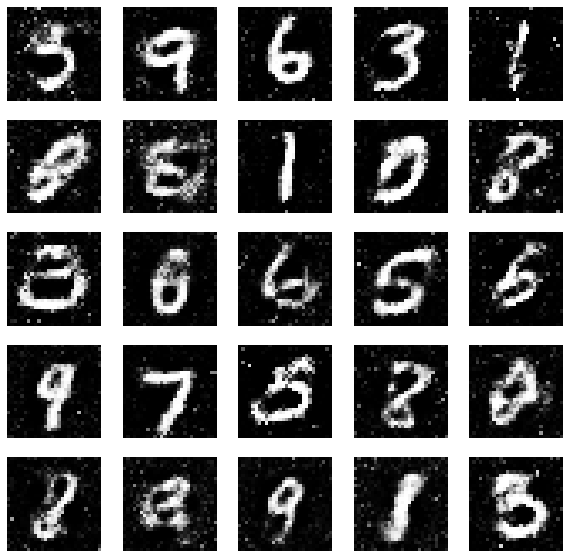

5700 [D loss: 0.646342, acc.: 61.72%] [G loss: 1.112432]


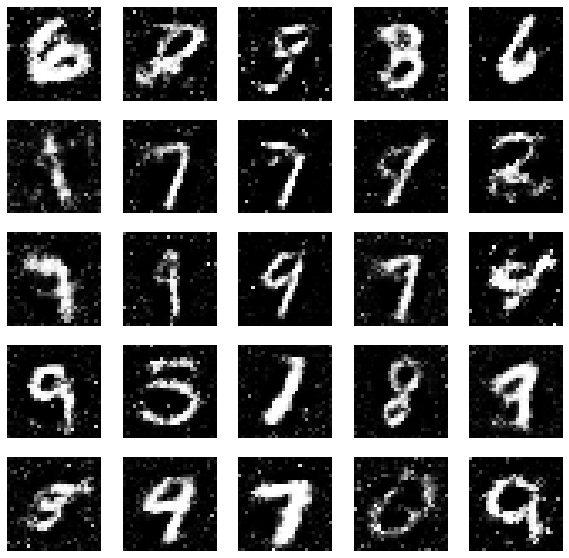

5850 [D loss: 0.621224, acc.: 66.80%] [G loss: 1.098914]


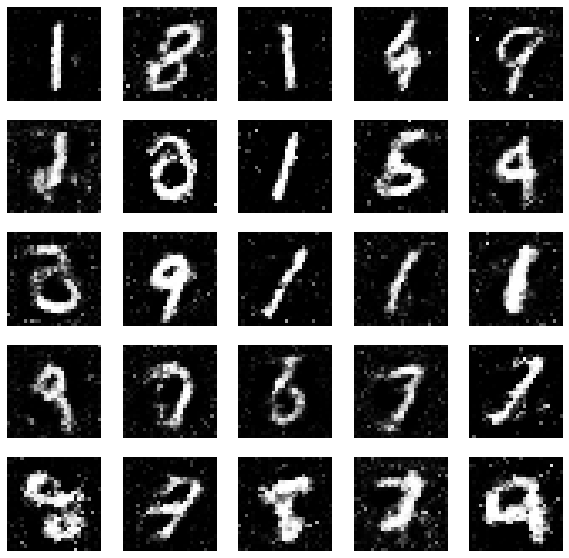

6000 [D loss: 0.591082, acc.: 66.80%] [G loss: 1.063989]


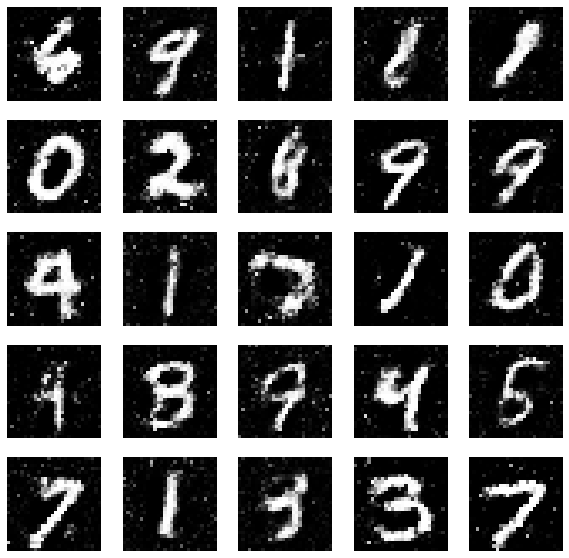

6150 [D loss: 0.566494, acc.: 69.92%] [G loss: 1.064093]


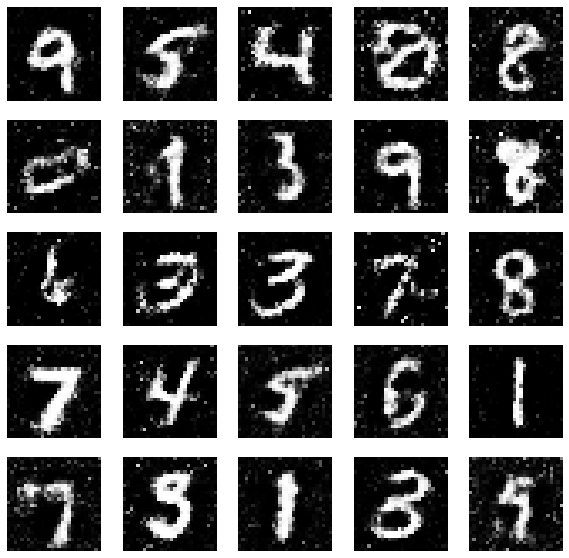

6300 [D loss: 0.557647, acc.: 71.09%] [G loss: 1.081295]


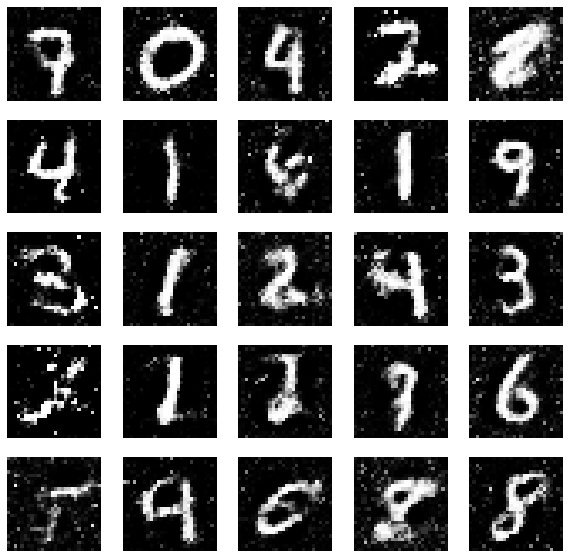

6450 [D loss: 0.587506, acc.: 67.19%] [G loss: 1.054316]


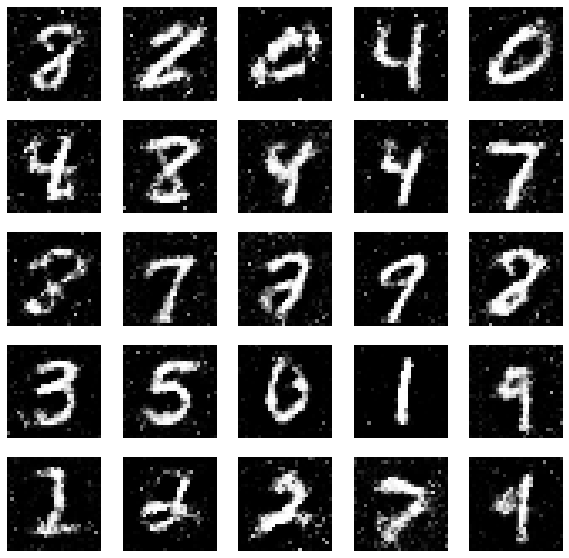

6600 [D loss: 0.616349, acc.: 66.41%] [G loss: 1.002721]


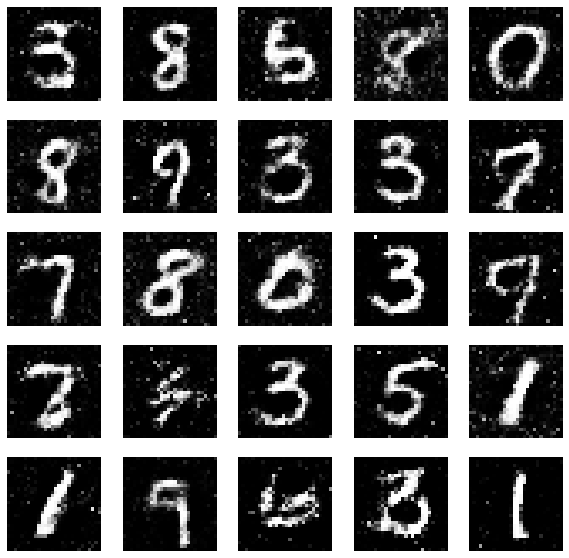

6750 [D loss: 0.607910, acc.: 67.58%] [G loss: 0.967730]


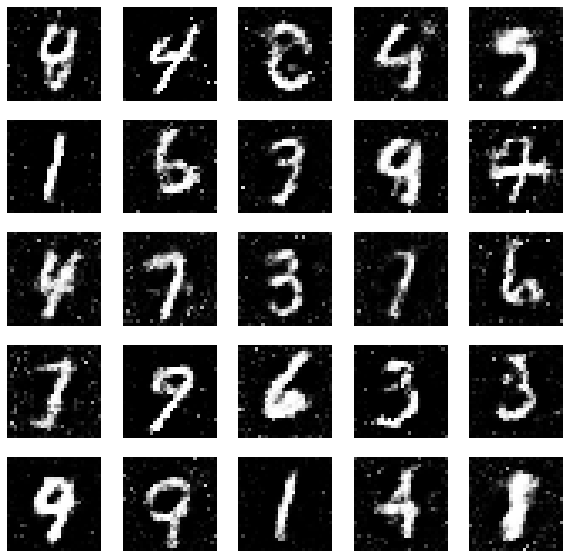

6900 [D loss: 0.612485, acc.: 66.41%] [G loss: 1.057861]


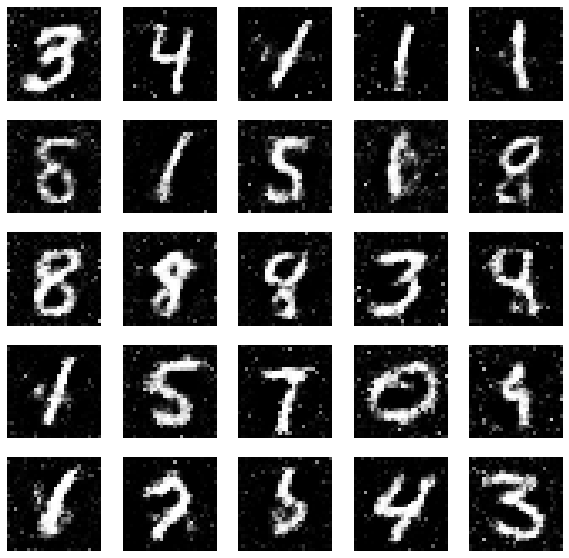

7050 [D loss: 0.637009, acc.: 62.11%] [G loss: 1.038689]


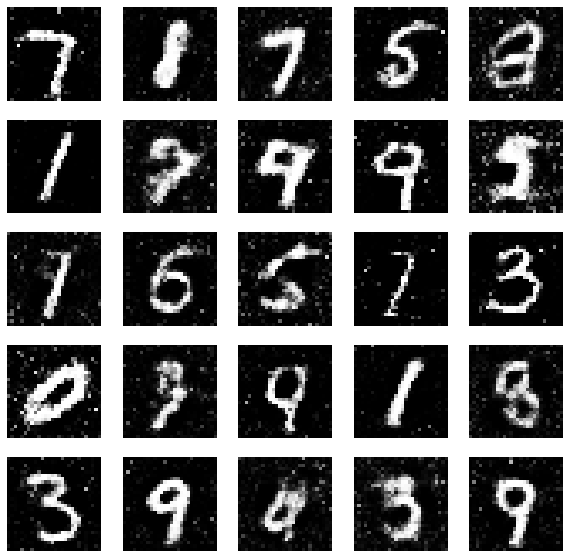

7200 [D loss: 0.595994, acc.: 68.75%] [G loss: 1.035174]


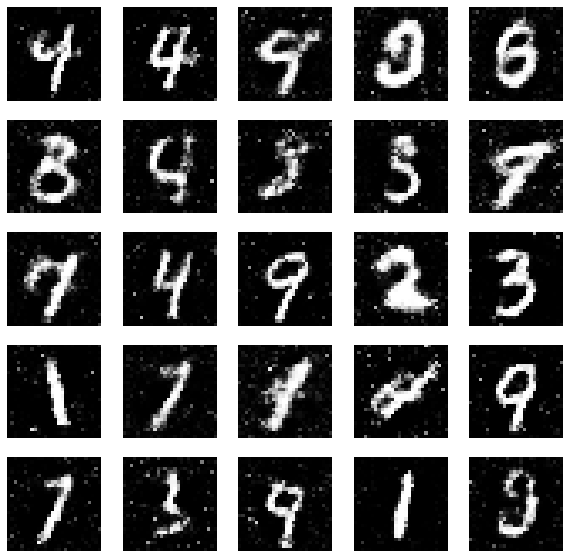

7350 [D loss: 0.630808, acc.: 62.50%] [G loss: 1.062064]


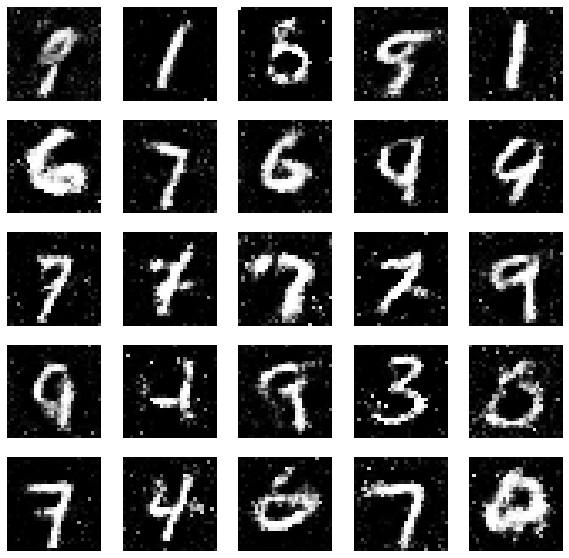

7500 [D loss: 0.593330, acc.: 69.92%] [G loss: 1.062270]


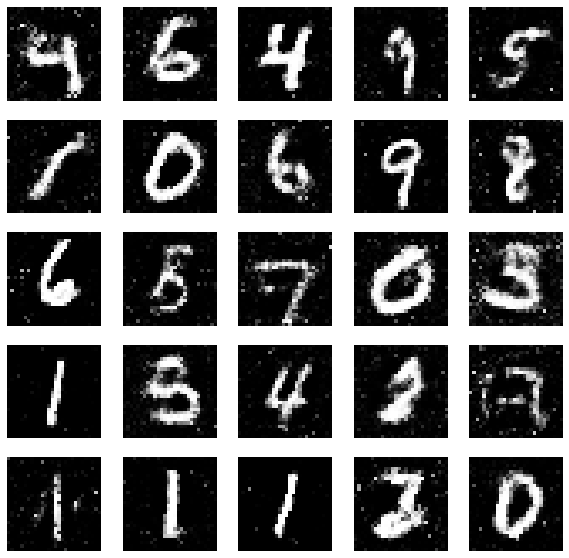

7650 [D loss: 0.638689, acc.: 62.11%] [G loss: 0.987037]


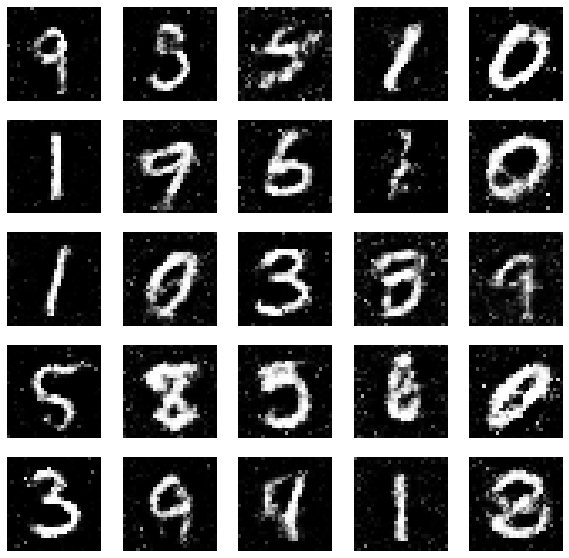

7800 [D loss: 0.640978, acc.: 65.23%] [G loss: 1.050456]


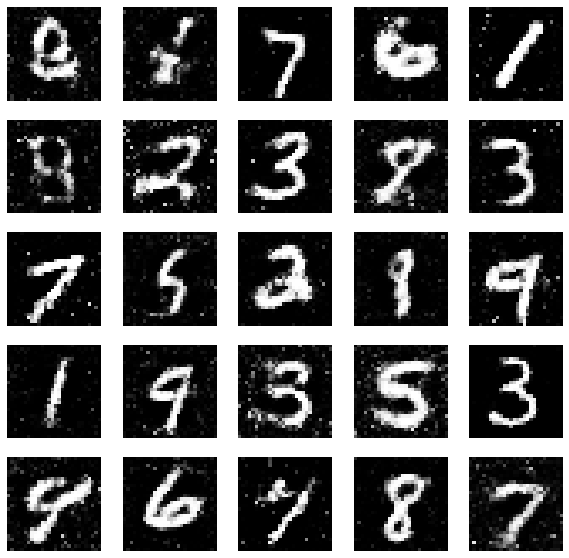

7950 [D loss: 0.607496, acc.: 64.84%] [G loss: 0.970227]


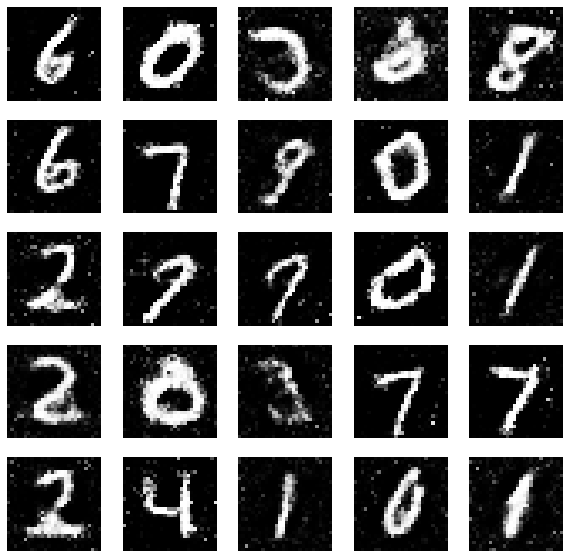

8100 [D loss: 0.631162, acc.: 62.89%] [G loss: 1.015402]


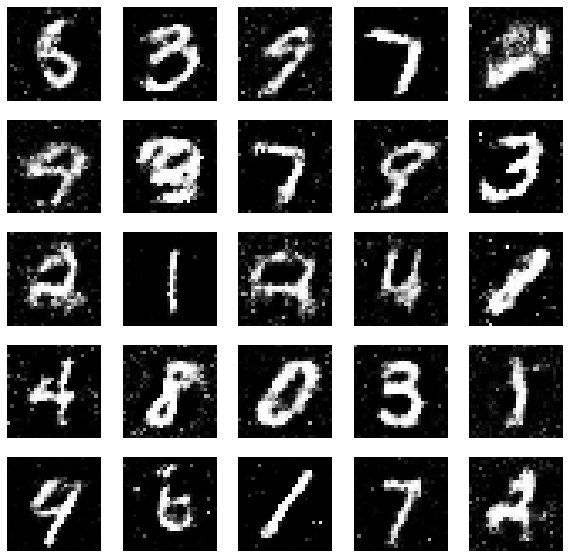

8250 [D loss: 0.570112, acc.: 66.41%] [G loss: 1.016713]


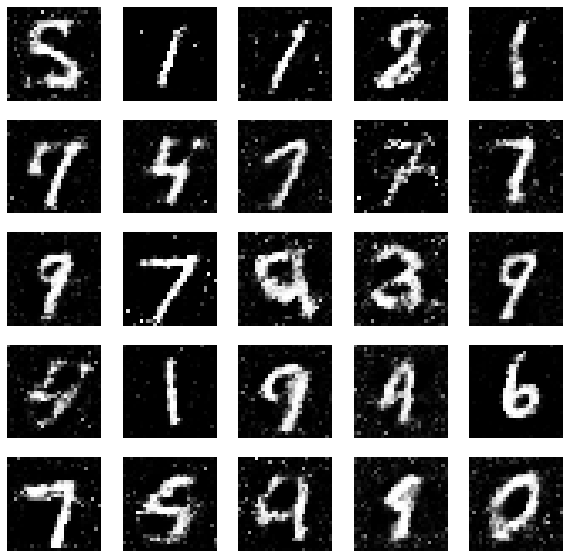

8400 [D loss: 0.637357, acc.: 59.77%] [G loss: 0.986387]


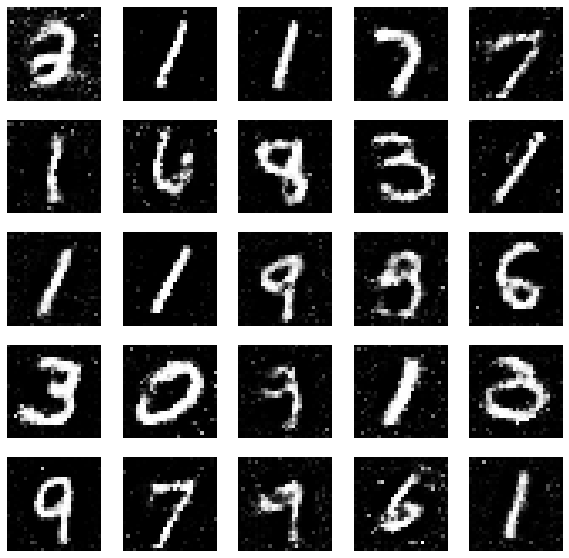

8550 [D loss: 0.654747, acc.: 61.72%] [G loss: 0.981341]


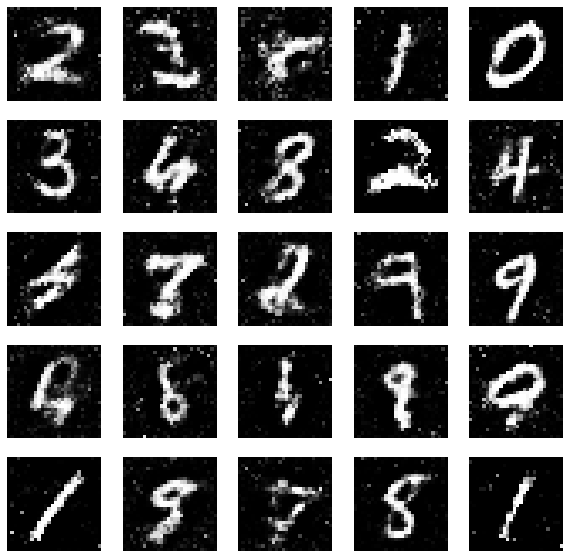

8700 [D loss: 0.629691, acc.: 61.33%] [G loss: 0.941196]


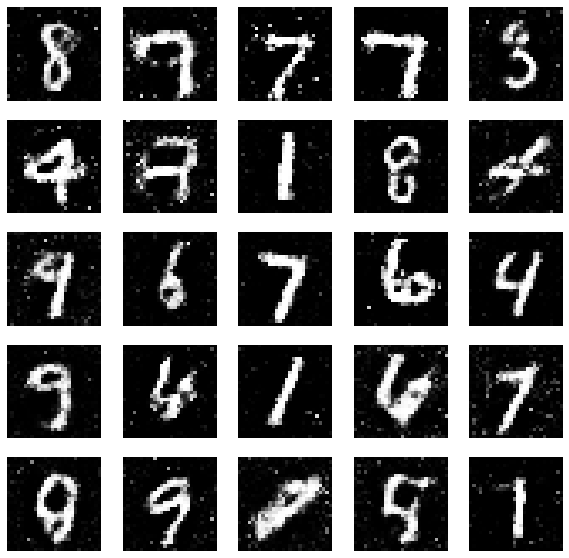

8850 [D loss: 0.574136, acc.: 68.75%] [G loss: 0.973307]


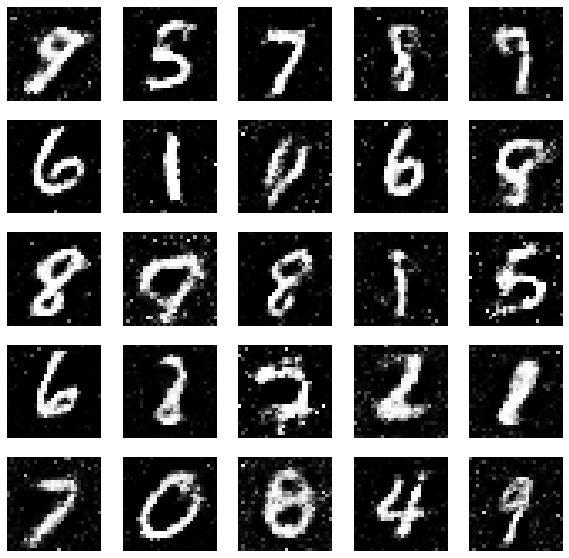

9000 [D loss: 0.646464, acc.: 62.11%] [G loss: 0.963254]


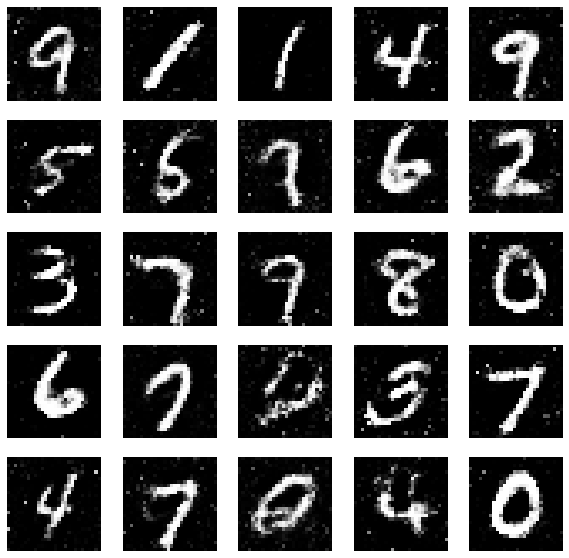

9150 [D loss: 0.640829, acc.: 60.94%] [G loss: 0.953994]


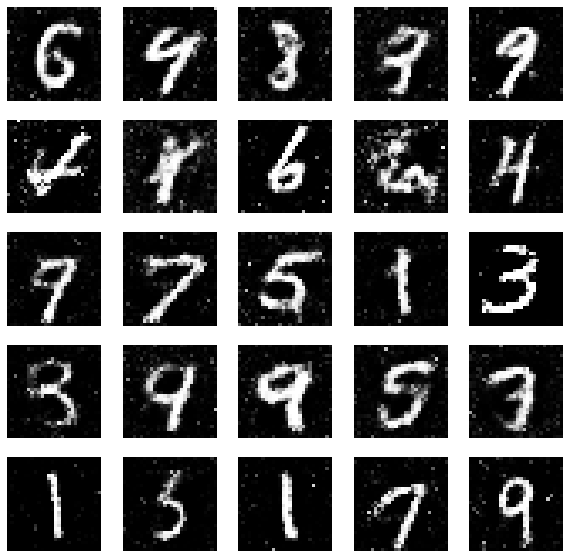

9300 [D loss: 0.623252, acc.: 64.45%] [G loss: 0.934499]


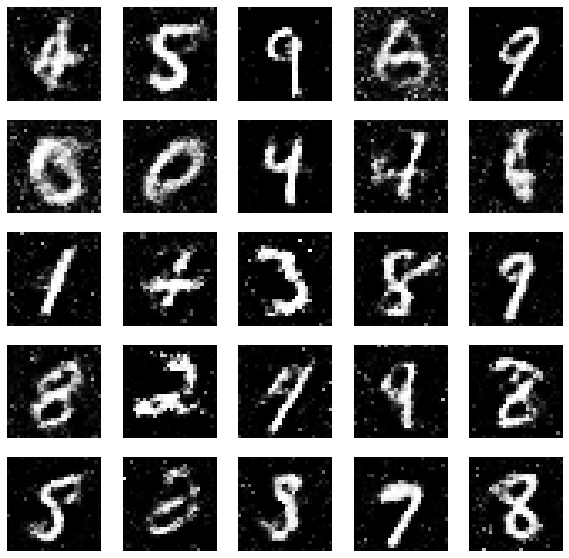

9450 [D loss: 0.644834, acc.: 61.33%] [G loss: 0.944241]


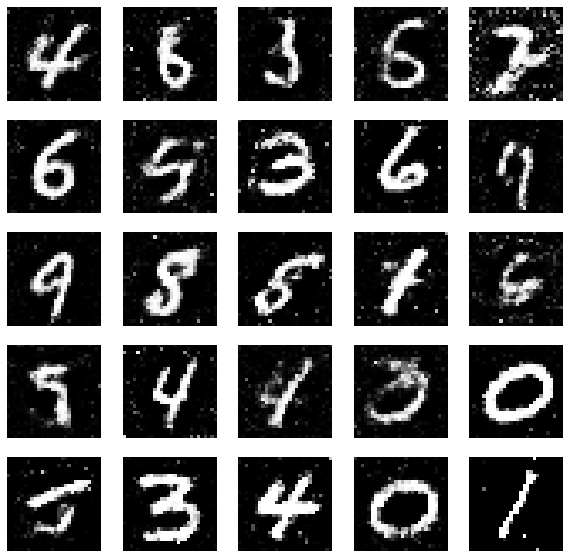

9600 [D loss: 0.614003, acc.: 64.06%] [G loss: 0.955287]


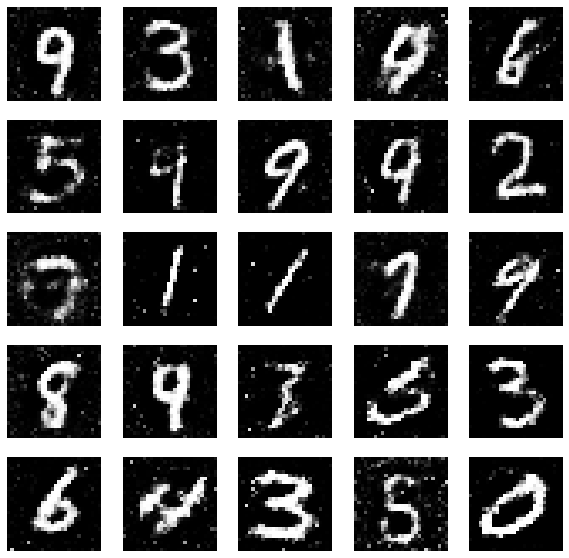

9750 [D loss: 0.598056, acc.: 66.02%] [G loss: 1.013266]


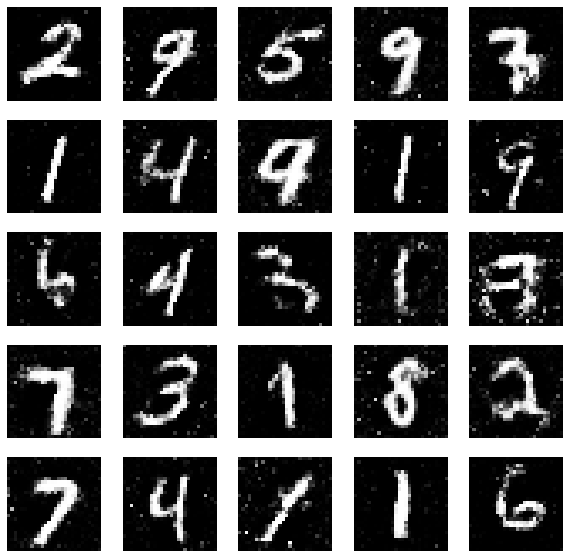

9900 [D loss: 0.630671, acc.: 64.45%] [G loss: 1.017013]


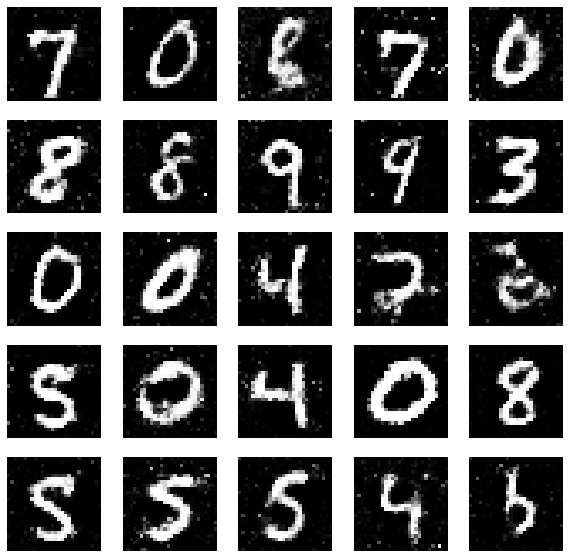

10050 [D loss: 0.607851, acc.: 65.23%] [G loss: 0.963686]


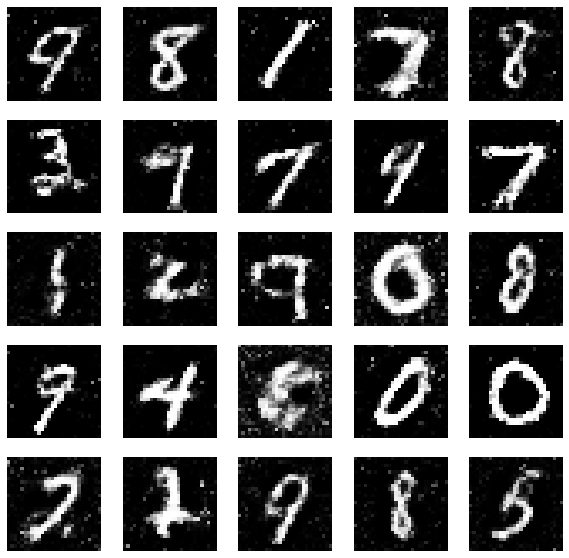

10200 [D loss: 0.611025, acc.: 64.84%] [G loss: 0.969646]


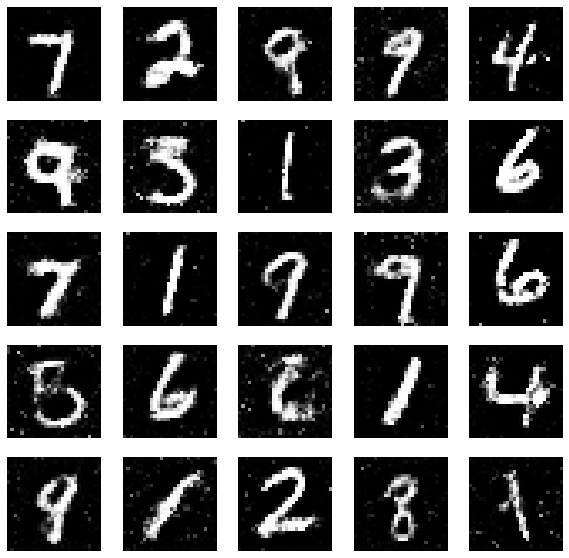

10350 [D loss: 0.651036, acc.: 58.20%] [G loss: 0.999668]


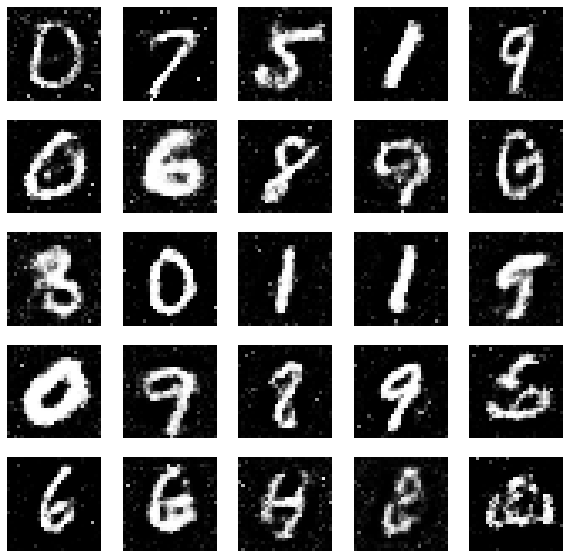

10500 [D loss: 0.592514, acc.: 67.58%] [G loss: 0.970139]


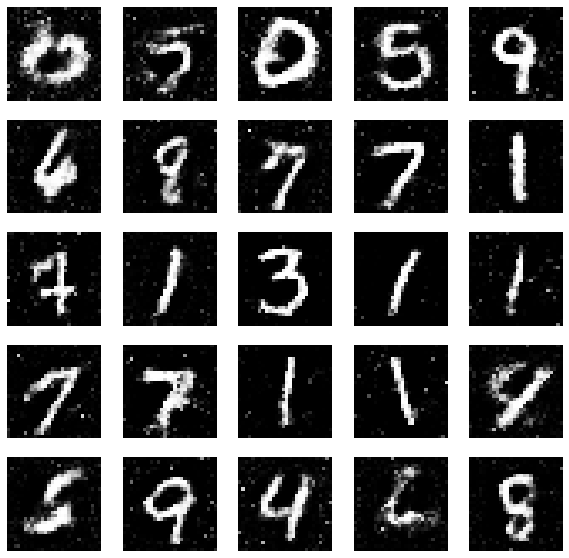

10650 [D loss: 0.627637, acc.: 64.06%] [G loss: 1.051261]


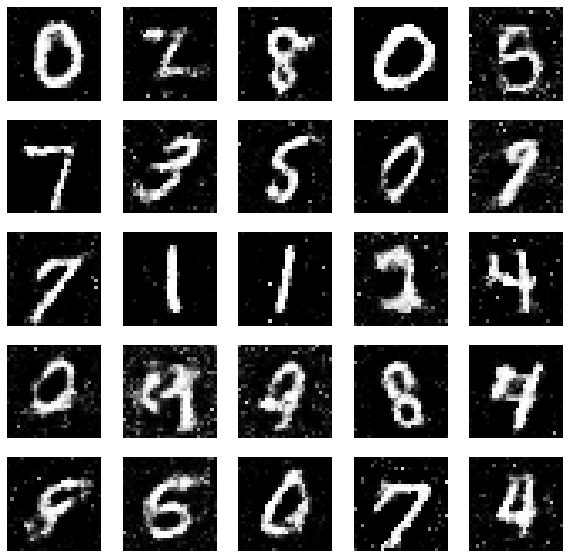

10800 [D loss: 0.652779, acc.: 59.77%] [G loss: 1.047648]


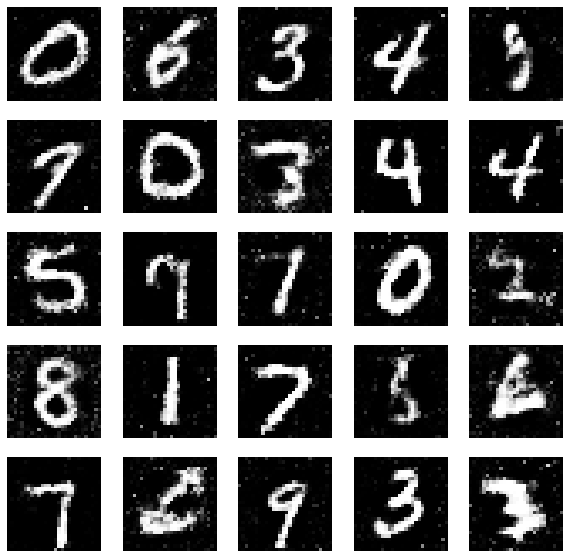

10950 [D loss: 0.630719, acc.: 62.50%] [G loss: 1.011380]


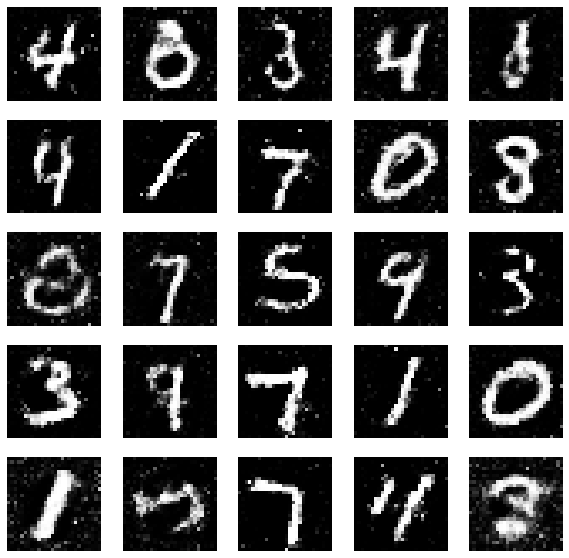

11100 [D loss: 0.585361, acc.: 67.19%] [G loss: 0.962298]


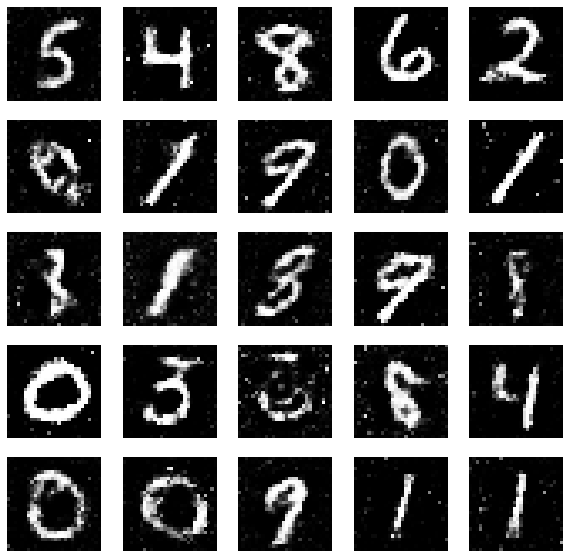

11250 [D loss: 0.616937, acc.: 64.84%] [G loss: 0.981069]


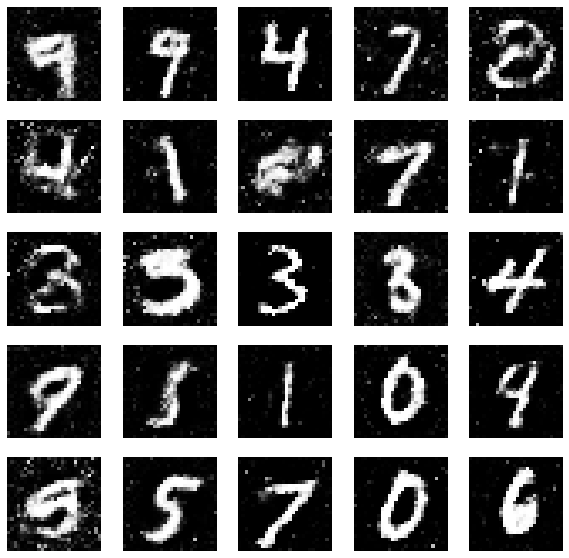

11400 [D loss: 0.626909, acc.: 67.19%] [G loss: 0.983226]


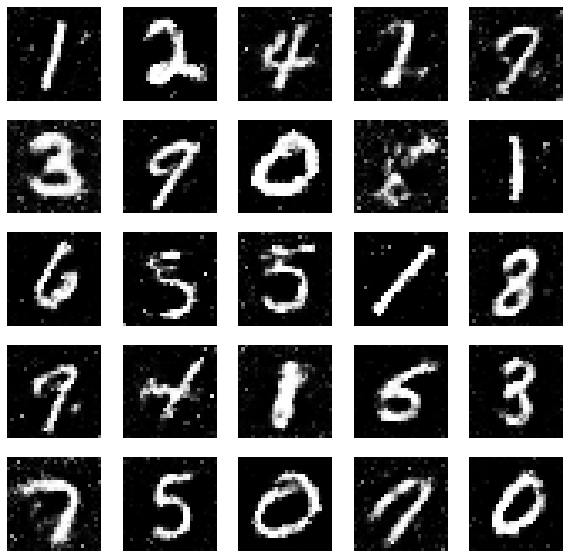

11550 [D loss: 0.648353, acc.: 63.67%] [G loss: 1.013718]


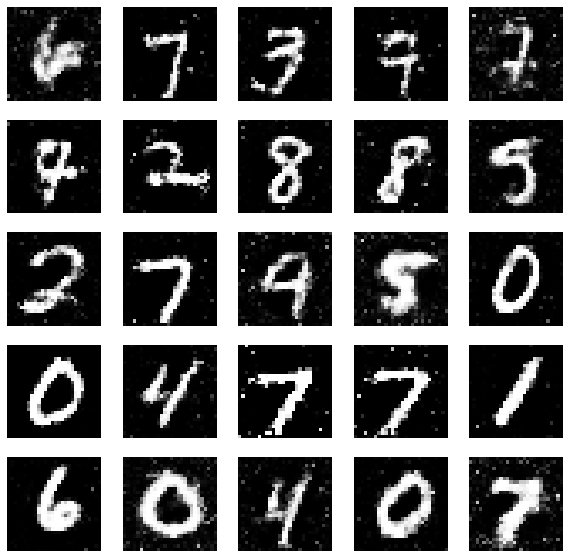

11700 [D loss: 0.590038, acc.: 67.97%] [G loss: 1.064097]


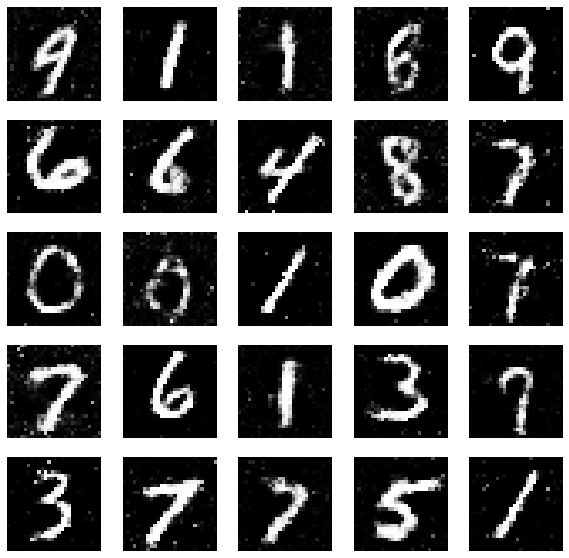

11850 [D loss: 0.665961, acc.: 58.59%] [G loss: 0.961667]


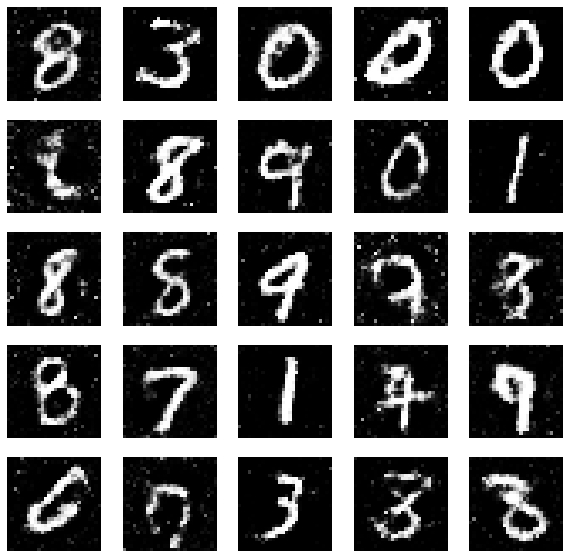

12000 [D loss: 0.643538, acc.: 62.11%] [G loss: 0.975787]


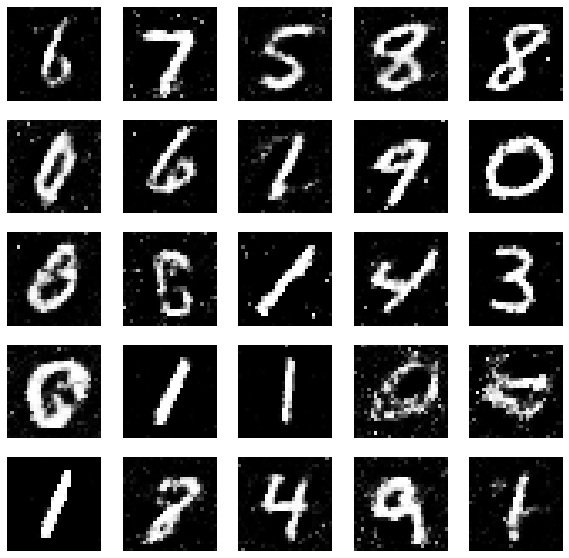

12150 [D loss: 0.616533, acc.: 65.23%] [G loss: 1.003251]


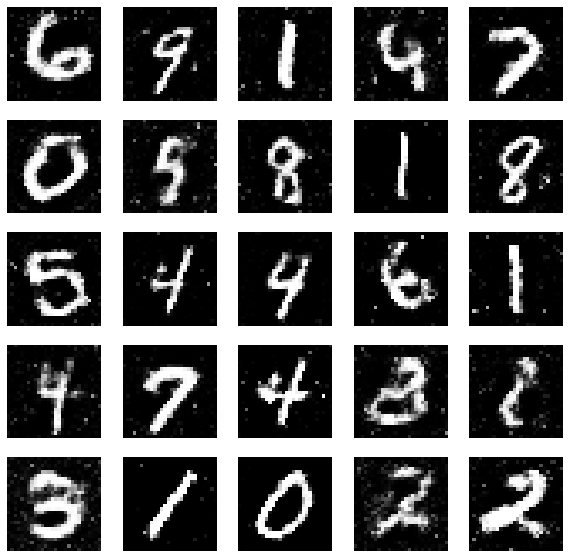

12300 [D loss: 0.622251, acc.: 65.23%] [G loss: 0.971985]


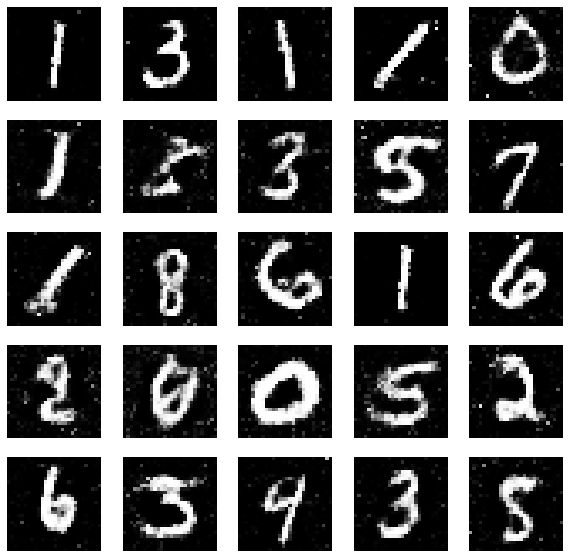

12450 [D loss: 0.604071, acc.: 71.48%] [G loss: 0.978303]


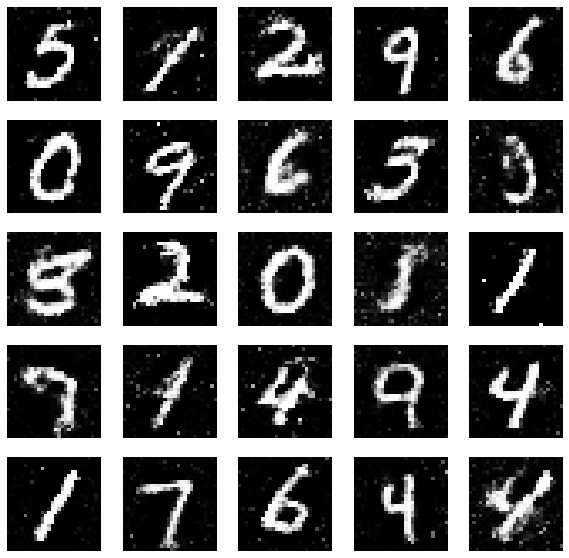

12600 [D loss: 0.608756, acc.: 67.58%] [G loss: 1.004364]


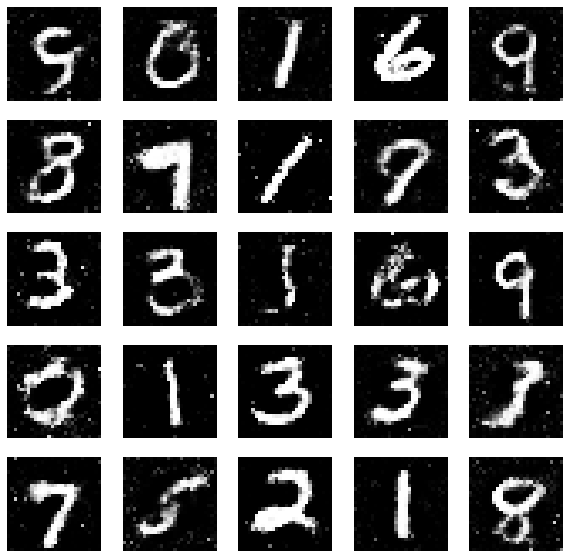

12750 [D loss: 0.606718, acc.: 65.62%] [G loss: 1.046681]


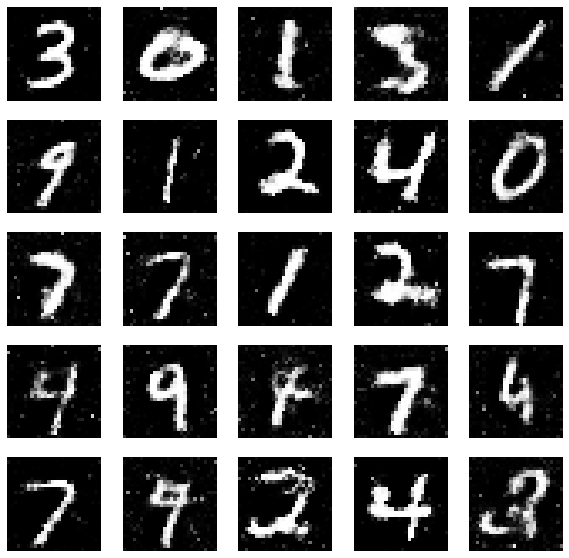

12900 [D loss: 0.655277, acc.: 58.59%] [G loss: 1.059899]


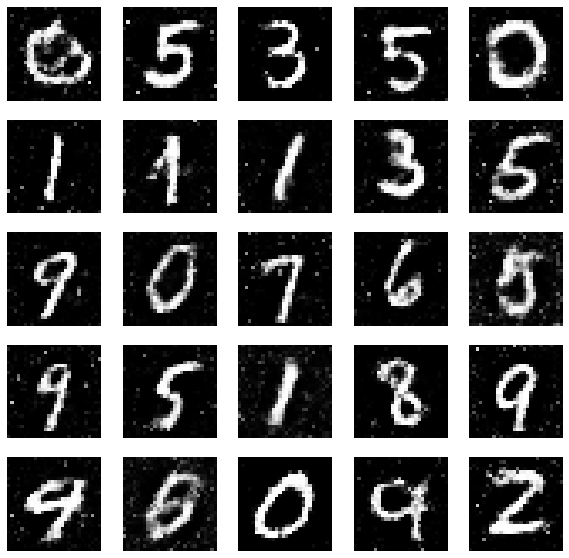

13050 [D loss: 0.608852, acc.: 66.02%] [G loss: 1.025908]


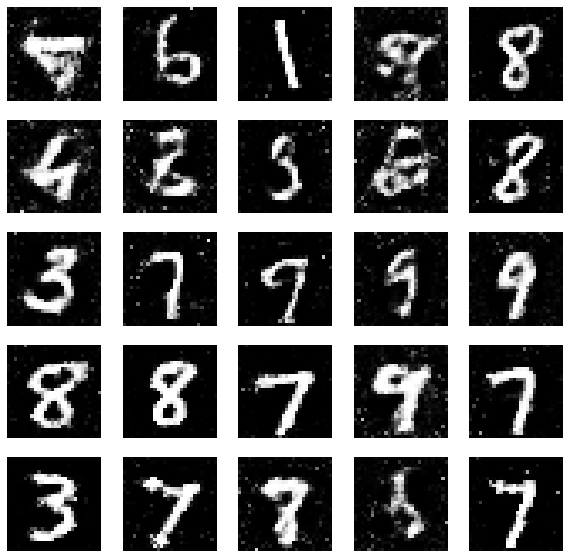

13200 [D loss: 0.638939, acc.: 62.50%] [G loss: 1.004745]


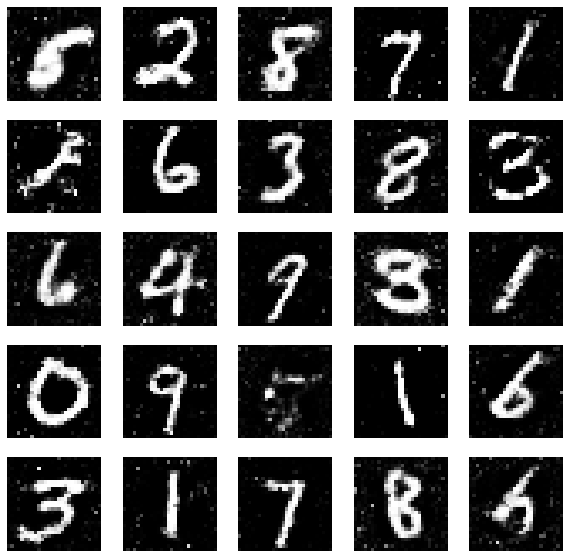

13350 [D loss: 0.617546, acc.: 66.02%] [G loss: 1.042631]


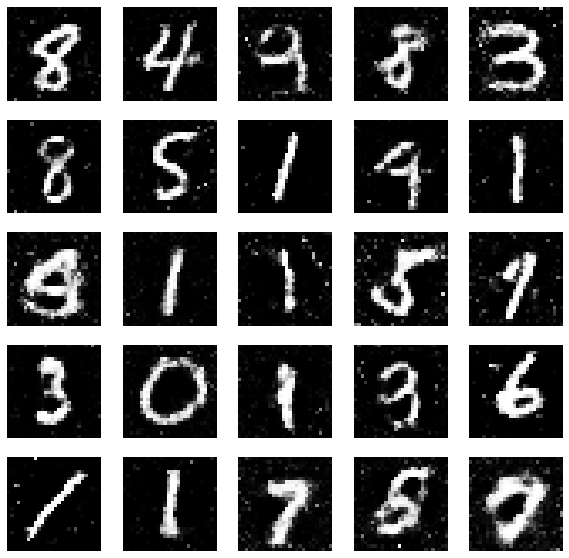

13500 [D loss: 0.613197, acc.: 63.28%] [G loss: 1.035998]


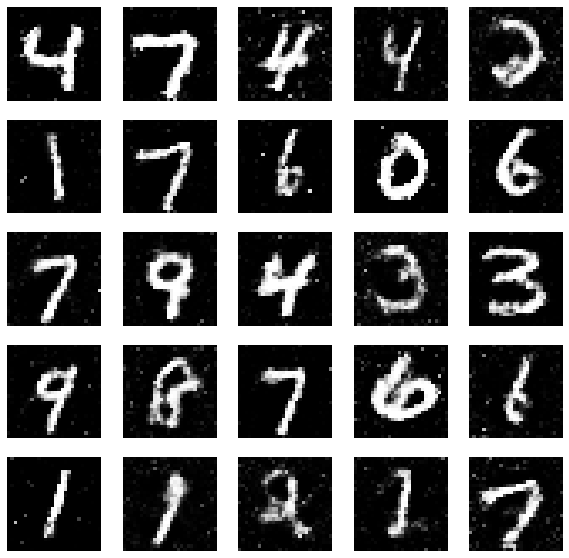

13650 [D loss: 0.602090, acc.: 63.28%] [G loss: 1.064048]


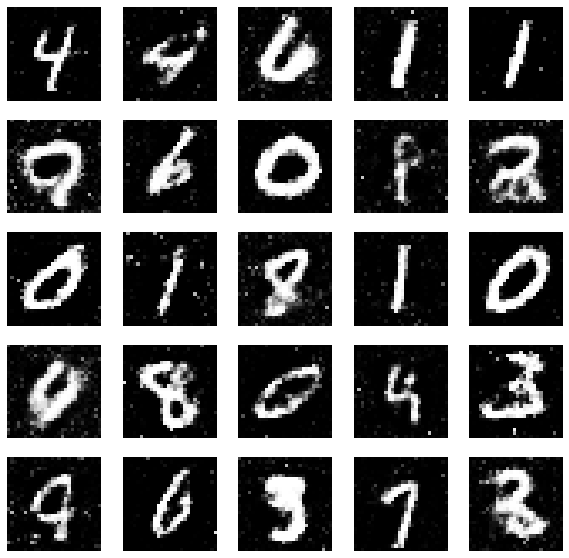

13800 [D loss: 0.608454, acc.: 64.06%] [G loss: 1.005764]


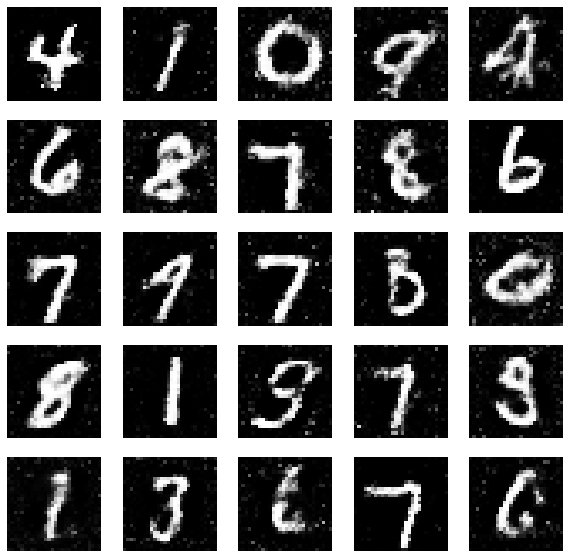

13950 [D loss: 0.641823, acc.: 62.89%] [G loss: 0.978743]


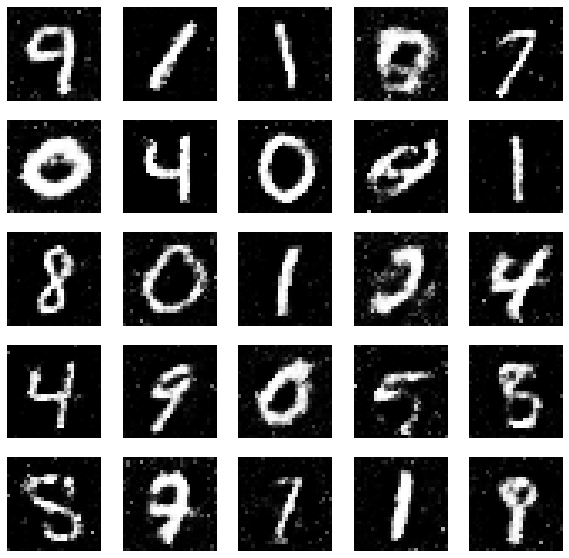

14100 [D loss: 0.621286, acc.: 63.28%] [G loss: 1.060912]


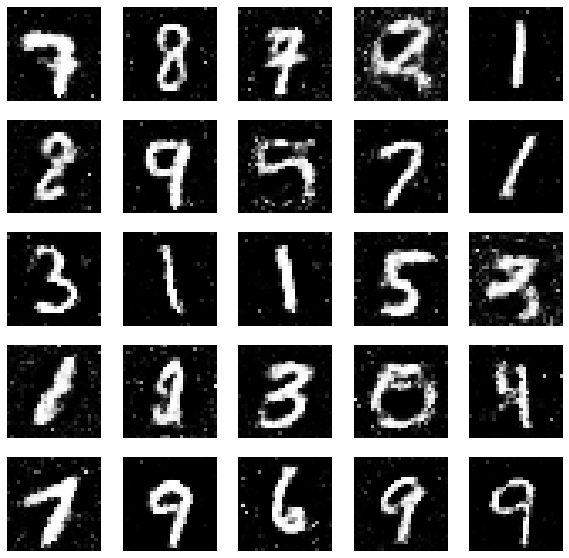

14250 [D loss: 0.620350, acc.: 65.23%] [G loss: 1.001151]


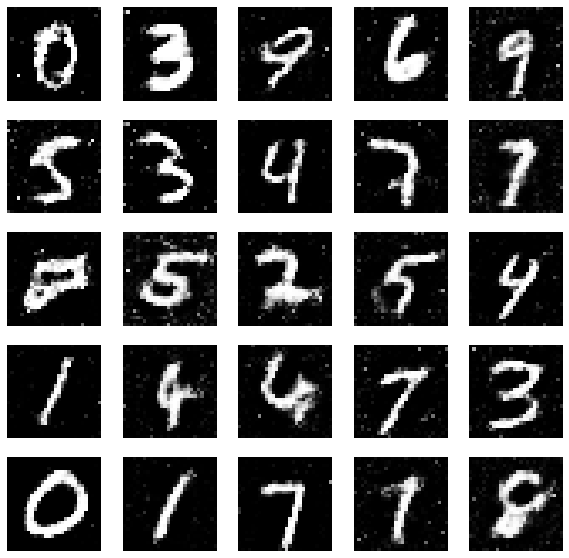

14400 [D loss: 0.613549, acc.: 62.50%] [G loss: 1.103787]


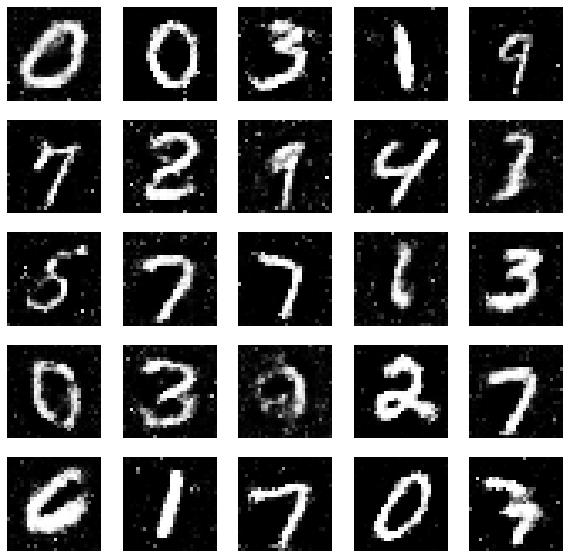

14550 [D loss: 0.547852, acc.: 73.44%] [G loss: 1.081522]


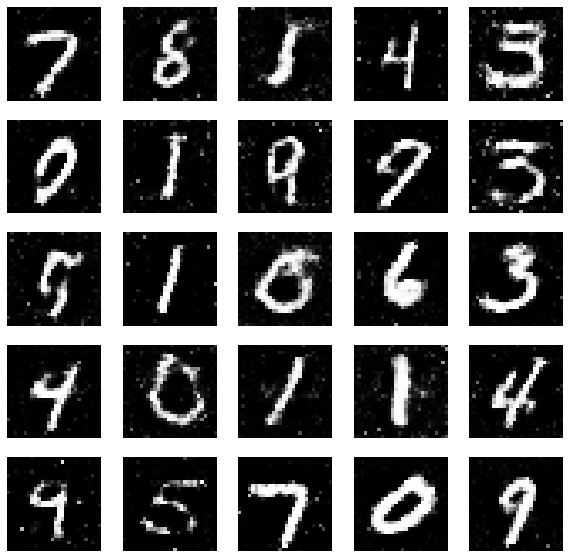

14700 [D loss: 0.659039, acc.: 60.16%] [G loss: 1.011021]


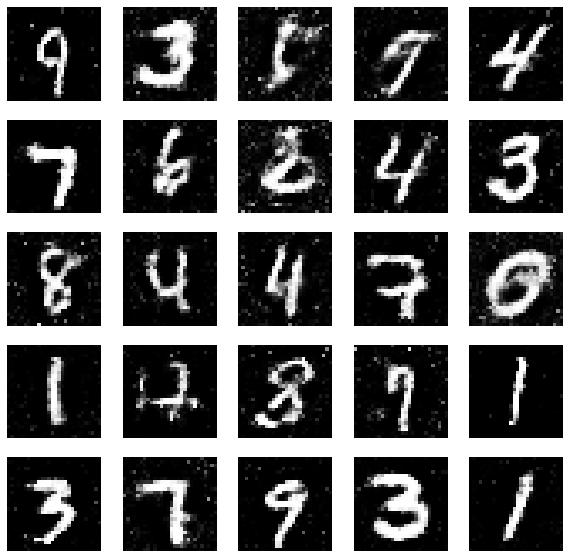

14850 [D loss: 0.608069, acc.: 64.06%] [G loss: 0.996322]


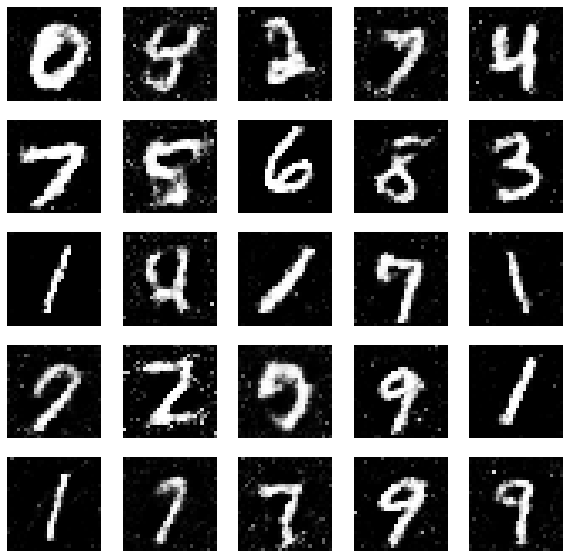

15000 [D loss: 0.643906, acc.: 62.89%] [G loss: 1.072330]


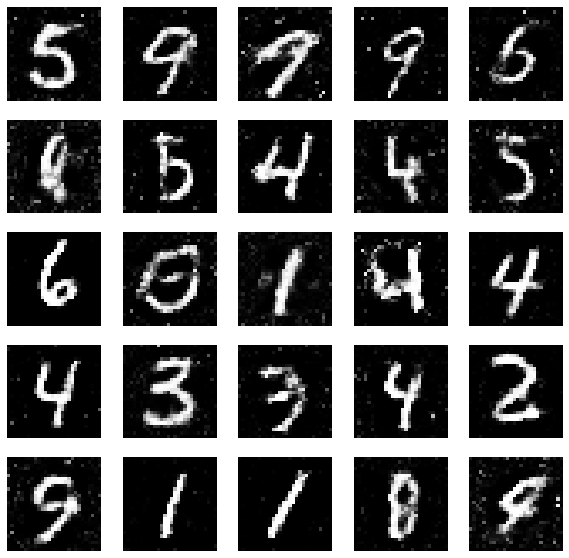

15150 [D loss: 0.613254, acc.: 64.45%] [G loss: 1.009418]


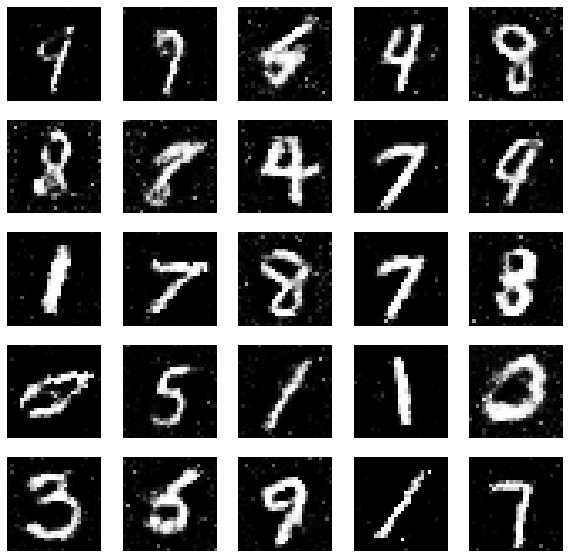

15300 [D loss: 0.603266, acc.: 65.23%] [G loss: 1.036882]


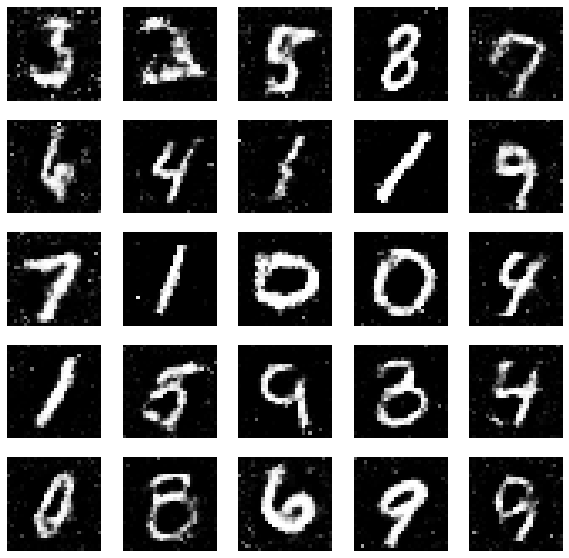

15450 [D loss: 0.604149, acc.: 66.02%] [G loss: 1.037130]


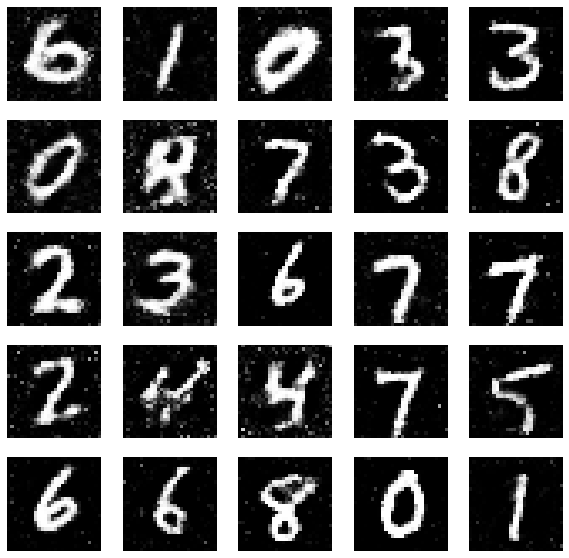

15600 [D loss: 0.631622, acc.: 61.33%] [G loss: 1.065924]


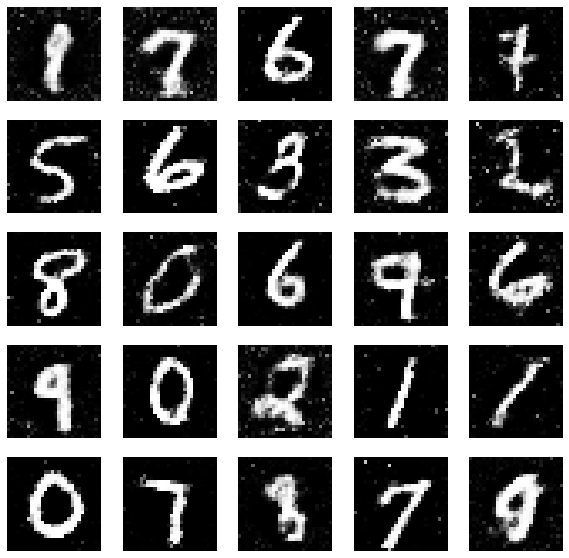

15750 [D loss: 0.617180, acc.: 66.41%] [G loss: 1.056773]


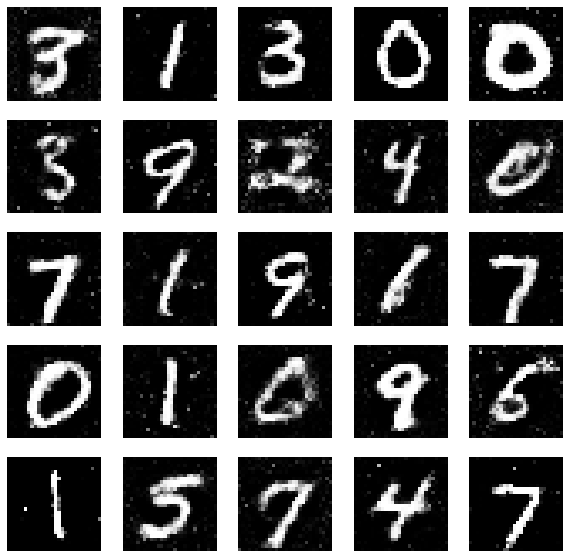

15900 [D loss: 0.641182, acc.: 64.45%] [G loss: 1.049018]


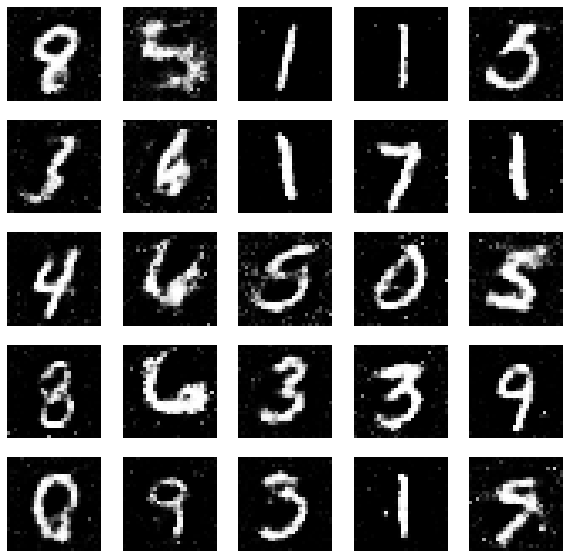

16050 [D loss: 0.593297, acc.: 69.14%] [G loss: 1.019517]


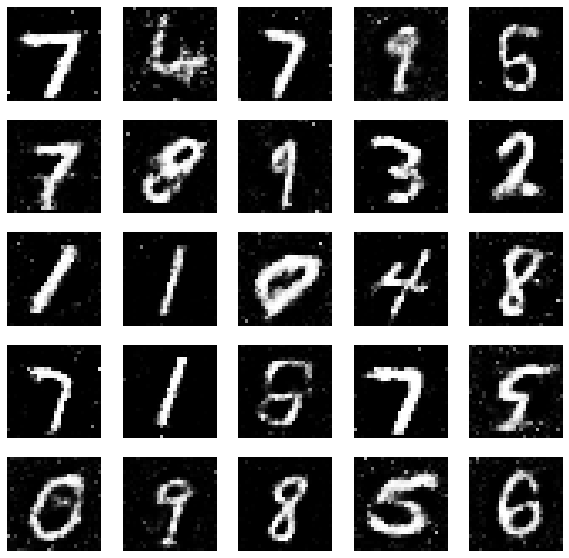

16200 [D loss: 0.582565, acc.: 66.41%] [G loss: 1.086316]


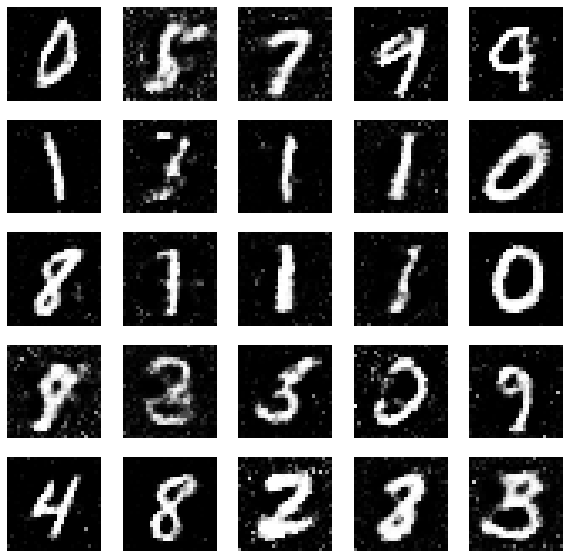

16350 [D loss: 0.599073, acc.: 65.23%] [G loss: 1.023530]


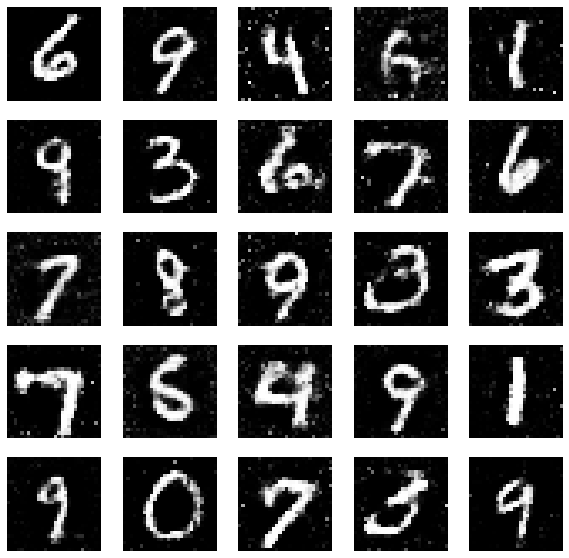

16500 [D loss: 0.627514, acc.: 60.55%] [G loss: 1.136681]


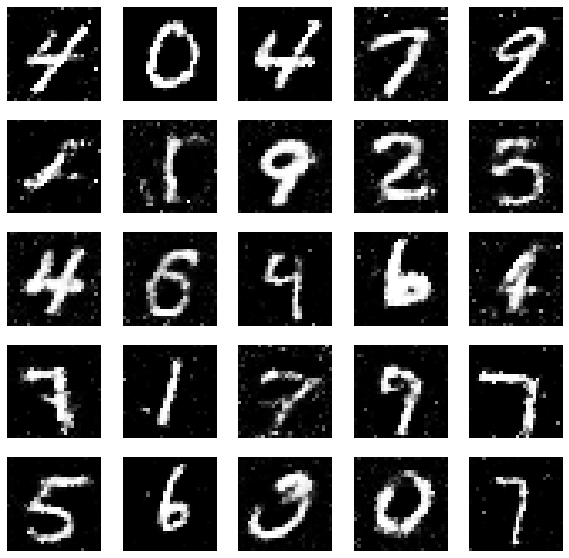

16650 [D loss: 0.651859, acc.: 58.98%] [G loss: 1.062556]


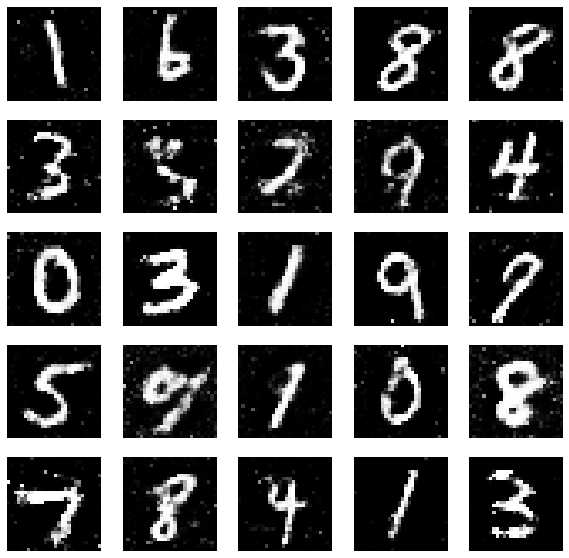

16800 [D loss: 0.601540, acc.: 63.28%] [G loss: 1.162954]


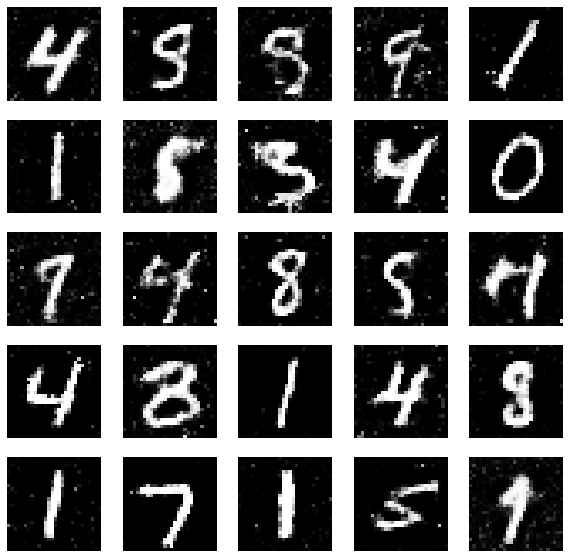

16950 [D loss: 0.601180, acc.: 67.19%] [G loss: 1.033768]


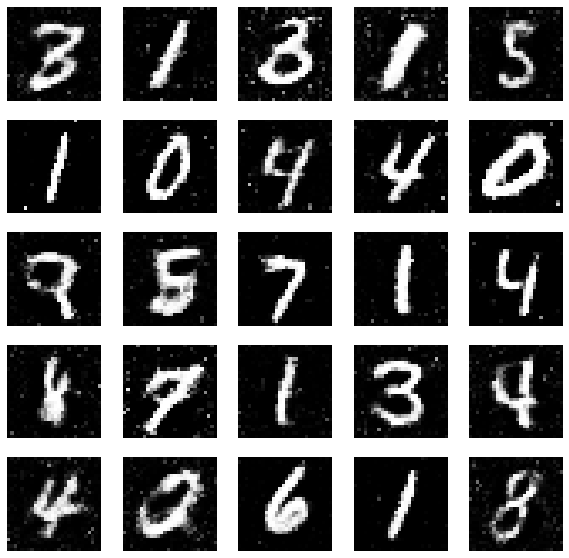

17100 [D loss: 0.577313, acc.: 67.19%] [G loss: 1.051958]


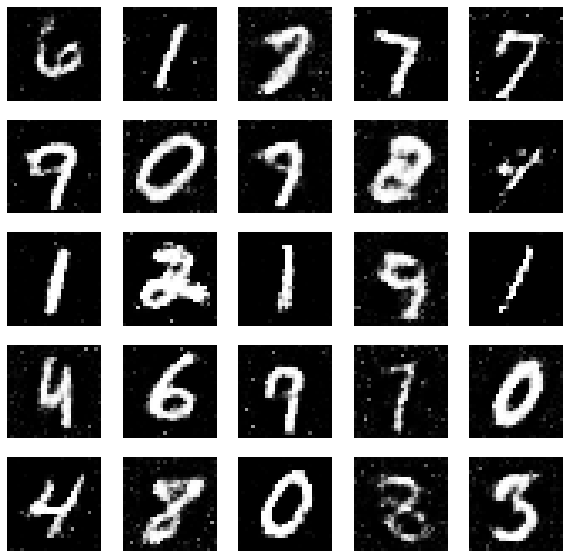

17250 [D loss: 0.577583, acc.: 68.36%] [G loss: 1.180715]


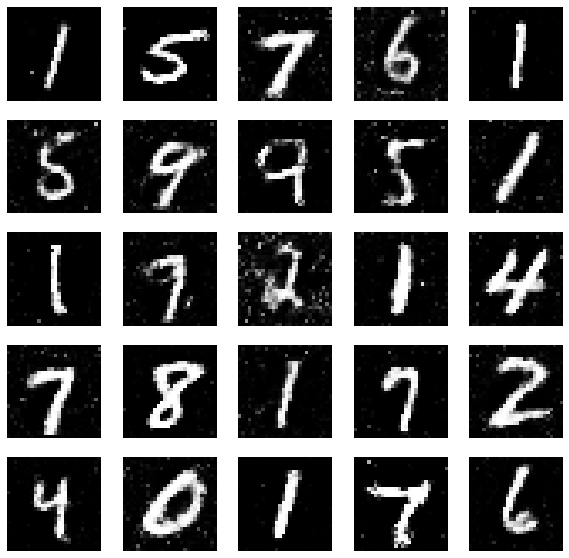

17400 [D loss: 0.547210, acc.: 71.88%] [G loss: 1.162892]


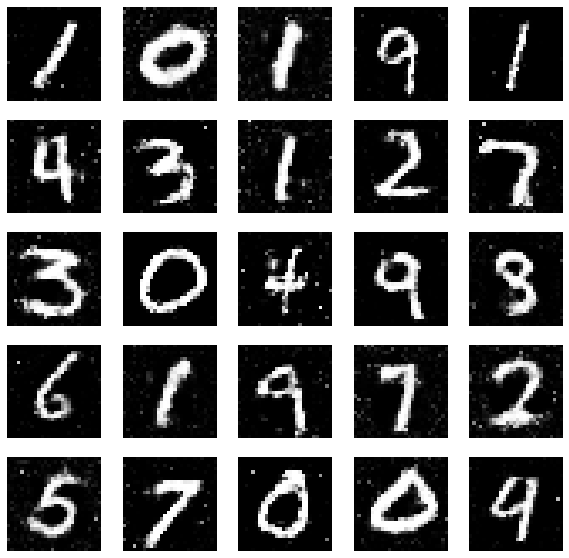

17550 [D loss: 0.644509, acc.: 63.67%] [G loss: 1.093901]


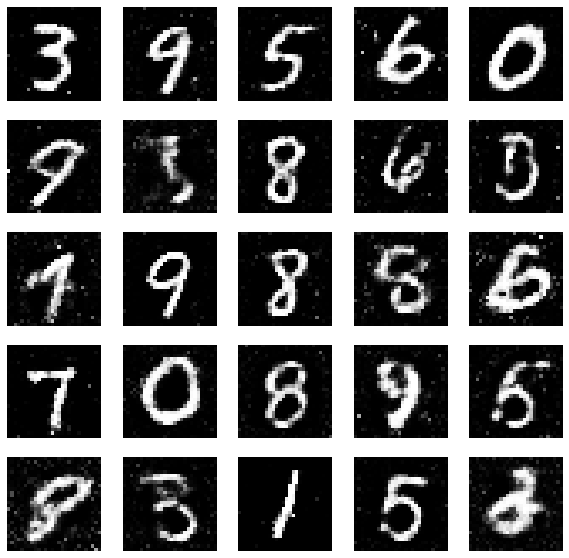

17700 [D loss: 0.613326, acc.: 63.28%] [G loss: 1.106771]


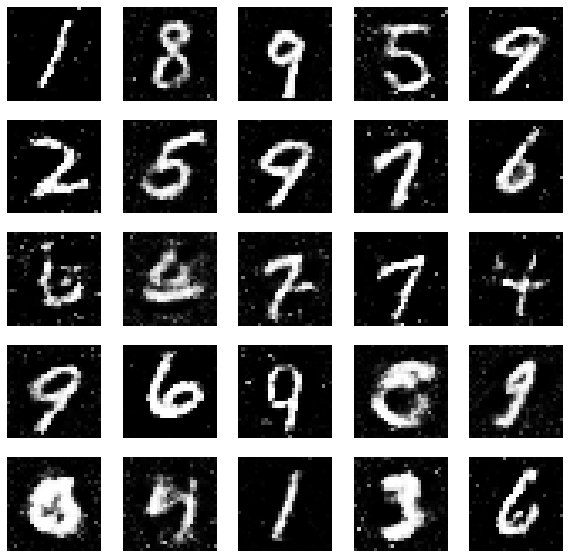

17850 [D loss: 0.587520, acc.: 70.31%] [G loss: 1.053365]


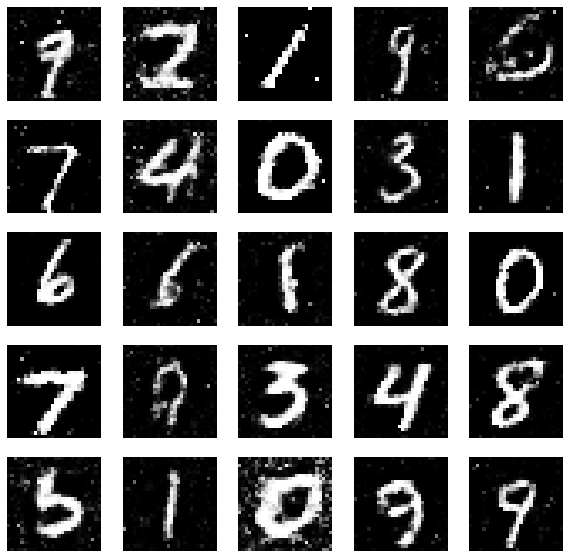

18000 [D loss: 0.553108, acc.: 71.88%] [G loss: 1.066157]


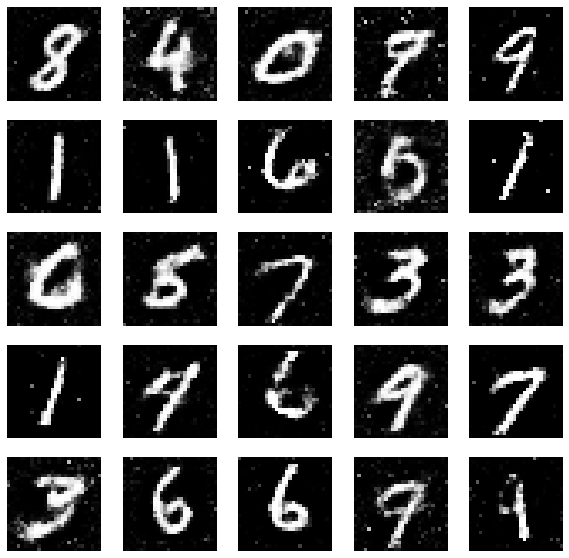

18150 [D loss: 0.617969, acc.: 64.45%] [G loss: 1.104556]


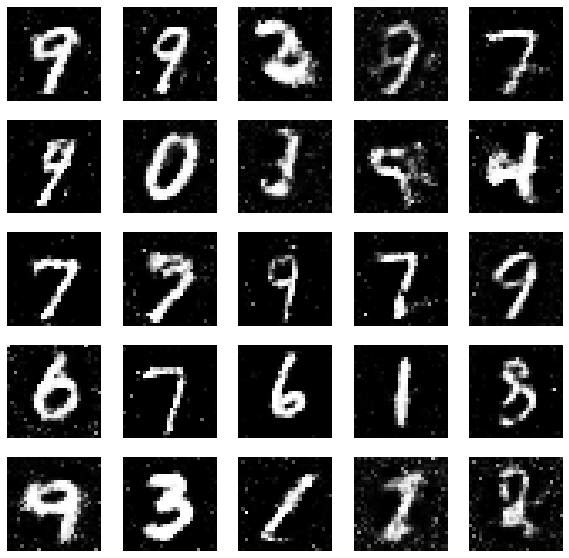

18300 [D loss: 0.550479, acc.: 72.66%] [G loss: 1.031682]


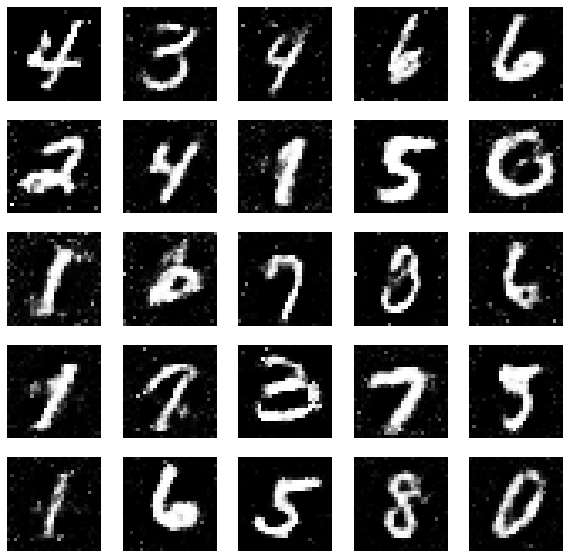

18450 [D loss: 0.553247, acc.: 69.92%] [G loss: 1.125858]


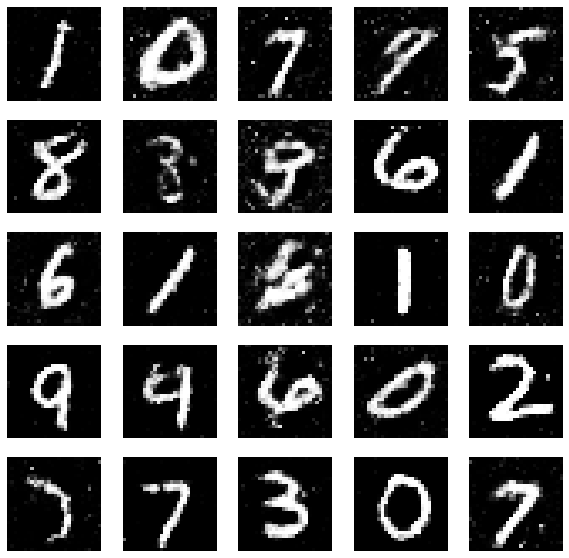

18600 [D loss: 0.597712, acc.: 66.80%] [G loss: 1.166391]


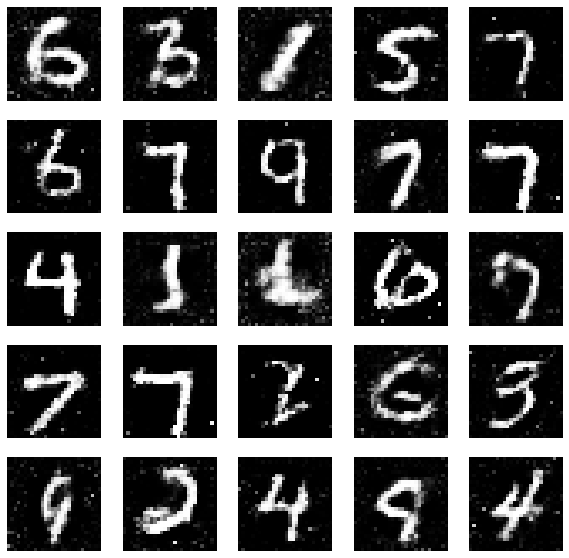

18750 [D loss: 0.588297, acc.: 68.75%] [G loss: 1.034734]


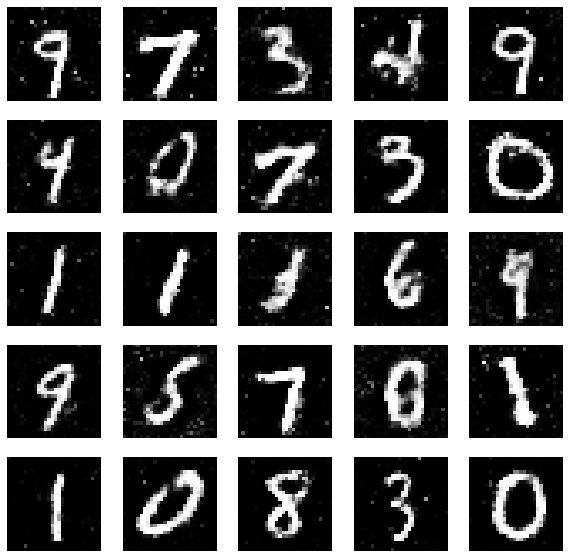

18900 [D loss: 0.573314, acc.: 68.75%] [G loss: 1.149073]


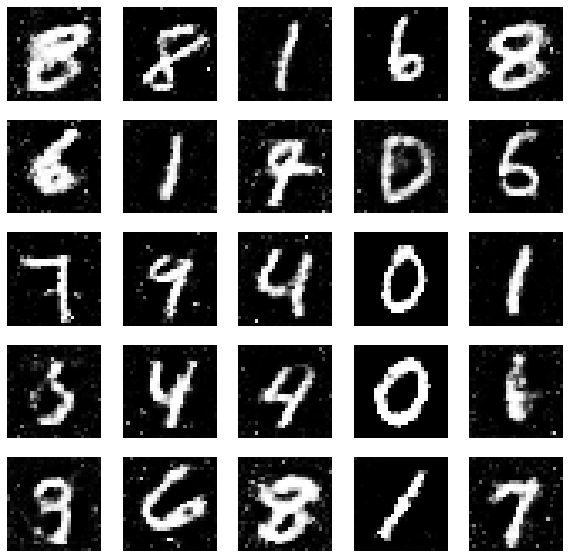

19050 [D loss: 0.619649, acc.: 65.23%] [G loss: 1.076253]


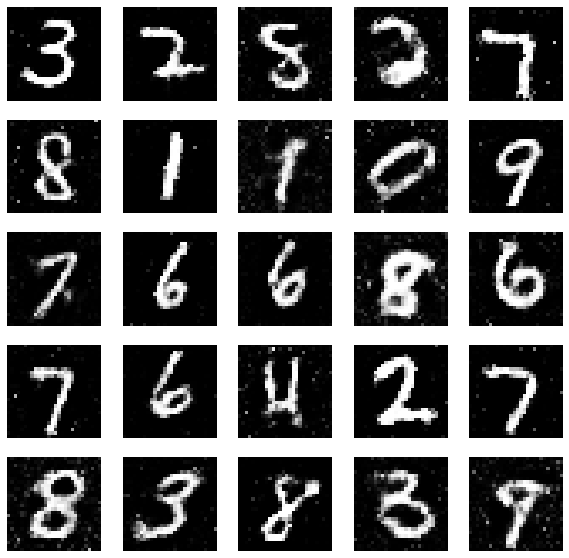

19200 [D loss: 0.625515, acc.: 60.55%] [G loss: 1.101340]


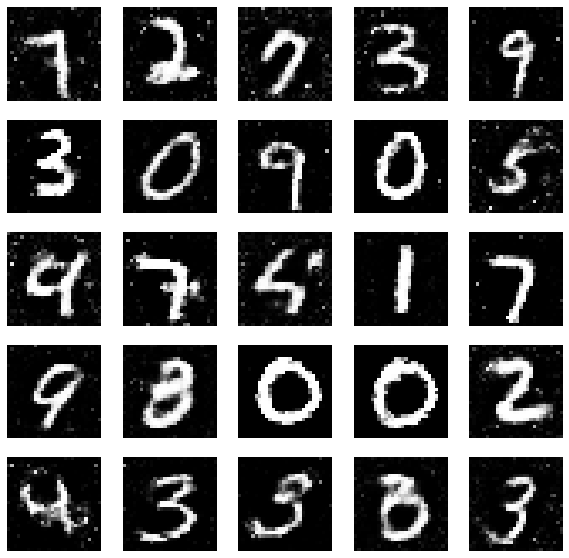

19350 [D loss: 0.614232, acc.: 61.33%] [G loss: 1.063572]


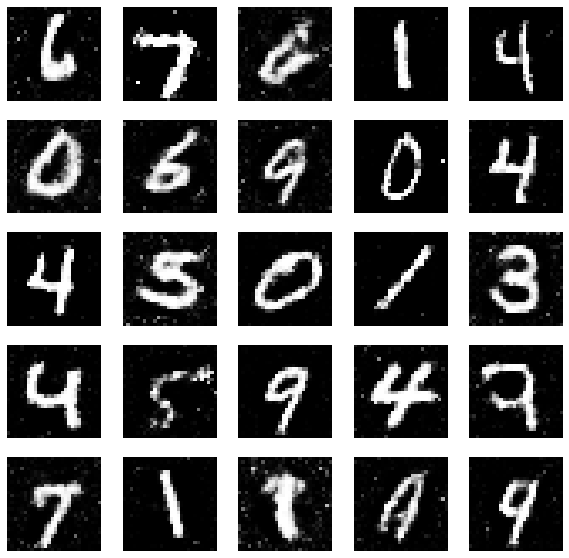

19500 [D loss: 0.559551, acc.: 69.53%] [G loss: 1.034167]


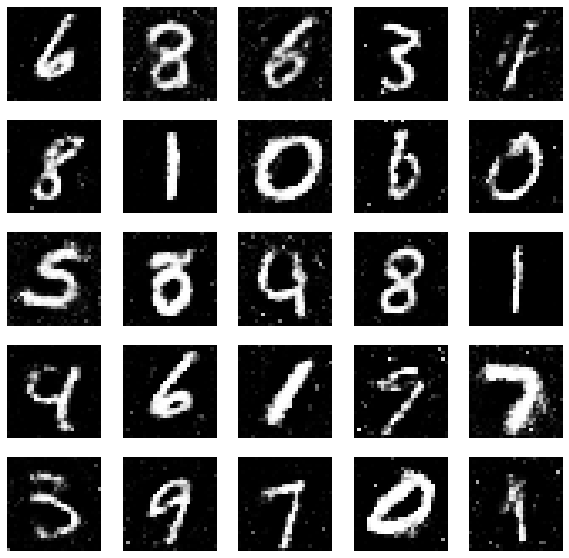

19650 [D loss: 0.556833, acc.: 70.70%] [G loss: 1.199131]


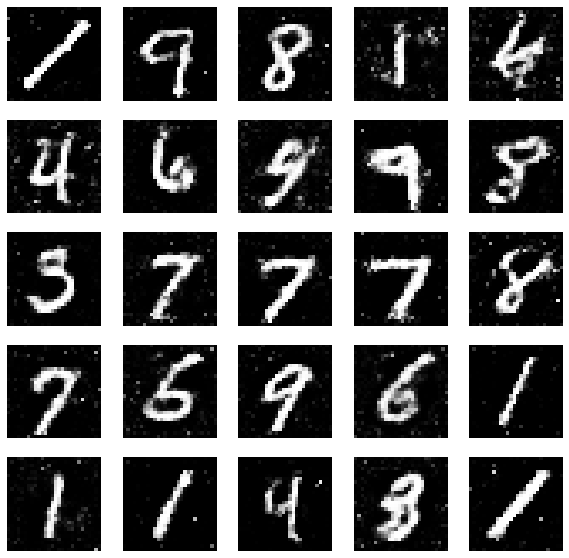

19800 [D loss: 0.562061, acc.: 69.14%] [G loss: 1.151065]


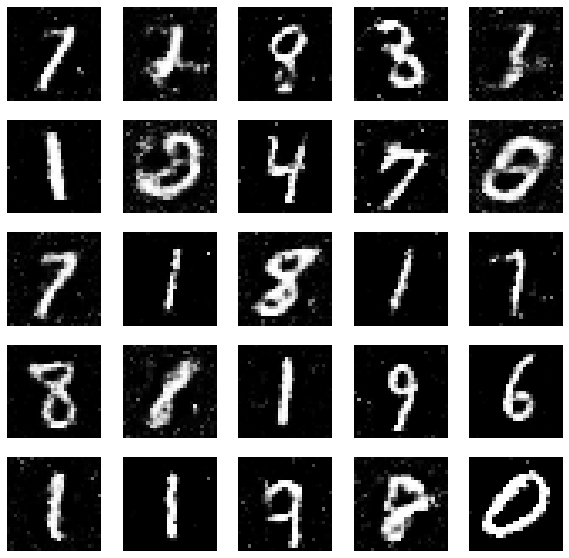

19950 [D loss: 0.584042, acc.: 67.19%] [G loss: 1.122886]


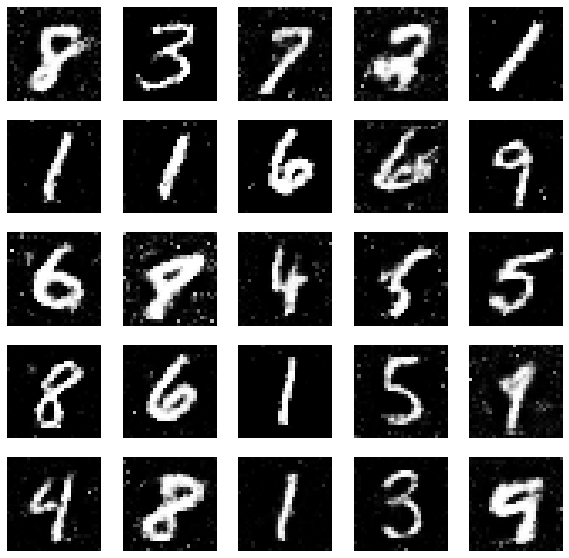

20100 [D loss: 0.572475, acc.: 68.36%] [G loss: 1.054527]


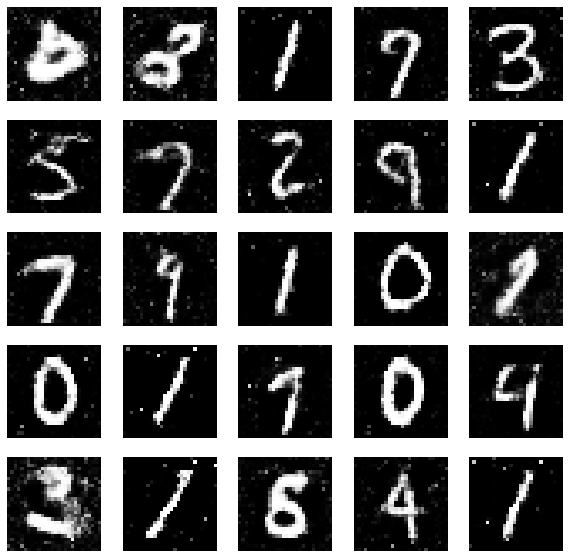

20250 [D loss: 0.592848, acc.: 64.06%] [G loss: 1.146866]


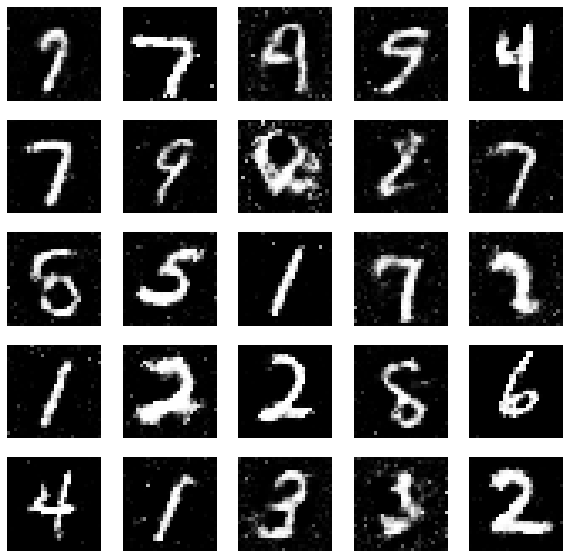

20400 [D loss: 0.555511, acc.: 69.53%] [G loss: 1.137385]


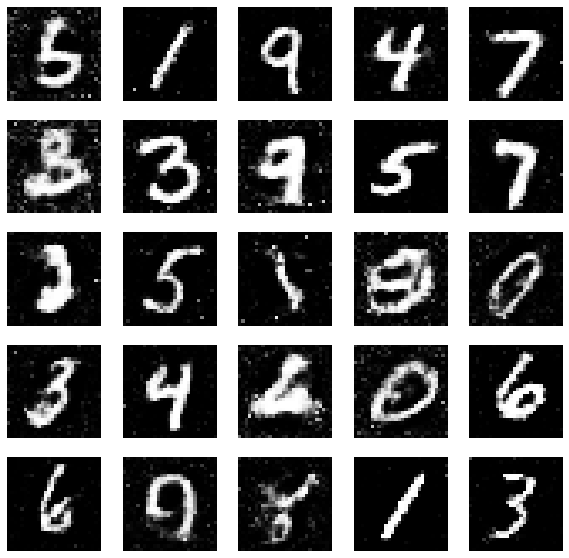

20550 [D loss: 0.555595, acc.: 69.92%] [G loss: 1.164975]


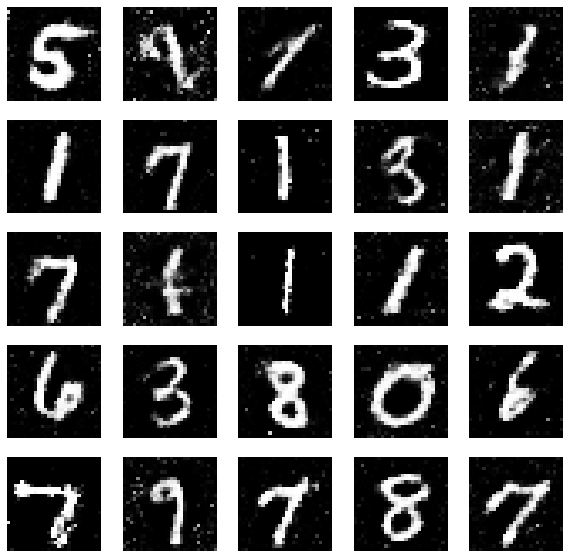

20700 [D loss: 0.623116, acc.: 65.23%] [G loss: 1.203303]


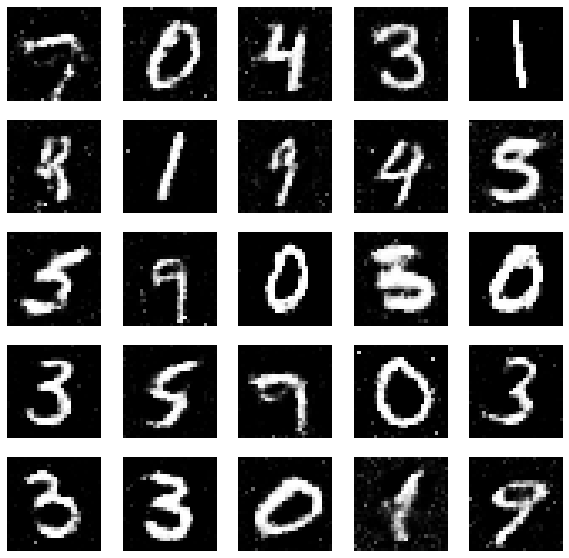

20850 [D loss: 0.567321, acc.: 69.53%] [G loss: 1.077726]


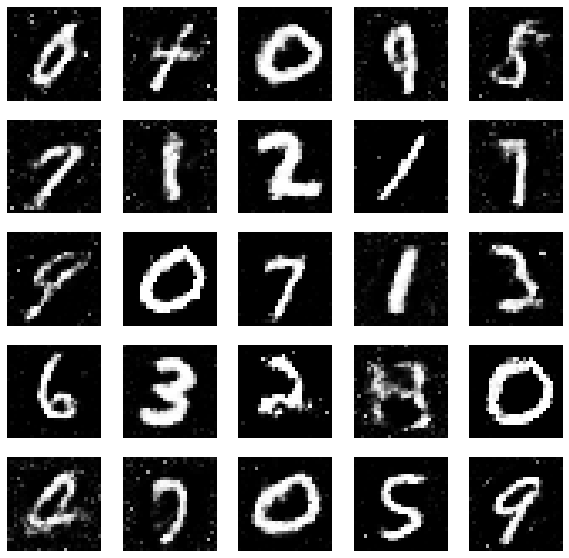

21000 [D loss: 0.579596, acc.: 68.36%] [G loss: 1.122305]


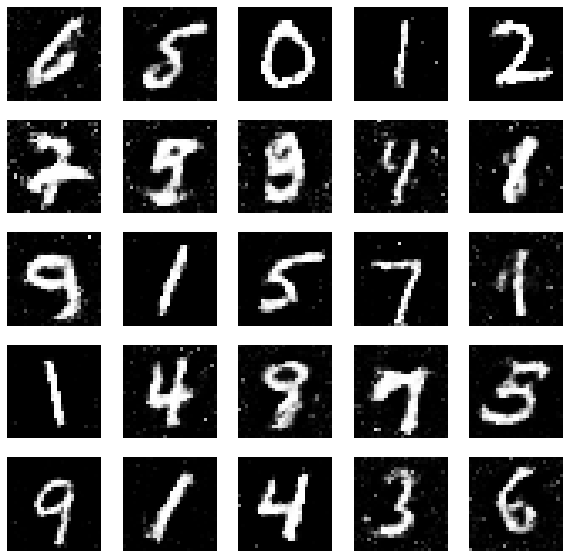

21150 [D loss: 0.553621, acc.: 71.88%] [G loss: 1.082877]


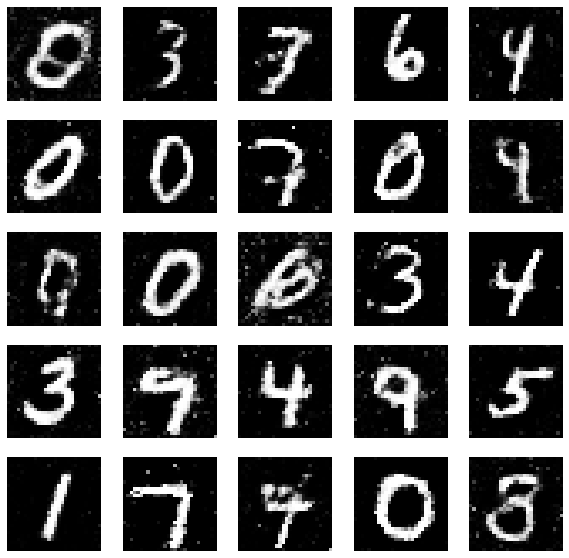

21300 [D loss: 0.609971, acc.: 60.16%] [G loss: 1.111377]


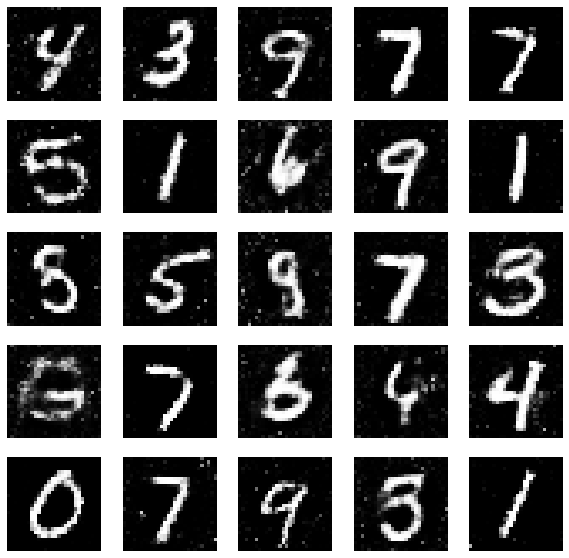

21450 [D loss: 0.549984, acc.: 72.66%] [G loss: 1.204782]


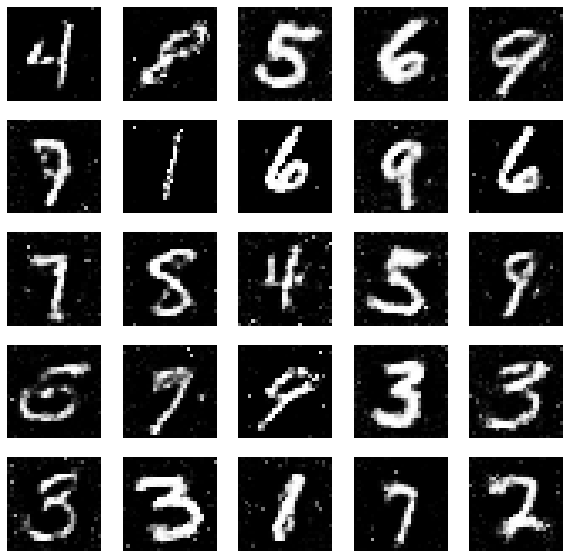

21600 [D loss: 0.575286, acc.: 69.14%] [G loss: 1.197032]


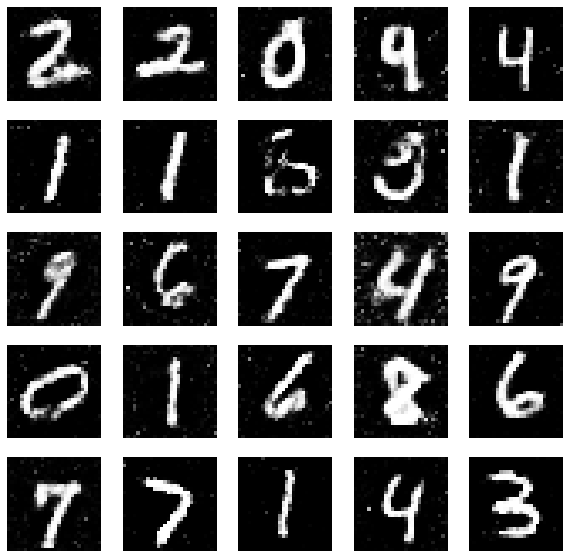

21750 [D loss: 0.533344, acc.: 74.22%] [G loss: 1.200377]


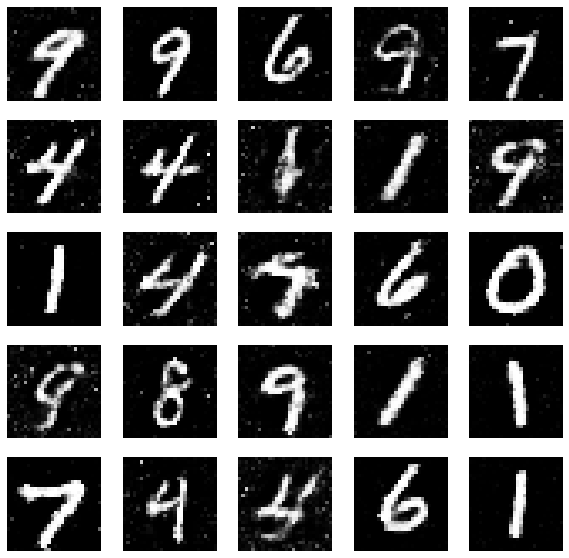

21900 [D loss: 0.634584, acc.: 65.62%] [G loss: 1.035764]


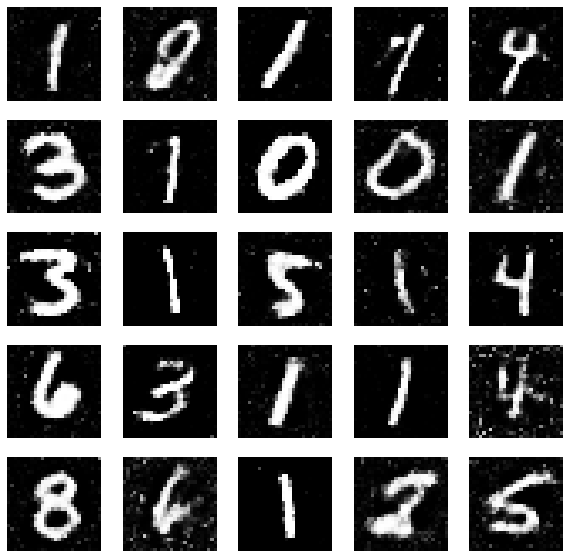

22050 [D loss: 0.555366, acc.: 71.48%] [G loss: 1.136997]


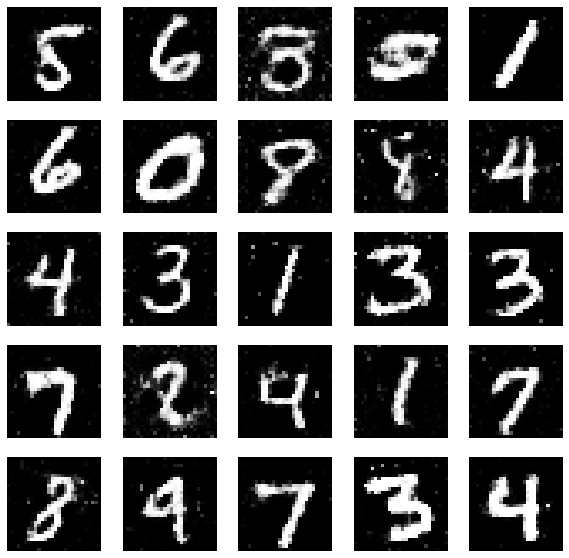

22200 [D loss: 0.567557, acc.: 71.48%] [G loss: 1.125002]


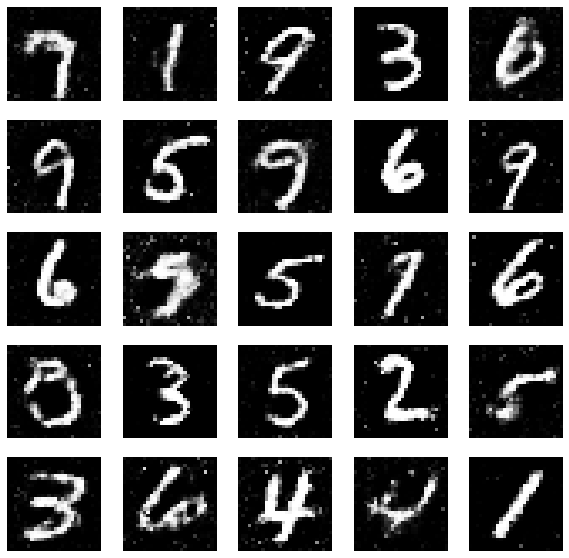

22350 [D loss: 0.601567, acc.: 69.92%] [G loss: 1.093455]


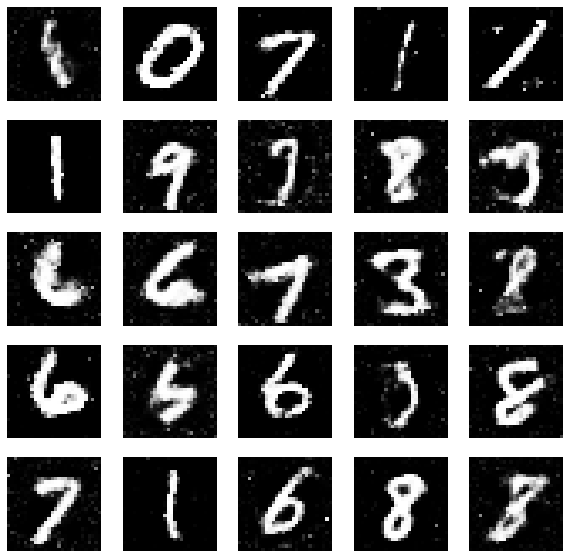

22500 [D loss: 0.598855, acc.: 65.62%] [G loss: 1.151033]


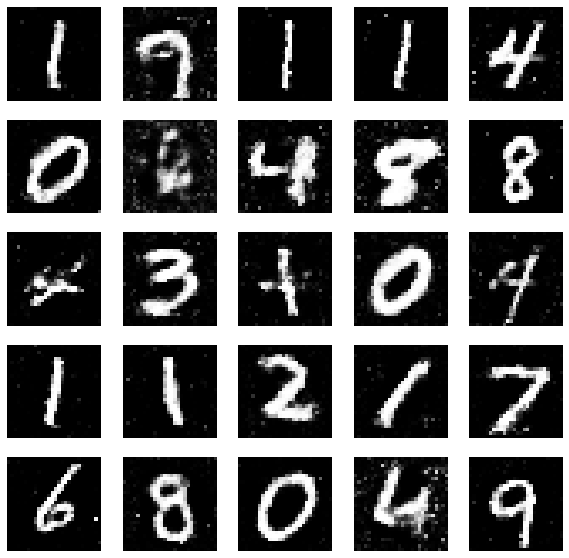

22650 [D loss: 0.540673, acc.: 70.70%] [G loss: 1.294565]


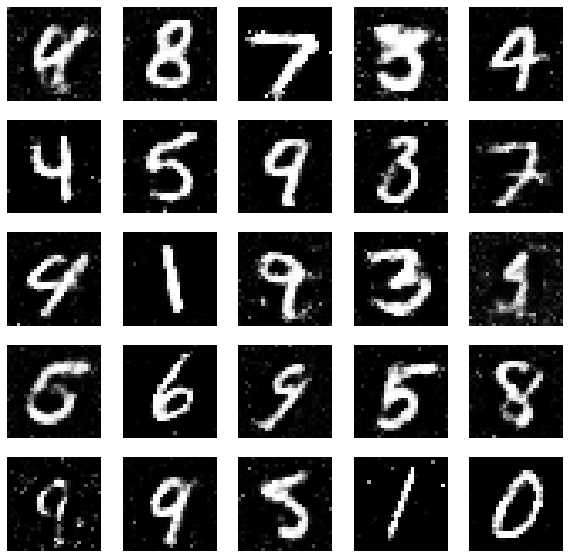

22800 [D loss: 0.594040, acc.: 68.36%] [G loss: 1.080464]


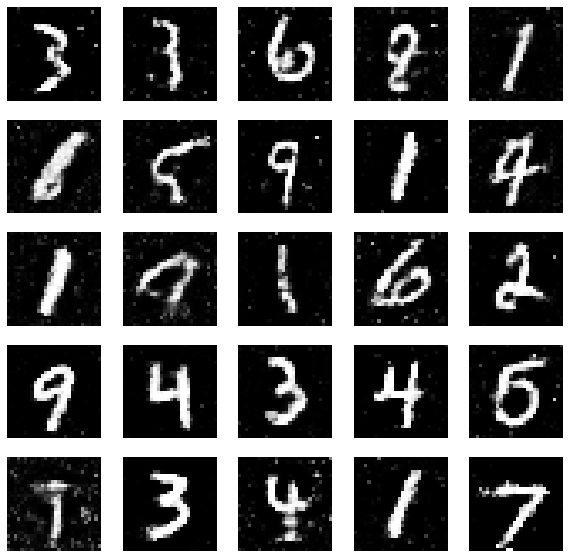

22950 [D loss: 0.543275, acc.: 70.31%] [G loss: 1.024568]


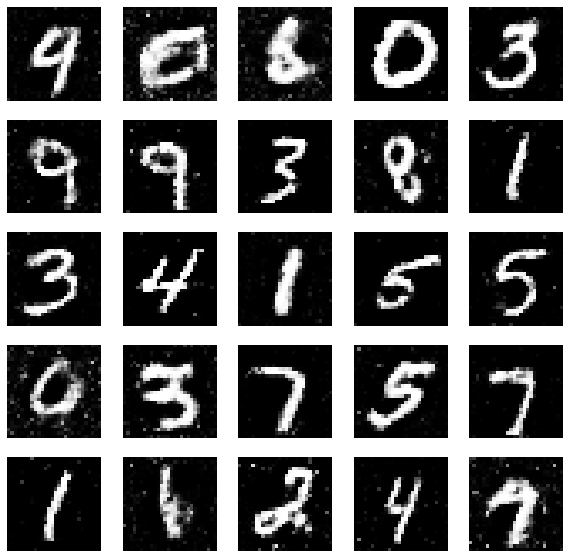

23100 [D loss: 0.550547, acc.: 69.92%] [G loss: 1.209002]


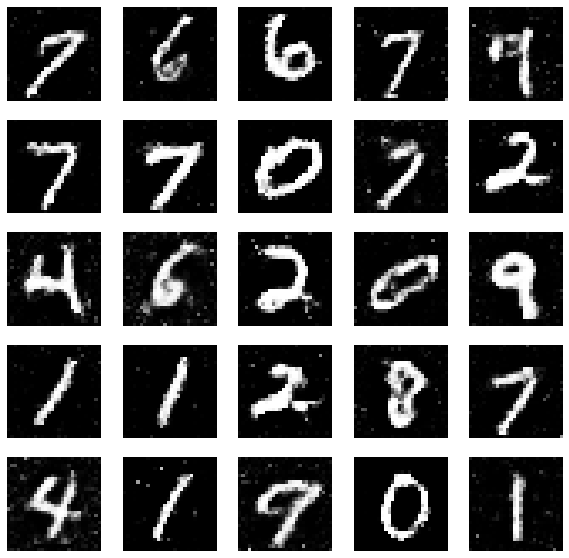

23250 [D loss: 0.605521, acc.: 67.19%] [G loss: 1.258478]


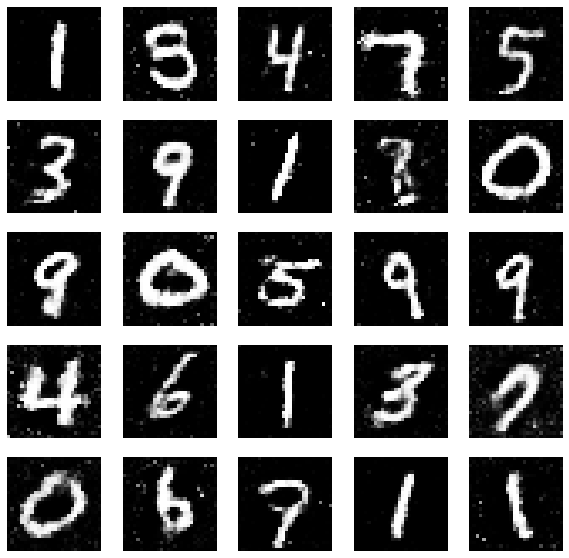

23400 [D loss: 0.592890, acc.: 67.97%] [G loss: 1.094404]


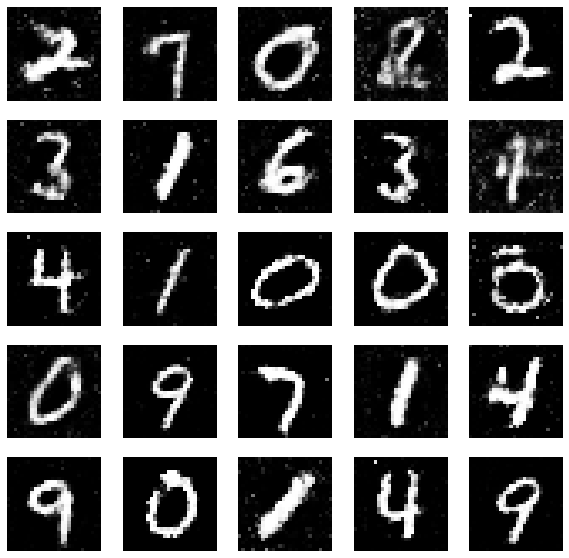

23550 [D loss: 0.558759, acc.: 67.19%] [G loss: 1.170772]


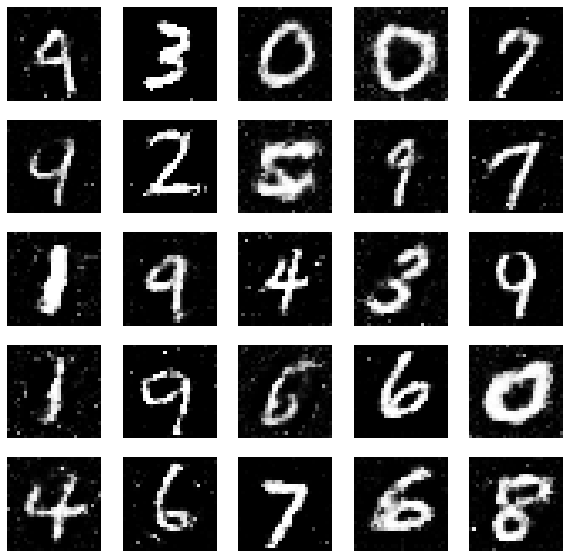

23700 [D loss: 0.603492, acc.: 65.23%] [G loss: 1.086421]


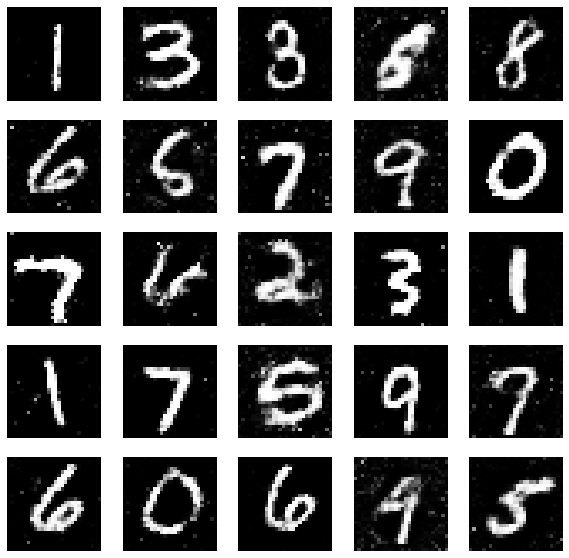

23850 [D loss: 0.582935, acc.: 69.14%] [G loss: 1.112520]


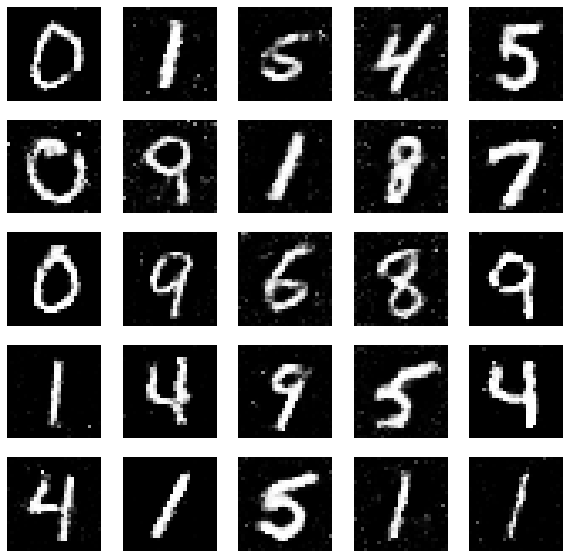

24000 [D loss: 0.553197, acc.: 69.92%] [G loss: 1.363672]


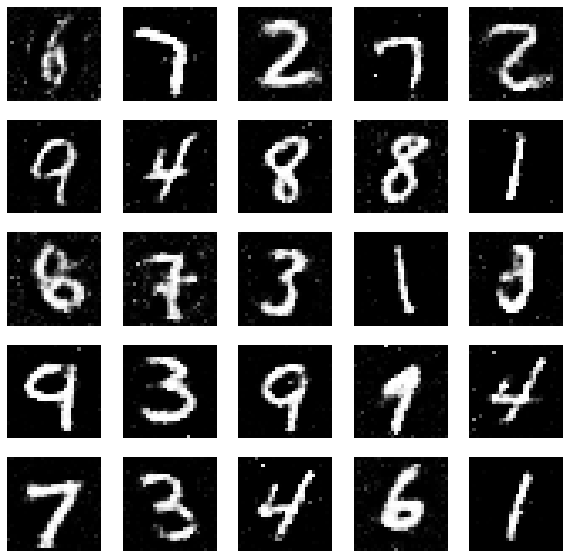

24150 [D loss: 0.584451, acc.: 68.36%] [G loss: 1.099398]


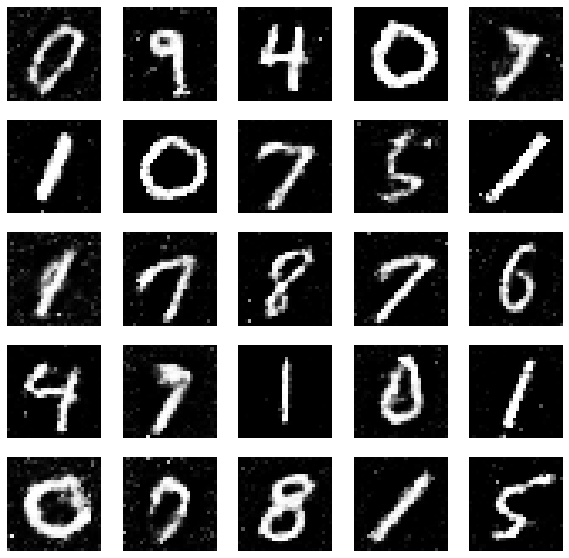

24300 [D loss: 0.533736, acc.: 71.09%] [G loss: 1.145387]


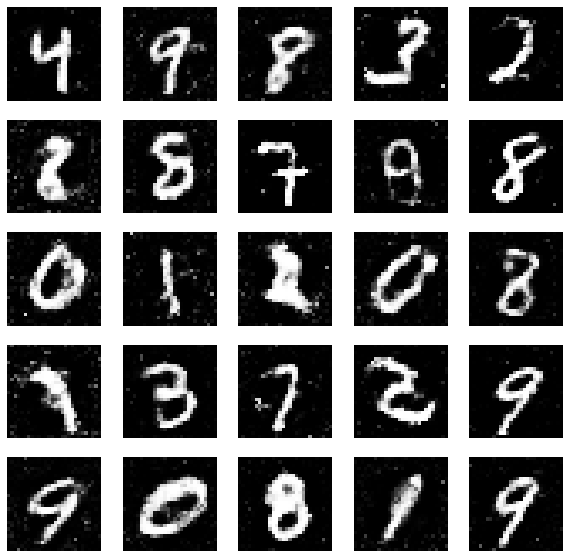

24450 [D loss: 0.554003, acc.: 71.48%] [G loss: 1.086285]


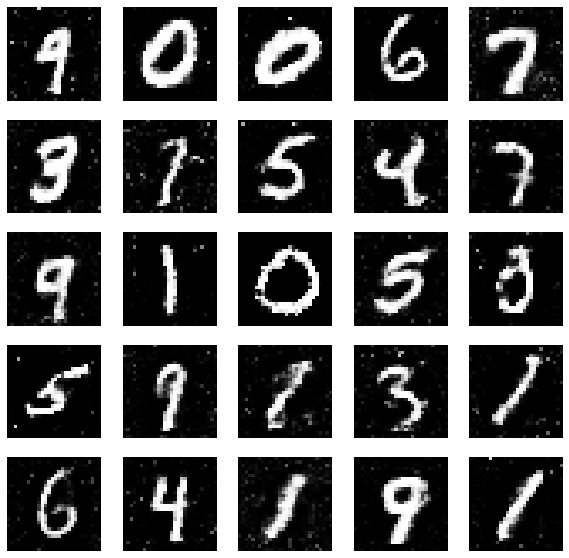

24600 [D loss: 0.529202, acc.: 69.14%] [G loss: 1.202615]


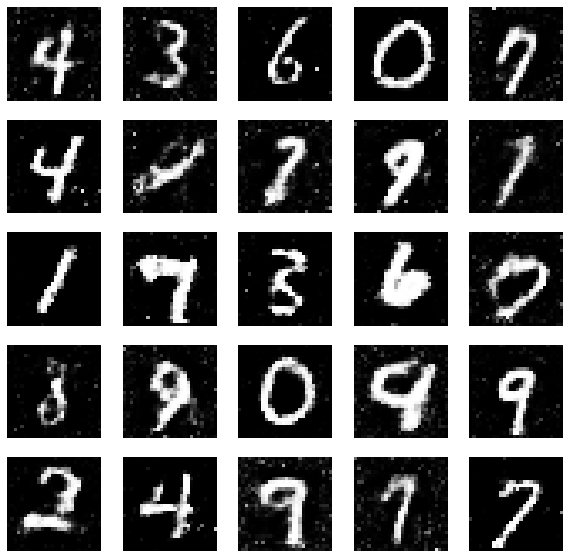

24750 [D loss: 0.580788, acc.: 68.75%] [G loss: 1.166285]


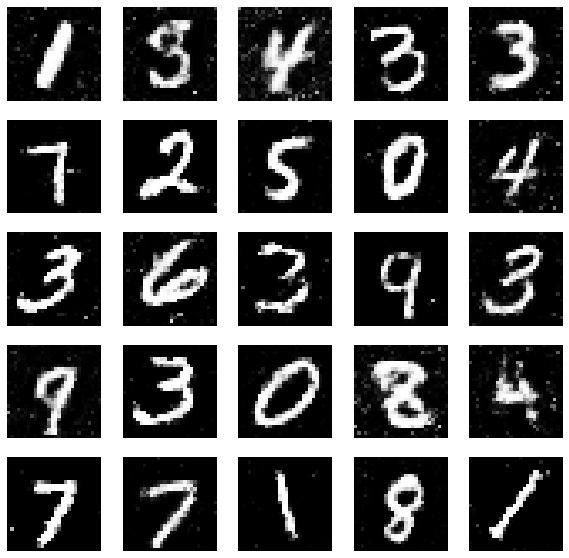

24900 [D loss: 0.624161, acc.: 64.45%] [G loss: 1.079911]


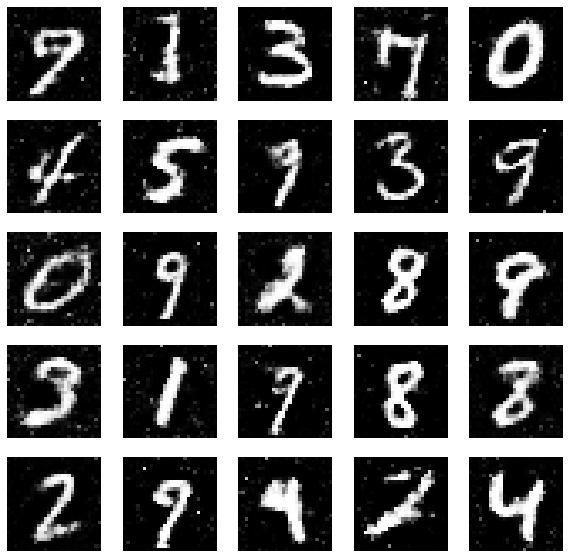

25050 [D loss: 0.521764, acc.: 72.27%] [G loss: 1.146570]


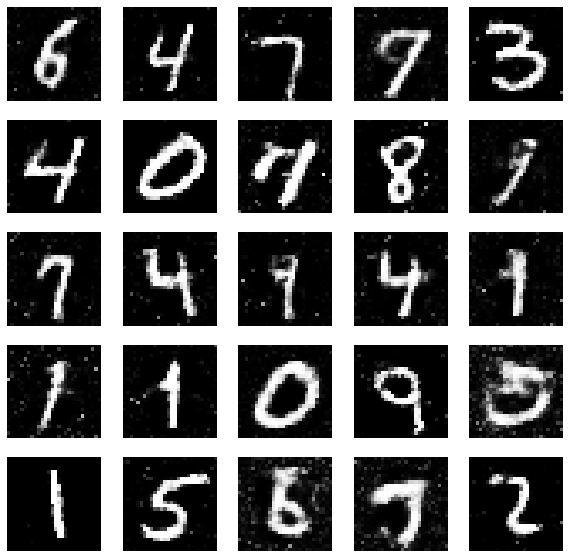

25200 [D loss: 0.539606, acc.: 73.05%] [G loss: 1.214497]


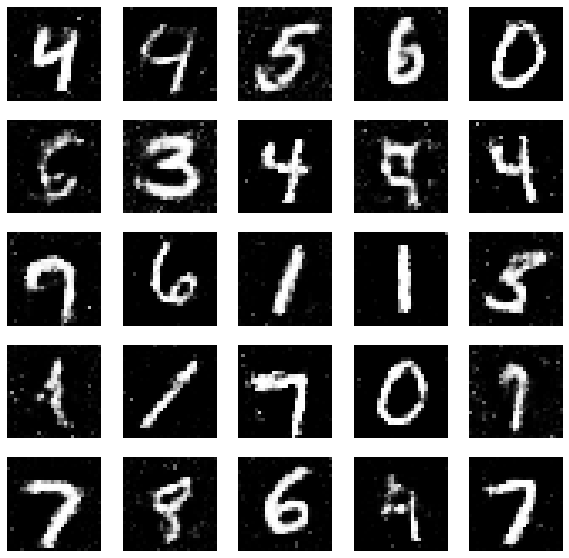

25350 [D loss: 0.566988, acc.: 69.53%] [G loss: 1.098610]


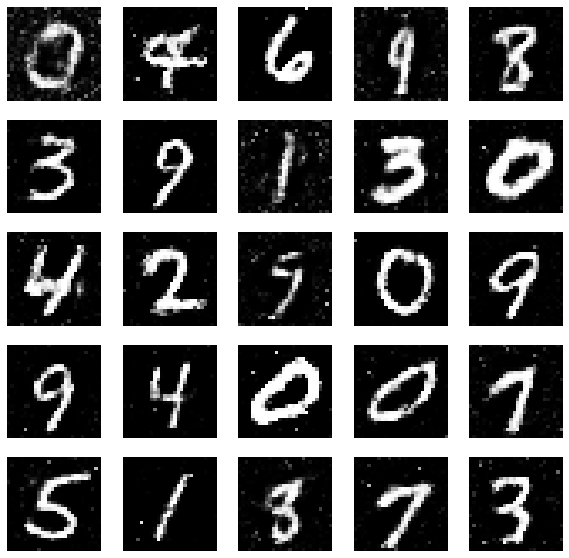

25500 [D loss: 0.576366, acc.: 71.09%] [G loss: 1.135535]


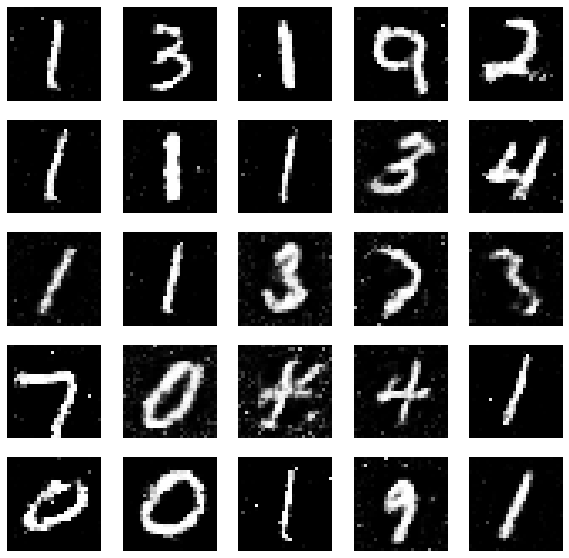

25650 [D loss: 0.570825, acc.: 69.14%] [G loss: 1.259830]


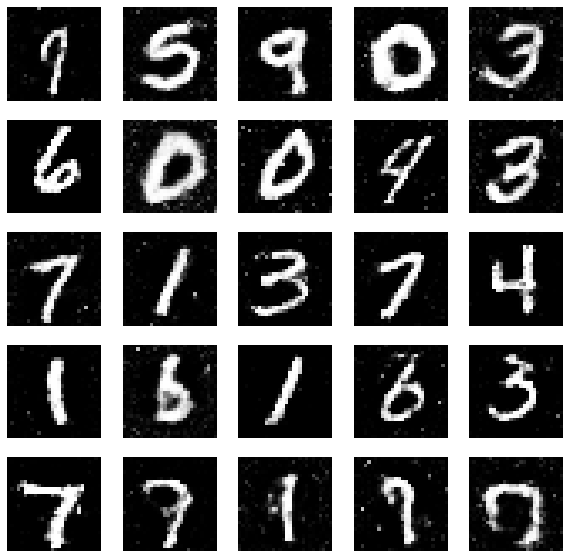

25800 [D loss: 0.580069, acc.: 68.36%] [G loss: 1.212955]


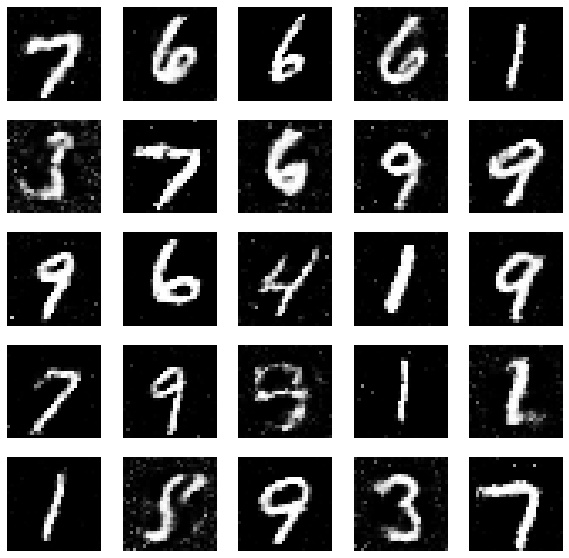

25950 [D loss: 0.569340, acc.: 67.58%] [G loss: 1.193129]


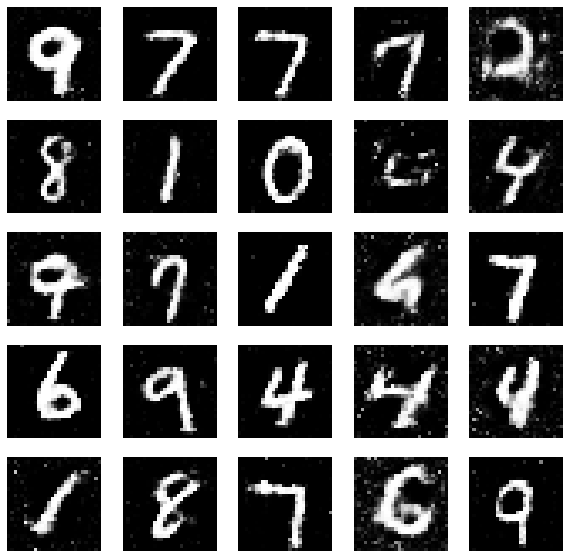

26100 [D loss: 0.594657, acc.: 64.45%] [G loss: 1.189983]


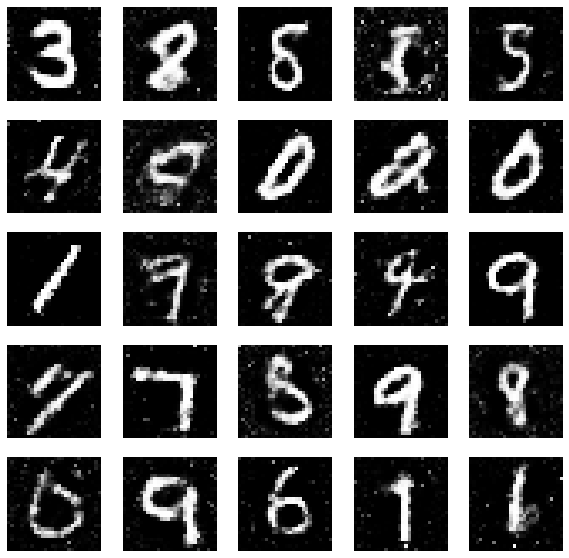

26250 [D loss: 0.606403, acc.: 66.02%] [G loss: 1.182033]


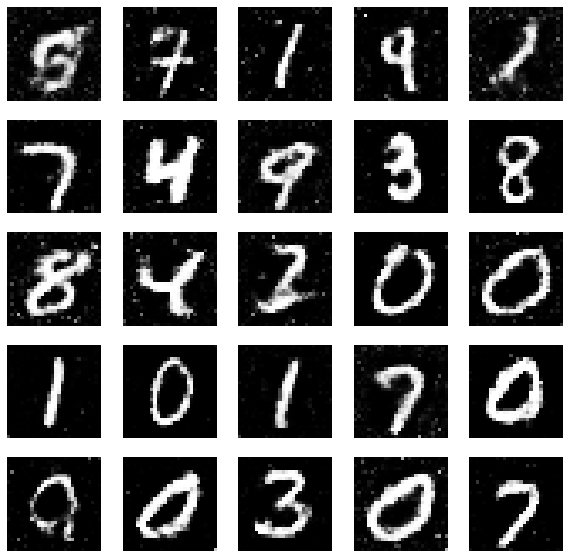

26400 [D loss: 0.520987, acc.: 71.88%] [G loss: 1.120607]


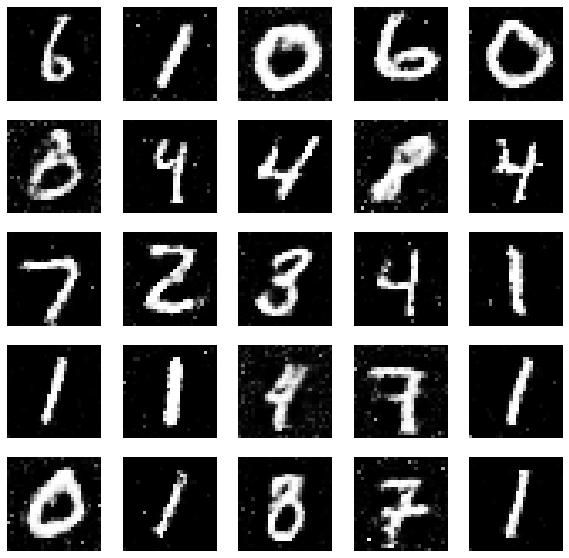

26550 [D loss: 0.581088, acc.: 67.19%] [G loss: 1.152289]


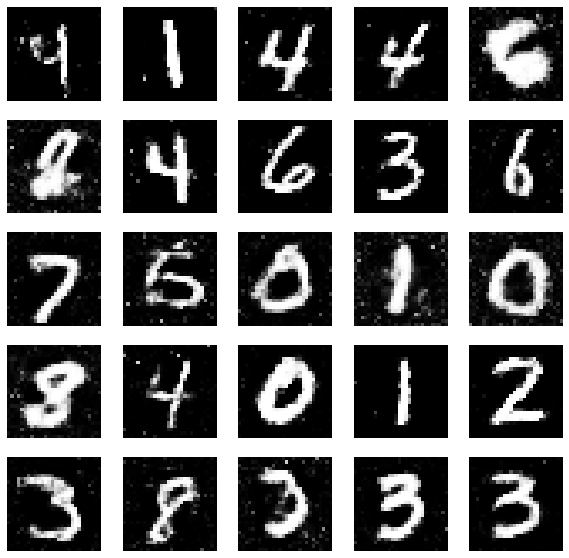

26700 [D loss: 0.567477, acc.: 69.92%] [G loss: 1.159237]


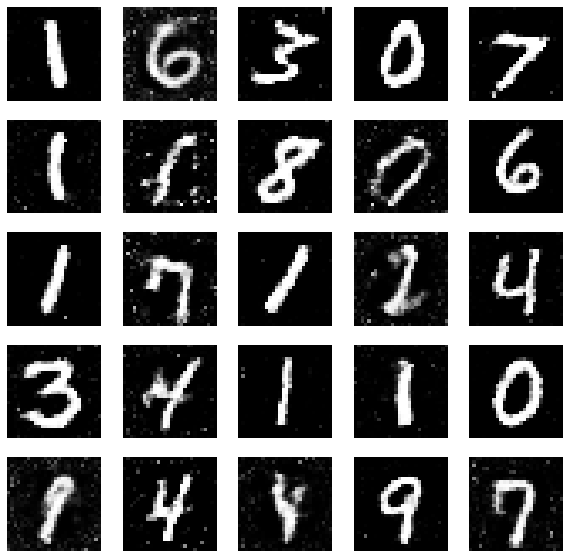

26850 [D loss: 0.533780, acc.: 72.66%] [G loss: 1.120747]


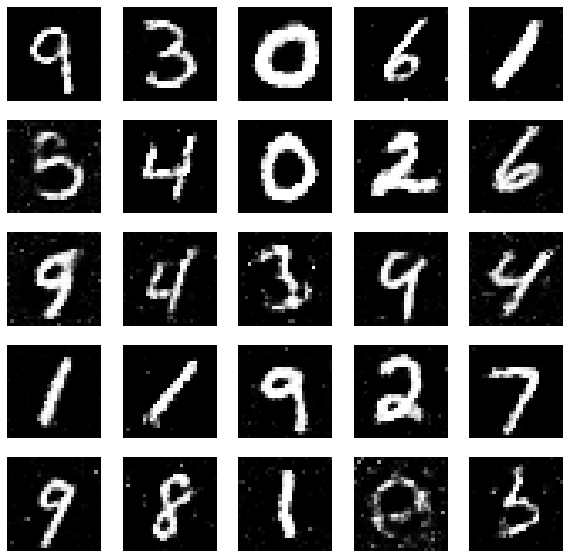

27000 [D loss: 0.566999, acc.: 71.09%] [G loss: 1.257196]


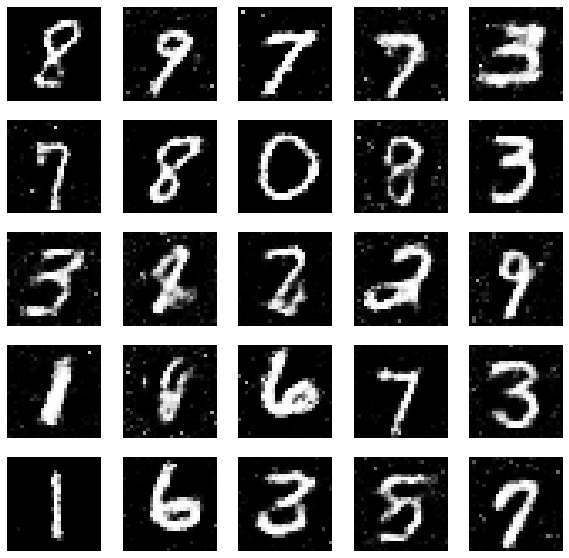

27150 [D loss: 0.560927, acc.: 69.53%] [G loss: 1.116919]


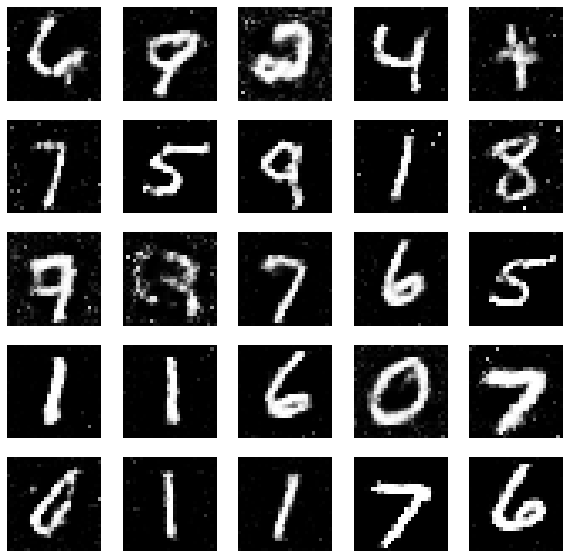

27300 [D loss: 0.578086, acc.: 70.31%] [G loss: 1.132507]


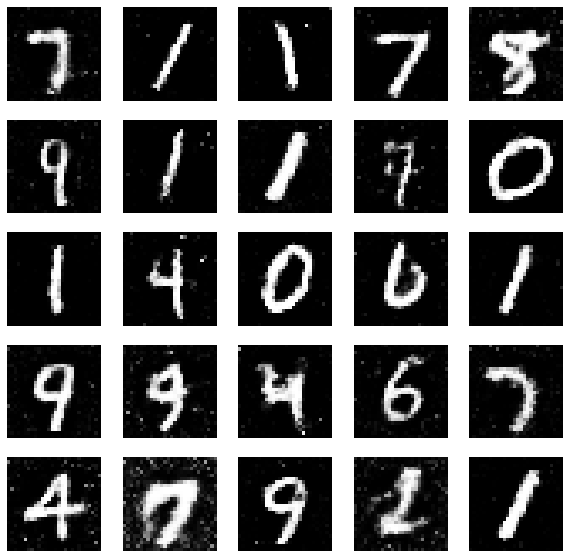

27450 [D loss: 0.562700, acc.: 70.70%] [G loss: 1.184717]


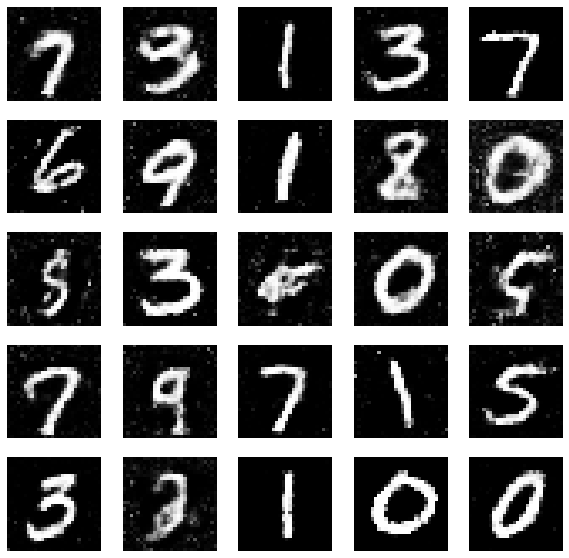

27600 [D loss: 0.511569, acc.: 73.44%] [G loss: 1.187103]


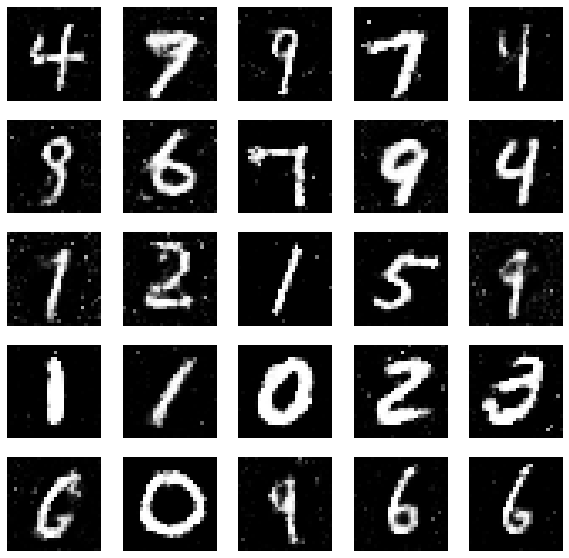

27750 [D loss: 0.569035, acc.: 71.09%] [G loss: 1.263115]


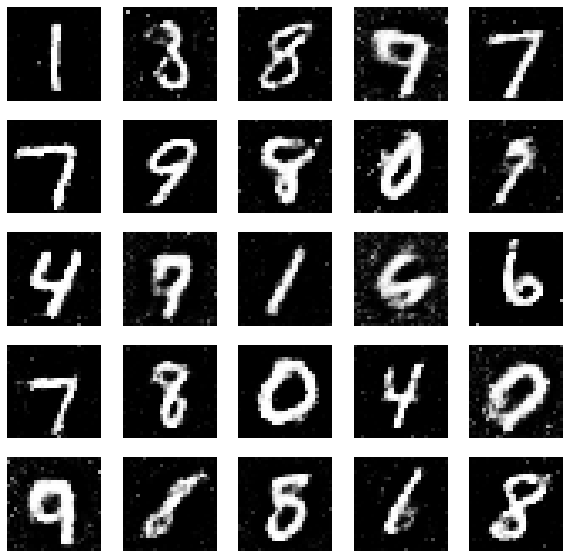

27900 [D loss: 0.551606, acc.: 70.31%] [G loss: 1.243786]


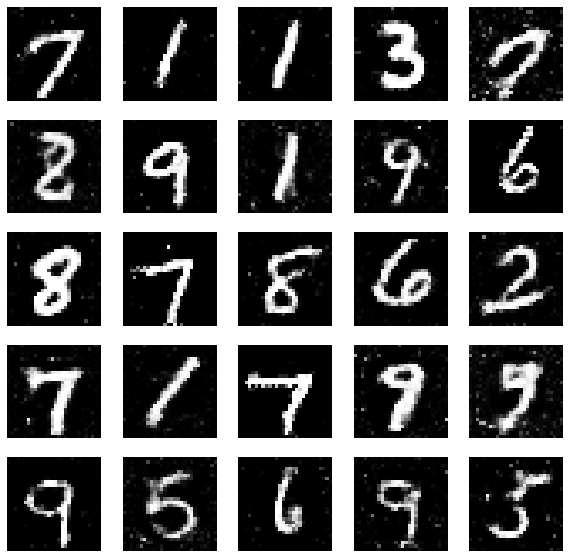

28050 [D loss: 0.595984, acc.: 69.14%] [G loss: 1.120017]


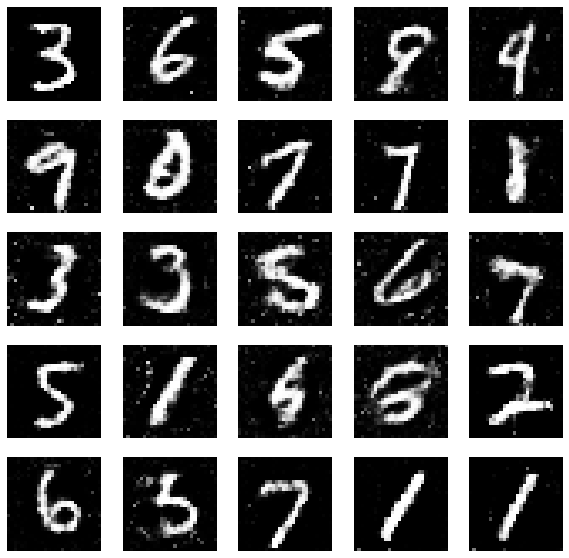

28200 [D loss: 0.583871, acc.: 68.36%] [G loss: 1.279832]


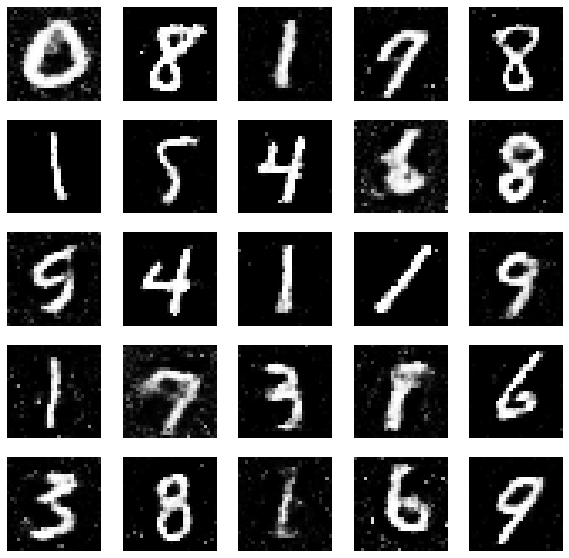

28350 [D loss: 0.539197, acc.: 71.48%] [G loss: 1.188985]


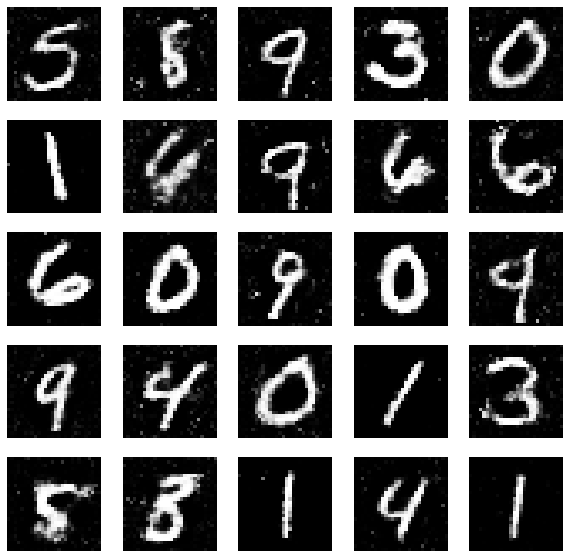

28500 [D loss: 0.552097, acc.: 72.66%] [G loss: 1.239480]


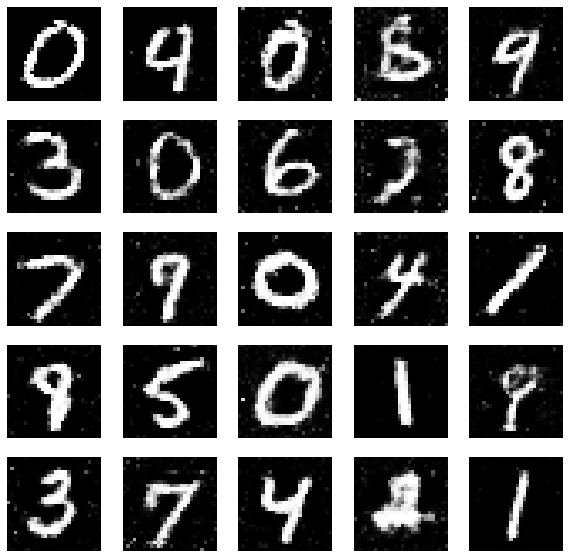

28650 [D loss: 0.563469, acc.: 69.14%] [G loss: 1.240102]


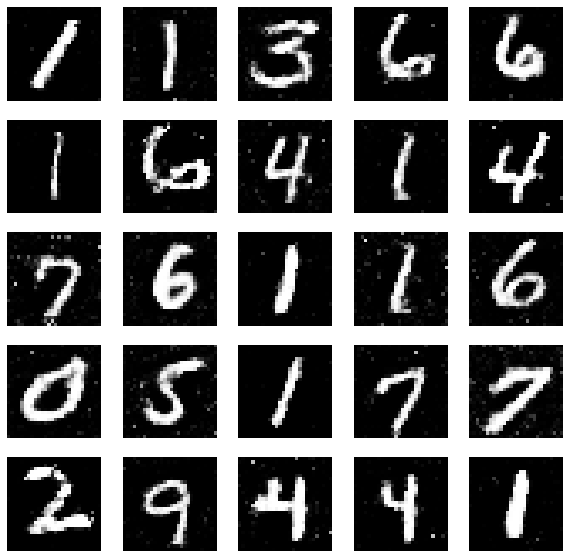

28800 [D loss: 0.556064, acc.: 74.22%] [G loss: 1.257079]


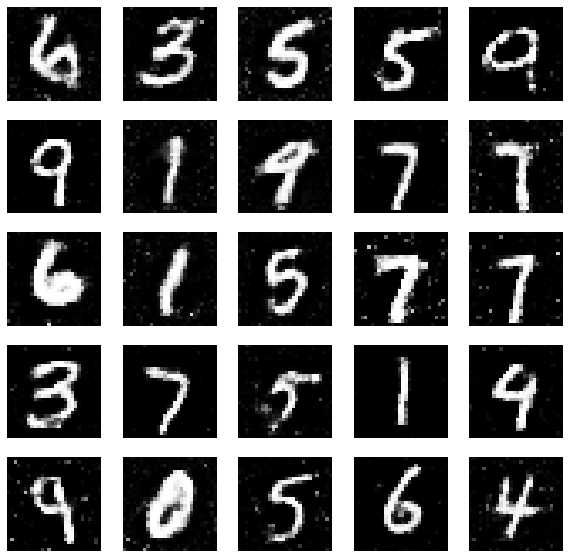

28950 [D loss: 0.559990, acc.: 69.92%] [G loss: 1.108192]


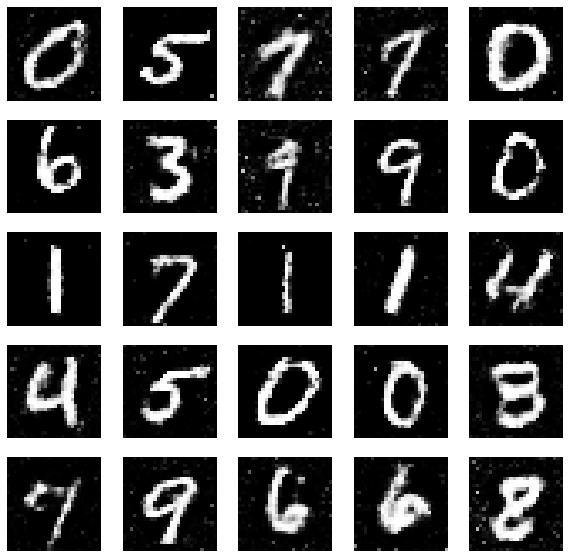

29100 [D loss: 0.598113, acc.: 72.27%] [G loss: 1.182754]


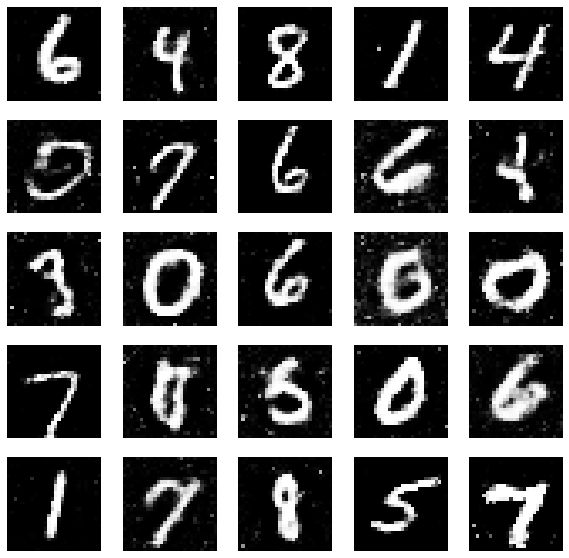

29250 [D loss: 0.551959, acc.: 68.75%] [G loss: 1.161186]


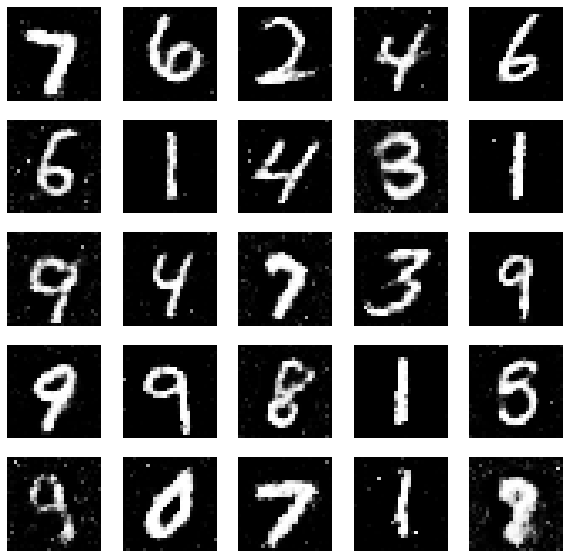

29400 [D loss: 0.549312, acc.: 71.88%] [G loss: 1.266124]


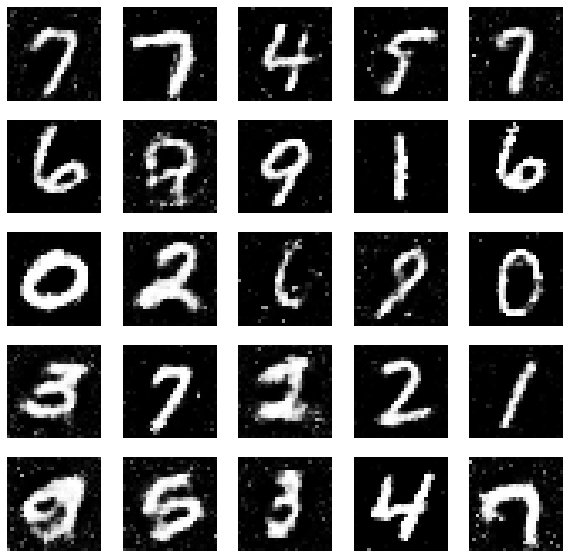

29550 [D loss: 0.581211, acc.: 68.36%] [G loss: 1.204580]


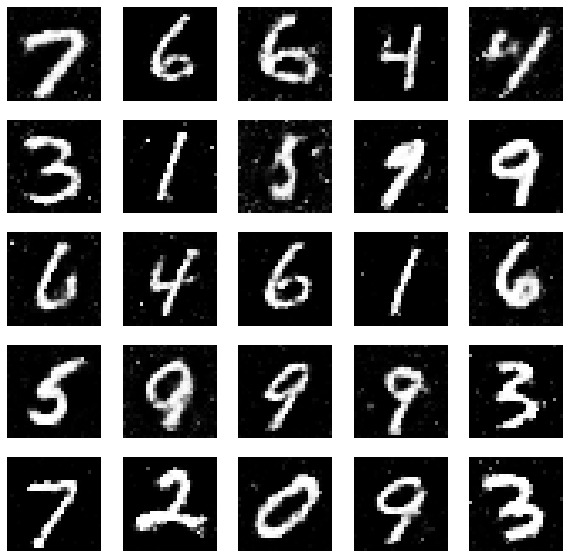

29700 [D loss: 0.567590, acc.: 68.36%] [G loss: 1.266119]


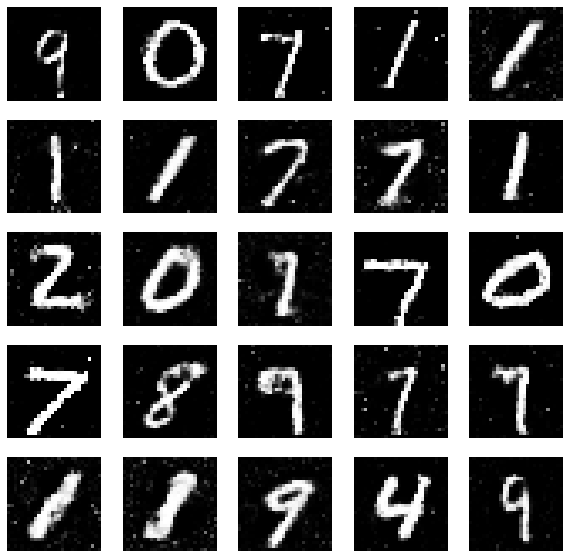

29850 [D loss: 0.570118, acc.: 70.70%] [G loss: 1.206303]


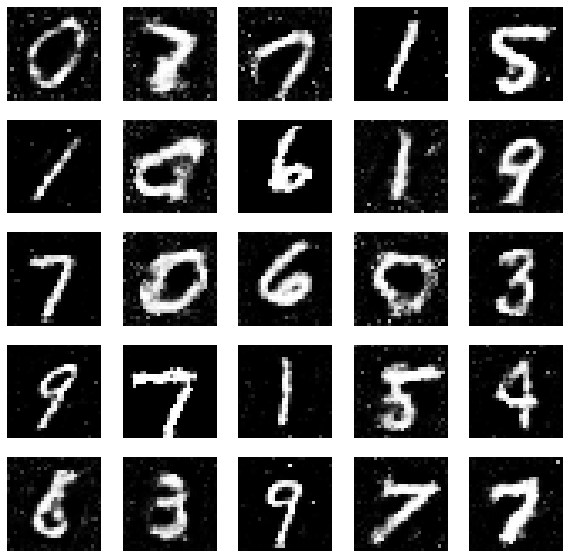

29999 [D loss: 0.546905, acc.: 70.70%] [G loss: 1.146131]


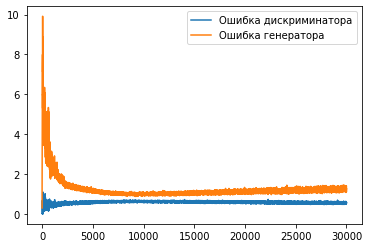

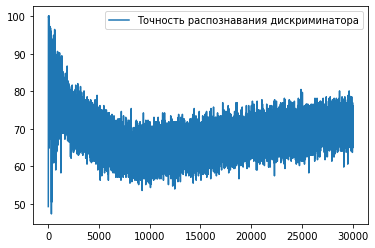

In [ ]:
# Вызываем функцию create_generator и записываем значение в переменную generator
generator = create_generator()

# Вызываем функцию create_discriminator и записываем значение в переменную discriminator
discriminator = create_discriminator()

# Запускаем функцию GAN с параметрами, generator, discriminator (30000 - количество эпох)
GAN_algoritm (generator,
              discriminator,
              30000,
              batch_size=128)

## Сверточный Генератор

Итак! Мы создали с вами простой полносвязный GAN, который показал довольно неплохие результаты. В качестве эксперимента, давайте попробуем проделать те же шаги, но создадим GAN на базе сверточных слоев.

In [ ]:
random_vec = 100 # Задаем размер N-мерного вектора

In [ ]:
def create_conv_generator():

  noise = Input(shape=(random_vec,)) # Создаем вход размером random_vec - вектор со случайным номрмальным распределением - шум

  gen = Dense(1024)(noise) # Подаем шум на полносвязный слой, размер слоя выбран так, что бы его можно было преобразовать в удобный для нас размер
  gen = LeakyReLU(alpha=0.2) (gen) # Применяем активационную ф-ю LeakyReLU с параметром наклона 0.2
  gen = BatchNormalization()(gen) # Добавляем слой нормализации
  gen = Dropout(dropout_rait)(gen)
  gen = Reshape((32,32,1))(gen) # Преобразуем входящий вектор в тензор 1024 --> 32 * 32 * 1
  gen = Conv2D(16,(3,3), padding='same')(gen) # Применяем сверточный слой
  gen = LeakyReLU(alpha=0.2) (gen)
  gen = BatchNormalization()(gen)
  gen = Dense(256) (gen)
  gen = LeakyReLU(alpha=0.2) (gen)
  gen = BatchNormalization()(gen)
  gen = Conv2D(22,(3,3), padding='same')(gen) # Применяем сверточный слой
  gen = LeakyReLU(alpha=0.2) (gen)
  gen = BatchNormalization(momentum=0.8)(gen)
  gen = Flatten()(gen) # Вытягиваем тезор в вектор
  gen = Dense(784, activation='tanh')(gen)
  img = Reshape((28,28,1))(gen)

  model = Model(noise,img)
  return model

In [ ]:
# создаем генератор
conv_gen = create_conv_generator()

# выводем информацию о нейронной сети
conv_gen.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense_16 (Dense)            (None, 1024)              103424    
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 1024)              0         
                                                                 
 batch_normalization_6 (Batc  (None, 1024)             4096      
 hNormalization)                                                 
                                                                 
 dropout_6 (Dropout)         (None, 1024)              0         
                                                                 
 reshape_2 (Reshape)         (None, 32, 32, 1)         0         
                                                           

## Сверточный Дискриминатор

In [ ]:
def create_conv_discriminator(): # Функция создания сверточного дискрминатора

  img = Input(shape=img_shape) # Создаем слой Input (записываем входные данные размерностью (img_rows, img_cols, channels) в img)

  conv_disc = Conv2D(4, (3,3), padding="same")(img) # Создаем слой  Conv2D (размерность входных данных (img_shape), ядро свертки = 2, окно свертки = (3,3))
  conv_disc = LeakyReLU(alpha=0.2)(conv_disc) # Применяем активационную ф-ю LeakyReLU с параметром наклона 0.2
  conv_disc = Flatten()(conv_disc) # Добавляем слой Flatten ()
  conv_disc = Dense(512)(conv_disc) # Добавляем Dense-слой на 512 нейронов
  conv_disc = LeakyReLU(alpha=0.2)(conv_disc) # Добавляем слой активационной функции с параметром 0.2
  classifier = Dense(1, activation='sigmoid')(conv_disc) # Добавляем Dense-слой c 1 нейроном с активационной функцией sigmoid

  discriminator_conv = Model(img, classifier) # Создаем модель discriminator_conv (входные данные: img, выходные данные: classifier)

  # Компилируем модель дискриманотра
  discriminator_conv.compile(loss='binary_crossentropy', # Компилируем модель, выбираем ф-ю ошибки бинраная кроссэнтропия
              optimizer=Adam(0.0002, 0.5), # Выбираем оптимизатор Адам с рекомендованными параметрами lr=0.0002, уменьшаем импульс β1 с 0.9 (по умолчанию)
                                           # до 0.5 что бы уменьшить колебания и увеличить стабильность обучения
              metrics=['accuracy'])

  discriminator_conv.trainable = False  # Замораживаем обучение дискриматора

  return discriminator_conv # Функция возвращает discriminator_conv

In [ ]:
# создаем дискриминатор
conv_disc = create_conv_discriminator()

# выводем информацию о нейронной сети
conv_disc.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 4)         40        
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 28, 28, 4)         0         
                                                                 
 flatten_3 (Flatten)         (None, 3136)              0         
                                                                 
 dense_19 (Dense)            (None, 512)               1606144   
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_20 (Dense)            (None, 1)                 513 

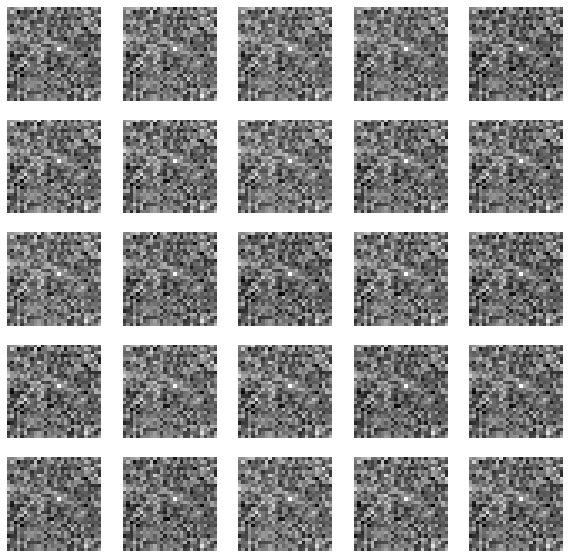

0 [D loss: 0.699788, acc.: 57.03%] [G loss: 0.656533]


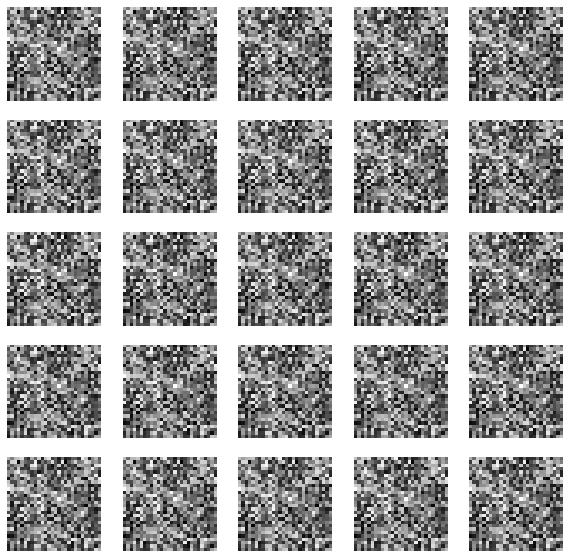

150 [D loss: 0.000141, acc.: 100.00%] [G loss: 0.000071]


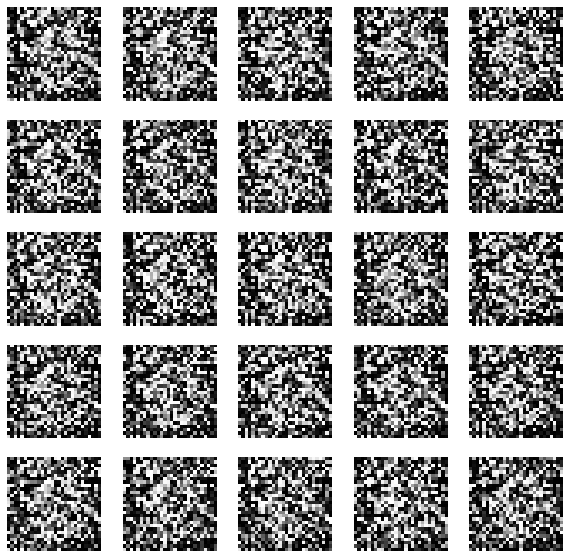

300 [D loss: 0.000274, acc.: 100.00%] [G loss: 0.000505]


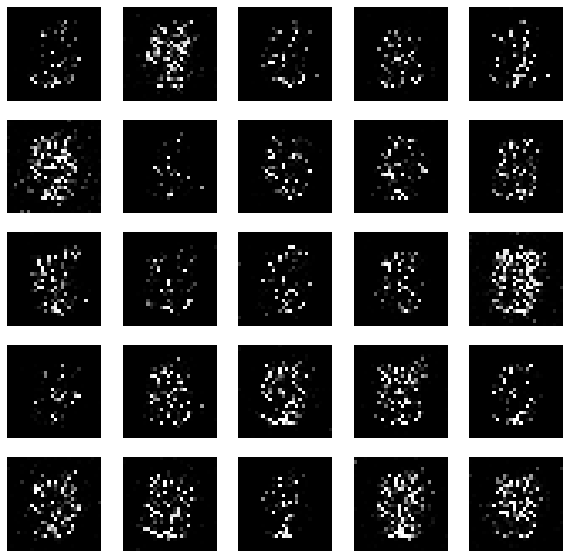

450 [D loss: 0.289619, acc.: 94.53%] [G loss: 1.778941]


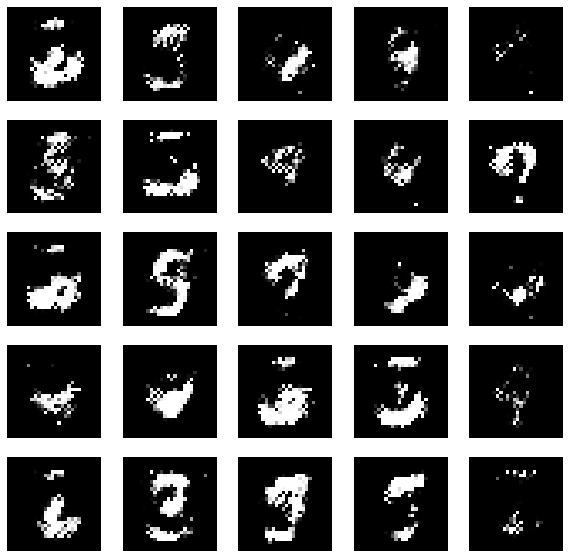

600 [D loss: 0.364216, acc.: 89.45%] [G loss: 1.731381]


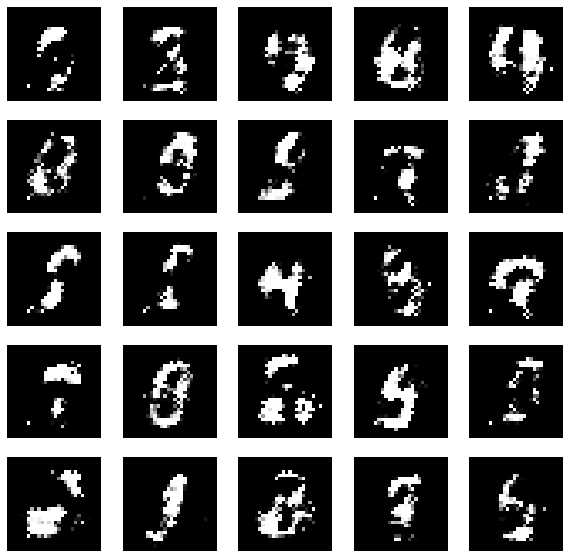

750 [D loss: 0.343255, acc.: 87.89%] [G loss: 2.069624]


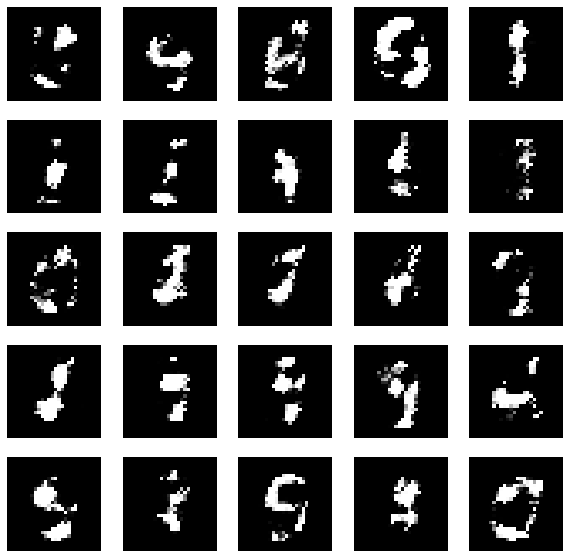

900 [D loss: 0.268654, acc.: 91.80%] [G loss: 2.165125]


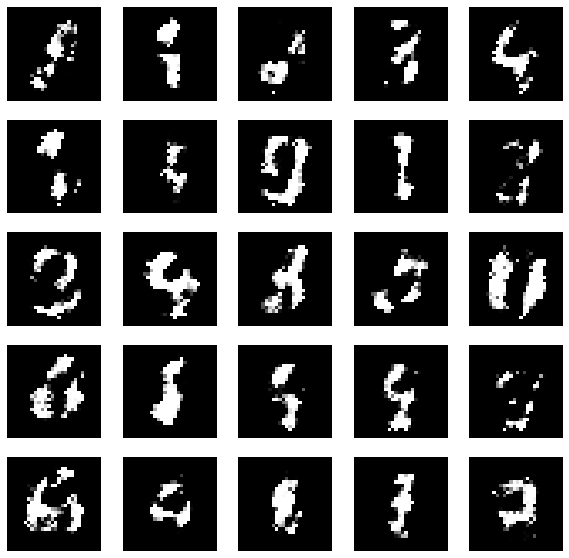

999 [D loss: 0.198163, acc.: 96.48%] [G loss: 2.343774]


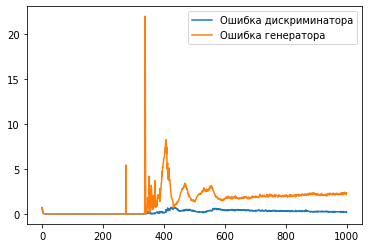

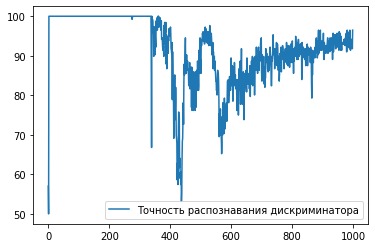

In [ ]:
# создаем генератор
conv_gen = create_conv_generator()

# создаем дискриминатор
conv_disc = create_conv_discriminator()

# Запускаем функцию GAN с параметрами, generator, discriminator (1000 - количество эпох)
GAN_algoritm (conv_gen,
              conv_disc,
              1000,
              batch_size=128)

Шум практически пропал, но вот очертания цифр далеки от идеальных. Давайте запустим наше обучение на 30тысяч эпох:

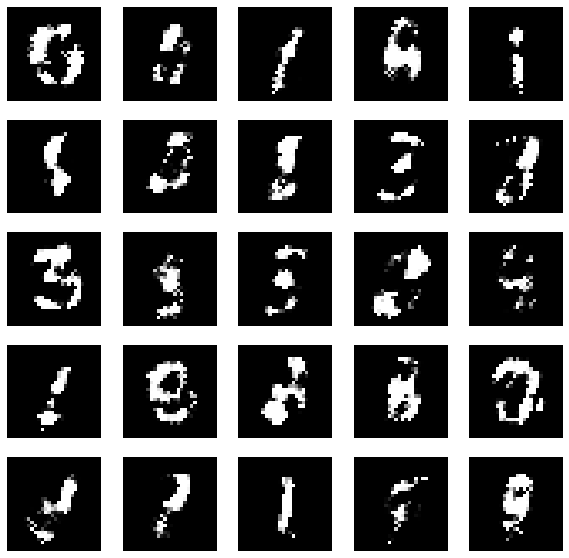

0 [D loss: 0.231617, acc.: 92.58%] [G loss: 2.291214]


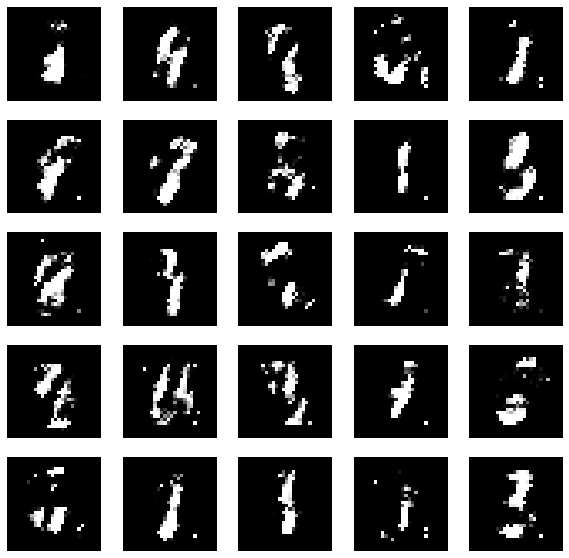

150 [D loss: 0.171646, acc.: 95.70%] [G loss: 2.781206]


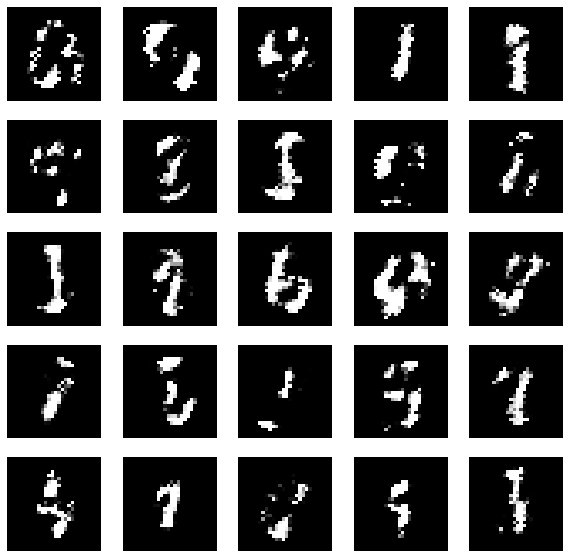

300 [D loss: 0.180247, acc.: 95.31%] [G loss: 2.577927]


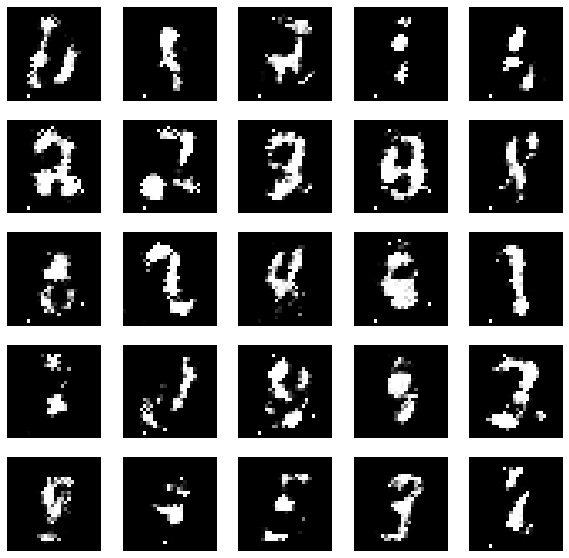

450 [D loss: 0.194312, acc.: 94.53%] [G loss: 3.022603]


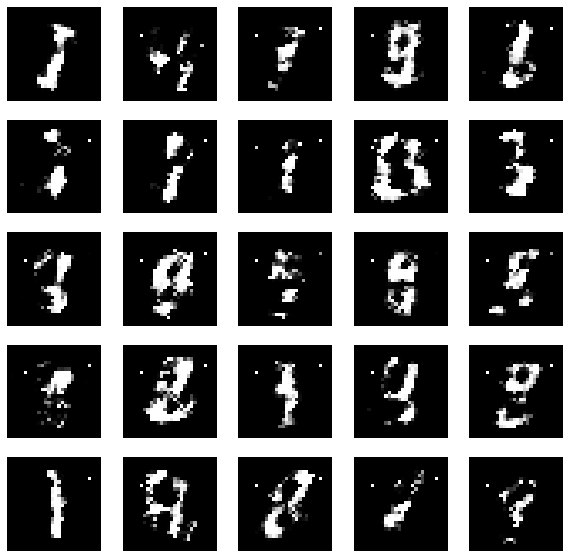

600 [D loss: 0.239193, acc.: 90.62%] [G loss: 2.930236]


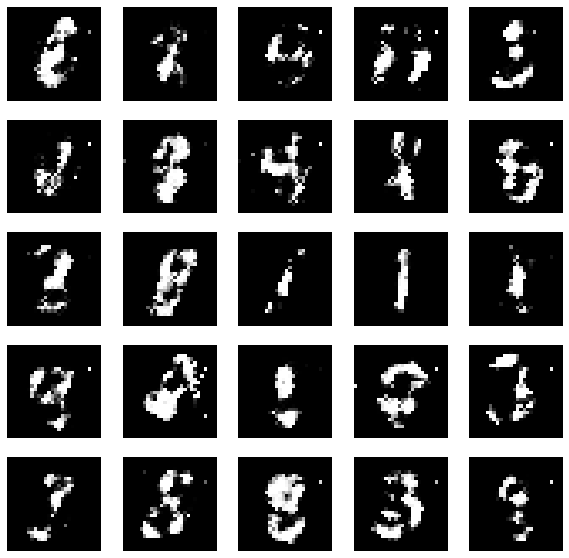

750 [D loss: 0.230013, acc.: 89.45%] [G loss: 3.060183]


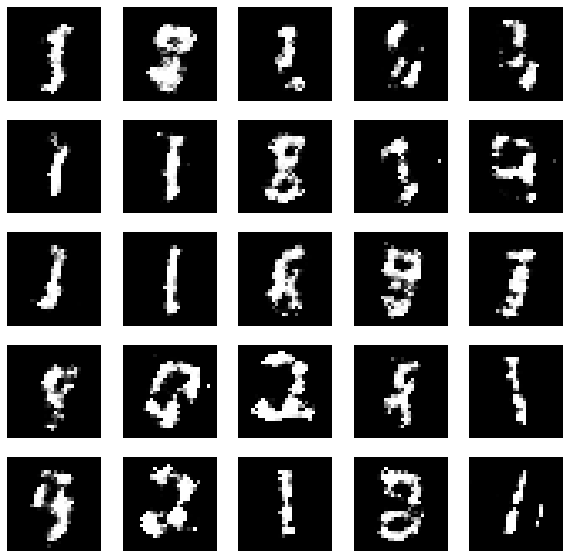

900 [D loss: 0.210013, acc.: 93.36%] [G loss: 3.149378]


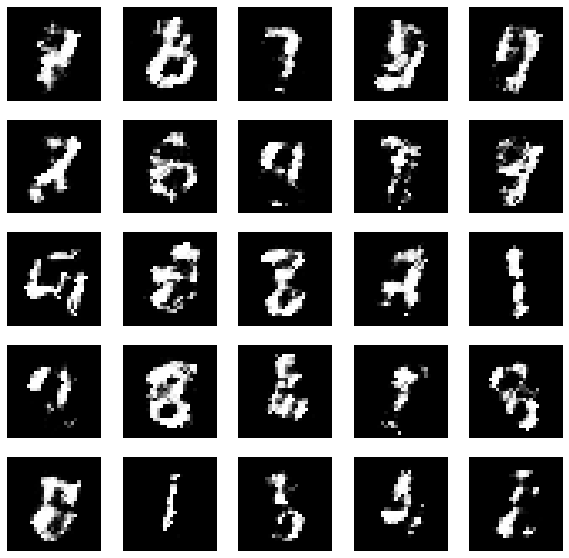

1050 [D loss: 0.263097, acc.: 91.80%] [G loss: 2.549778]


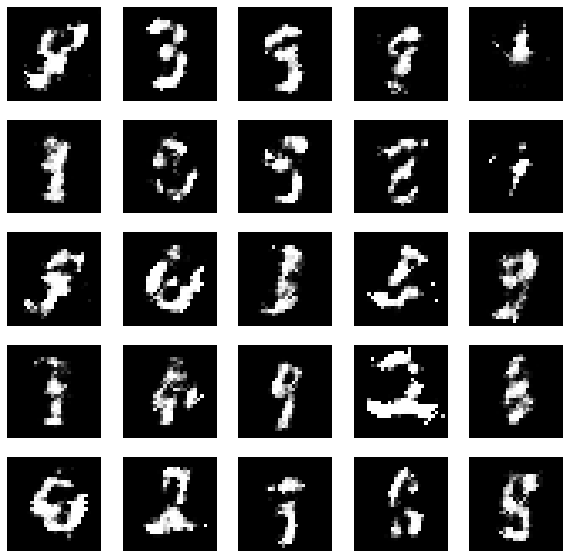

1200 [D loss: 0.288940, acc.: 89.45%] [G loss: 2.563241]


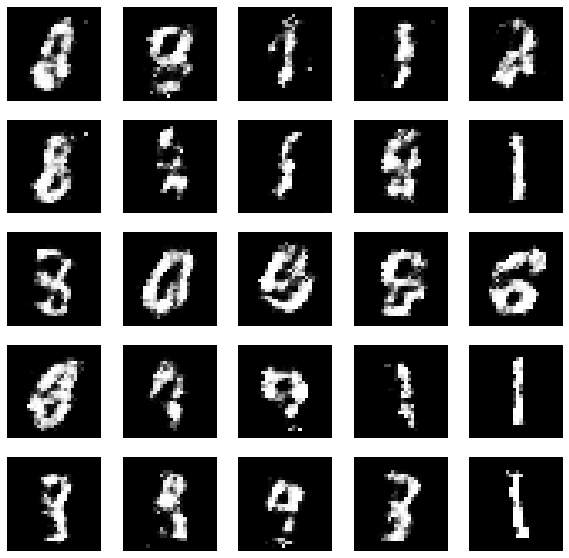

1350 [D loss: 0.366041, acc.: 87.89%] [G loss: 2.033041]


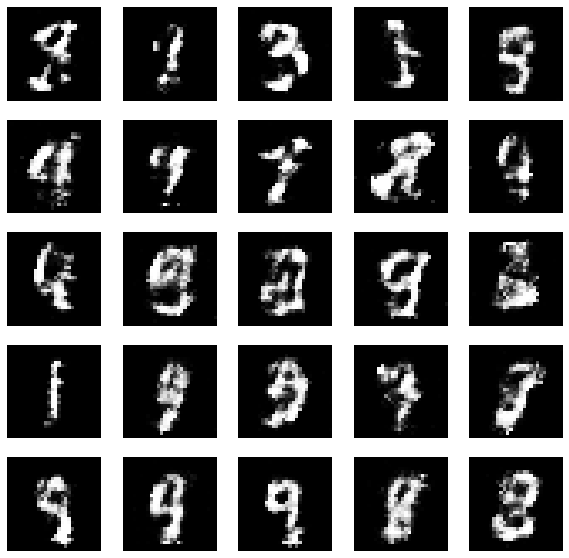

1500 [D loss: 0.470178, acc.: 79.69%] [G loss: 1.657403]


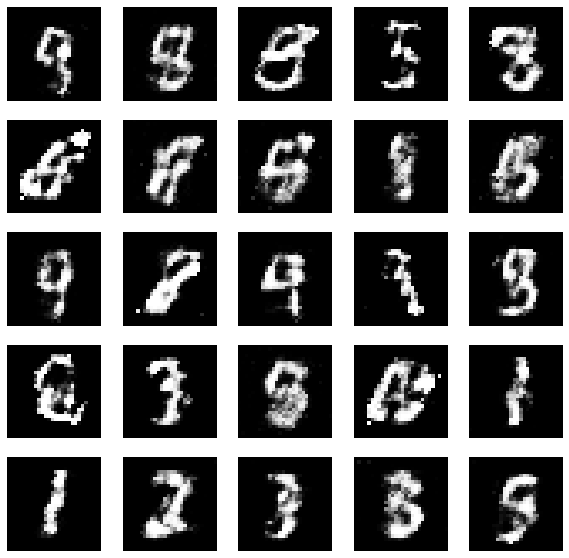

1650 [D loss: 0.459802, acc.: 76.95%] [G loss: 1.645992]


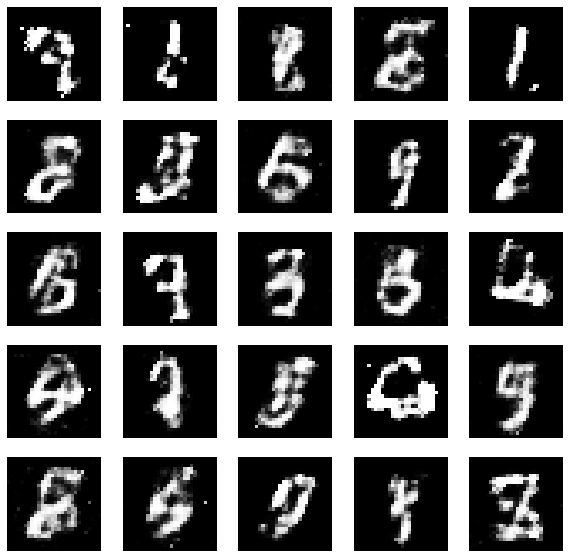

1800 [D loss: 0.496061, acc.: 76.17%] [G loss: 1.438856]


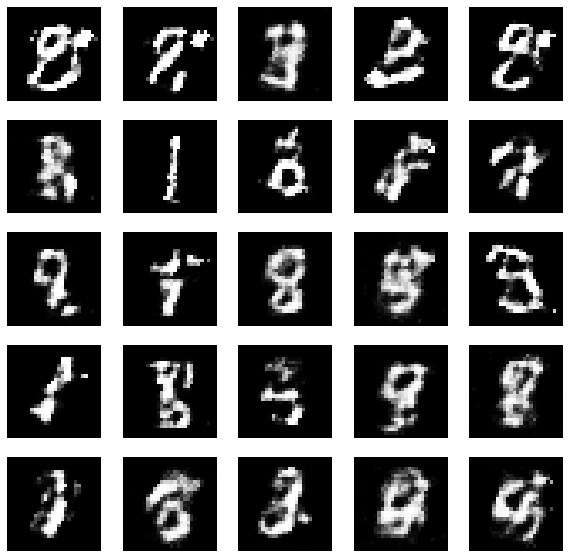

1950 [D loss: 0.547726, acc.: 73.83%] [G loss: 1.484471]


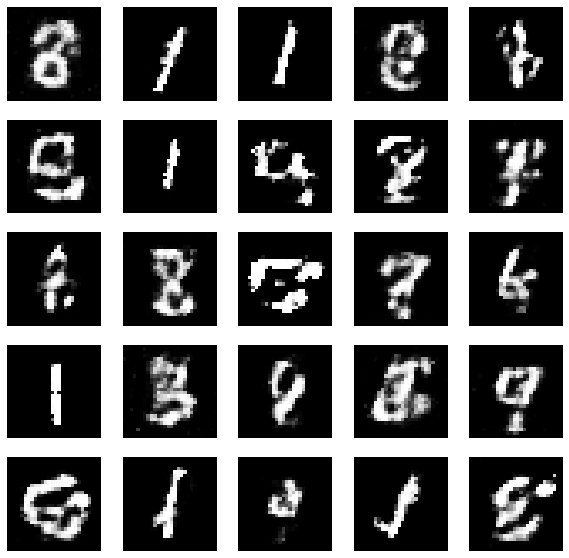

2100 [D loss: 0.543832, acc.: 75.78%] [G loss: 1.292185]


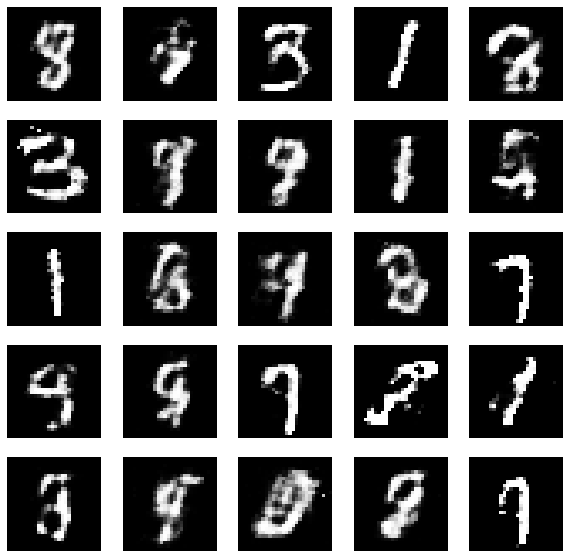

2250 [D loss: 0.568691, acc.: 73.83%] [G loss: 1.488790]


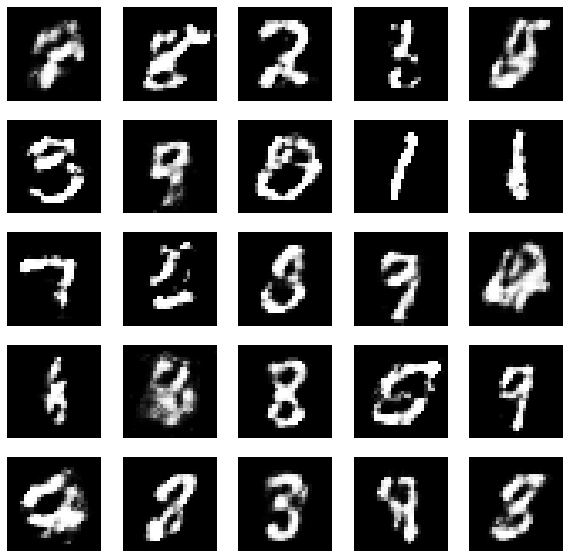

2400 [D loss: 0.478360, acc.: 82.03%] [G loss: 1.566246]


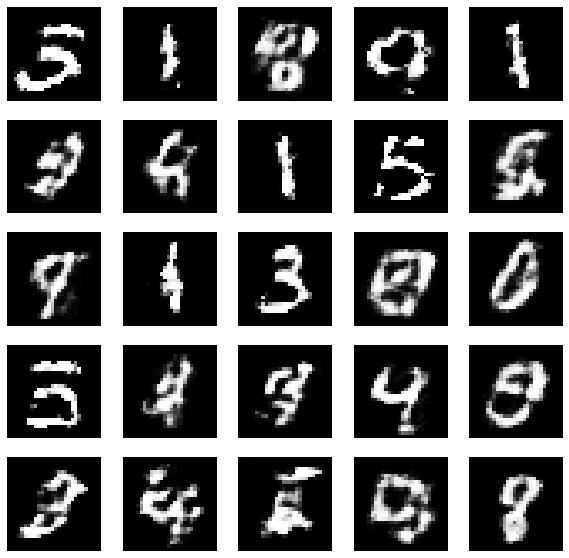

2550 [D loss: 0.534628, acc.: 75.39%] [G loss: 1.406435]


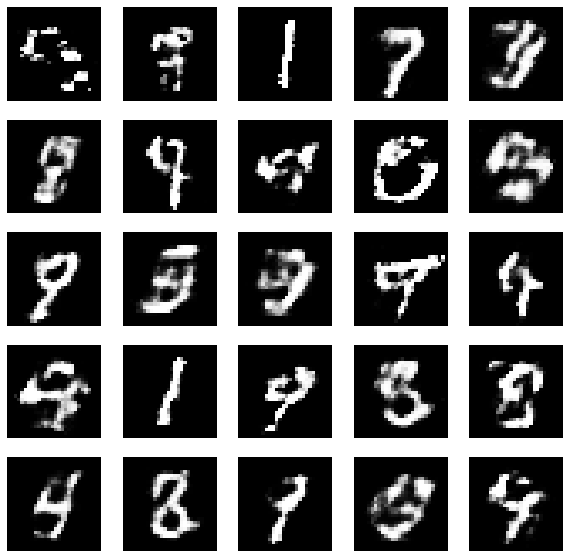

2700 [D loss: 0.488879, acc.: 76.56%] [G loss: 1.584531]


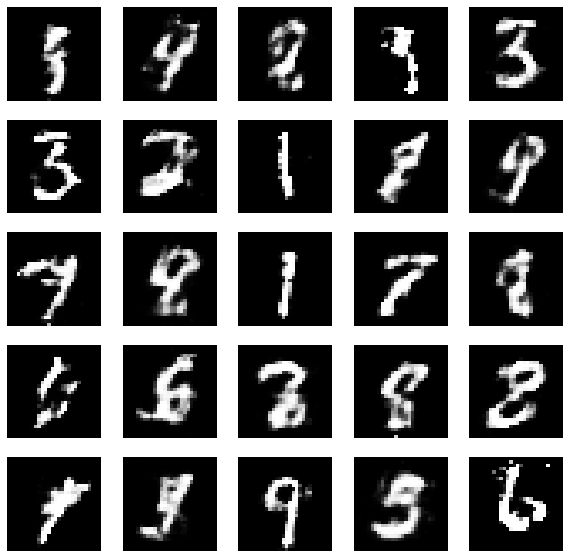

2850 [D loss: 0.525150, acc.: 73.83%] [G loss: 1.435058]


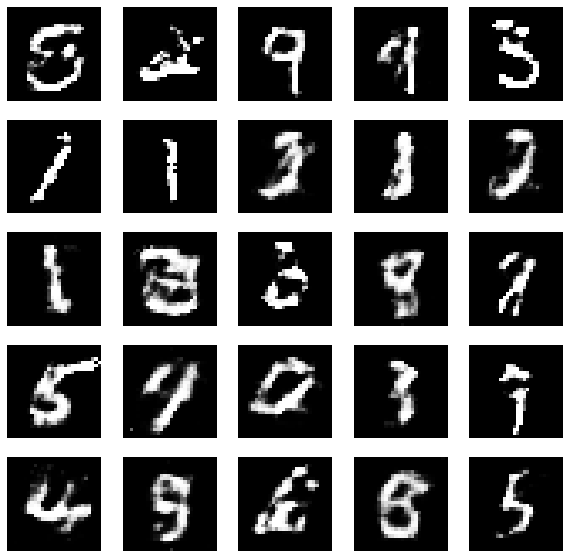

3000 [D loss: 0.553799, acc.: 77.34%] [G loss: 1.488860]


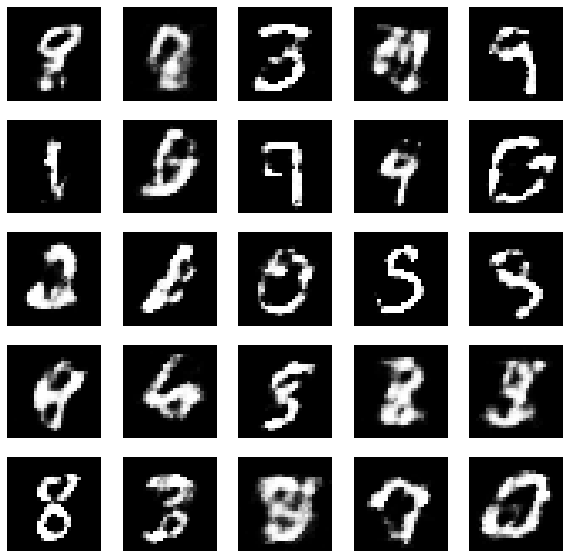

3150 [D loss: 0.515294, acc.: 76.95%] [G loss: 1.538977]


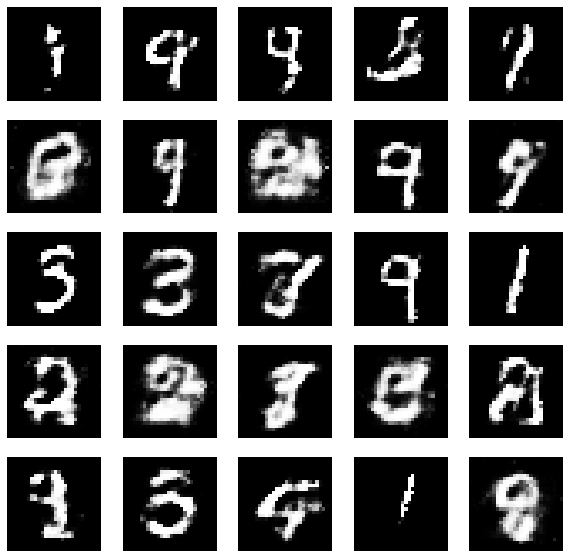

3300 [D loss: 0.528221, acc.: 72.27%] [G loss: 1.471265]


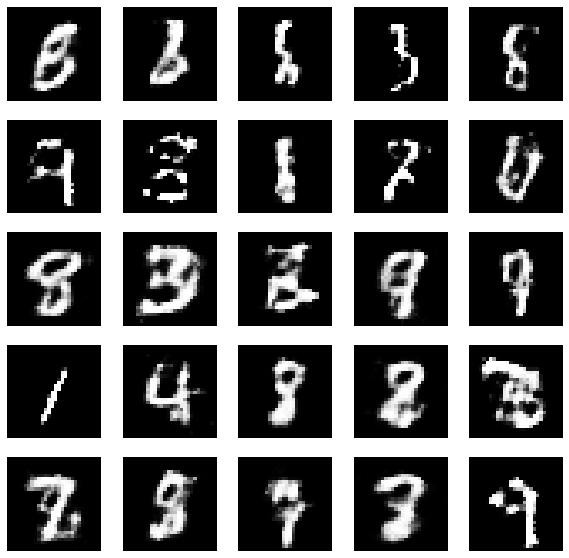

3450 [D loss: 0.504879, acc.: 77.34%] [G loss: 1.537166]


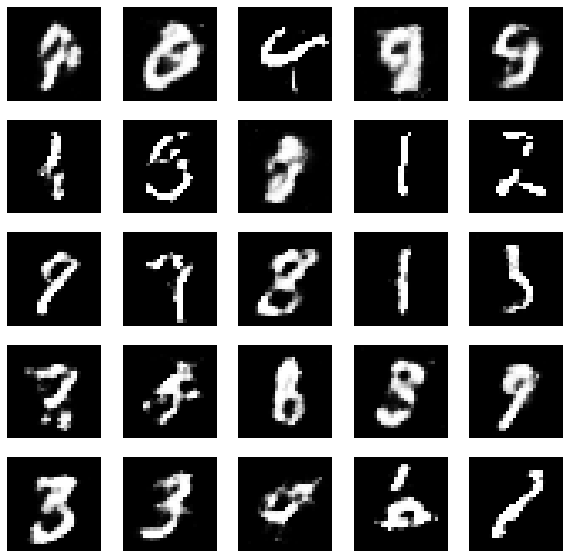

3600 [D loss: 0.528798, acc.: 76.56%] [G loss: 1.565824]


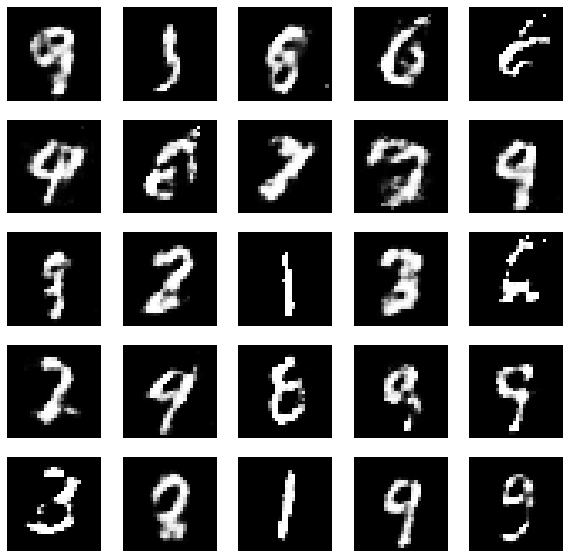

3750 [D loss: 0.508670, acc.: 73.05%] [G loss: 1.605227]


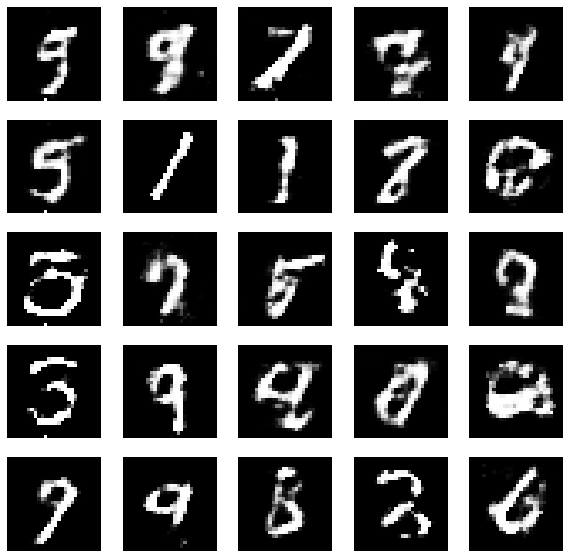

3900 [D loss: 0.485875, acc.: 78.12%] [G loss: 1.629364]


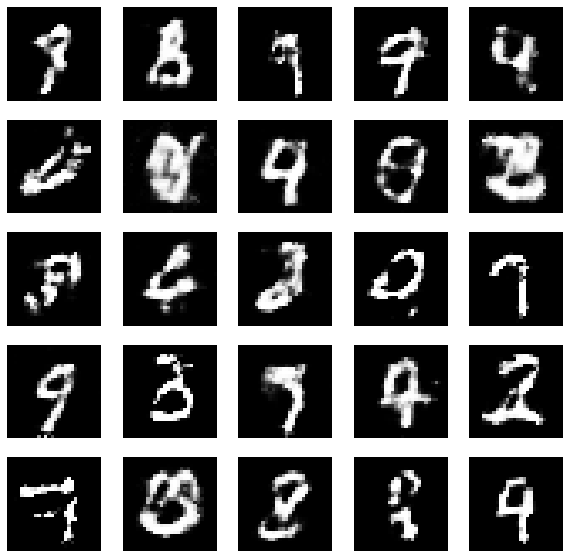

4050 [D loss: 0.504031, acc.: 76.56%] [G loss: 1.755587]


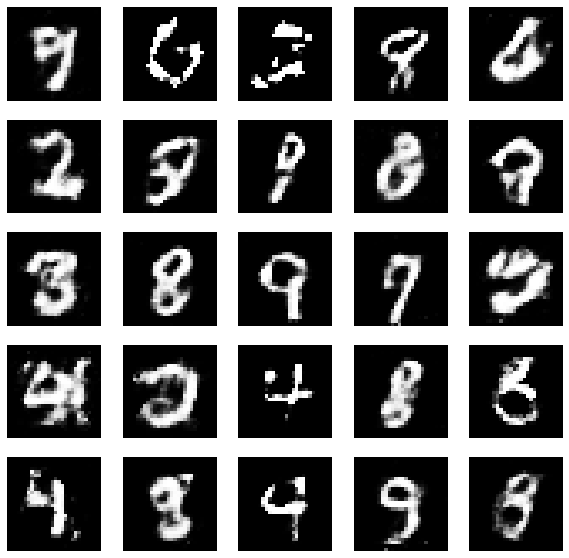

4200 [D loss: 0.500589, acc.: 75.00%] [G loss: 1.722991]


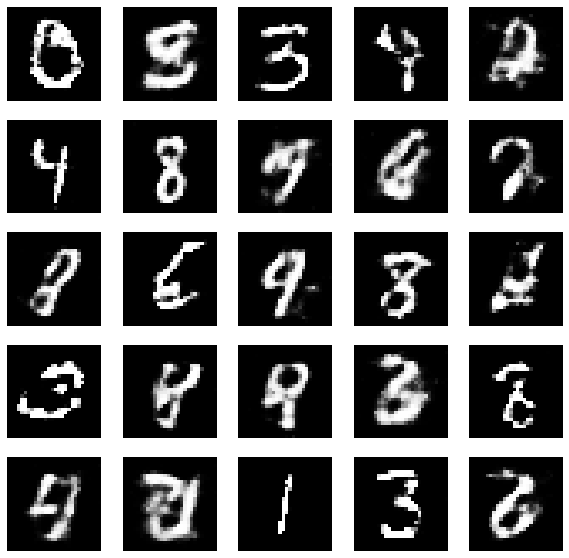

4350 [D loss: 0.455873, acc.: 81.64%] [G loss: 1.733568]


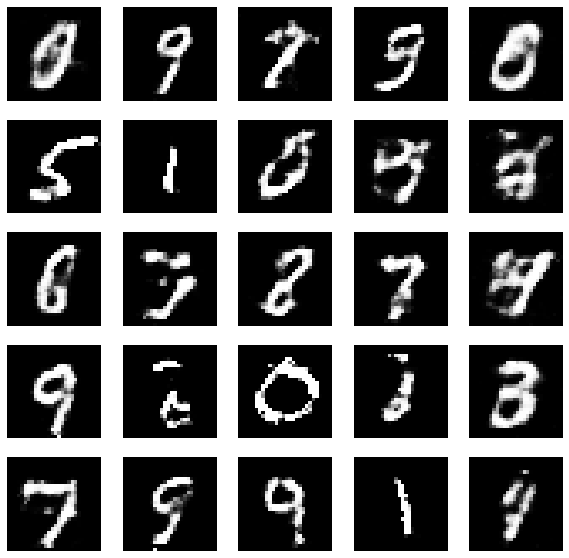

4500 [D loss: 0.453473, acc.: 82.81%] [G loss: 1.721699]


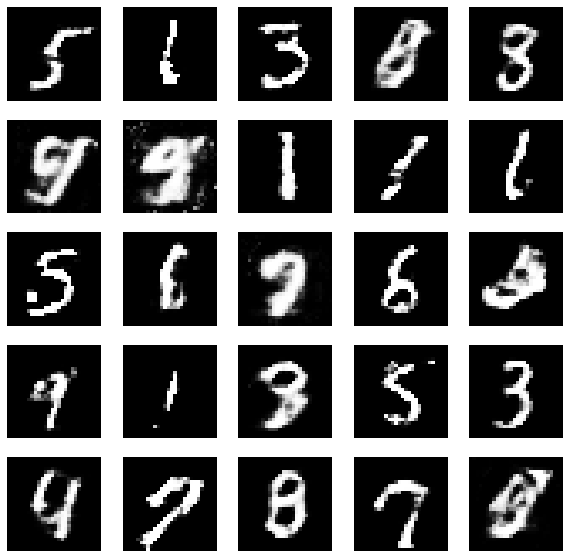

4650 [D loss: 0.404163, acc.: 83.20%] [G loss: 1.753343]


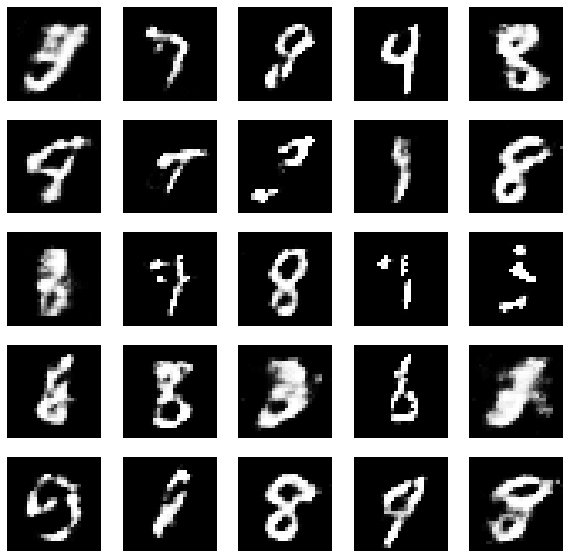

4800 [D loss: 0.538307, acc.: 72.66%] [G loss: 1.575485]


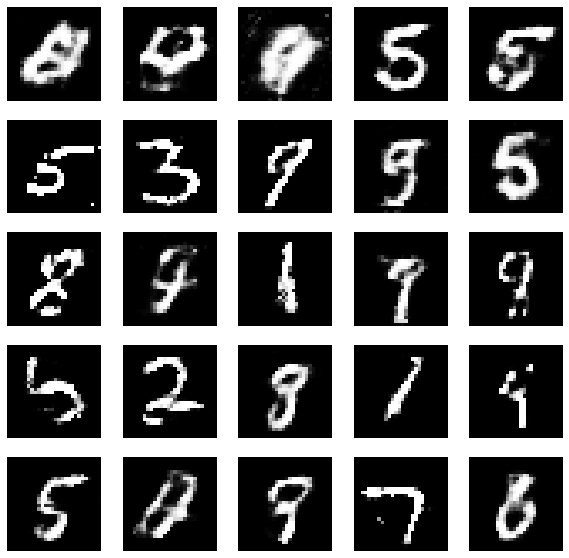

4950 [D loss: 0.455854, acc.: 78.12%] [G loss: 1.791186]


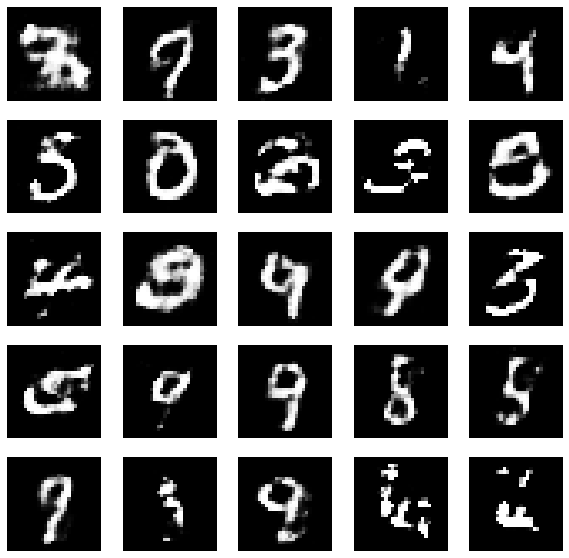

5100 [D loss: 0.488678, acc.: 78.12%] [G loss: 1.690307]


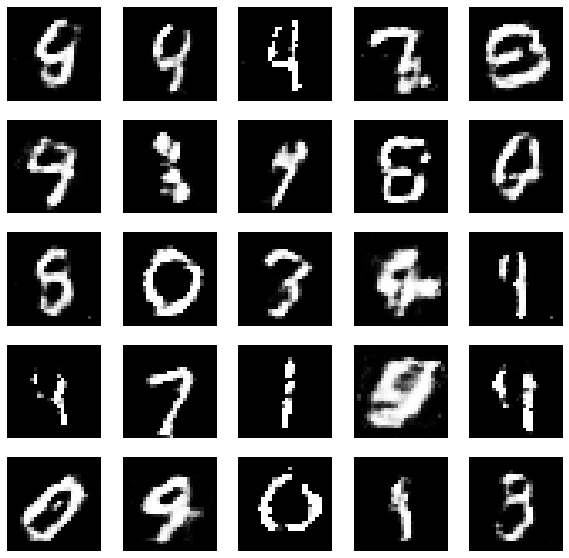

5250 [D loss: 0.502642, acc.: 76.17%] [G loss: 1.681265]


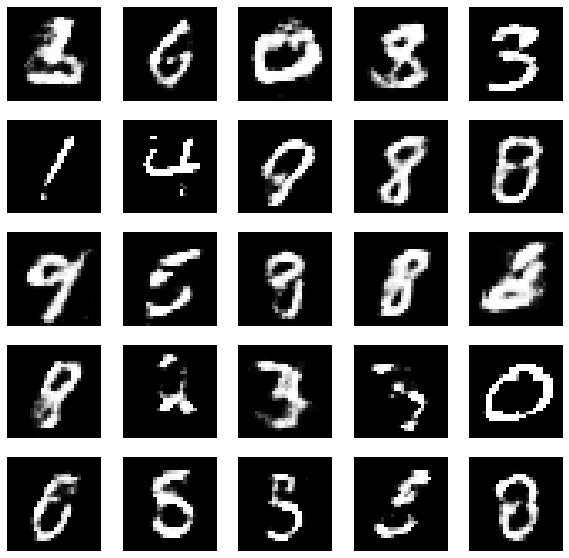

5400 [D loss: 0.470326, acc.: 78.52%] [G loss: 1.855170]


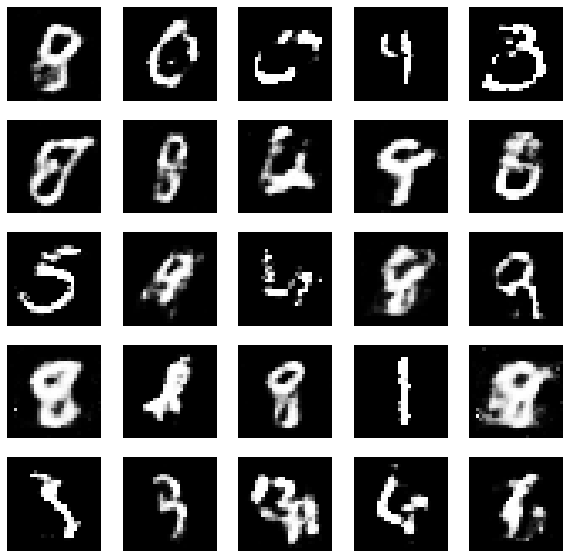

5550 [D loss: 0.396222, acc.: 84.38%] [G loss: 1.891402]


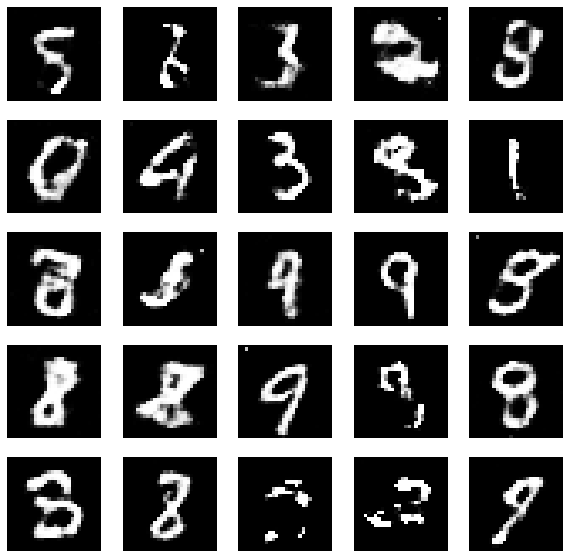

5700 [D loss: 0.492683, acc.: 76.17%] [G loss: 1.878975]


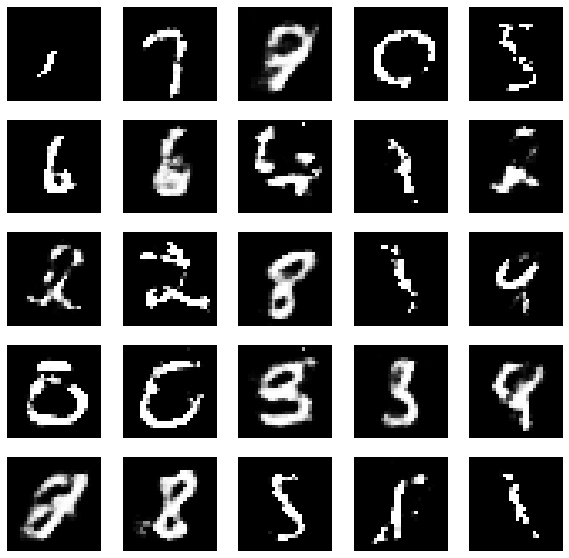

5850 [D loss: 0.544508, acc.: 74.22%] [G loss: 1.742110]


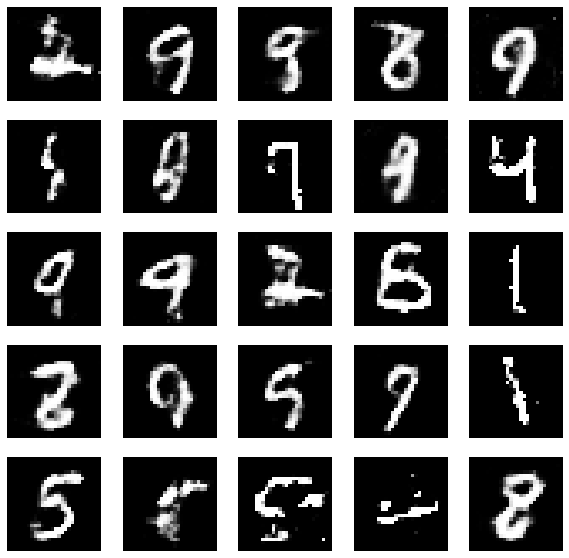

6000 [D loss: 0.503481, acc.: 77.34%] [G loss: 1.806269]


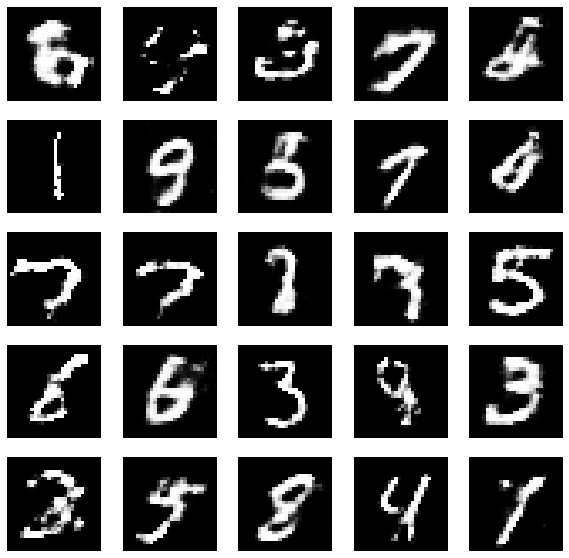

6150 [D loss: 0.416388, acc.: 81.25%] [G loss: 1.892024]


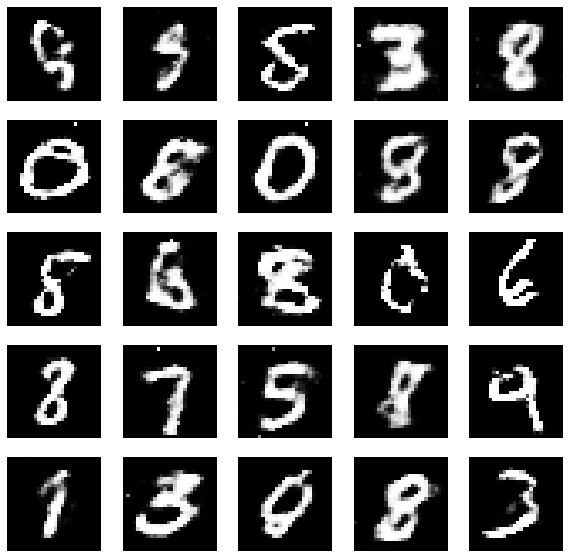

6300 [D loss: 0.443245, acc.: 81.25%] [G loss: 1.978365]


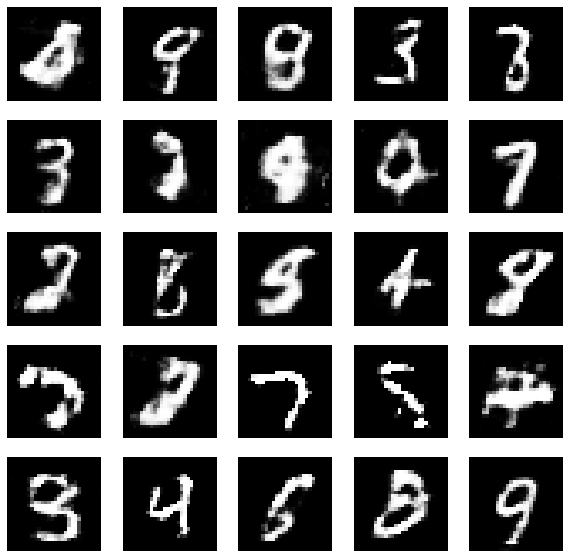

6450 [D loss: 0.476036, acc.: 80.47%] [G loss: 1.780068]


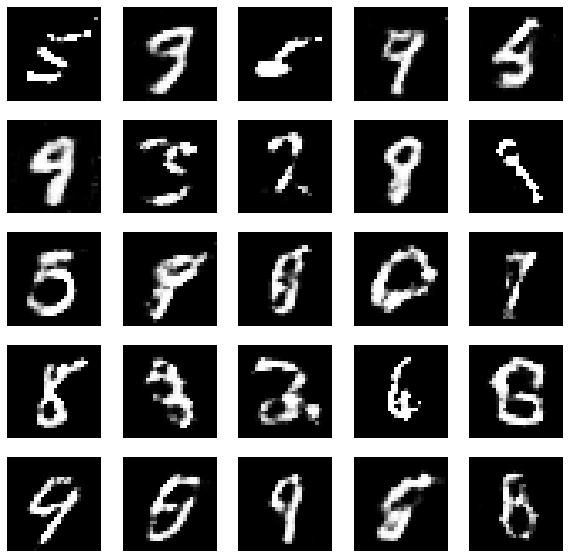

6600 [D loss: 0.475332, acc.: 79.69%] [G loss: 1.712956]


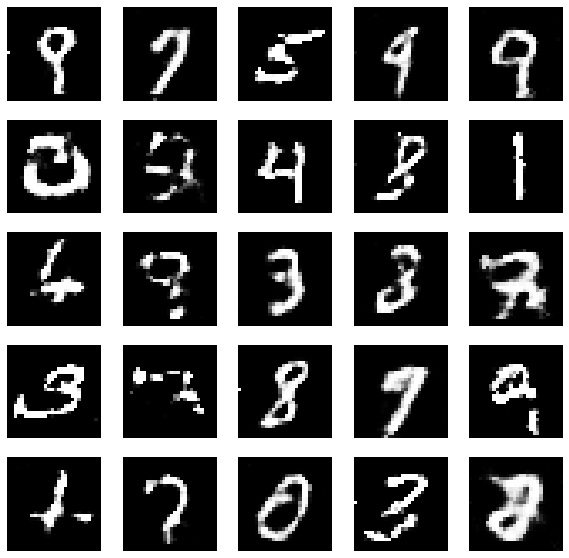

6750 [D loss: 0.468255, acc.: 76.95%] [G loss: 1.785471]


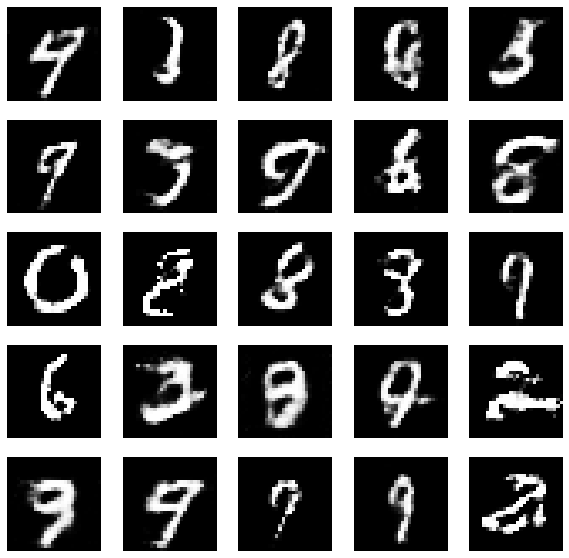

6900 [D loss: 0.468773, acc.: 78.52%] [G loss: 1.844283]


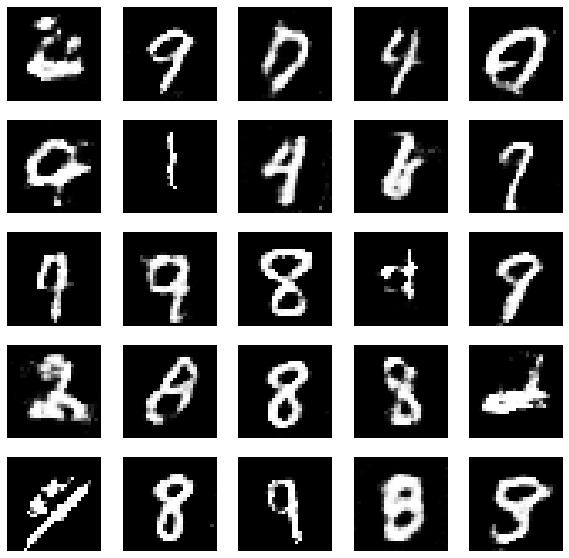

7050 [D loss: 0.467622, acc.: 79.30%] [G loss: 1.973985]


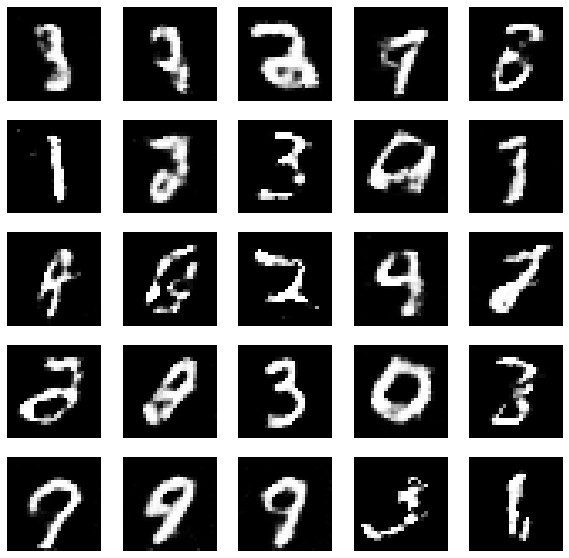

7200 [D loss: 0.465689, acc.: 82.81%] [G loss: 1.898106]


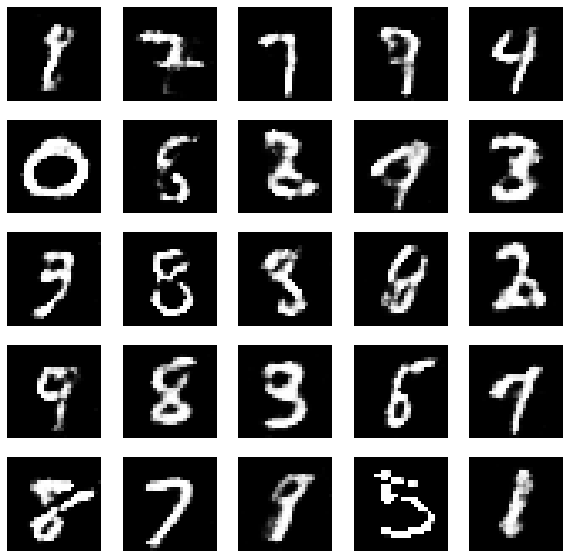

7350 [D loss: 0.468403, acc.: 76.17%] [G loss: 1.804594]


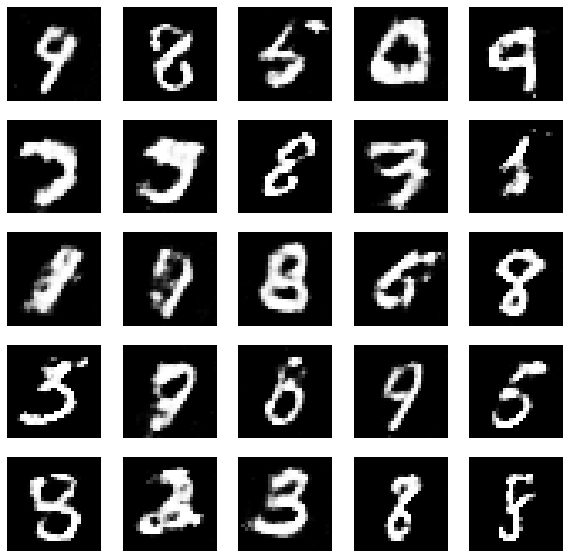

7500 [D loss: 0.516802, acc.: 72.66%] [G loss: 1.630902]


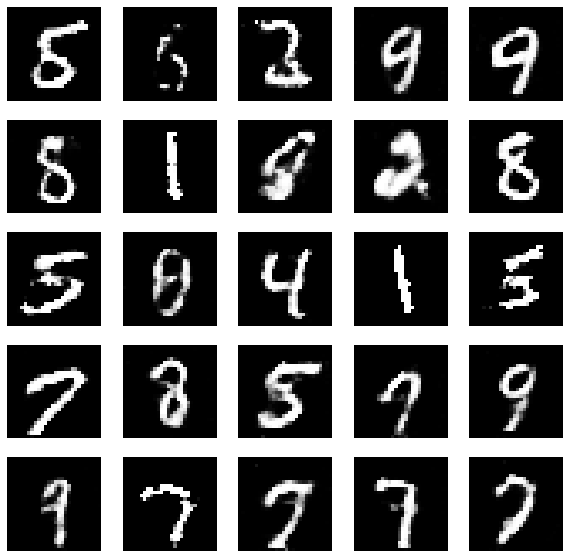

7650 [D loss: 0.419168, acc.: 82.42%] [G loss: 1.851104]


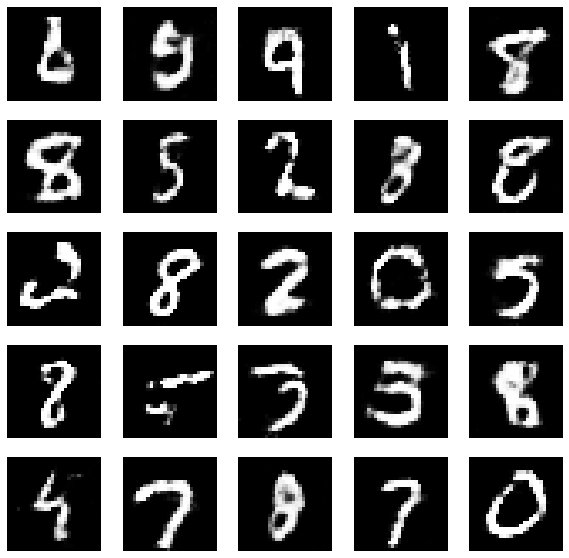

7800 [D loss: 0.454947, acc.: 78.12%] [G loss: 1.889482]


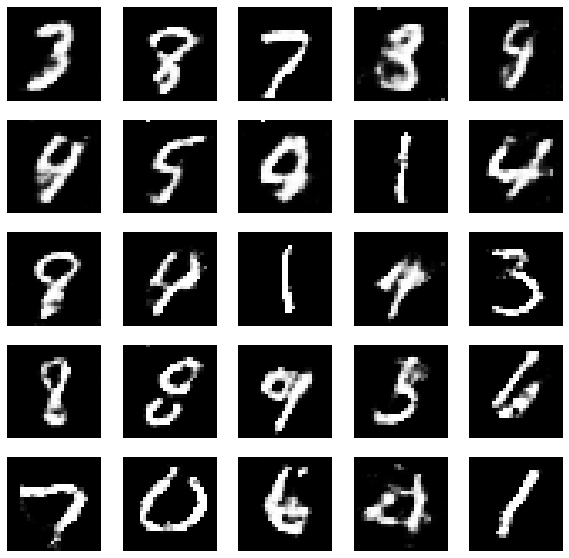

7950 [D loss: 0.507960, acc.: 74.61%] [G loss: 1.950880]


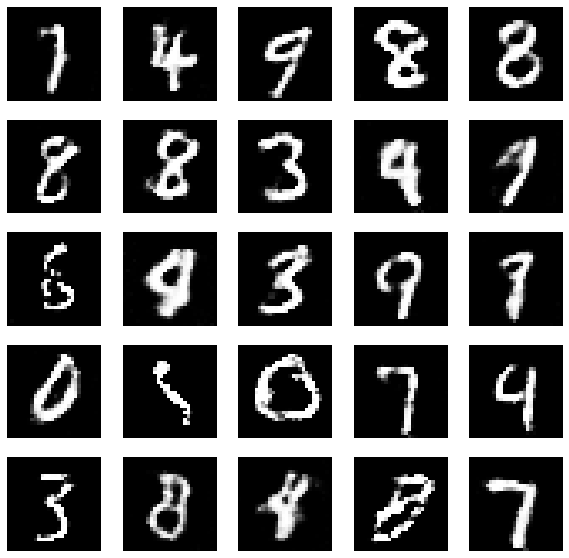

8100 [D loss: 0.513896, acc.: 75.78%] [G loss: 1.854830]


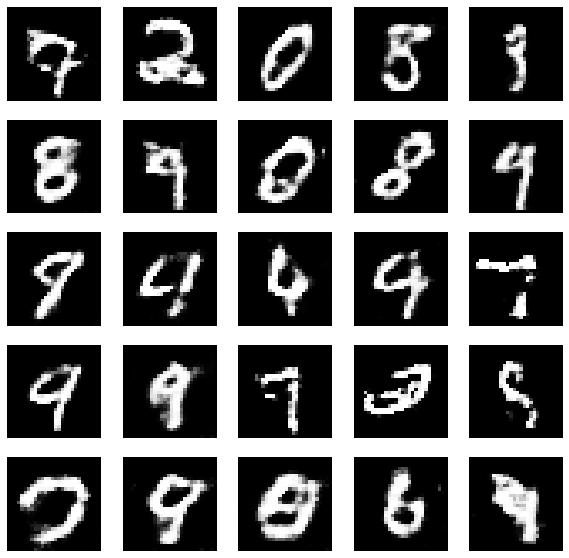

8250 [D loss: 0.576243, acc.: 67.97%] [G loss: 1.882242]


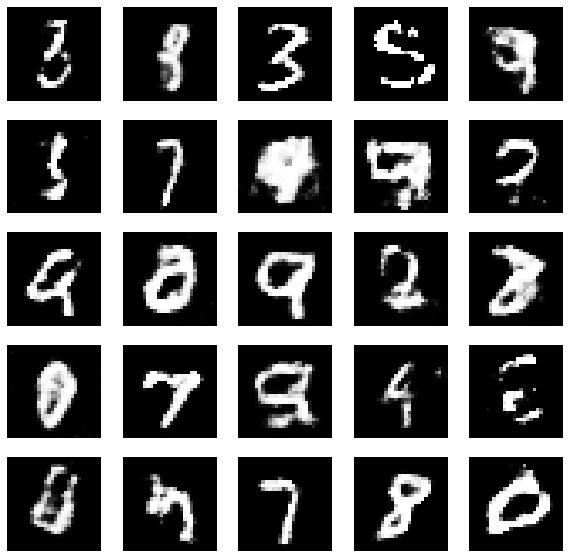

8400 [D loss: 0.563534, acc.: 69.92%] [G loss: 1.797420]


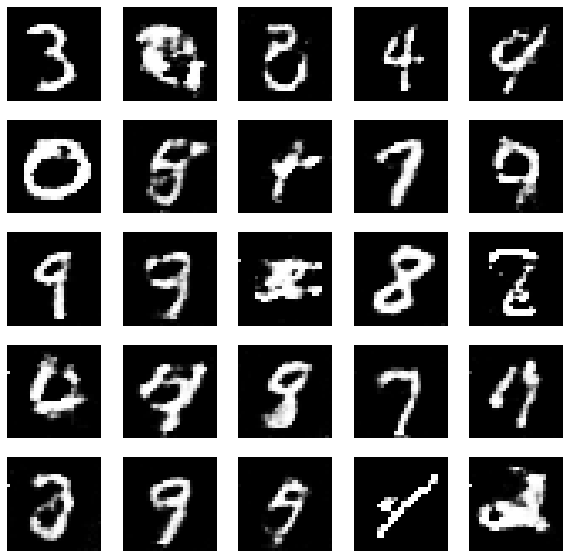

8550 [D loss: 0.490431, acc.: 76.17%] [G loss: 1.675092]


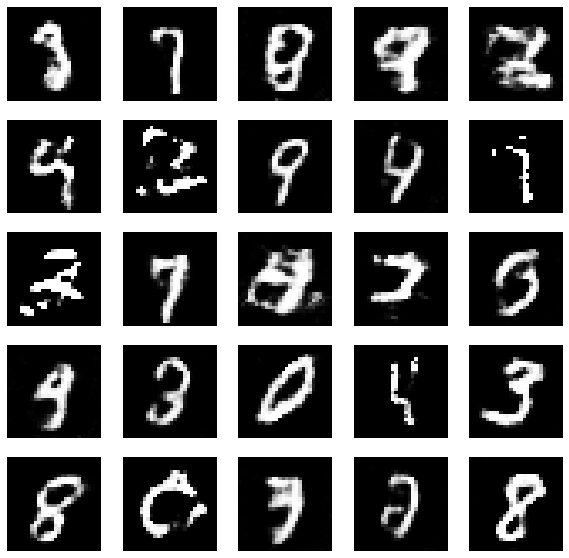

8700 [D loss: 0.491828, acc.: 75.39%] [G loss: 1.792142]


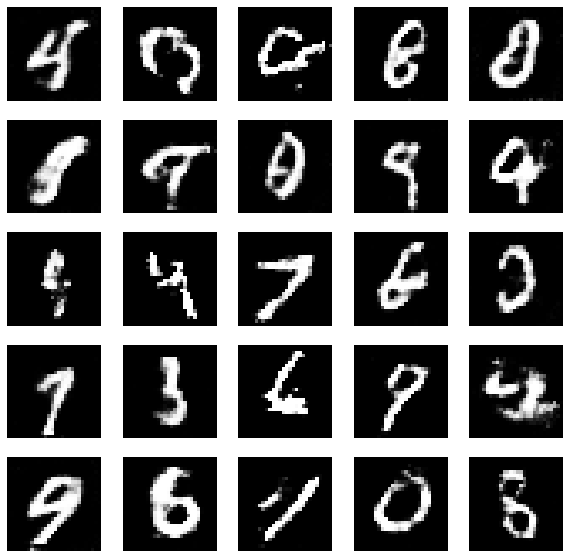

8850 [D loss: 0.512598, acc.: 78.12%] [G loss: 1.720670]


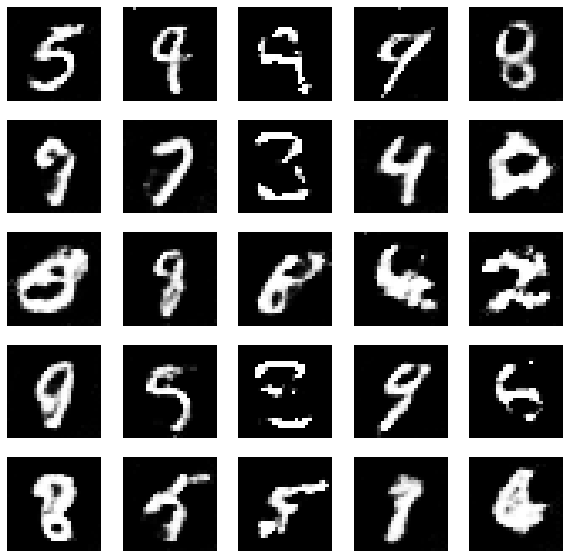

9000 [D loss: 0.493683, acc.: 73.83%] [G loss: 1.809986]


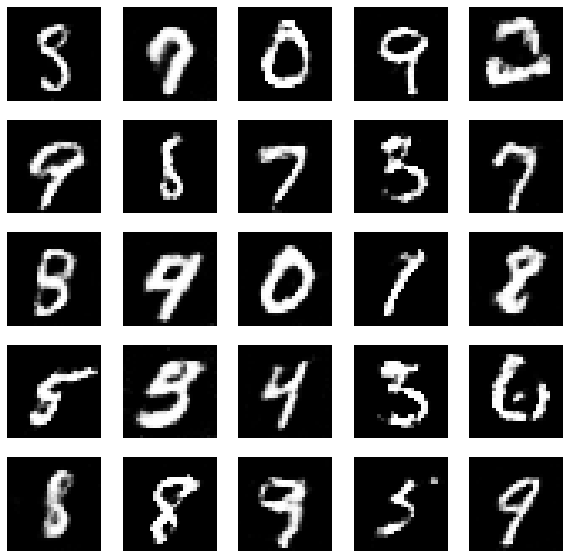

9150 [D loss: 0.558962, acc.: 70.31%] [G loss: 1.675153]


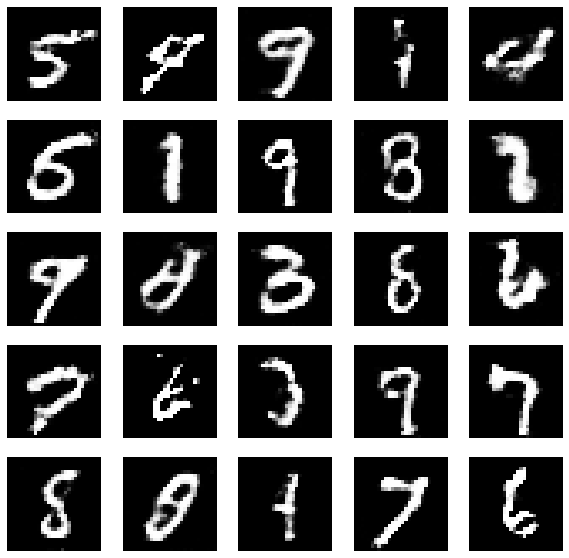

9300 [D loss: 0.556837, acc.: 72.27%] [G loss: 1.710322]


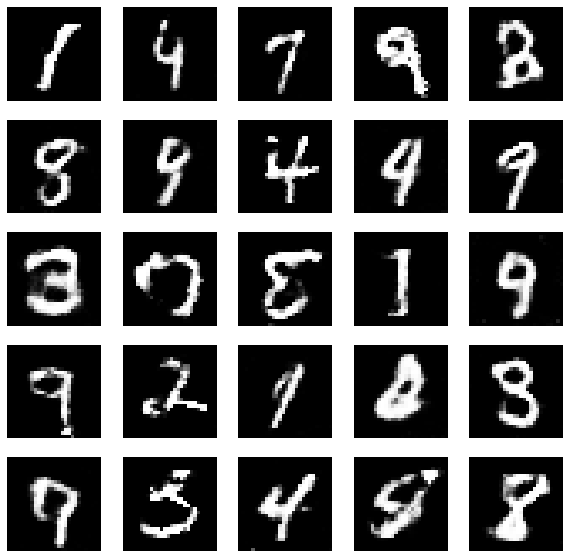

9450 [D loss: 0.568030, acc.: 70.70%] [G loss: 1.709611]


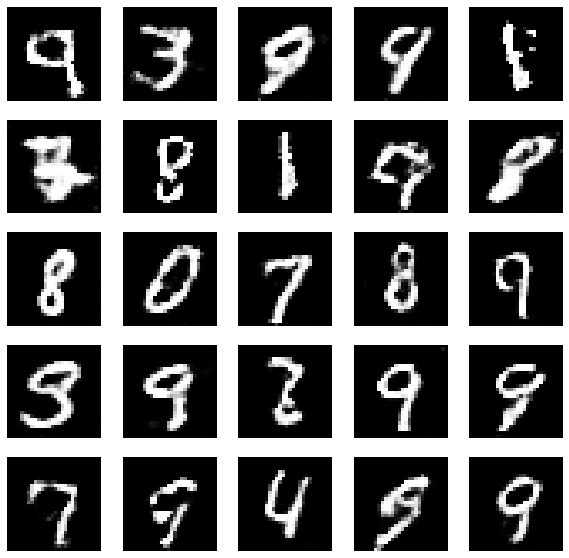

9600 [D loss: 0.505243, acc.: 73.05%] [G loss: 1.672966]


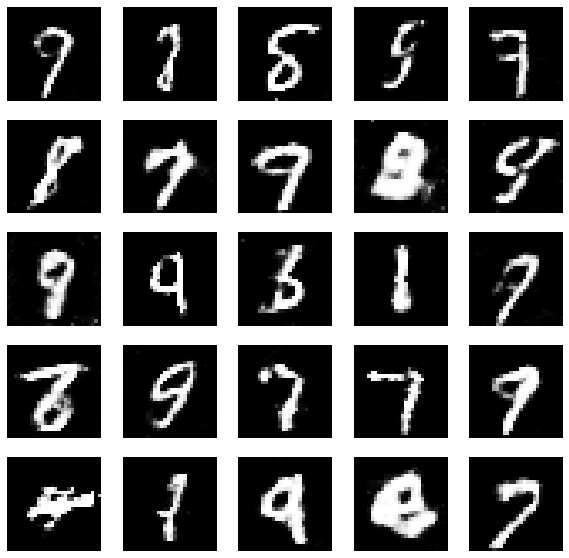

9750 [D loss: 0.464873, acc.: 76.95%] [G loss: 1.767081]


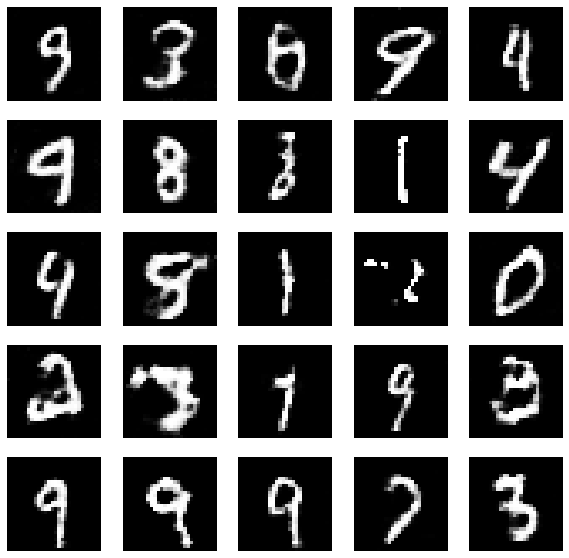

9900 [D loss: 0.510803, acc.: 73.05%] [G loss: 1.646564]


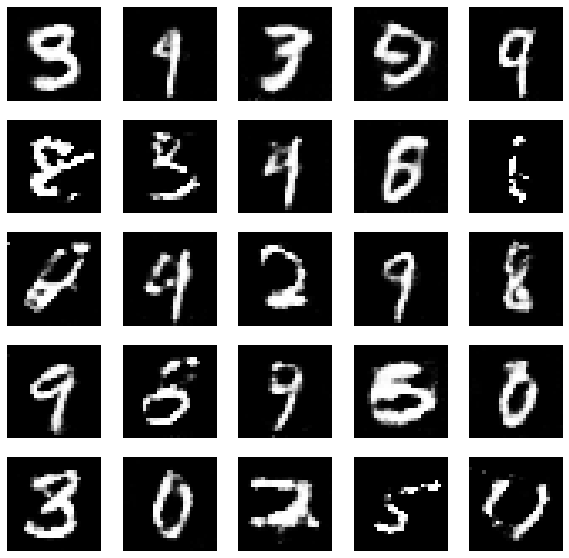

10050 [D loss: 0.500310, acc.: 74.22%] [G loss: 1.759197]


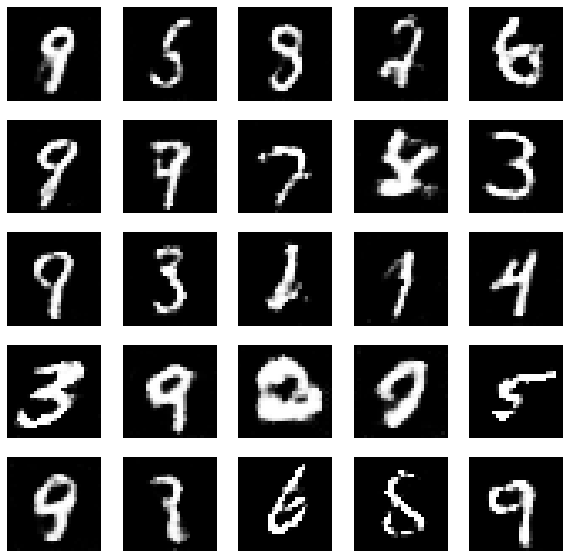

10200 [D loss: 0.593544, acc.: 67.58%] [G loss: 1.624567]


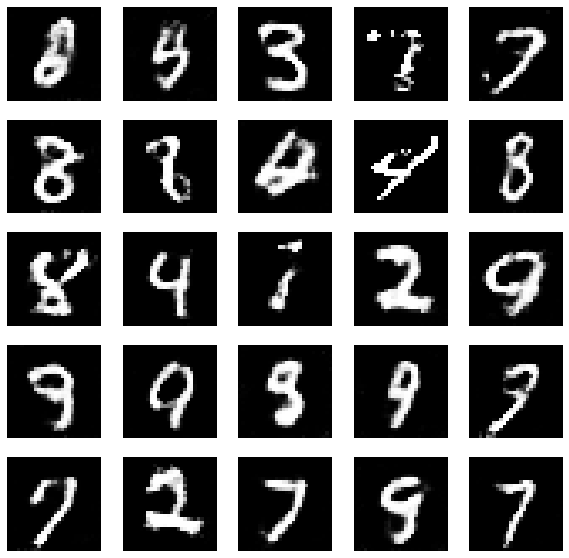

10350 [D loss: 0.576082, acc.: 69.53%] [G loss: 1.822046]


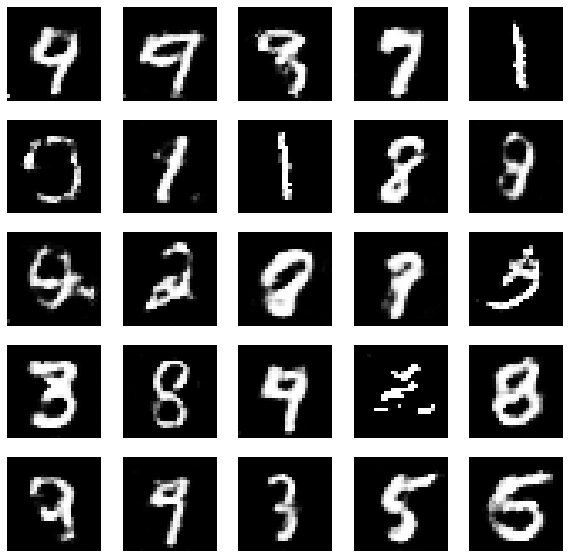

10500 [D loss: 0.512214, acc.: 74.22%] [G loss: 1.735989]


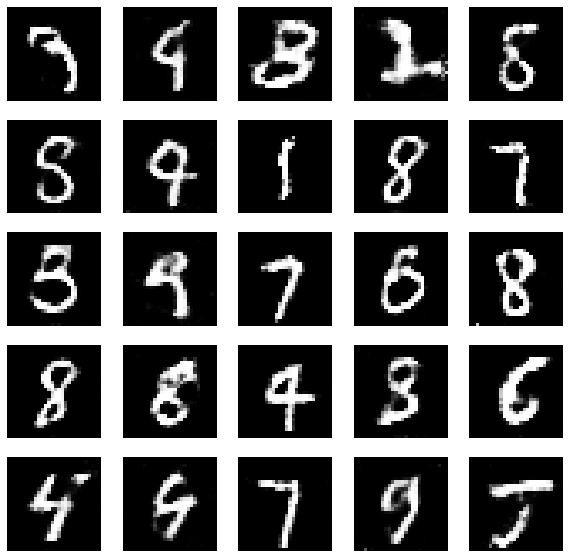

10650 [D loss: 0.550842, acc.: 71.88%] [G loss: 1.770880]


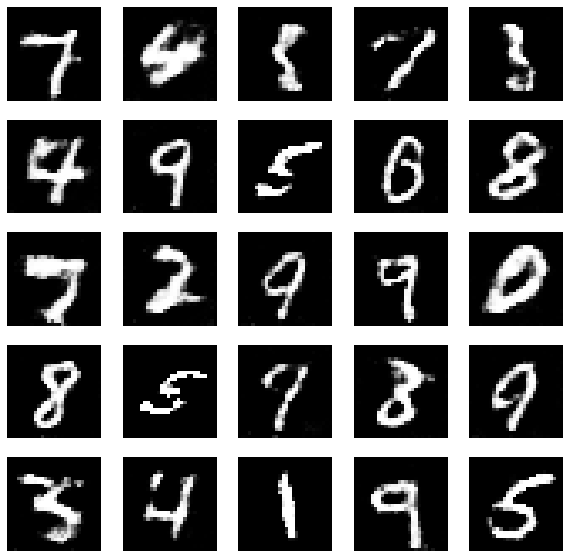

10800 [D loss: 0.504755, acc.: 77.73%] [G loss: 1.690932]


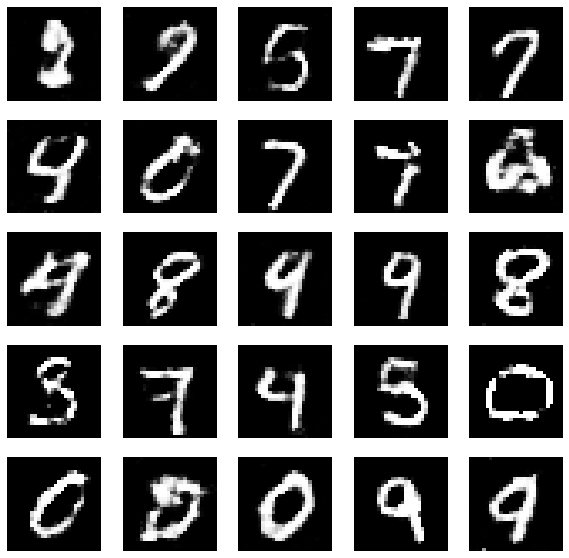

10950 [D loss: 0.569608, acc.: 69.92%] [G loss: 1.663618]


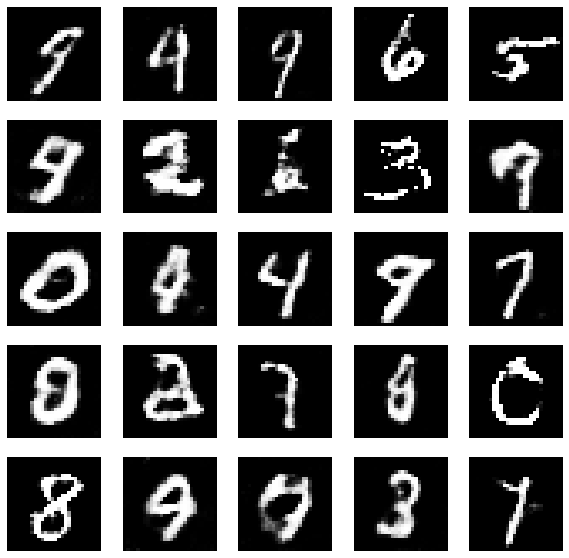

11100 [D loss: 0.536496, acc.: 73.44%] [G loss: 1.670549]


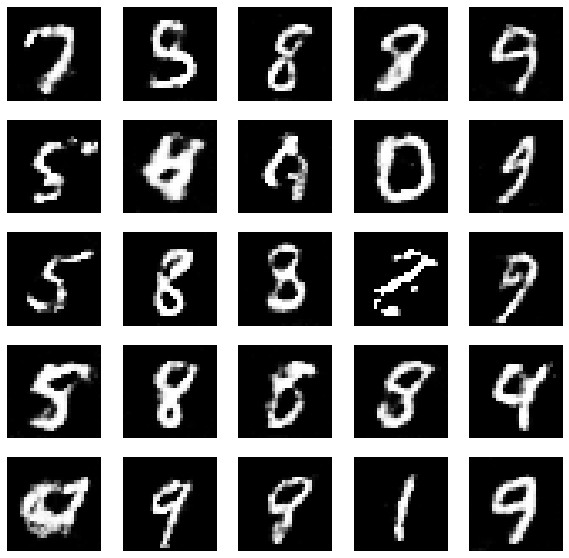

11250 [D loss: 0.559243, acc.: 71.48%] [G loss: 1.630885]


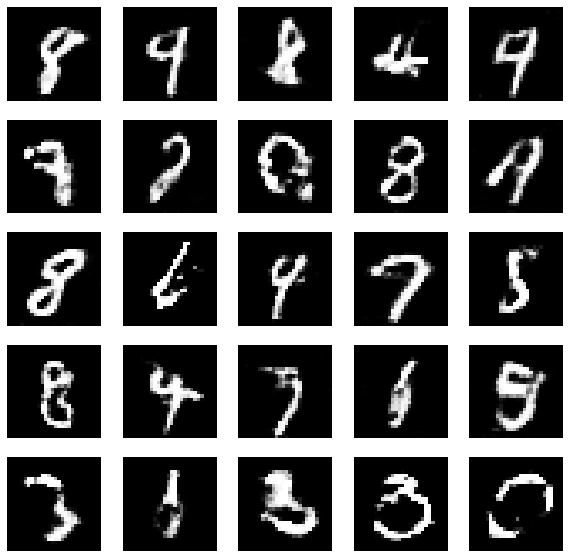

11400 [D loss: 0.527612, acc.: 69.53%] [G loss: 1.658511]


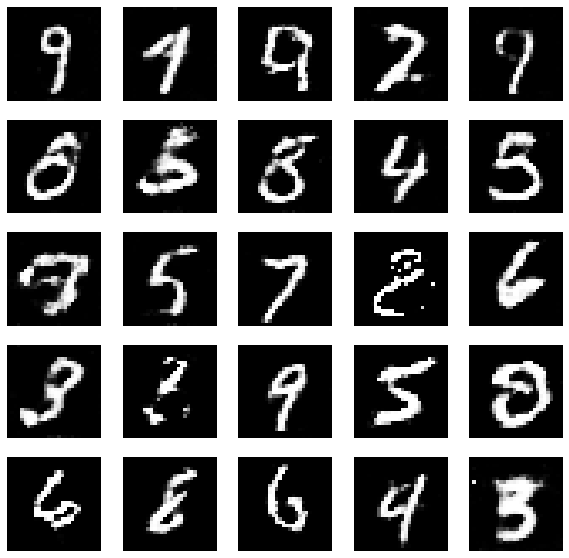

11550 [D loss: 0.545666, acc.: 70.31%] [G loss: 1.650104]


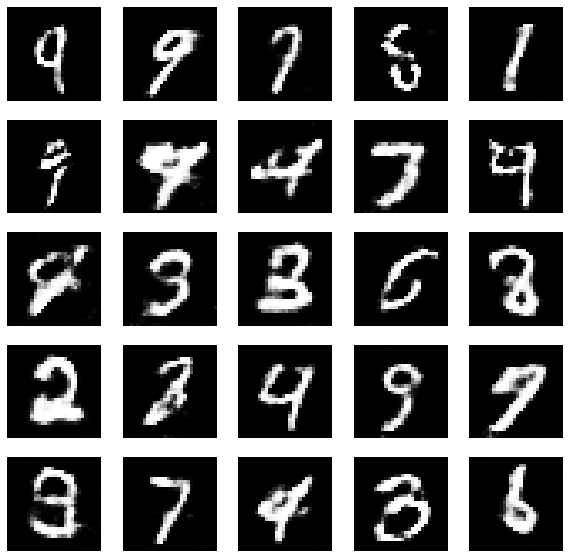

11700 [D loss: 0.586949, acc.: 67.19%] [G loss: 1.605878]


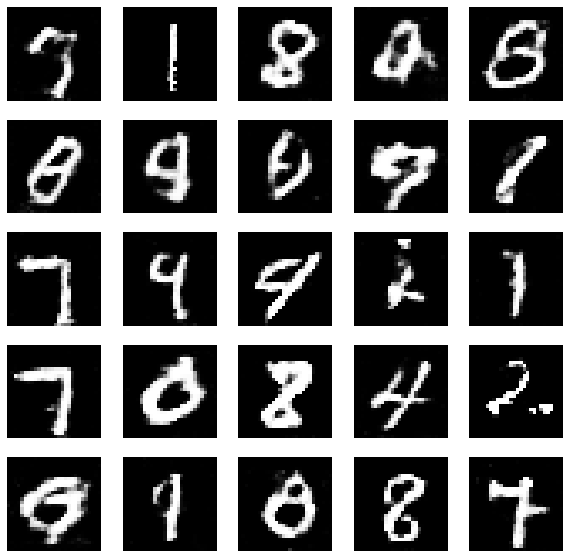

11850 [D loss: 0.511893, acc.: 75.00%] [G loss: 1.643456]


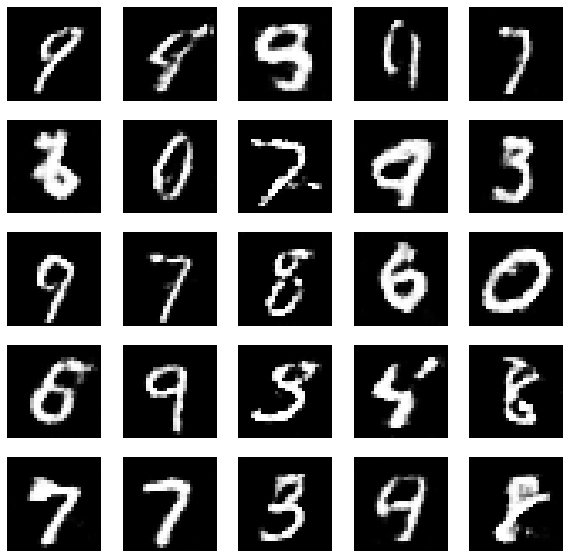

12000 [D loss: 0.583363, acc.: 67.97%] [G loss: 1.623239]


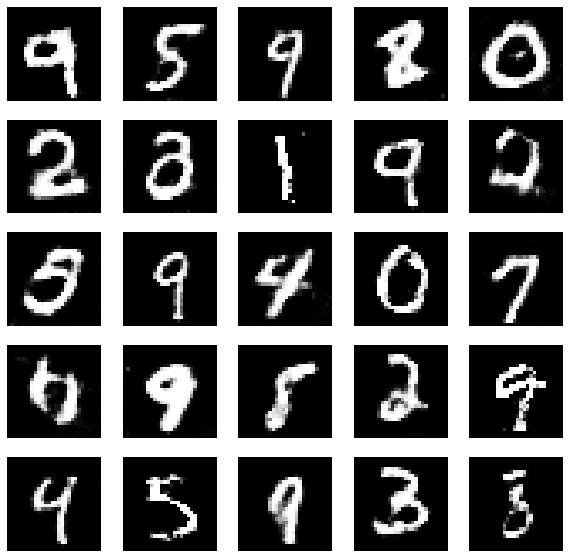

12150 [D loss: 0.523752, acc.: 71.09%] [G loss: 1.738496]


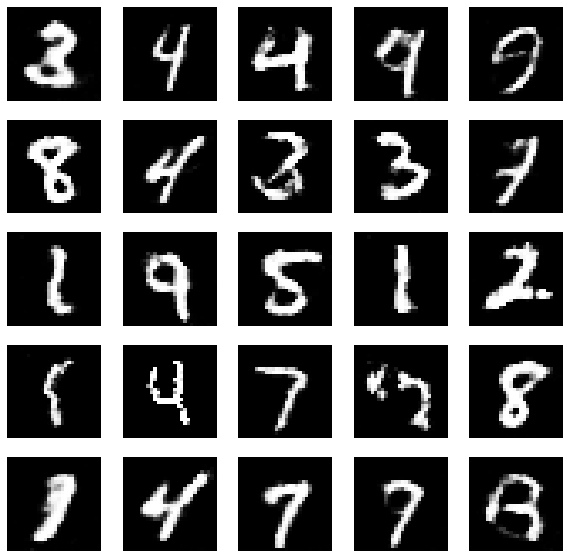

12300 [D loss: 0.507940, acc.: 76.56%] [G loss: 1.799321]


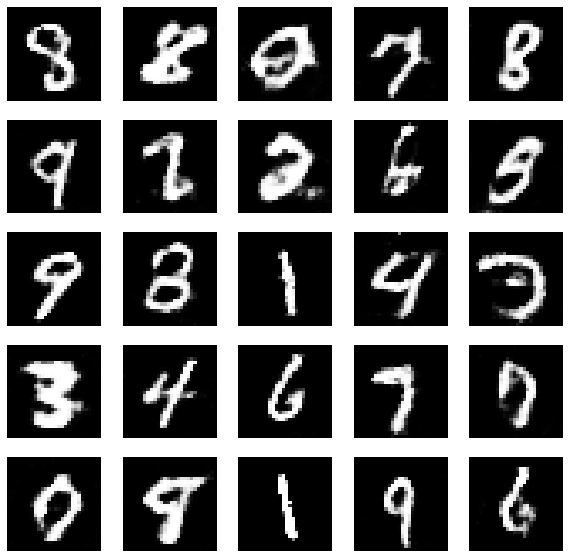

12450 [D loss: 0.549920, acc.: 72.66%] [G loss: 1.585694]


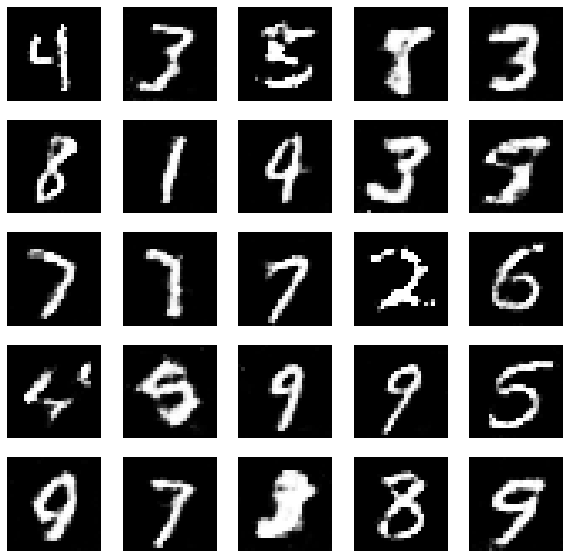

12600 [D loss: 0.558728, acc.: 71.48%] [G loss: 1.676408]


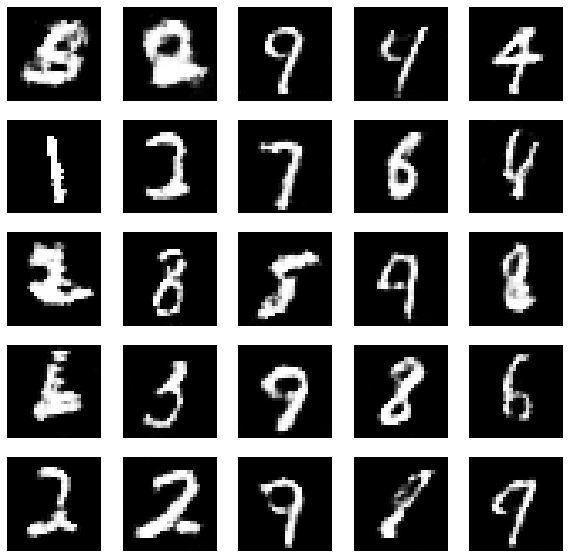

12750 [D loss: 0.553561, acc.: 71.88%] [G loss: 1.665910]


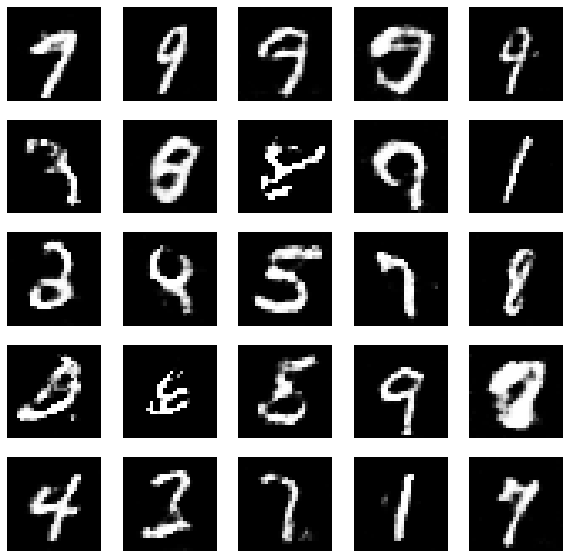

12900 [D loss: 0.629580, acc.: 67.58%] [G loss: 1.390568]


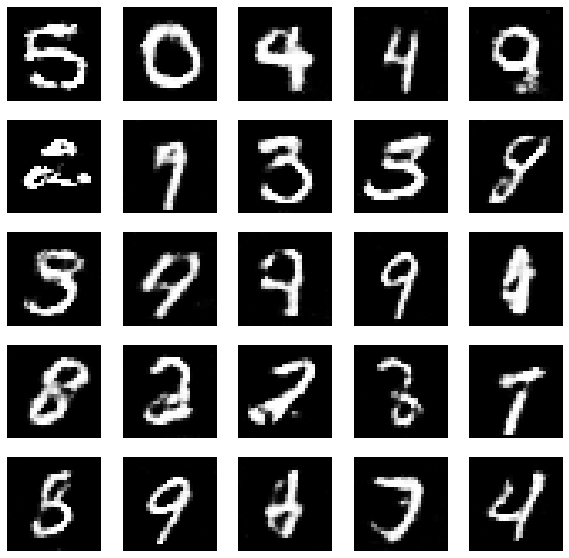

13050 [D loss: 0.633936, acc.: 63.67%] [G loss: 1.559245]


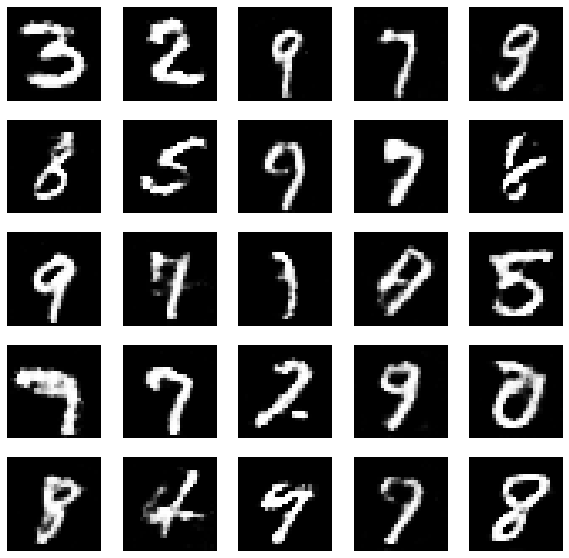

13200 [D loss: 0.622823, acc.: 63.28%] [G loss: 1.513414]


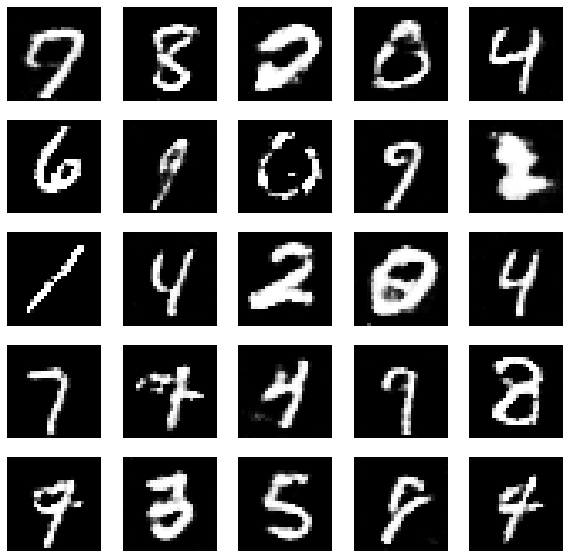

13350 [D loss: 0.508494, acc.: 74.22%] [G loss: 1.663245]


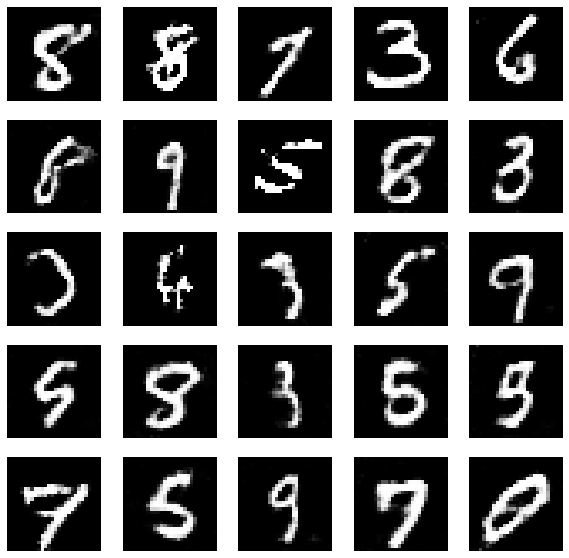

13500 [D loss: 0.602675, acc.: 69.14%] [G loss: 1.638389]


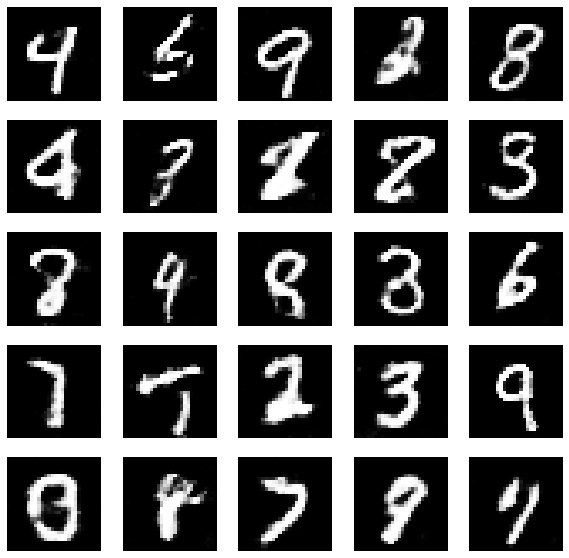

13650 [D loss: 0.594156, acc.: 67.19%] [G loss: 1.551390]


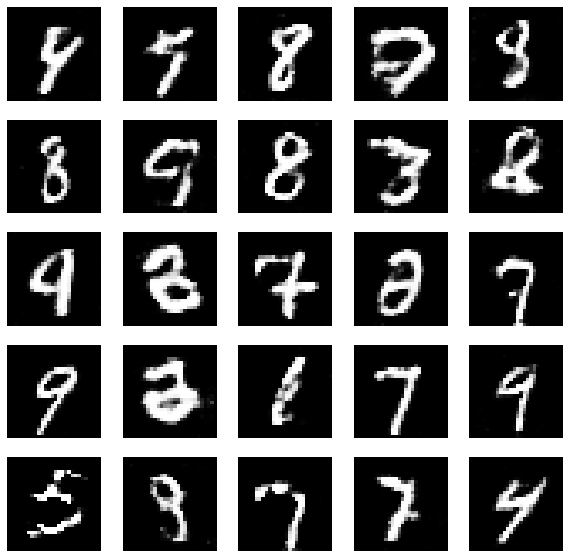

13800 [D loss: 0.511105, acc.: 77.34%] [G loss: 1.661339]


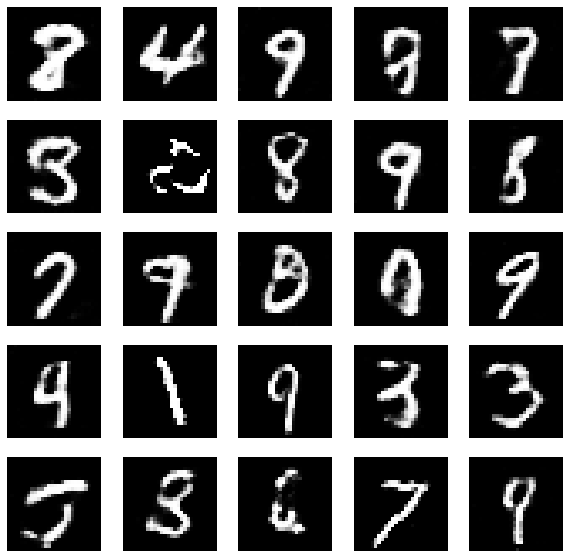

13950 [D loss: 0.573257, acc.: 71.09%] [G loss: 1.645621]


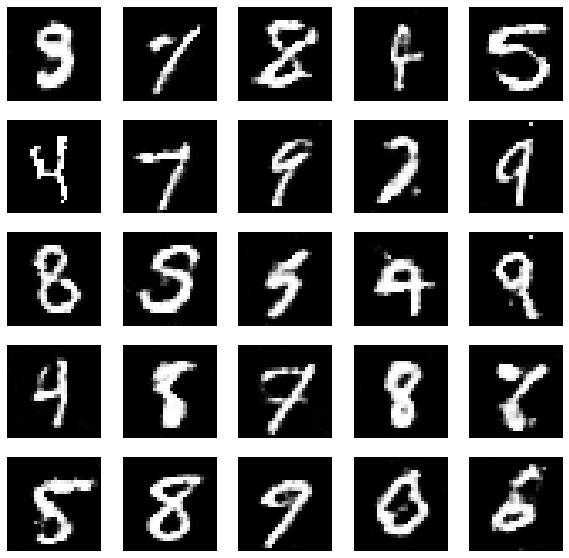

14100 [D loss: 0.599562, acc.: 66.41%] [G loss: 1.596540]


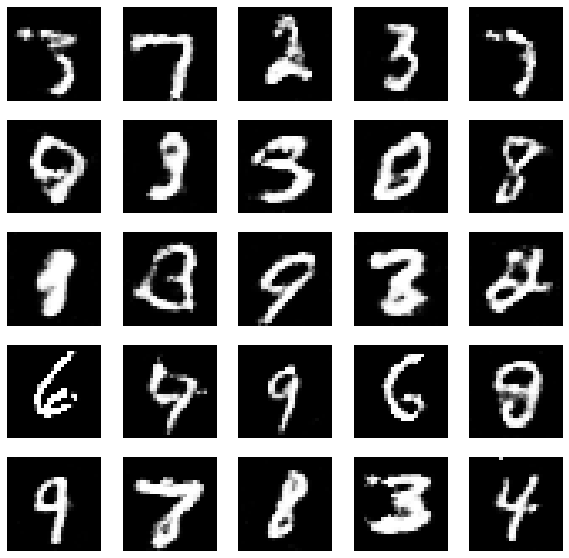

14250 [D loss: 0.546809, acc.: 72.27%] [G loss: 1.702297]


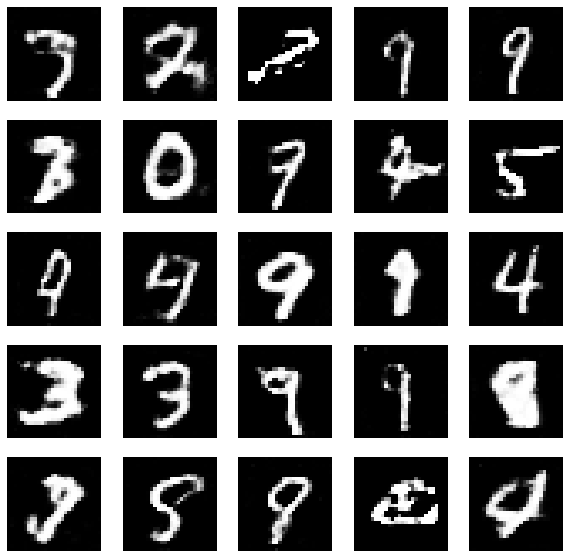

14400 [D loss: 0.587105, acc.: 66.41%] [G loss: 1.561631]


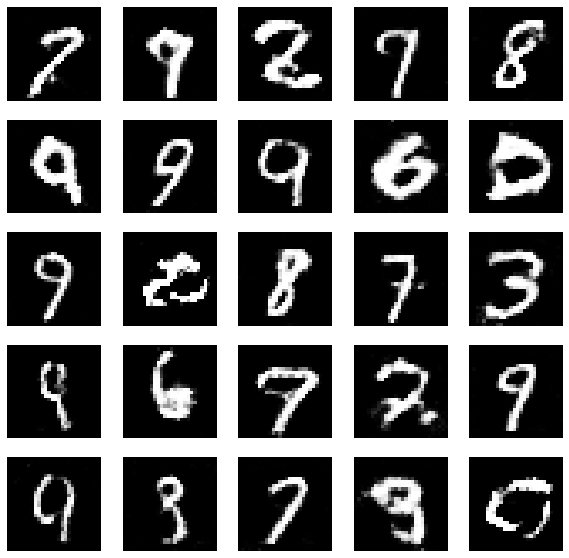

14550 [D loss: 0.516717, acc.: 75.00%] [G loss: 1.573389]


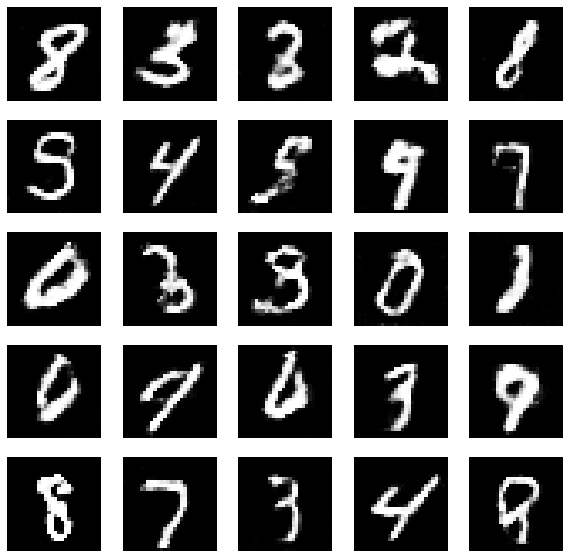

14700 [D loss: 0.637248, acc.: 63.67%] [G loss: 1.518704]


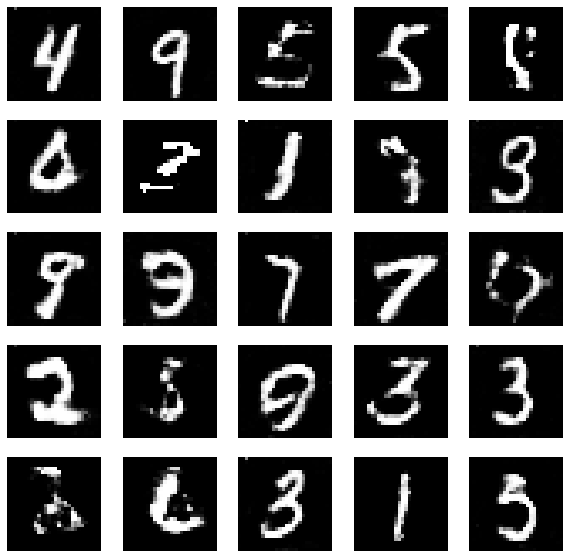

14850 [D loss: 0.559787, acc.: 74.22%] [G loss: 1.510309]


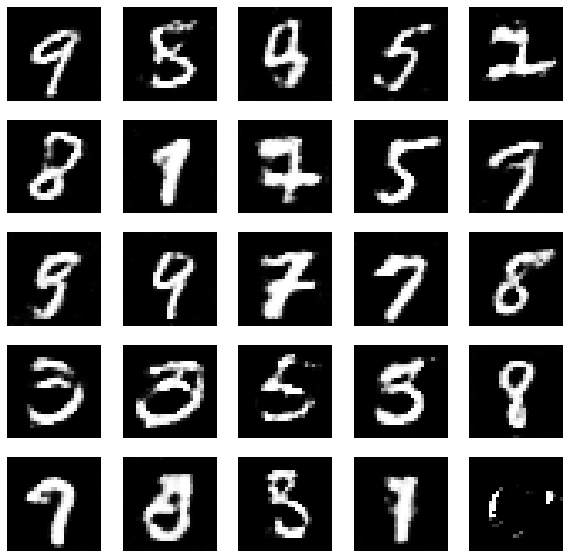

15000 [D loss: 0.567375, acc.: 69.53%] [G loss: 1.613852]


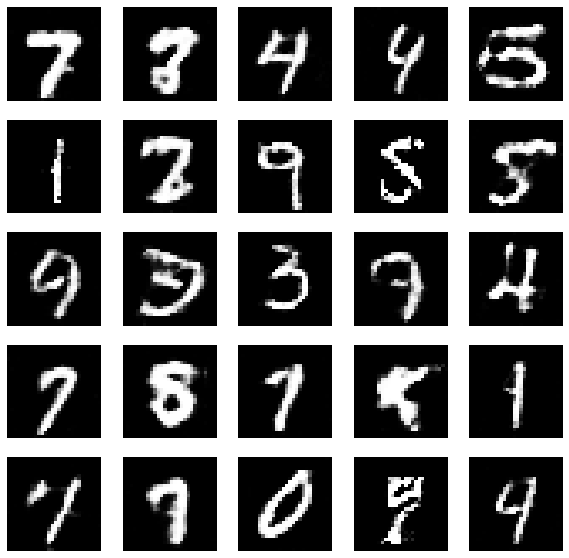

15150 [D loss: 0.642109, acc.: 62.50%] [G loss: 1.483048]


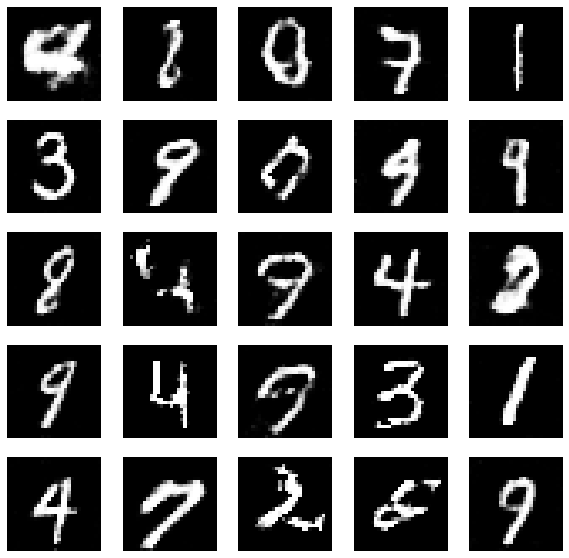

15300 [D loss: 0.597002, acc.: 66.41%] [G loss: 1.570711]


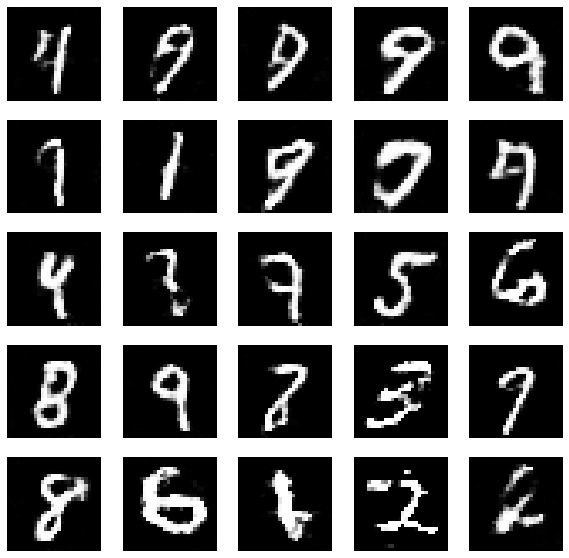

15450 [D loss: 0.562091, acc.: 69.14%] [G loss: 1.503713]


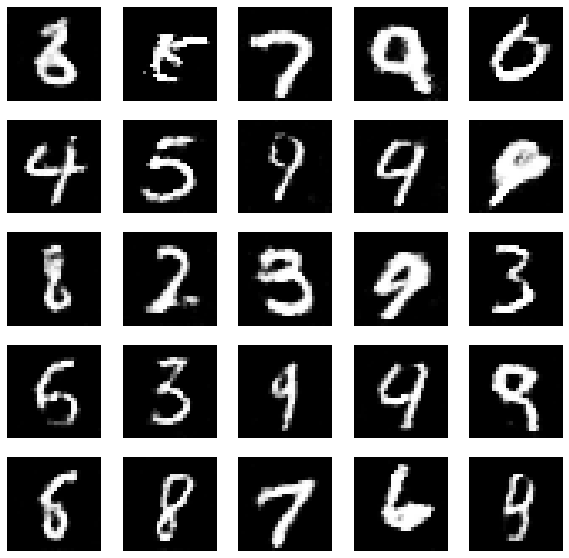

15600 [D loss: 0.579707, acc.: 68.75%] [G loss: 1.576113]


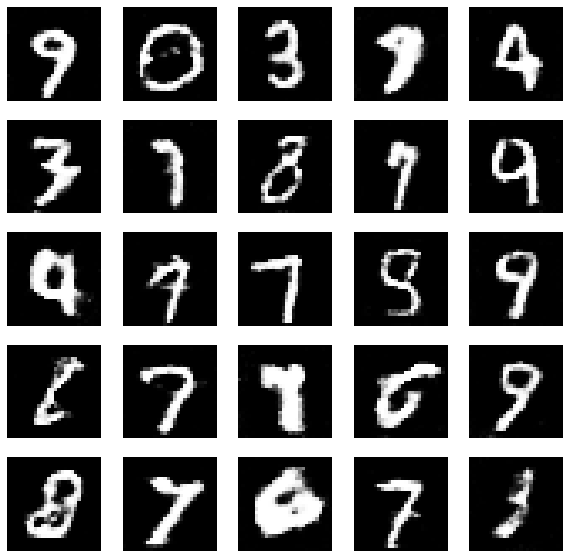

15750 [D loss: 0.542959, acc.: 71.48%] [G loss: 1.624990]


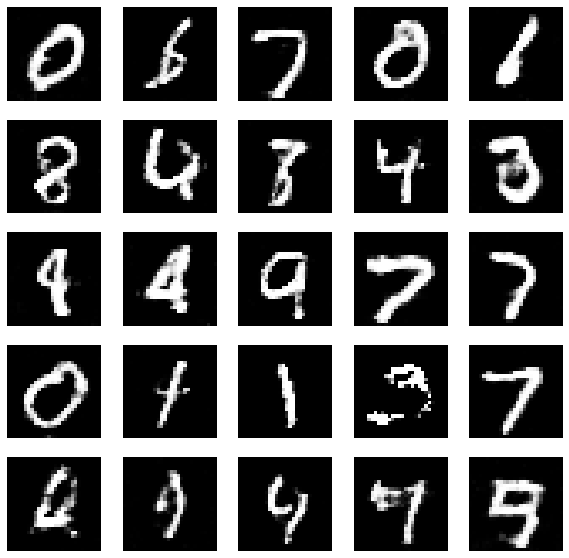

15900 [D loss: 0.543445, acc.: 71.48%] [G loss: 1.561219]


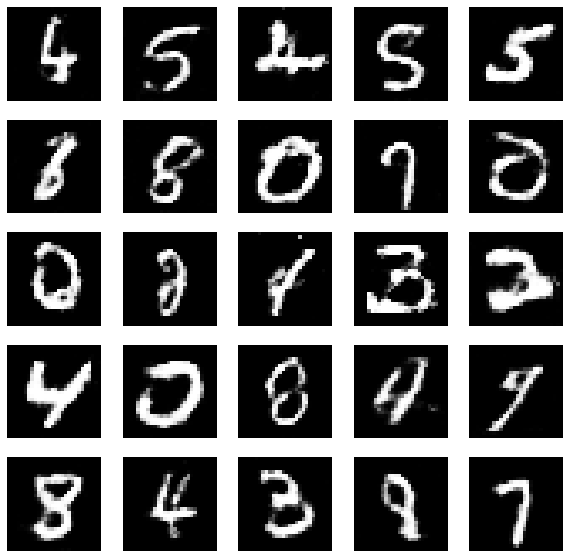

16050 [D loss: 0.591155, acc.: 66.02%] [G loss: 1.582879]


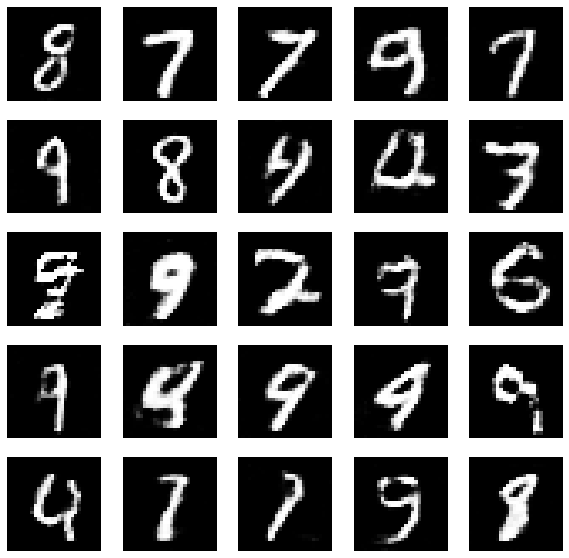

16200 [D loss: 0.580831, acc.: 70.31%] [G loss: 1.598011]


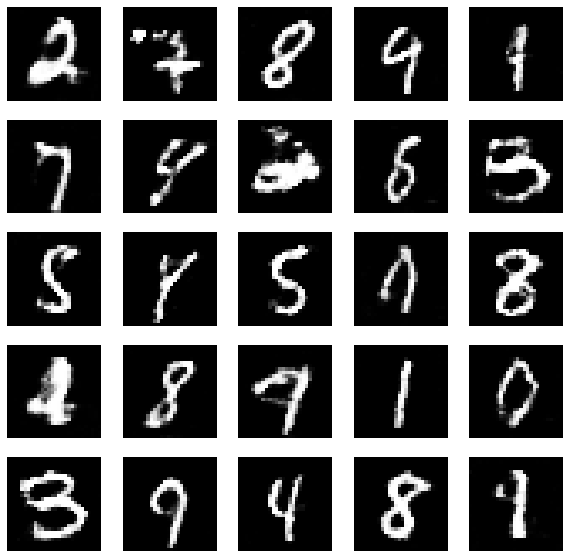

16350 [D loss: 0.607603, acc.: 61.72%] [G loss: 1.415963]


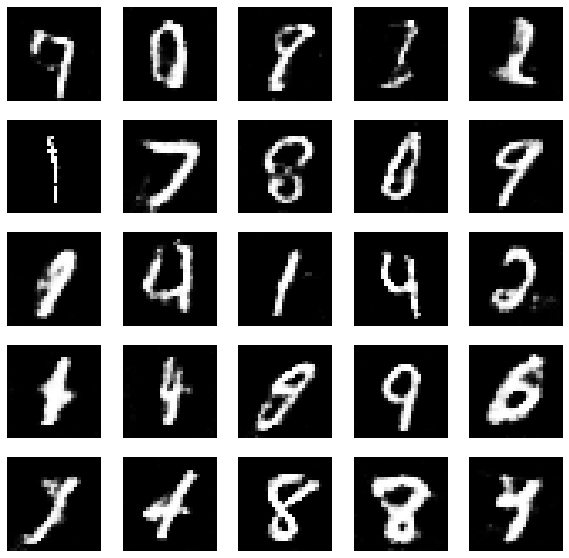

16500 [D loss: 0.558436, acc.: 67.97%] [G loss: 1.524867]


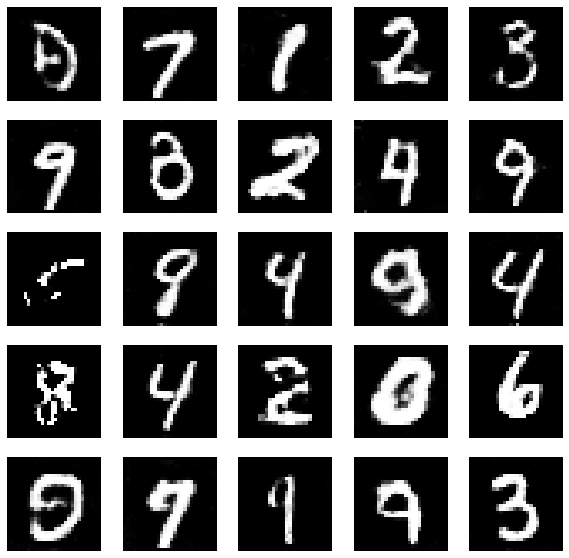

16650 [D loss: 0.633874, acc.: 60.94%] [G loss: 1.342033]


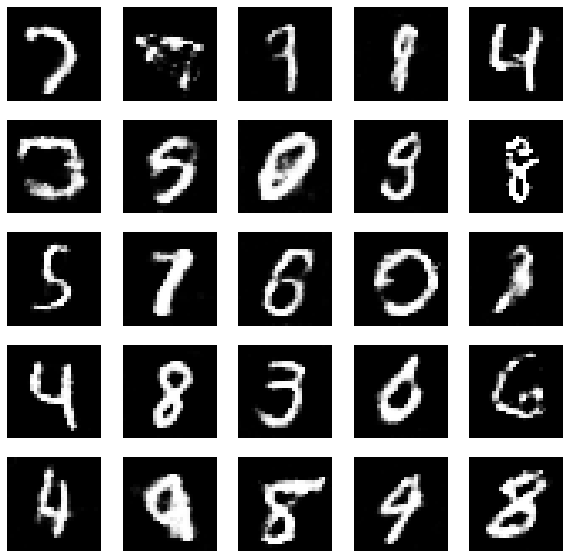

16800 [D loss: 0.625202, acc.: 64.06%] [G loss: 1.428005]


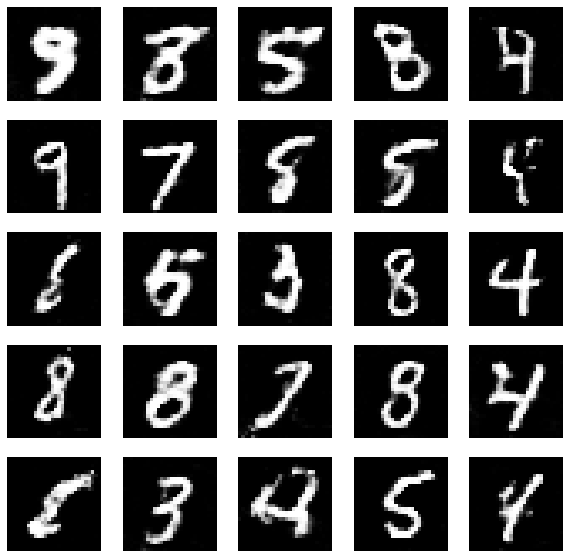

16950 [D loss: 0.552228, acc.: 70.31%] [G loss: 1.523244]


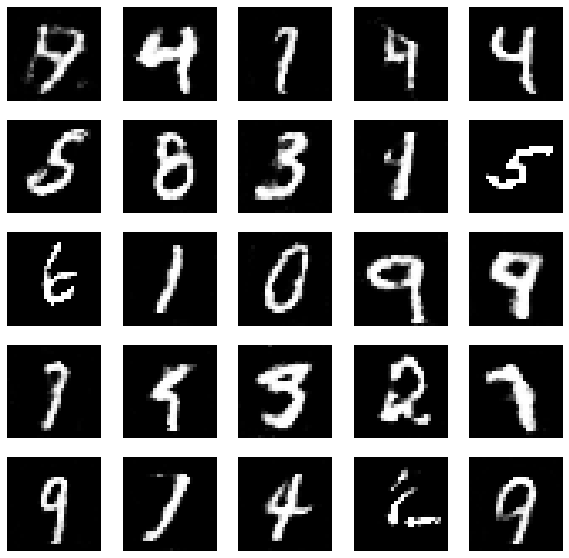

17100 [D loss: 0.643246, acc.: 64.45%] [G loss: 1.453906]


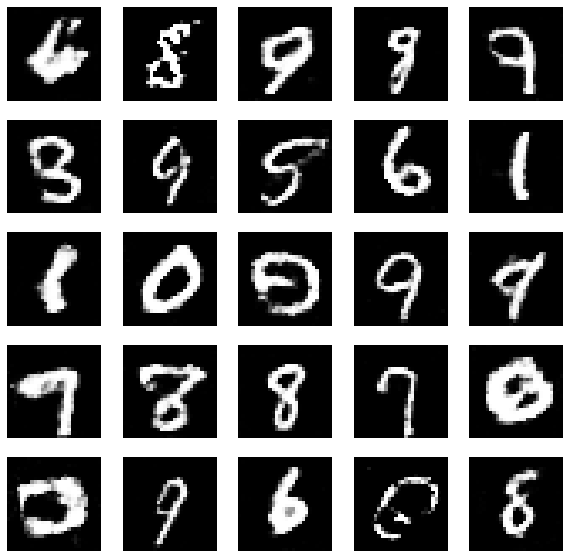

17250 [D loss: 0.555850, acc.: 71.48%] [G loss: 1.477537]


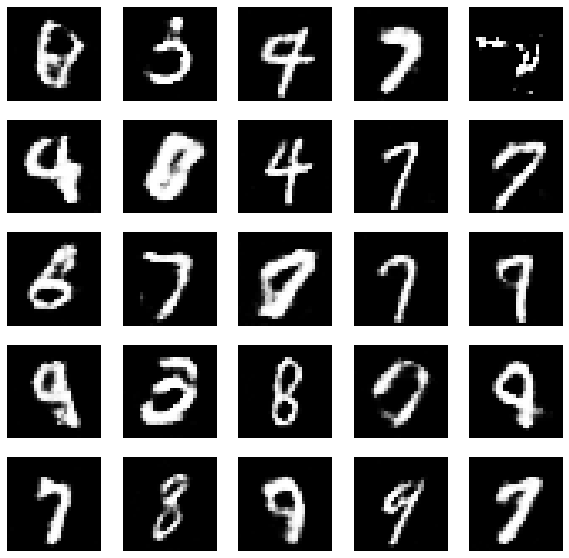

17400 [D loss: 0.635457, acc.: 62.50%] [G loss: 1.363591]


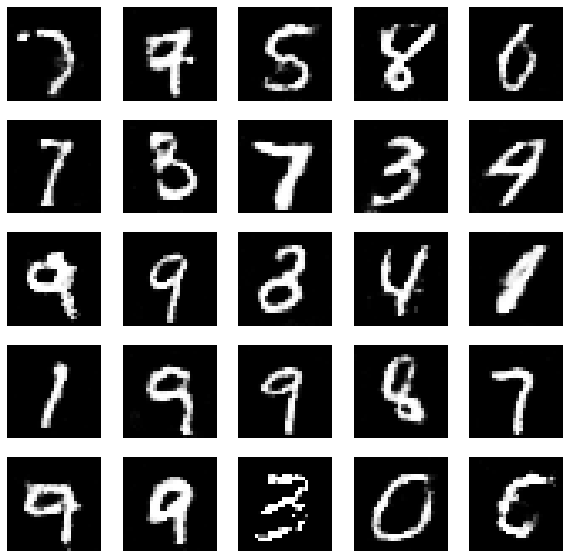

17550 [D loss: 0.572727, acc.: 73.44%] [G loss: 1.512788]


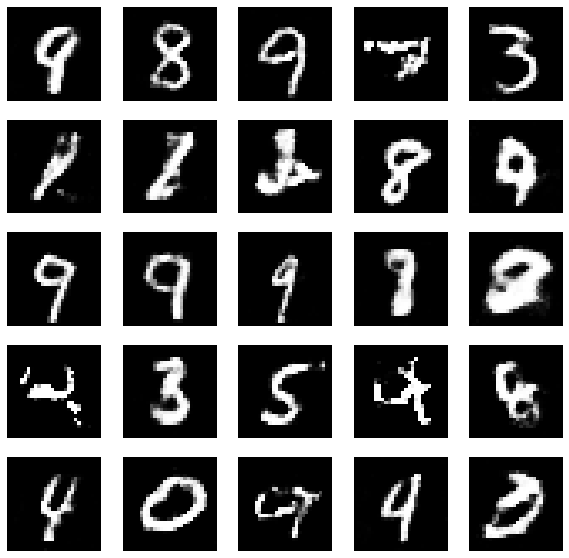

17700 [D loss: 0.627919, acc.: 65.23%] [G loss: 1.452439]


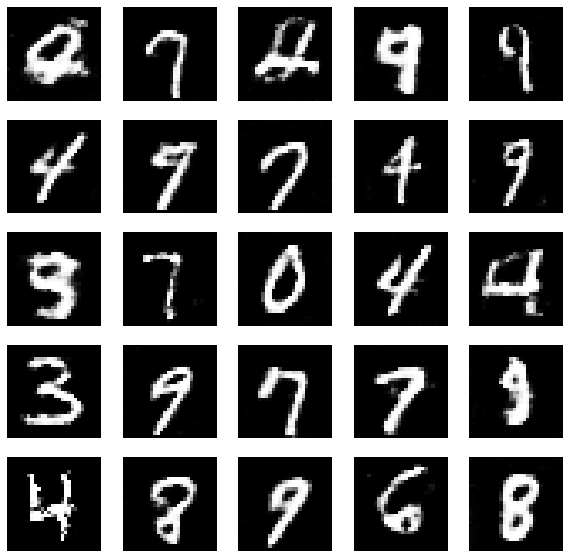

17850 [D loss: 0.570578, acc.: 69.92%] [G loss: 1.521739]


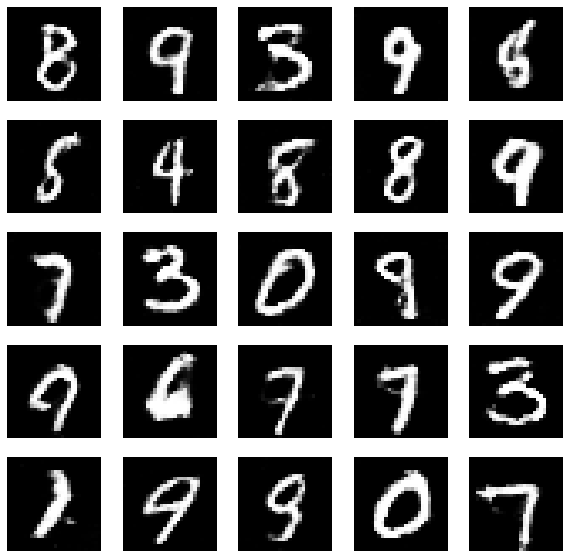

18000 [D loss: 0.621512, acc.: 63.28%] [G loss: 1.410617]


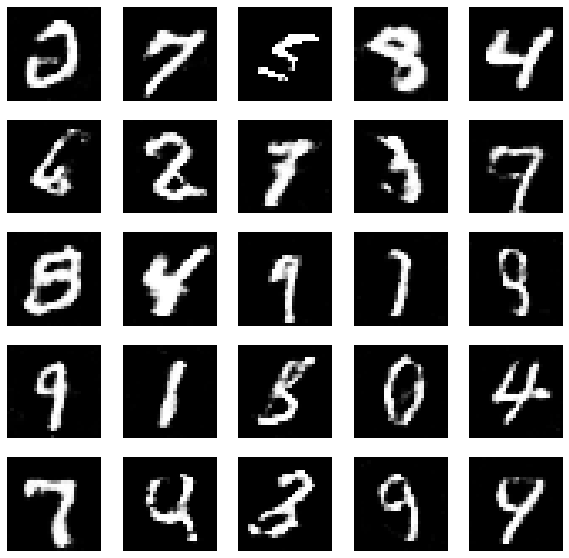

18150 [D loss: 0.587250, acc.: 67.19%] [G loss: 1.417897]


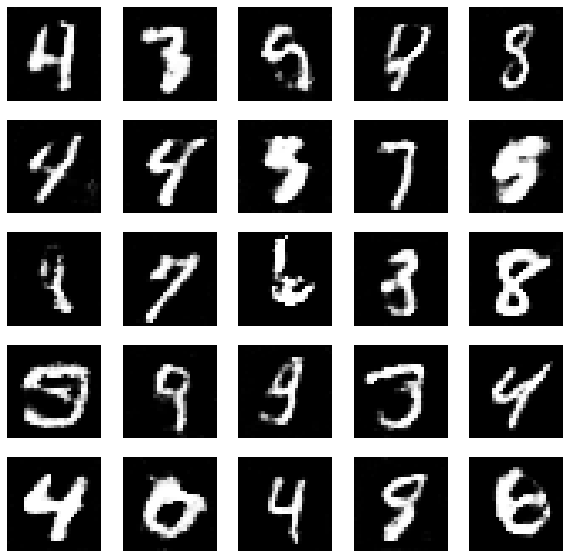

18300 [D loss: 0.597137, acc.: 67.97%] [G loss: 1.563157]


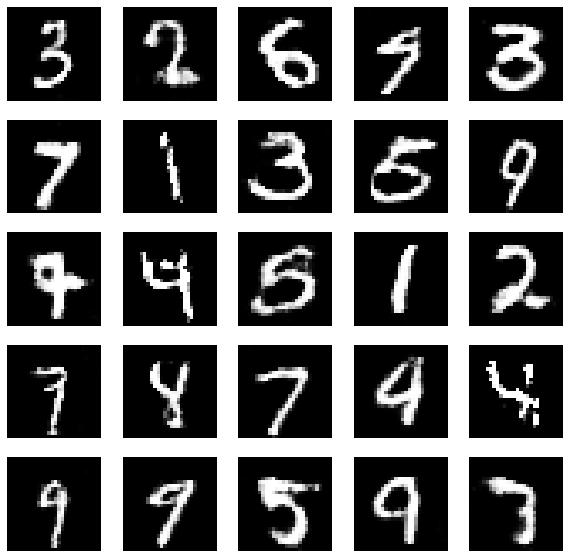

18450 [D loss: 0.611977, acc.: 66.80%] [G loss: 1.404523]


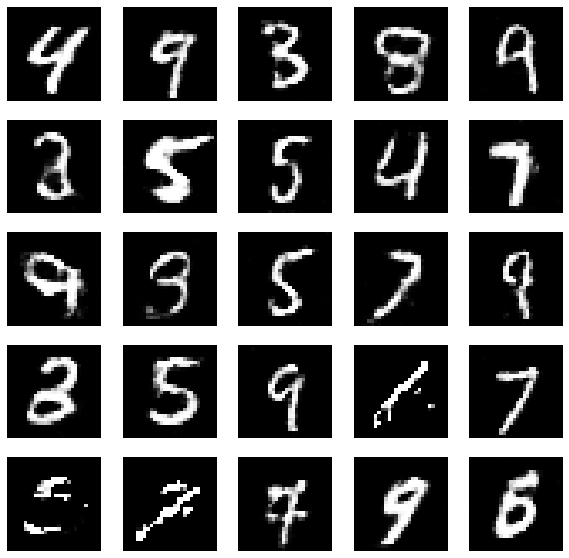

18600 [D loss: 0.567166, acc.: 69.92%] [G loss: 1.490484]


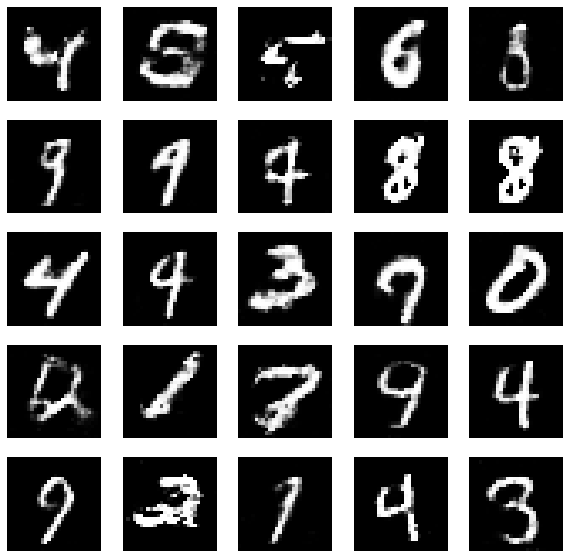

18750 [D loss: 0.554630, acc.: 67.97%] [G loss: 1.496702]


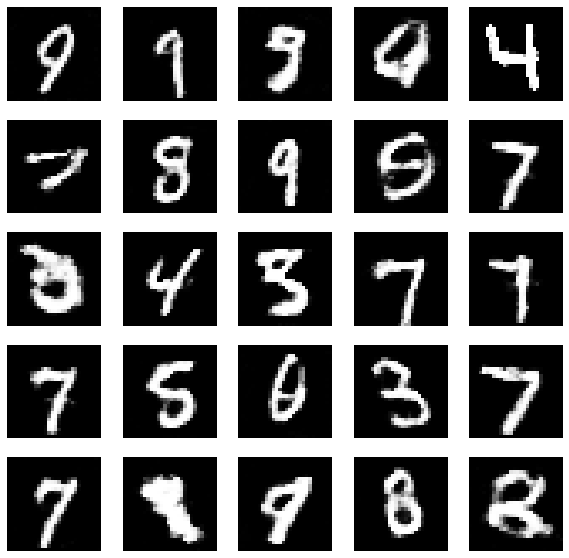

18900 [D loss: 0.610667, acc.: 64.84%] [G loss: 1.395242]


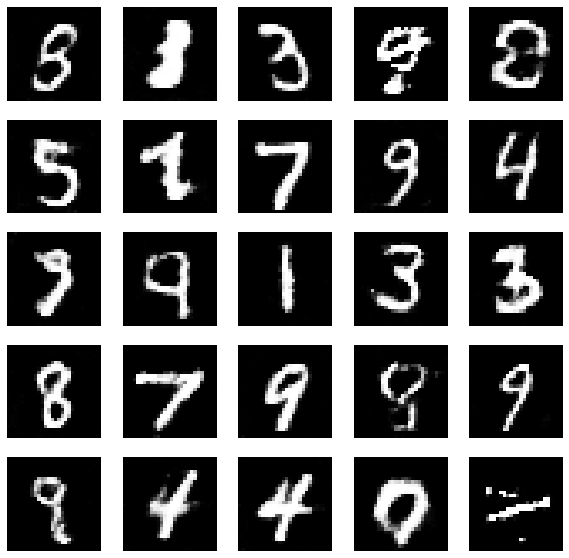

19050 [D loss: 0.643425, acc.: 62.89%] [G loss: 1.381992]


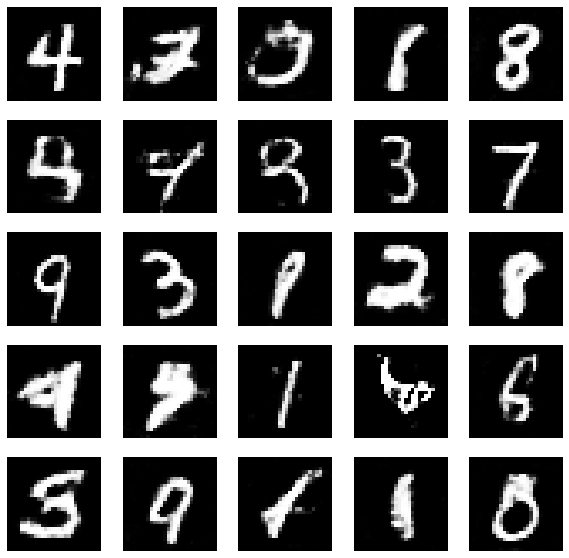

19200 [D loss: 0.611091, acc.: 65.23%] [G loss: 1.373398]


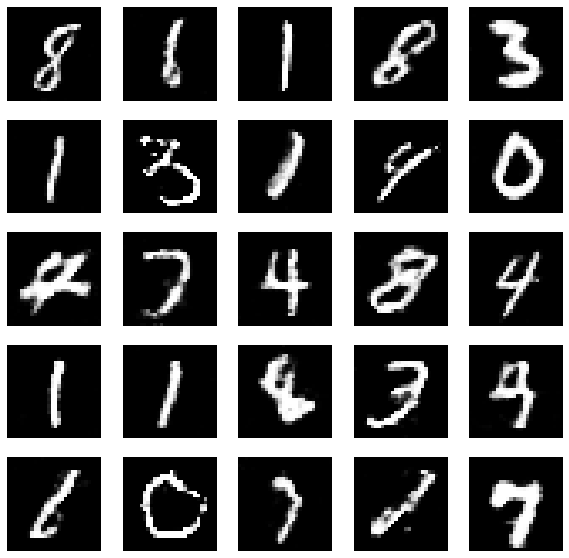

19350 [D loss: 0.658346, acc.: 56.64%] [G loss: 1.281446]


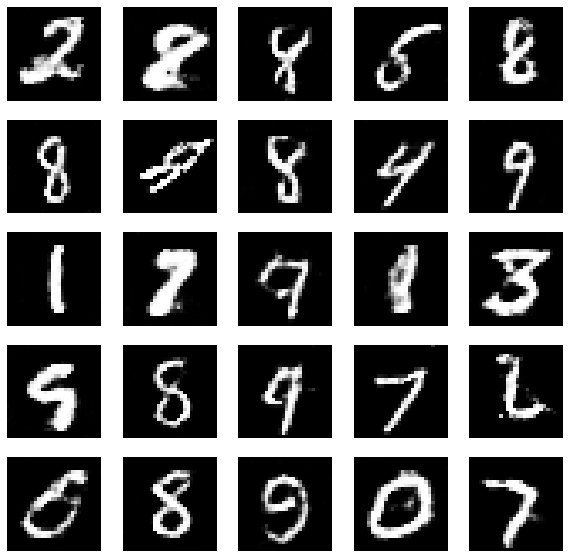

19500 [D loss: 0.612584, acc.: 64.45%] [G loss: 1.395691]


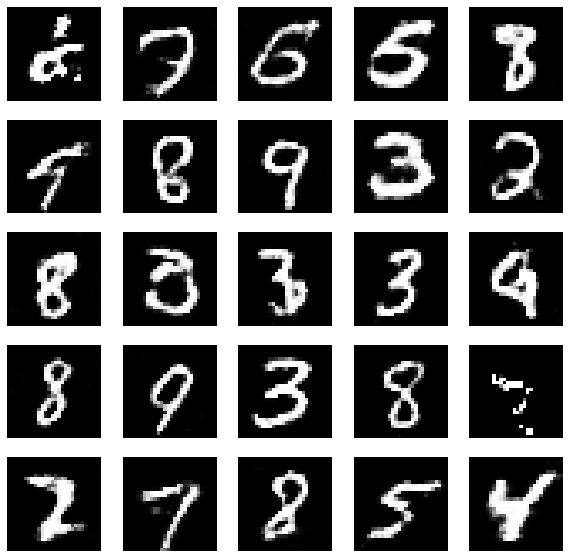

19650 [D loss: 0.593952, acc.: 67.19%] [G loss: 1.391412]


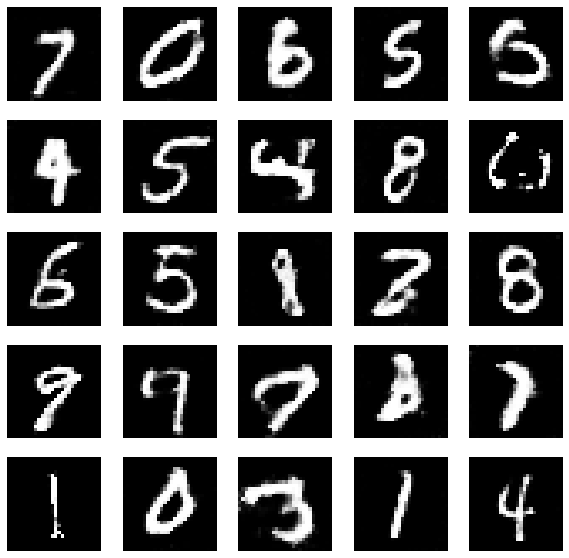

19800 [D loss: 0.612010, acc.: 63.28%] [G loss: 1.442336]


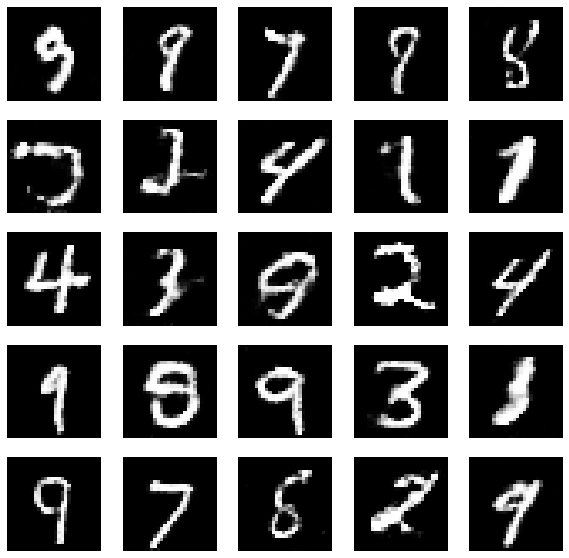

19950 [D loss: 0.689812, acc.: 58.20%] [G loss: 1.245101]


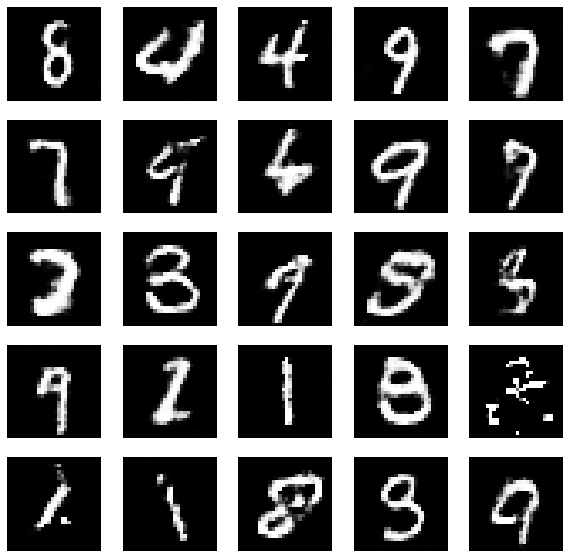

20100 [D loss: 0.580073, acc.: 67.97%] [G loss: 1.374912]


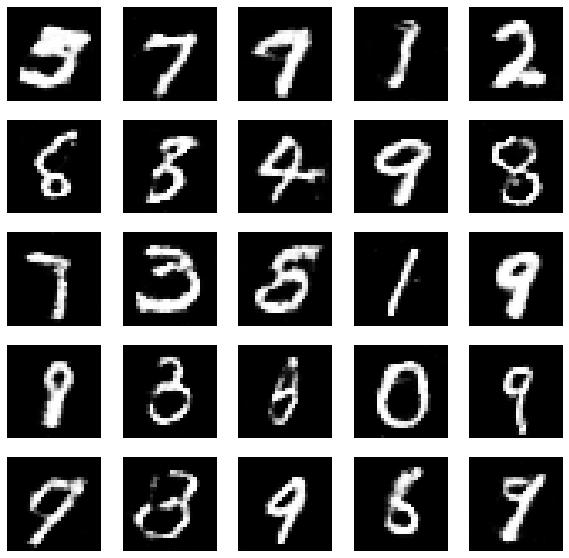

20250 [D loss: 0.573022, acc.: 71.48%] [G loss: 1.412906]


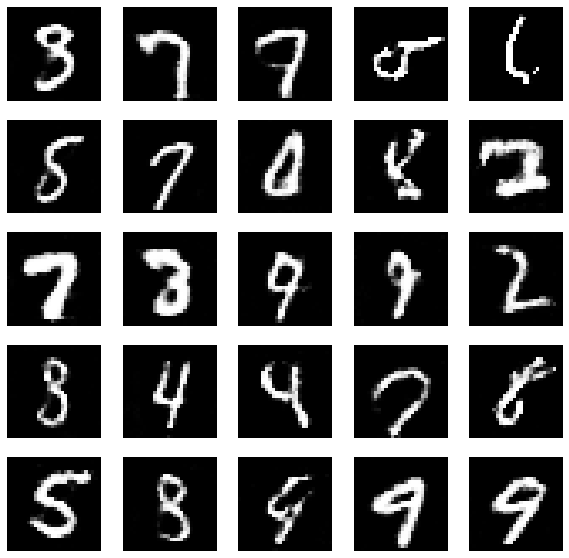

20400 [D loss: 0.614412, acc.: 60.94%] [G loss: 1.373292]


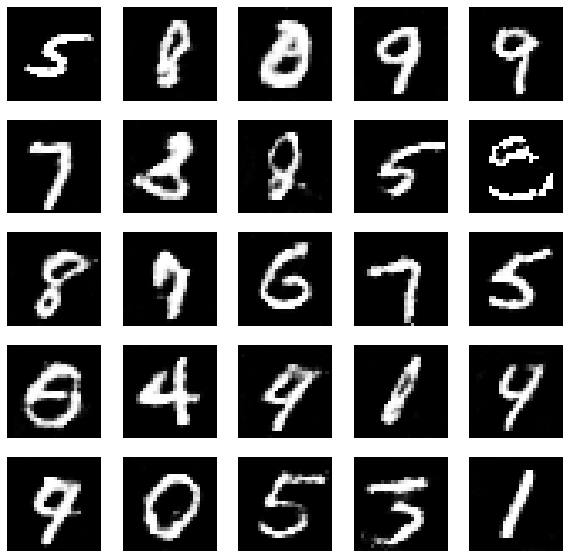

20550 [D loss: 0.556557, acc.: 71.09%] [G loss: 1.387115]


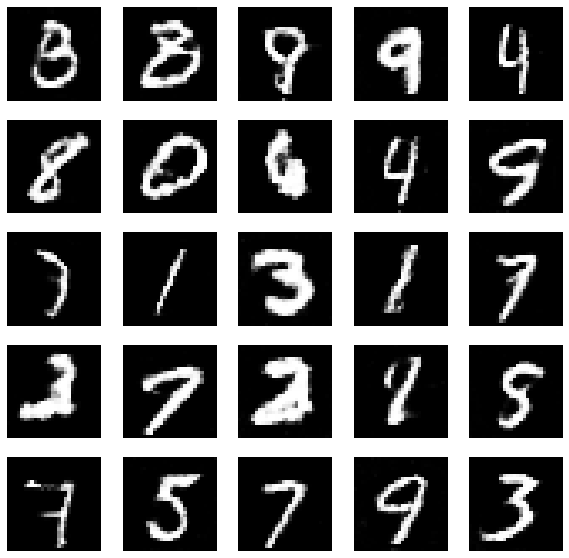

20700 [D loss: 0.659640, acc.: 61.72%] [G loss: 1.375646]


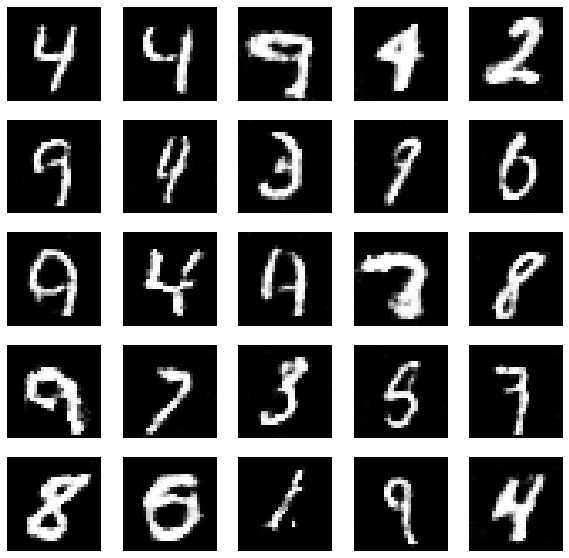

20850 [D loss: 0.580536, acc.: 70.70%] [G loss: 1.341078]


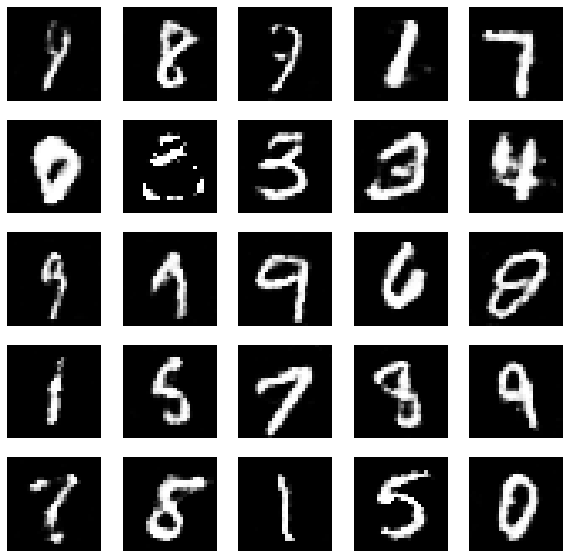

21000 [D loss: 0.586166, acc.: 67.97%] [G loss: 1.423314]


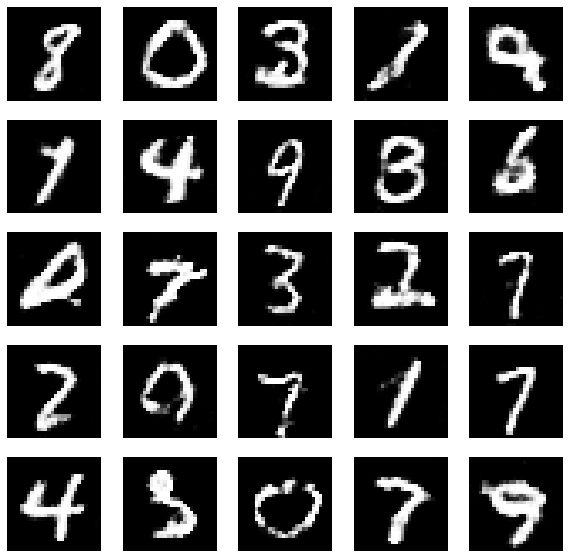

21150 [D loss: 0.629972, acc.: 65.62%] [G loss: 1.365618]


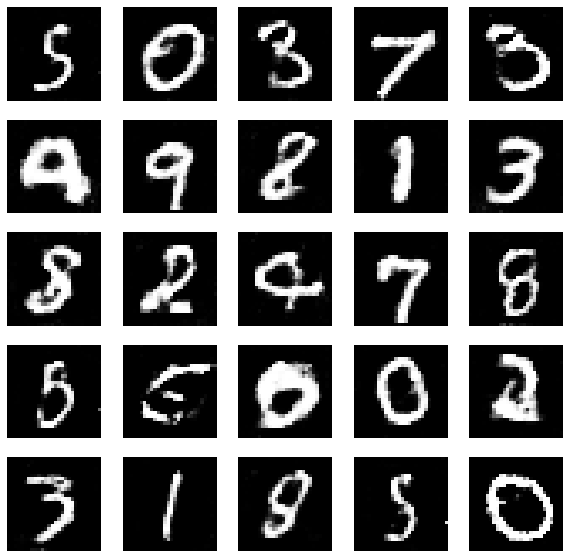

21300 [D loss: 0.604333, acc.: 63.67%] [G loss: 1.319991]


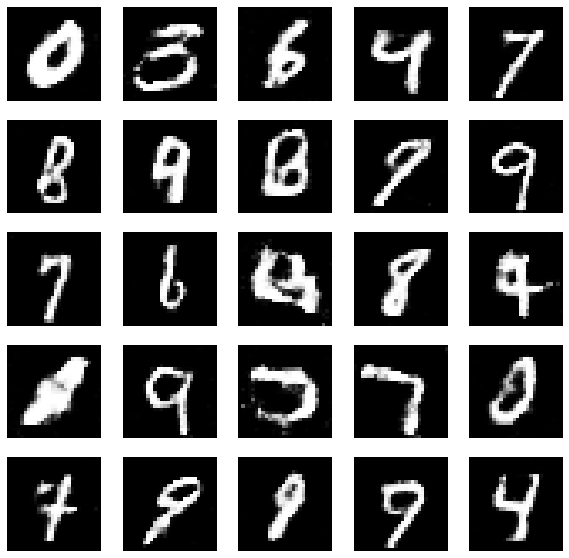

21450 [D loss: 0.556773, acc.: 68.75%] [G loss: 1.436140]


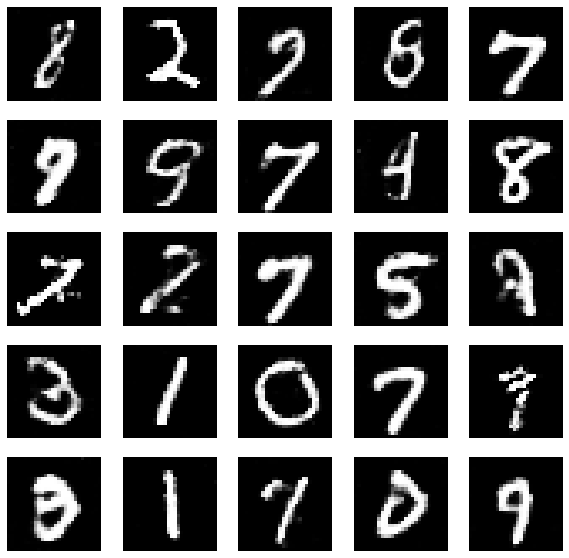

21600 [D loss: 0.591810, acc.: 69.53%] [G loss: 1.405772]


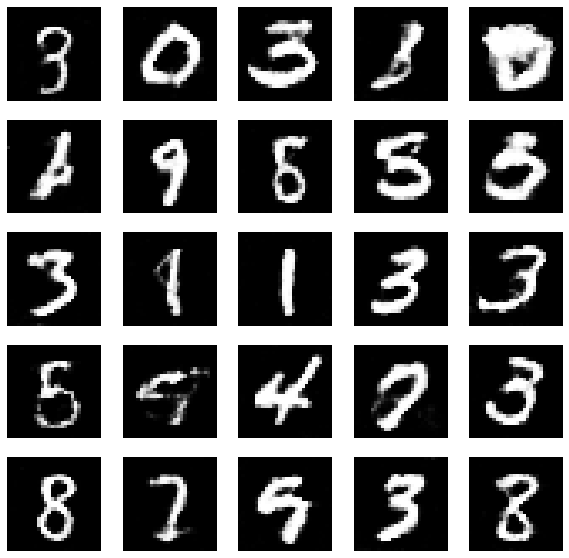

21750 [D loss: 0.738209, acc.: 53.12%] [G loss: 1.243400]


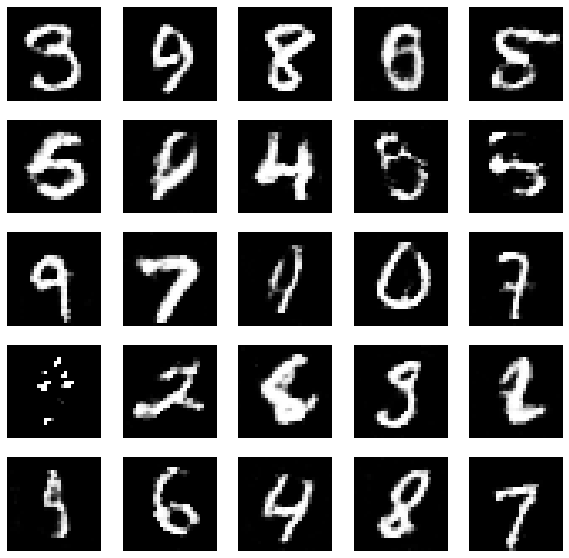

21900 [D loss: 0.627787, acc.: 64.45%] [G loss: 1.330450]


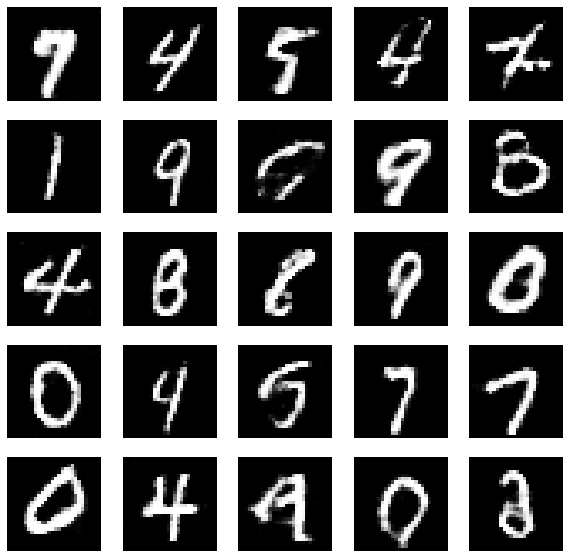

22050 [D loss: 0.588129, acc.: 68.36%] [G loss: 1.413850]


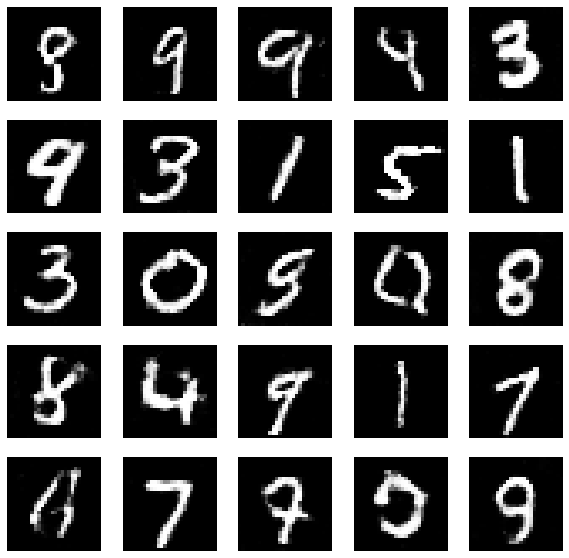

22200 [D loss: 0.601678, acc.: 68.36%] [G loss: 1.327732]


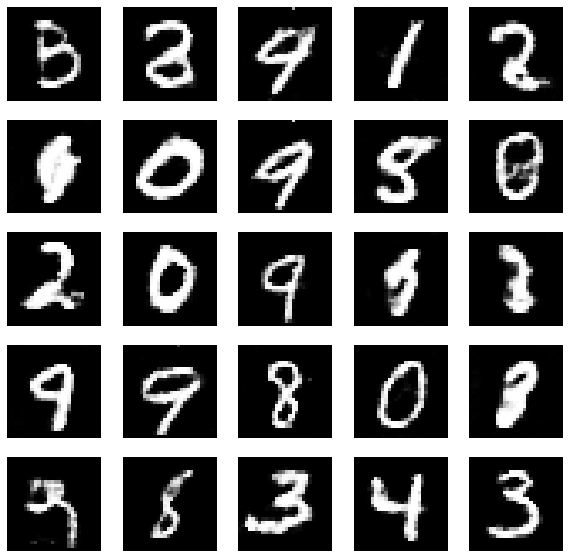

22350 [D loss: 0.627662, acc.: 63.67%] [G loss: 1.343627]


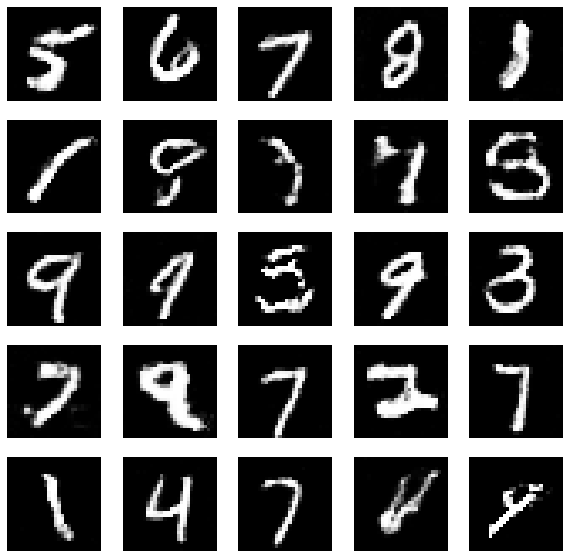

22500 [D loss: 0.594451, acc.: 65.62%] [G loss: 1.378571]


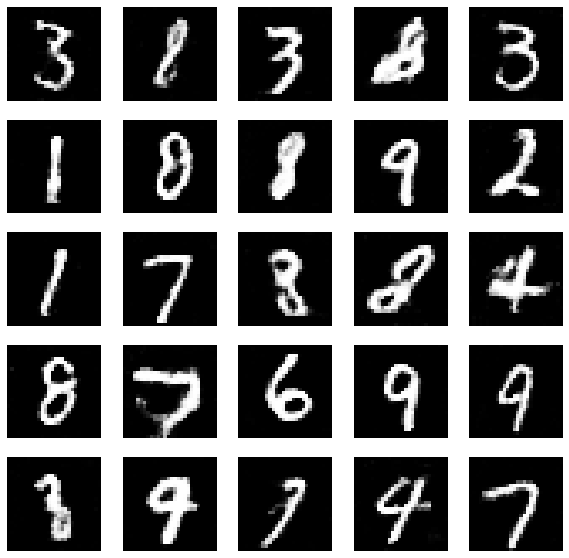

22650 [D loss: 0.642338, acc.: 62.89%] [G loss: 1.310552]


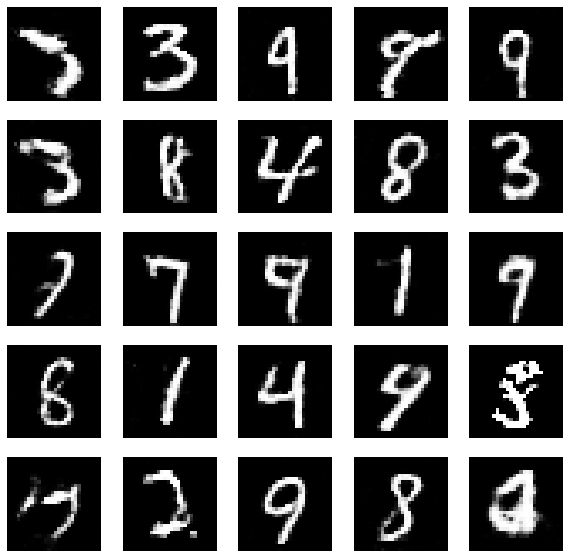

22800 [D loss: 0.632766, acc.: 63.28%] [G loss: 1.325786]


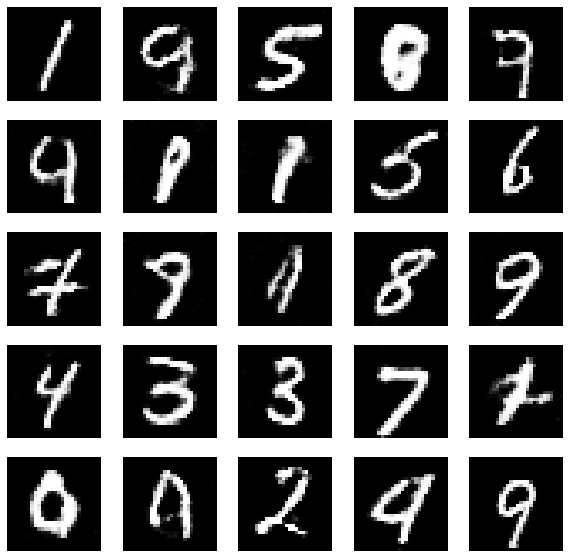

22950 [D loss: 0.619718, acc.: 62.89%] [G loss: 1.349702]


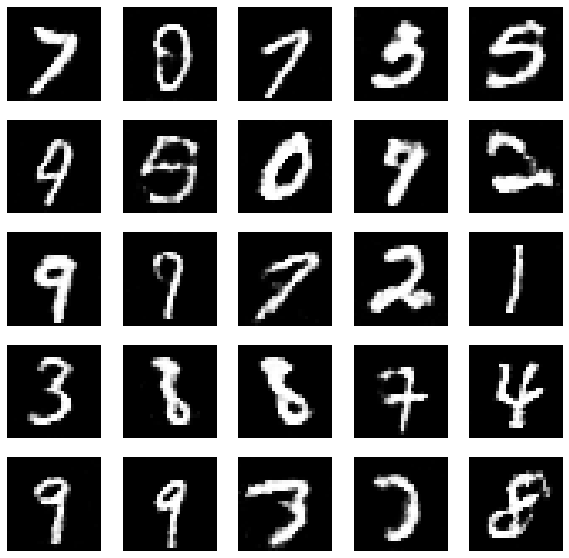

23100 [D loss: 0.641219, acc.: 62.50%] [G loss: 1.328393]


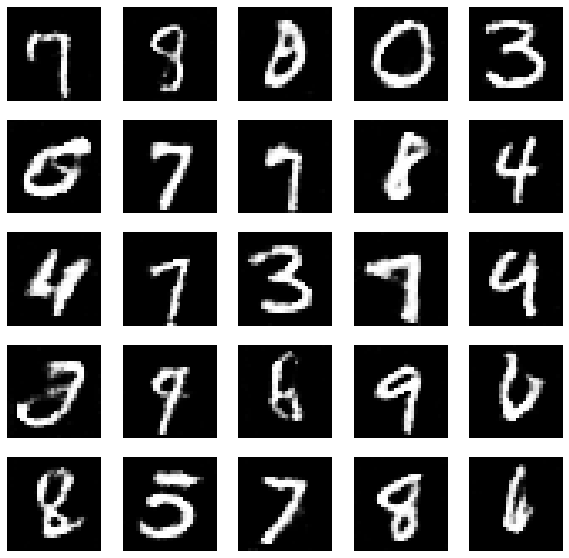

23250 [D loss: 0.596885, acc.: 68.36%] [G loss: 1.440245]


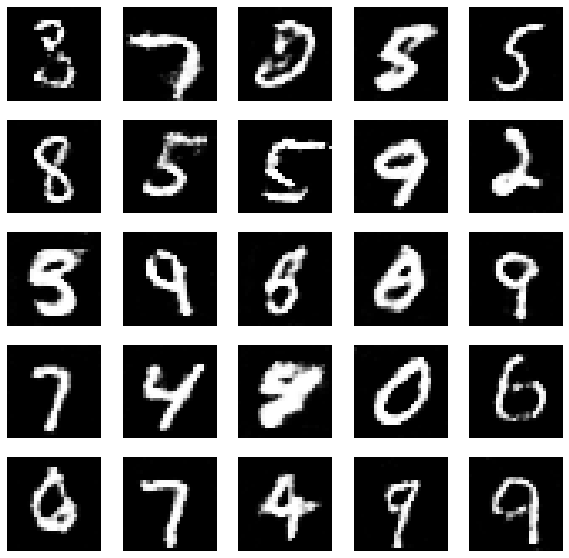

23400 [D loss: 0.686359, acc.: 58.98%] [G loss: 1.270584]


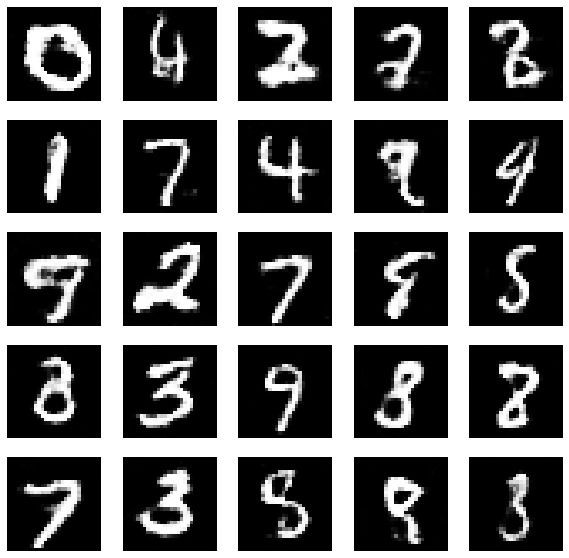

23550 [D loss: 0.648424, acc.: 60.16%] [G loss: 1.342192]


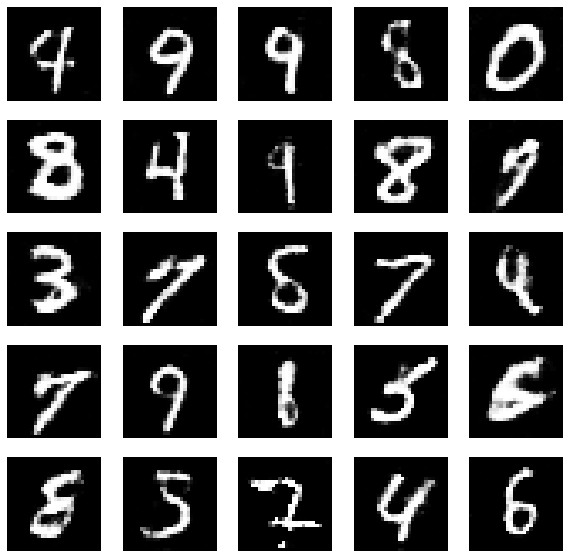

23700 [D loss: 0.673116, acc.: 59.38%] [G loss: 1.266099]


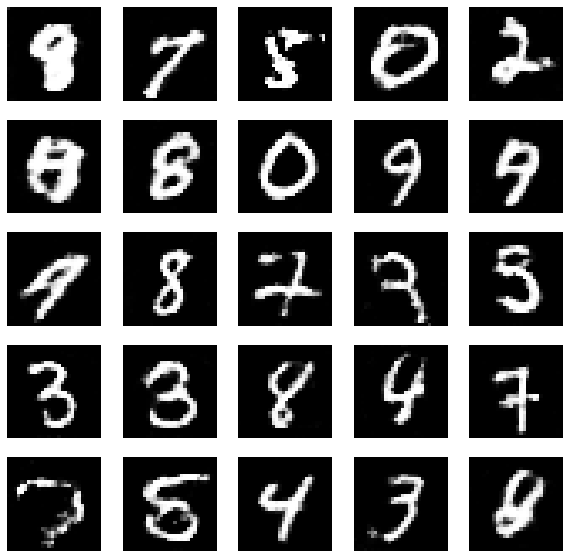

23850 [D loss: 0.613324, acc.: 64.45%] [G loss: 1.356264]


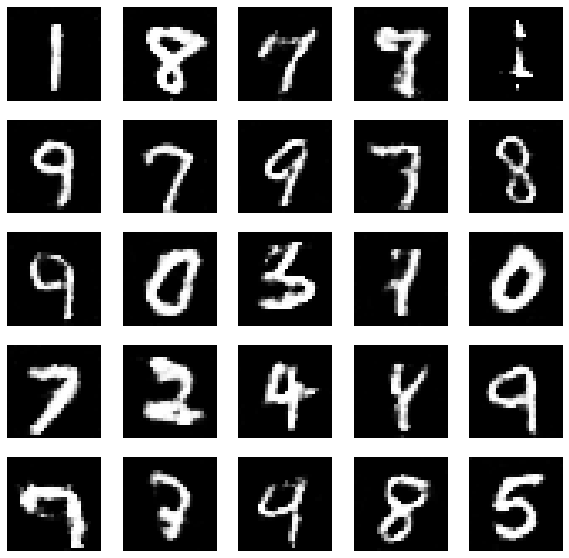

24000 [D loss: 0.626426, acc.: 63.28%] [G loss: 1.338956]


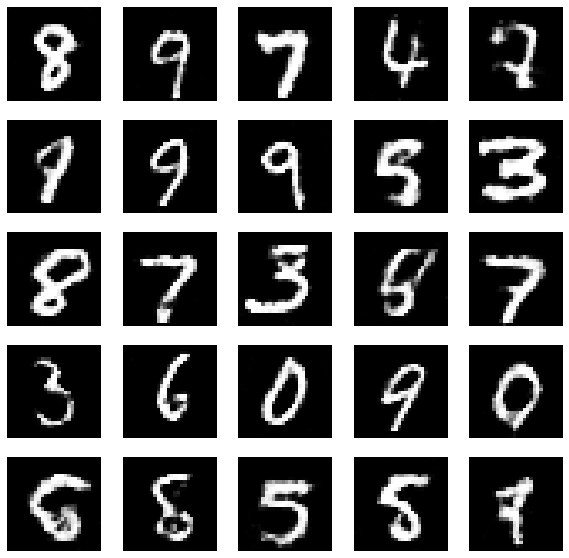

24150 [D loss: 0.618520, acc.: 66.80%] [G loss: 1.326172]


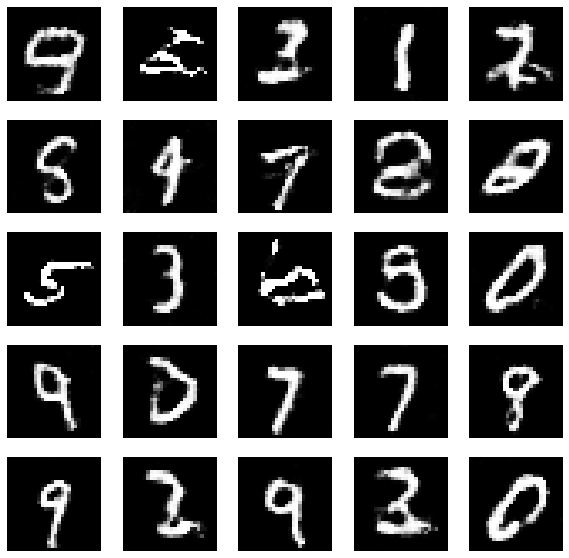

24300 [D loss: 0.592465, acc.: 67.19%] [G loss: 1.423501]


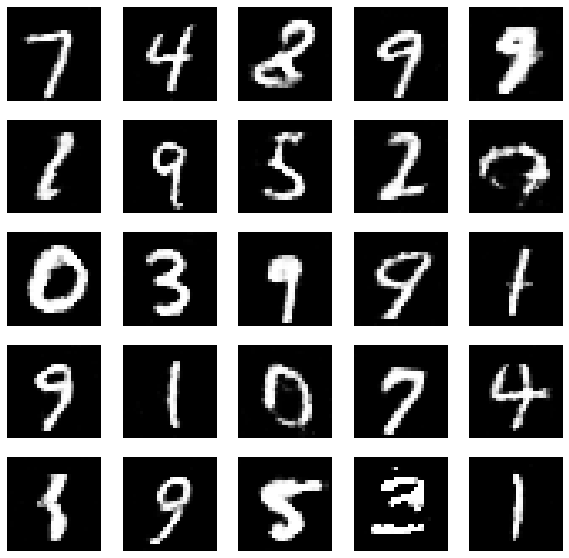

24450 [D loss: 0.695742, acc.: 54.69%] [G loss: 1.238499]


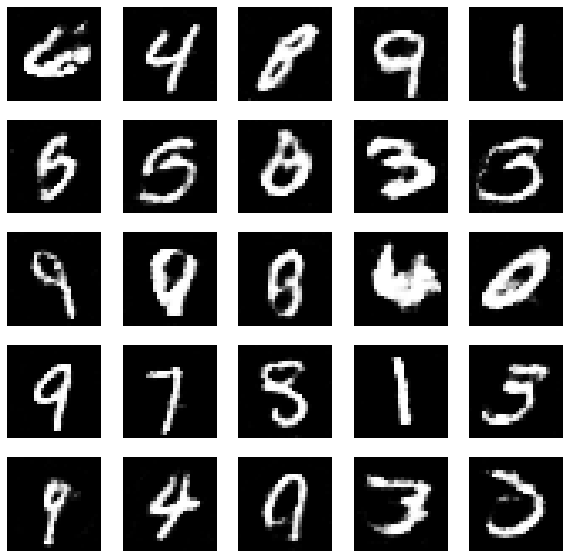

24600 [D loss: 0.611363, acc.: 64.84%] [G loss: 1.340869]


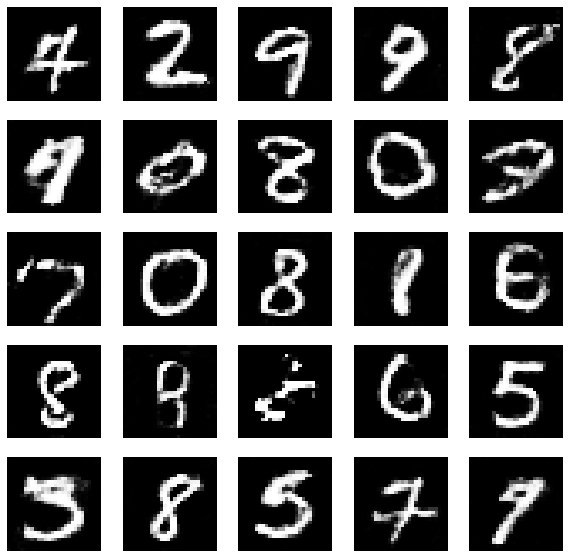

24750 [D loss: 0.635667, acc.: 64.45%] [G loss: 1.385793]


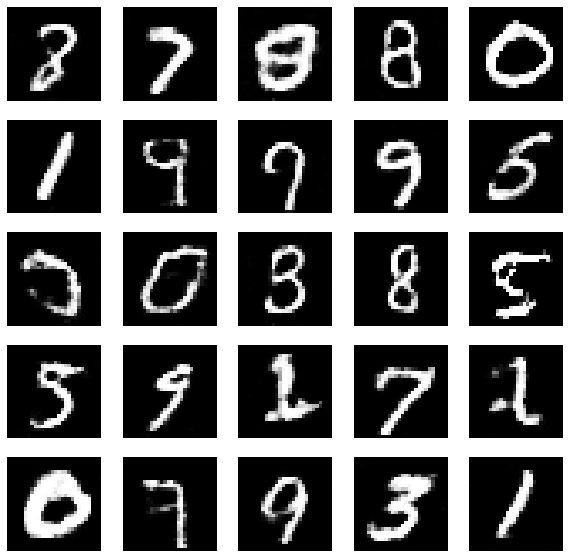

24900 [D loss: 0.620446, acc.: 64.45%] [G loss: 1.242137]


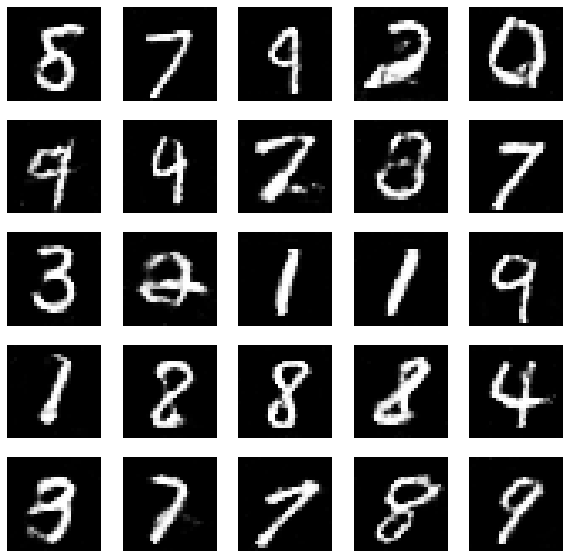

25050 [D loss: 0.585480, acc.: 68.36%] [G loss: 1.388989]


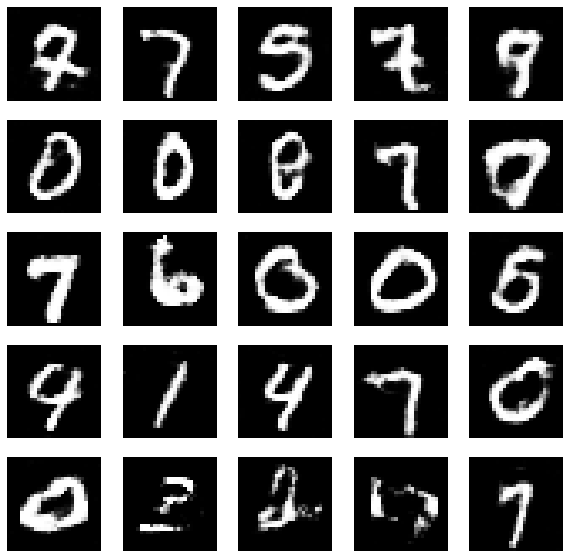

25200 [D loss: 0.668168, acc.: 56.64%] [G loss: 1.230259]


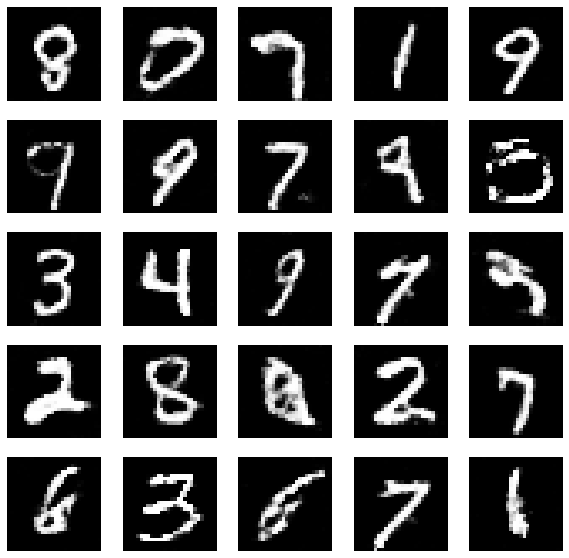

25350 [D loss: 0.620201, acc.: 62.50%] [G loss: 1.367469]


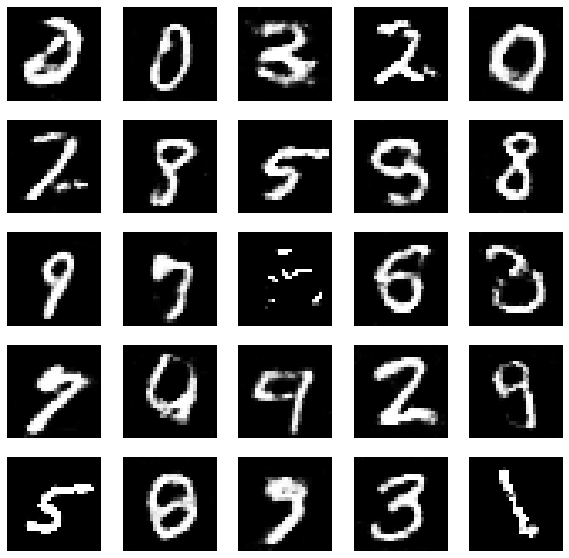

25500 [D loss: 0.637292, acc.: 64.84%] [G loss: 1.272112]


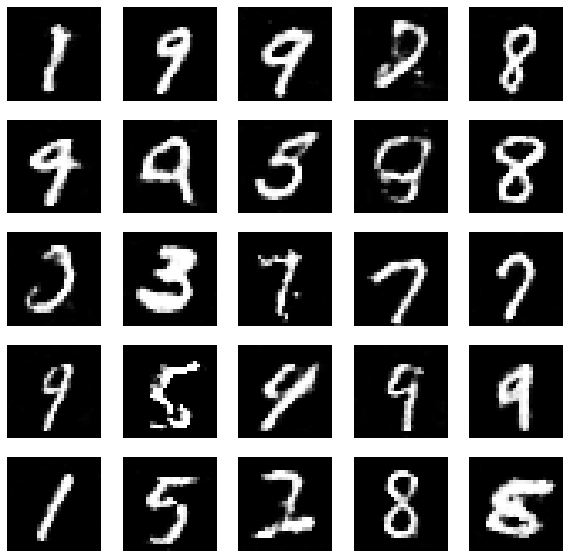

25650 [D loss: 0.671872, acc.: 57.42%] [G loss: 1.202228]


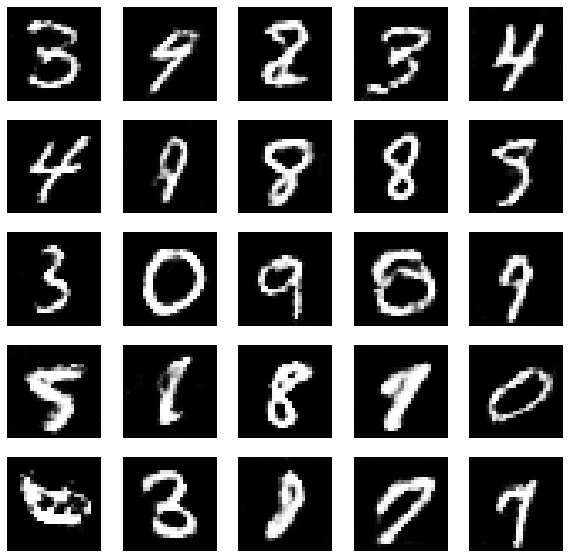

25800 [D loss: 0.647639, acc.: 58.59%] [G loss: 1.333770]


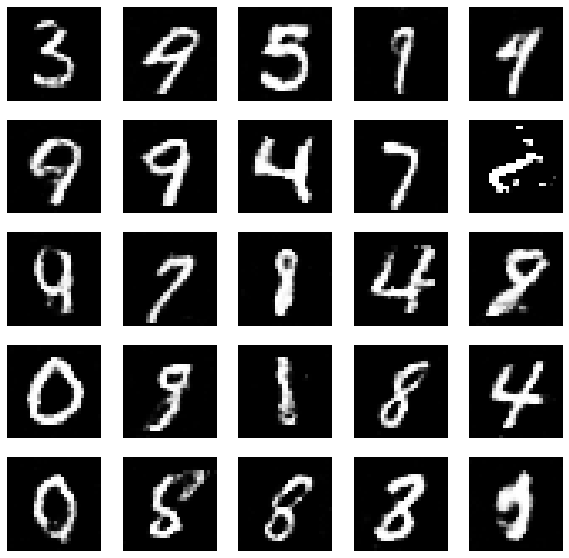

25950 [D loss: 0.621978, acc.: 64.84%] [G loss: 1.307231]


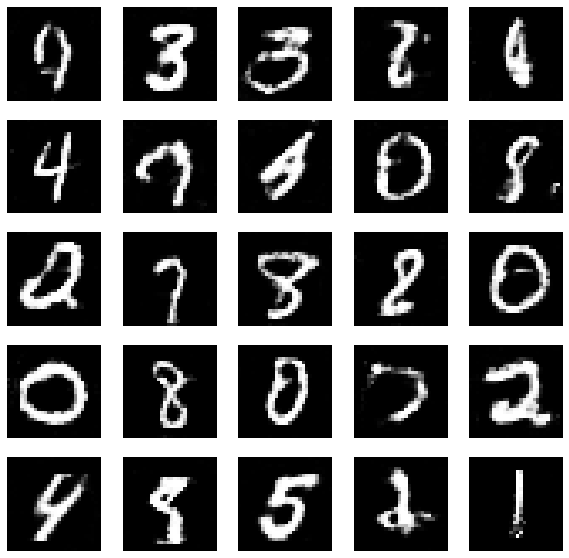

26100 [D loss: 0.584971, acc.: 69.14%] [G loss: 1.309939]


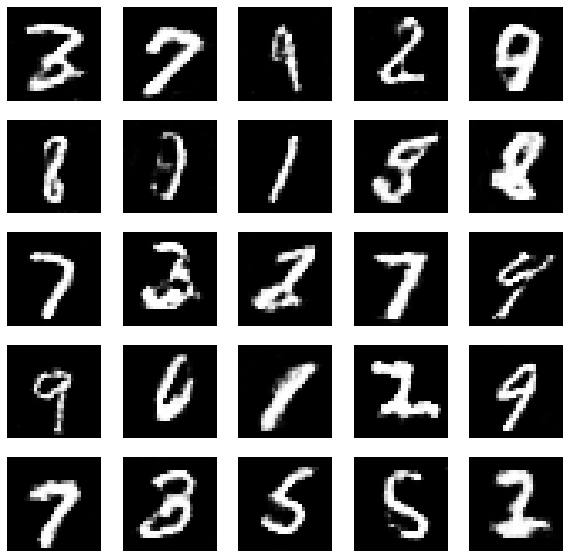

26250 [D loss: 0.578227, acc.: 68.36%] [G loss: 1.393584]


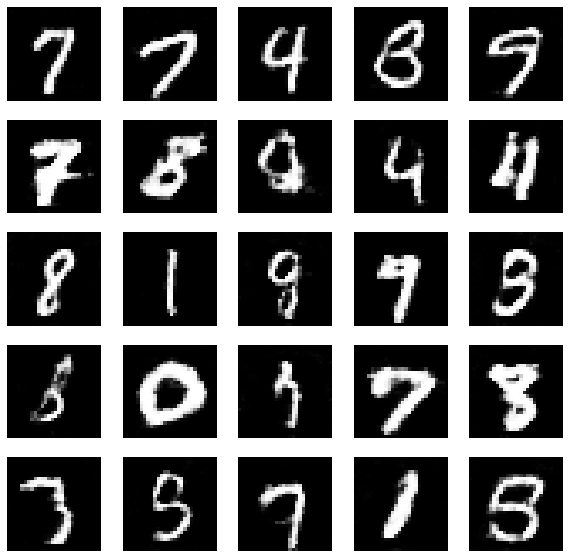

26400 [D loss: 0.634735, acc.: 62.89%] [G loss: 1.314891]


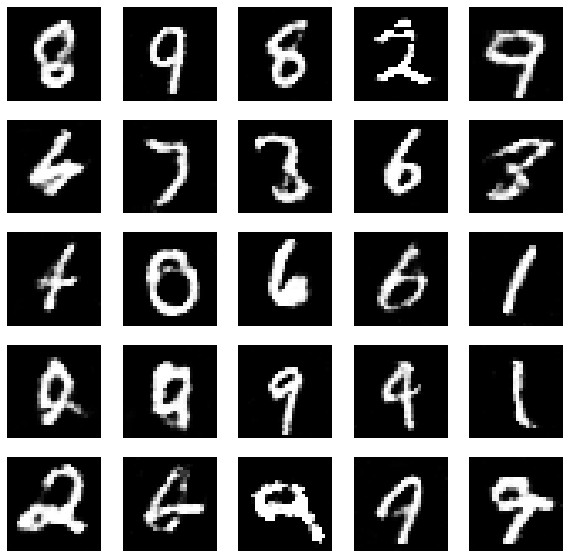

26550 [D loss: 0.632908, acc.: 62.50%] [G loss: 1.308224]


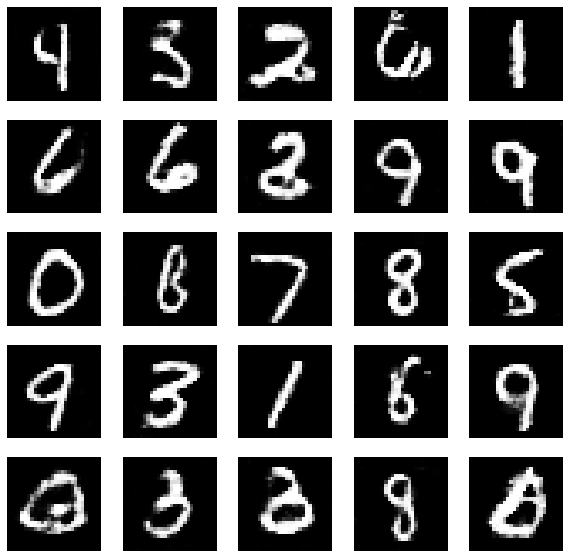

26700 [D loss: 0.665312, acc.: 61.33%] [G loss: 1.222371]


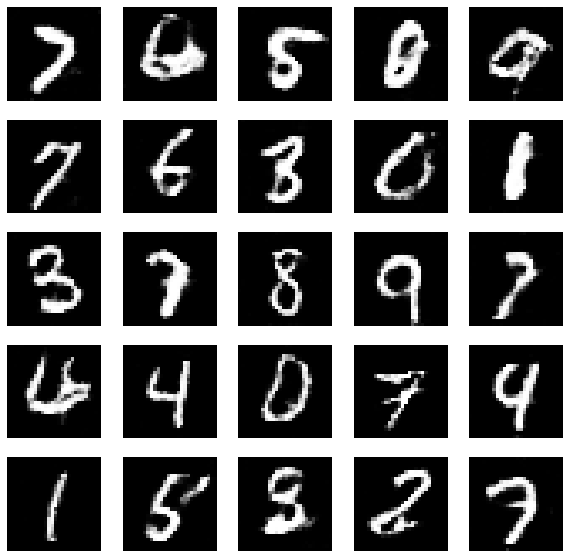

26850 [D loss: 0.653476, acc.: 57.42%] [G loss: 1.257982]


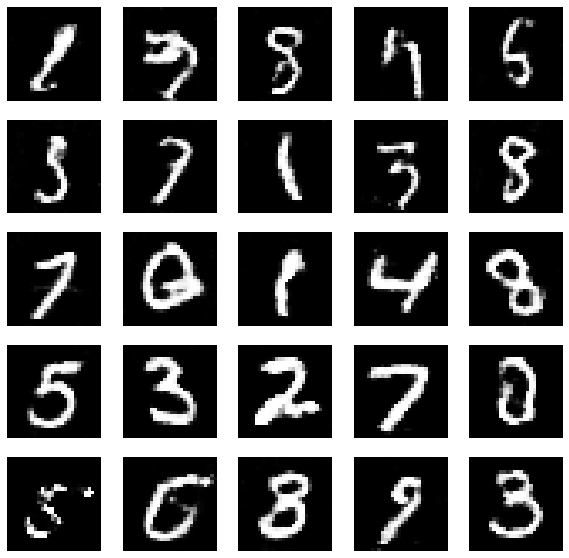

27000 [D loss: 0.625778, acc.: 60.55%] [G loss: 1.306277]


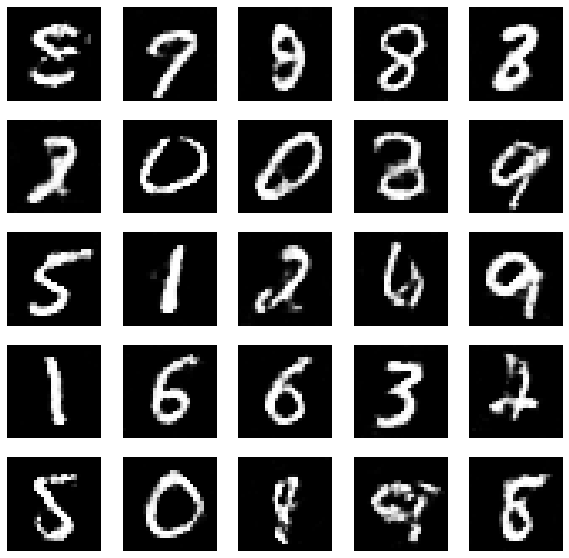

27150 [D loss: 0.692586, acc.: 57.03%] [G loss: 1.215659]


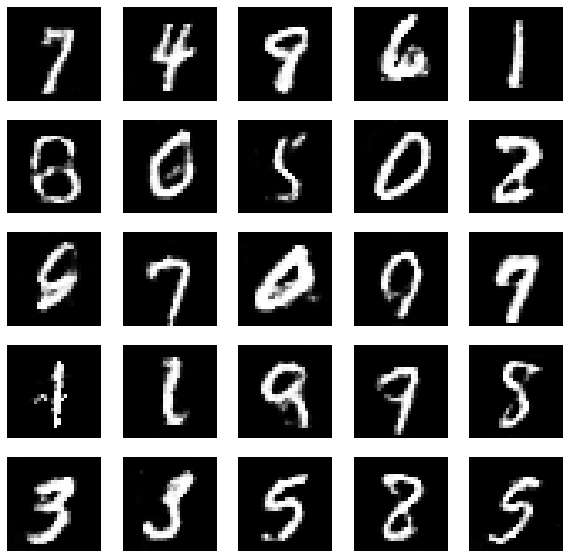

27300 [D loss: 0.699300, acc.: 57.42%] [G loss: 1.174077]


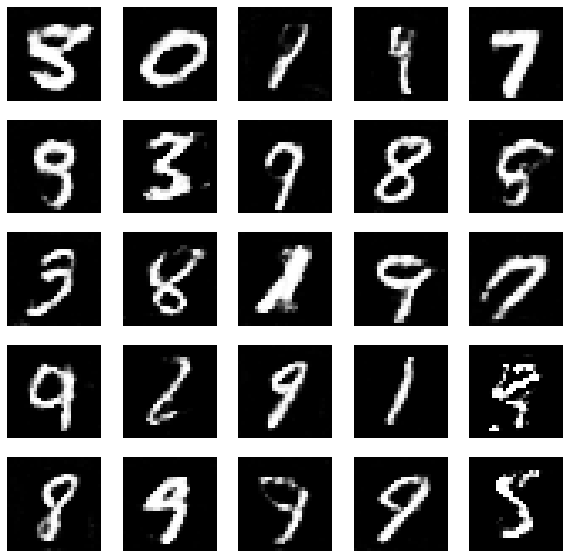

27450 [D loss: 0.635773, acc.: 60.16%] [G loss: 1.197240]


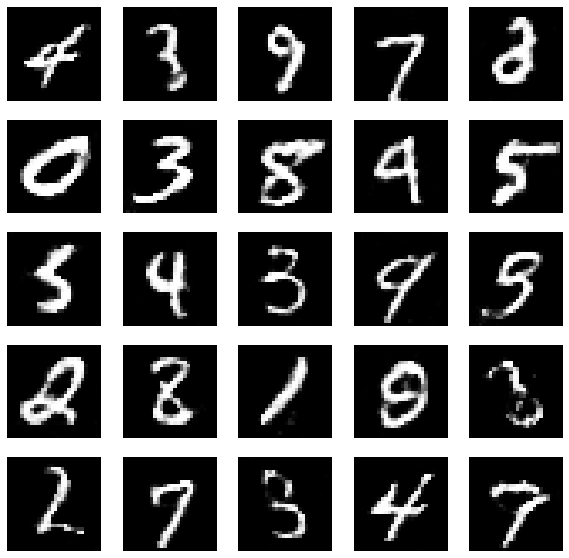

27600 [D loss: 0.667753, acc.: 58.20%] [G loss: 1.135642]


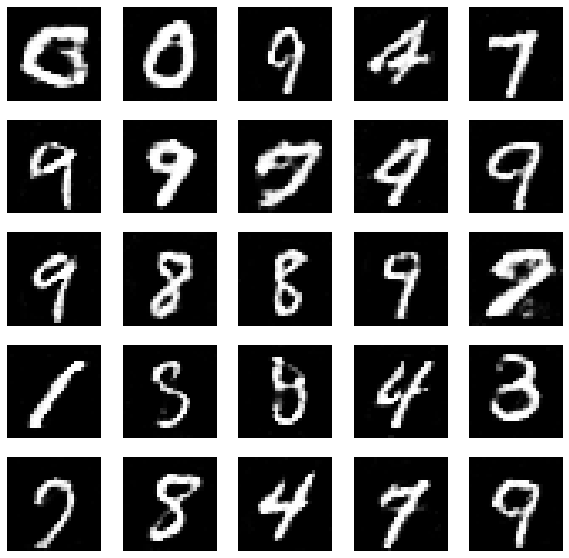

27750 [D loss: 0.648276, acc.: 60.55%] [G loss: 1.291881]


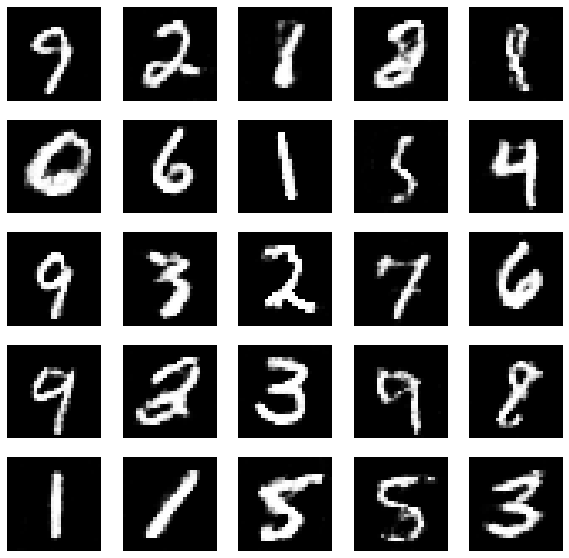

27900 [D loss: 0.640648, acc.: 61.33%] [G loss: 1.296499]


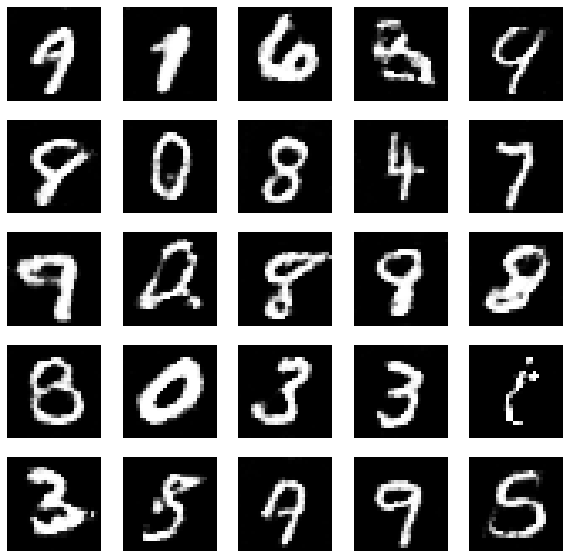

28050 [D loss: 0.585135, acc.: 68.75%] [G loss: 1.318125]


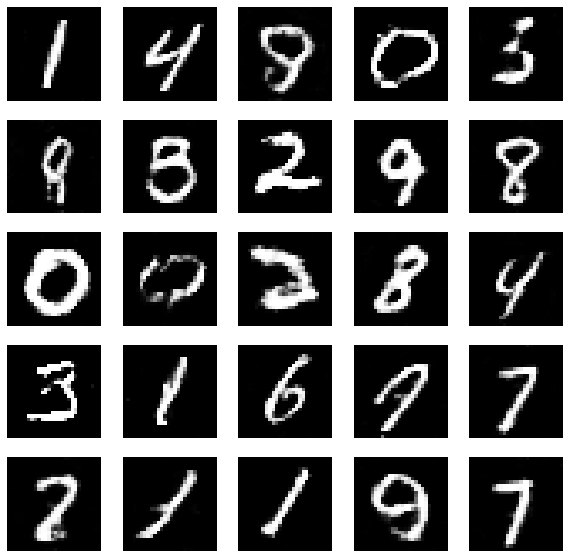

28200 [D loss: 0.653450, acc.: 60.16%] [G loss: 1.261945]


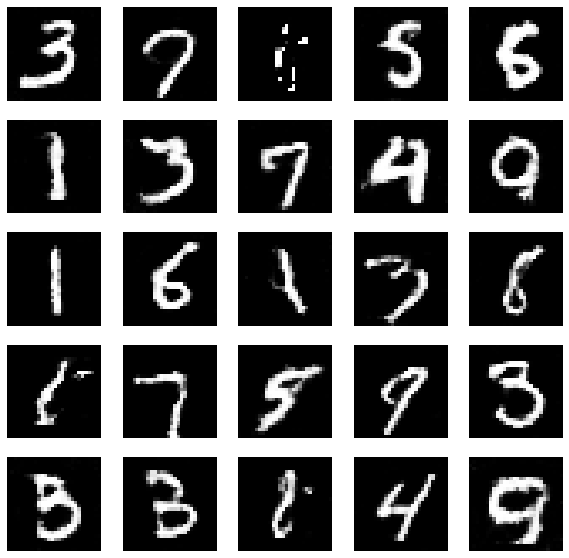

28350 [D loss: 0.667208, acc.: 55.47%] [G loss: 1.275110]


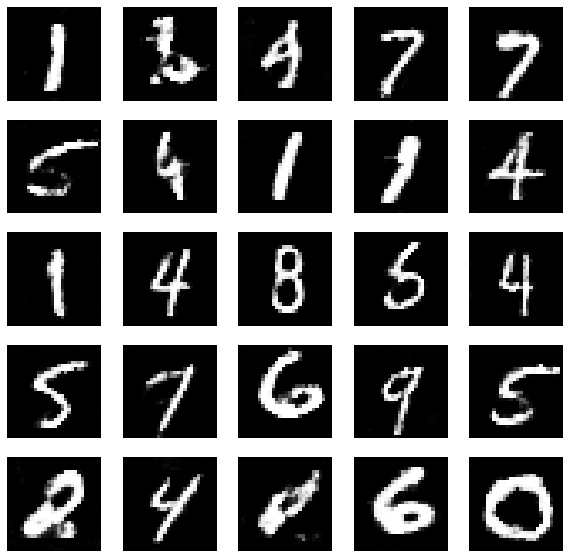

28500 [D loss: 0.603776, acc.: 69.14%] [G loss: 1.270324]


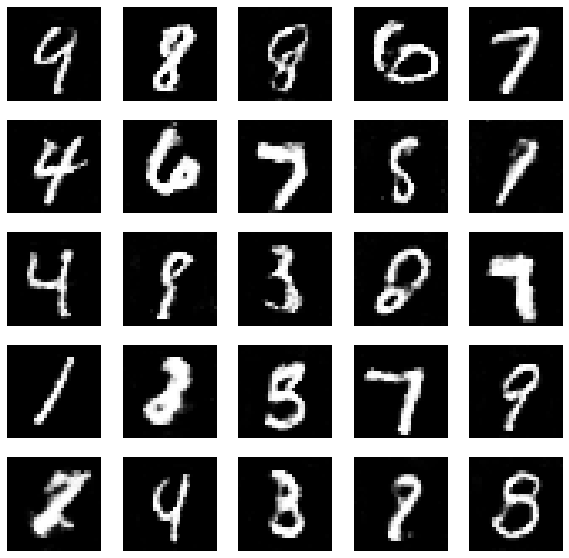

28650 [D loss: 0.632976, acc.: 64.45%] [G loss: 1.303475]


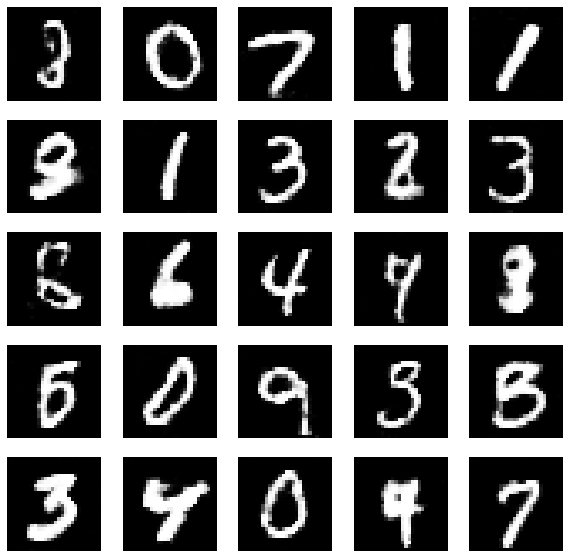

28800 [D loss: 0.678581, acc.: 56.25%] [G loss: 1.188665]


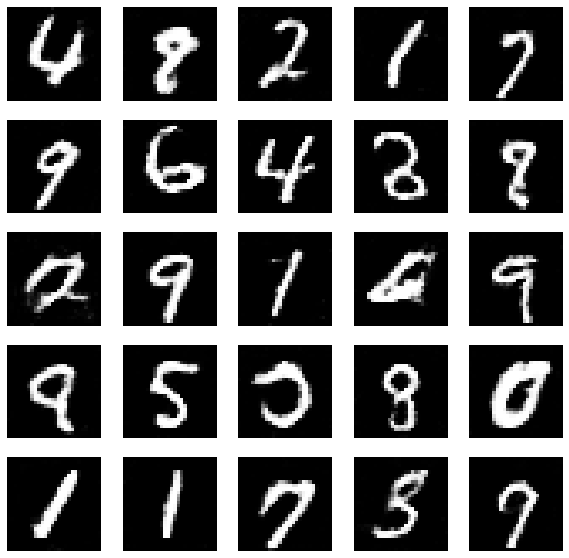

28950 [D loss: 0.654508, acc.: 59.77%] [G loss: 1.245859]


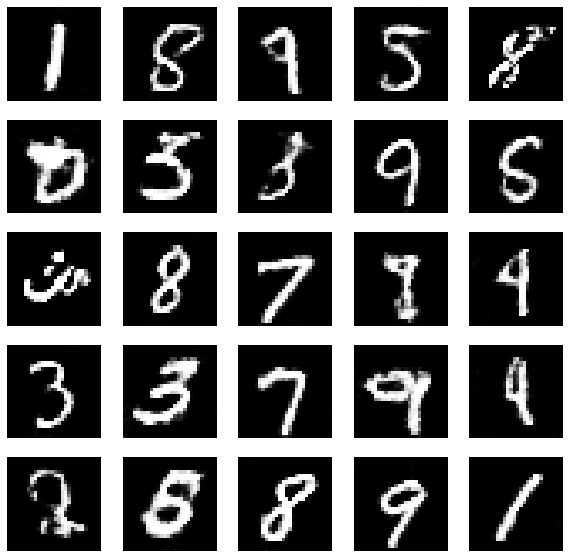

29100 [D loss: 0.625079, acc.: 62.50%] [G loss: 1.306782]


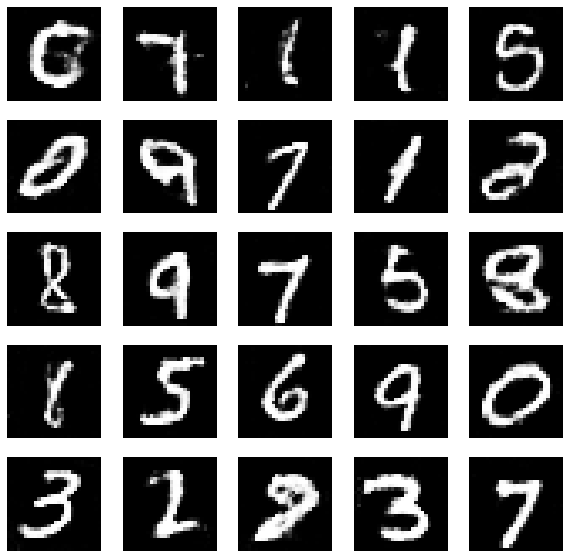

29250 [D loss: 0.596124, acc.: 69.92%] [G loss: 1.247003]


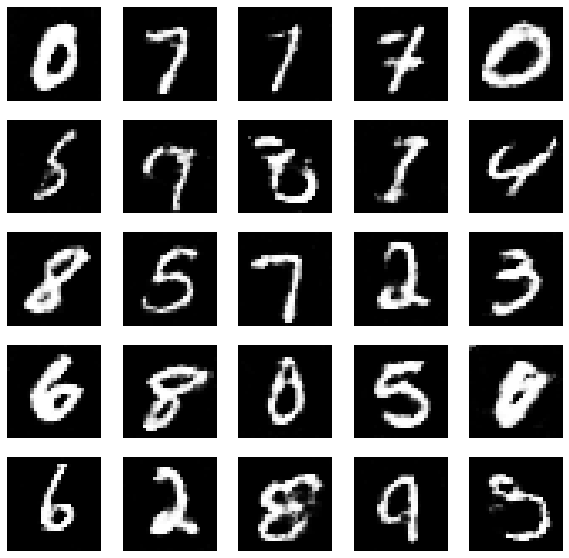

29400 [D loss: 0.618458, acc.: 64.84%] [G loss: 1.218804]


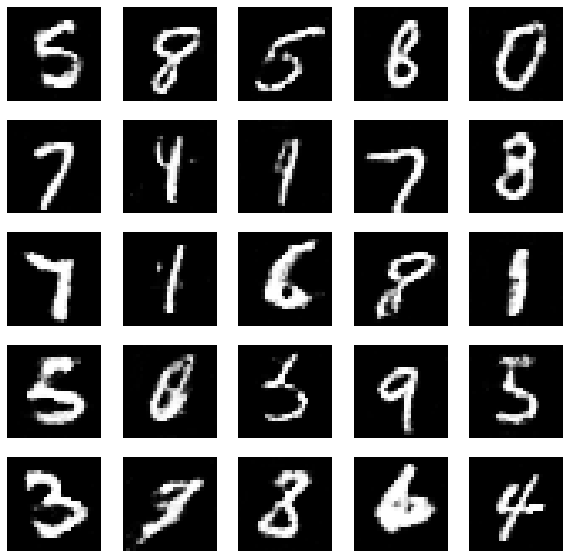

29550 [D loss: 0.632984, acc.: 66.41%] [G loss: 1.280452]


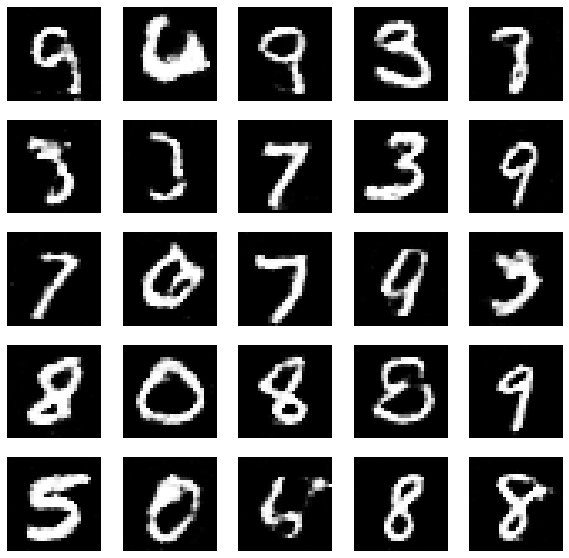

29700 [D loss: 0.633321, acc.: 61.33%] [G loss: 1.289089]


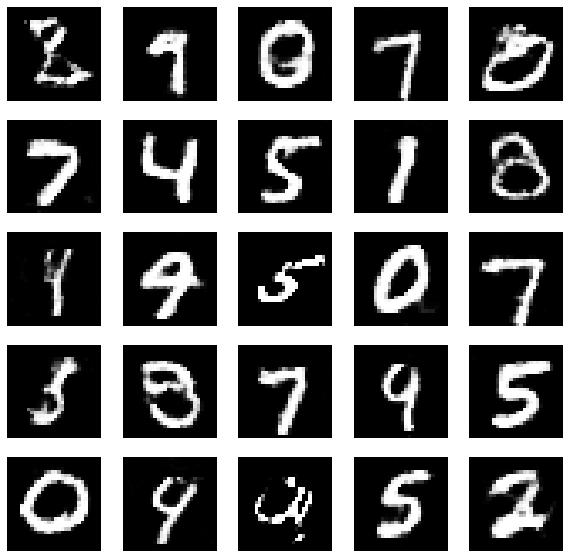

29850 [D loss: 0.625586, acc.: 66.80%] [G loss: 1.315064]


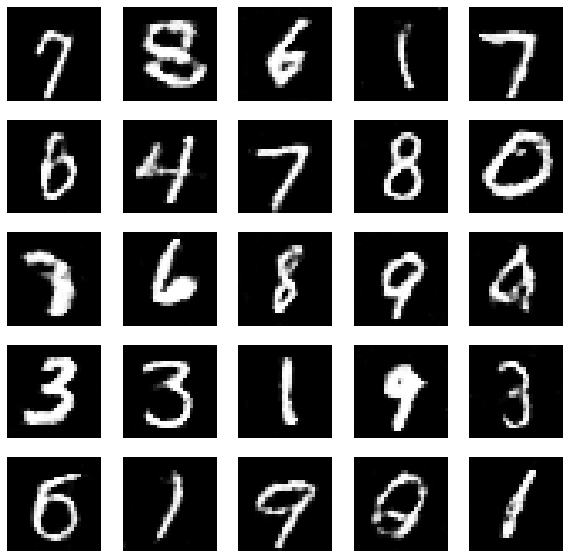

29999 [D loss: 0.685683, acc.: 57.03%] [G loss: 1.203360]


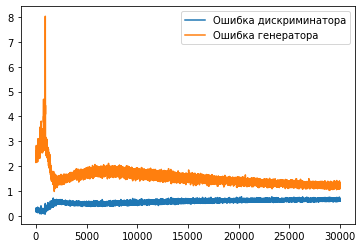

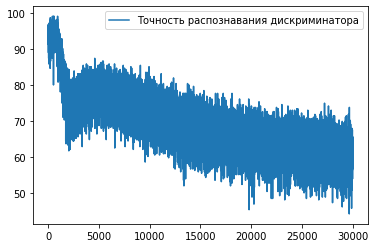

In [ ]:
# Запускаем функцию GAN с параметрами, generator, discriminator (30000 - количество эпох)

GAN_algoritm (conv_gen,
              conv_disc,
              30000,
              batch_size=128)

Уже намного лучше! :)

Мы научились генерировать случайные цифры (без зашумления). Попадаются редкие примеры, где модель выдает некорректные варианты (но это совсем единичные случаи)

В следующем блоке мы научимся задавать условия для генератора (например, указать конкретную цифру, которую нужно сгенерировать)

**Содержание темы**

1. [Теория](https://colab.research.google.com/drive/1xt0WGrjMN_td_JidPfea-5C-411y_TJG?usp=sharing)

2. Практика 1

3. [Практика 2](https://colab.research.google.com/drive/1_Ww5DyQ2LU8BHWKq8txtwJ1cEN9sWmef?usp=sharing)

